<a href="https://colab.research.google.com/github/arpanbiswas52/MOBO_PhysicsBasedModels/blob/main/MOBO_AFI_paper_Supplements.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1>MOBO_AFI paper Supplements 

MOBO framework developed by **Arpan Biswas**

**Physics Based Numerical Model Examples**

Theoritical Model (2-4-6 KLGD for bulk PZO), proposed by -- **Anna N. Morozovska** and **Sergei V. Kalilin**  developed by -- **Eugene A. Eliseev** (in Mathematica) and **Arpan Biswas** (in Python)

In [ ]:
!pip install botorch
!pip install gpytorch
!pip install pymoo
!pip install atomai

     |████████████████████████████████| 475 kB 8.6 MB/s 
     |████████████████████████████████| 498 kB 14.3 MB/s 
     |████████████████████████████████| 3.7 MB 7.6 MB/s 
     |████████████████████████████████| 239 kB 44.6 MB/s 
  Created wheel for pymoo: filename=pymoo-0.4.2.2-cp37-cp37m-linux_x86_64.whl size=4940012 sha256=36b2ef9f123c5127abe3a5a65bf9fd589c9f39a2903e63859e39bb3ea8109e31
  Stored in directory: /root/.cache/pip/wheels/ab/8c/89/c450ad360fc24cb70fec0388e8d95b51021eae5dab248ab76e
Successfully built pymoo
     |████████████████████████████████| 143 kB 9.3 MB/s 
     |████████████████████████████████| 193 kB 16.5 MB/s 
     |████████████████████████████████| 865 kB 17.7 MB/s 
  Created wheel for mendeleev: filename=mendeleev-0.6.1-py2.py3-none-any.whl size=174981 sha256=1d59df0337ce972827890e7d1885549a28728a54c0b4575aa1342aacd3bffc9a
  Stored in directory: /root/.cache/pip/wheels/f4/4e/dd/06777c90710ce1766376ecc87979967fe69ff3affc29c0b530
Successfully built mendeleev


In [ ]:
import torch as to
import numpy as np
import gpytorch as gpt
import matplotlib.pyplot as plt
import random
import pandas as pd
import seaborn as sns; sns.set(style="ticks", color_codes=True)
import sympy as sym
import pymoo
import atomai as aoi

from botorch.models import SingleTaskGP, ModelListGP
from botorch.models.gpytorch import GPyTorchModel
from botorch.utils import standardize
from gpytorch.distributions import MultivariateNormal
from gpytorch.kernels import ScaleKernel, RBFKernel
from gpytorch.likelihoods import GaussianLikelihood
from gpytorch.means import ConstantMean
from gpytorch.mlls import ExactMarginalLogLikelihood
from botorch.acquisition import ExpectedImprovement
from botorch.sampling import IIDNormalSampler
from gpytorch.likelihoods.likelihood import Likelihood
from gpytorch.constraints import GreaterThan
from numpy import linalg as LA
from scipy import optimize
from scipy.signal import find_peaks
from sklearn.linear_model import LinearRegression
from botorch.generation import get_best_candidates, gen_candidates_torch
from botorch.optim import gen_batch_initial_conditions
from gpytorch.models import ExactGP
from mpl_toolkits.axes_grid1 import make_axes_locatable
from torch.optim import SGD
from torch.optim import Adam
from scipy.stats import norm
from botorch.utils.transforms import unnormalize
from botorch.utils.sampling import draw_sobol_samples
from botorch.optim.optimize import optimize_acqf, optimize_acqf_list
from botorch.acquisition.objective import GenericMCObjective
from botorch.utils.multi_objective.scalarization import get_chebyshev_scalarization
from botorch.utils.multi_objective.box_decompositions.non_dominated import NondominatedPartitioning
from botorch.acquisition.multi_objective.monte_carlo import qExpectedHypervolumeImprovement
from botorch.utils.sampling import sample_simplex
from botorch import fit_gpytorch_model
from botorch.acquisition.monte_carlo import qExpectedImprovement, qNoisyExpectedImprovement
from botorch.sampling.samplers import SobolQMCNormalSampler
from botorch.exceptions import BadInitialCandidatesWarning
from botorch.utils.multi_objective.pareto import is_non_dominated
from botorch.utils.multi_objective.hypervolume import Hypervolume
from matplotlib.cm import ScalarMappable

#matplotlib inline

import time
import warnings

<h1> GP and multi-objective acquistion functions

In [ ]:
class SimpleCustomGP(ExactGP, GPyTorchModel):
    _num_outputs = 1  # to inform GPyTorchModel API

    def __init__(self, train_X, train_Y):
        # squeeze output dim before passing train_Y to ExactGP
        super().__init__(train_X, train_Y.squeeze(-1), GaussianLikelihood())
        self.mean_module = ConstantMean()
        self.covar_module = ScaleKernel(
            base_kernel=RBFKernel(ard_num_dims=train_X.shape[-1]),
        )
        self.to(train_X)  # make sure we're on the right device/dtype

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return MultivariateNormal(mean_x, covar_x)


########## MOBO acquisition function ###########################
# q-Expected Improvement acquistion function ###########
def optimize_qehvi(model, train_X, train_obj, rf, BATCH_SIZE):
    """Optimizes the qEHVI acquisition function, and returns a new candidate and observation."""
    # partition non-dominated space into disjoint rectangles
    sampler = SobolQMCNormalSampler(num_samples=500, seed=0, resample=False)
    #BATCH_SIZE = 4
    partitioning = NondominatedPartitioning(ref_point=rf, Y=train_obj)
    acq_func = qExpectedHypervolumeImprovement(
        model=model,
        ref_point=rf.tolist(),  # use known reference point
        partitioning=partitioning,
        sampler=sampler,
    )
    # optimize
    new_x, value = optimize_acqf(
        acq_function=acq_func,
        bounds=to.tensor([[0.0] * 2, [1.0] * 2]),
        q=BATCH_SIZE,
        num_restarts=20,
        raw_samples=1000,  # used for intialization heuristic
        options={"batch_limit": 5, "maxiter": 200, "nonnegative": True},
        sequential=True,
    )


    return new_x, value

# q-PAREGO acquistion function ###########
def optimize_qparego(model, train_X, train_obj, BATCH_SIZE):
    """Samples a set of random weights for each candidate in the batch, performs sequential greedy optimization
    of the qParEGO acquisition function, and returns a new candidate and observation."""
    sampler = SobolQMCNormalSampler(num_samples=500, seed=0, resample=False)
    #BATCH_SIZE = 4
    acq_func_list = []
    for _ in range(BATCH_SIZE):
        n_obj = train_obj.dim()
        weights = sample_simplex(n_obj, **tkwargs).squeeze()
        objective = GenericMCObjective(get_chebyshev_scalarization(weights=weights, Y=train_obj))
        acq_func = qExpectedImprovement(  # pyre-ignore: [28]
            model=model,
            objective=objective,
            best_f=objective(train_obj).max(),
            sampler=sampler,
        )
        acq_func_list.append(acq_func)
    # optimize
    new_x, value = optimize_acqf_list(
        acq_function_list=acq_func_list,
        bounds=to.tensor([[0.0] * 2, [1.0] * 2]),
        num_restarts=20,
        raw_samples=1000,  # used for intialization heuristic
        options={"batch_limit": 5, "maxiter": 200},
    )


    return new_x, value


<h1> Optimize and train GP, calculate Posterior distribution

In [ ]:
def optimize_hyperparam_trainGP(train_X_norm, train_Y_norm):
    # Gp model fit

    gp_surro1 = SimpleCustomGP(train_X_norm, train_Y_norm[:, 0])
    gp_surro2 = SimpleCustomGP(train_X_norm, train_Y_norm[:, 1])
    gp_surro = ModelListGP(gp_surro1, gp_surro2)
    gp_surro = gp_surro.double()
    gp_surro.likelihood.likelihoods[0].noise_covar.register_constraint("raw_noise", GreaterThan(1e-1))
    gp_surro.likelihood.likelihoods[1].noise_covar.register_constraint("raw_noise", GreaterThan(1e-1))
    mll1 = ExactMarginalLogLikelihood(gp_surro.likelihood.likelihoods[0], gp_surro.models[0])
    mll2 = ExactMarginalLogLikelihood(gp_surro.likelihood.likelihoods[1], gp_surro.models[1])
    # fit_gpytorch_model(mll)
    mll1 = mll1.to(train_X_norm)
    mll2 = mll2.to(train_X_norm)
    gp_surro.models[0].train()
    gp_surro.likelihood.likelihoods[0].train()
    gp_surro.models[1].train()
    gp_surro.likelihood.likelihoods[1].train()

    optimizer1 = Adam([{'params': gp_surro.models[0].parameters()}], lr=0.2)
    optimizer2 = Adam([{'params': gp_surro.models[1].parameters()}], lr=0.2)

    NUM_EPOCHS = 150

    for epoch in range(NUM_EPOCHS):
        # clear gradients
        optimizer1.zero_grad()
        optimizer2.zero_grad()
        # forward pass through the model to obtain the output MultivariateNormal
        output1 = gp_surro.models[0](train_X_norm)
        output2 = gp_surro.models[1](train_X_norm)
        # Compute negative marginal log likelihood
        loss1 = - mll1(output1, gp_surro.models[0].train_targets)
        loss2 = - mll2(output2, gp_surro.models[1].train_targets)
        # back prop gradients
        loss1.backward(retain_graph=True)
        # back prop gradients
        loss2.backward(retain_graph=True)
        # print last iterations
        if (epoch + 1) > NUM_EPOCHS: #Stopping the print for now
            print("GP Model trained:")
            print("Iteration:" + str(epoch + 1))
            print("Loss for ob1:" + str(loss1.item()))
            print("Loss for ob2:" + str(loss2.item()))
            # print("Length Scale:" +str(gp_PZO.covar_module.base_kernel.lengthscale.item()))
            print("noise for obj1:" + str(gp_surro.likelihood.likelihoods[0].noise.item()))
            print("noise for obj2:" + str(gp_surro.likelihood.likelihoods[1].noise.item()))

        optimizer1.step()
        optimizer2.step()

    gp_surro.models[0].eval()
    gp_surro.likelihood.likelihoods[0].eval()
    gp_surro.models[1].eval()
    gp_surro.likelihood.likelihoods[1].eval()
    return gp_surro

#GP posterior prediction
def cal_posterior(gp_surro, testX1_norm, testX2_norm, t_y, num_rows):
    y_pred_means = to.empty(num_rows, num_rows, 2)
    y_pred_vars = to.empty(num_rows, num_rows, 2)
    for t1, (x1, x2, y1, y2) in enumerate(zip(testX1_norm, testX2_norm, t_y[:, :, 0], t_y[:, :, 1])):
        for t2, (xx1, xx2, yy1, yy2) in enumerate(zip(x1, x2, y1, y2)):

            if (xx1 == -1 and xx2 == -1):
                y_pred_means[t1, t2, 0] = yy1
                y_pred_vars[t1, t2, 0] = 1e-8
                y_pred_means[t1, t2, 1] = yy2
                y_pred_vars[t1, t2, 1] = 1e-8
            else:
                test_X = to.empty(1, 2)
                test_X[:, 0] = xx1
                test_X[:, 1] = xx2
                test_X = test_X.double()
                with to.no_grad(), gpt.settings.max_lanczos_quadrature_iterations(32), \
                     gpt.settings.fast_computations(covar_root_decomposition=False, log_prob=False,
                                                    solves=True), \
                     gpt.settings.max_cg_iterations(100), \
                     gpt.settings.max_preconditioner_size(80), \
                     gpt.settings.num_trace_samples(128):
                    y1_pred_surro, y2_pred_surro = gp_surro.models[0].posterior(test_X), gp_surro.models[1].posterior(test_X)
                    y_pred_means[t1, t2, 0] = y1_pred_surro.mean
                    y_pred_vars[t1, t2, 0] = y1_pred_surro.variance
                    y_pred_means[t1, t2, 1] = y2_pred_surro.mean
                    y_pred_vars[t1, t2, 1] = y2_pred_surro.variance

    return y_pred_means, y_pred_vars

Plots for Predicted Phase diagrams and Pareto Solutions

In [ ]:
def plot_exploration_results(X1, X2, Gp_y_mu, Gp_y_var, train_X, train_Y, iter, param1, param2, obj1, obj2, problem):
    if (problem[0]=='min'): #Transform to original function value
        Gp_y_mu[:, :, 0] = -Gp_y_mu[:, :, 0]
        train_Y[:,0] = -train_Y[:,0]
    if (problem[1]=='min'): #Transform to original function value
        Gp_y_mu[:, :, 1] = -Gp_y_mu[:, :, 1]
        train_Y[:,1] = -train_Y[:,1]

    _, ax = plt.subplots(3, 2, figsize=(12, 15))
    ax[0, 0].imshow(X1, origin='bottom', cmap='gist_stern')
    ax[0, 1].imshow(X2, origin='bottom', cmap='gist_stern')
    ax[1, 0].imshow(Gp_y_mu[:, :, 0].detach().numpy(), origin='bottom', cmap='gist_stern')
    ax[1, 1].imshow(Gp_y_var[:, :, 0].detach().numpy(), origin='bottom', cmap='gist_stern')
    ax[2, 0].imshow(Gp_y_mu[:, :, 1].detach().numpy(), origin='bottom', cmap='gist_stern')
    ax[2, 1].imshow(Gp_y_var[:, :, 1].detach().numpy(), origin='bottom', cmap='gist_stern')
    ax[0, 0].set_title(str(param1))
    ax[0, 1].set_title(str(param2))
    ax[1, 0].set_title(str(obj1)+" (GP), iter=" + str(iter))
    ax[1, 1].set_title("Uncertainty, iter=" + str(iter))
    ax[2, 0].set_title(str(obj2)+" (GP), iter=" + str(iter))
    ax[2, 1].set_title("Uncertainty, iter=" + str(iter))
    plt.show()
    # plt.colorbar()

    #train_X = train_X.detach().numpy()
    #train_Y = train_Y.detach().numpy()
    fig1, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 8))
    ax[0].scatter(train_X[:, 0], train_X[:, 1], c=train_Y[:,0], cmap='viridis', linewidth=0.2)
    ax[0].set_xlabel(str(param1))
    ax[0].set_ylabel(str(param2))
    ax[0].set_title(str(obj1)+" (cmap), iter=" + str(iter))
    ax[1].scatter(train_X[:, 0], train_X[:, 1], c=train_Y[:,1], cmap='viridis', linewidth=0.2)
    ax[1].set_xlabel(str(param1))
    #ax[1].set_ylabel(str(param2))
    ax[1].set_title(str(obj2)+" (cmap), iter=" + str(iter))
    plt.show()

    #Retransforming for the optimization problem
    if (problem[0]=='min'): #Transform to original function value
        Gp_y_mu[:, :, 0] = -Gp_y_mu[:, :, 0]
        train_Y[:,0] = -train_Y[:,0]
    if (problem[1]=='min'): #Transform to original function value
        Gp_y_mu[:, :, 1] = -Gp_y_mu[:, :, 1]
        train_Y[:,1] = -train_Y[:,1]
    

def plotPareto(pareto_y, pareto_y_norm, pareto_x, pareto_x_norm, train_Y, train_Y_norm, train_X, train_X_norm, n_initial, N_BO, BATCH_SIZE, param1, param2, obj1, obj2, problem):
    if (problem[0]=='min'): #Transform to original function value
        train_Y[:,0] = -train_Y[:,0]
        train_Y_norm[:,0] = -train_Y_norm[:,0]
        pareto_y[:,0] = -pareto_y[:,0]
        pareto_y_norm[:,0] = -pareto_y_norm[:,0]
    if (problem[1]=='min'): #Transform to original function value
        train_Y[:,1] = -train_Y[:,1]
        train_Y_norm[:, 1] = -train_Y_norm[:, 1]
        pareto_y[:,1] = -pareto_y[:,1]
        pareto_y_norm[:,1] = -pareto_y_norm[:,1]
    batch_number = to.cat([to.zeros(n_initial), to.arange(1, N_BO + 1).repeat(BATCH_SIZE, 1).t().reshape(-1)]).numpy()
    fig, axes = plt.subplots(2, 2, figsize=(12, 12))
    axes[0,0].scatter(train_Y_norm[:, 0], train_Y_norm[:, 1], c= batch_number, cmap='viridis',linewidth=0.2)
    axes[0,0].set_xlabel(str(obj1))
    axes[0,0].set_ylabel(str(obj2))
    axes[0,0].set_title('Samples over (normalized)objective space, iter=' + str(N_BO + 1))
    axes[0,1].scatter(train_Y[:, 0], train_Y[:, 1], c= batch_number, cmap='viridis',linewidth=0.2)
    axes[0,1].set_xlabel(str(obj1))
    #axes[0,1].set_ylabel(str(obj2))
    axes[0,1].set_title('Samples over (real)objective space, iter=' + str(N_BO + 1))
    axes[1,0].scatter(pareto_y_norm[:, 0], pareto_y_norm[:, 1], c= pareto_y_norm[:, 0], cmap='gist_rainbow',linewidth=0.2)
    axes[1,0].set_xlabel(str(obj1))
    axes[1,0].set_ylabel(str(obj2))
    axes[1,0].set_title('Pareto frontier over (normalized)objective space, iter=' + str(N_BO + 1))
    axes[1,1].scatter(pareto_y[:, 0], pareto_y[:, 1], c= pareto_y_norm[:, 0], cmap='gist_rainbow',linewidth=0.2)
    axes[1,1].set_xlabel(str(obj1))
    #axes[1,1].set_ylabel(str(obj2))
    axes[1,1].set_title('Pareto frontier over (real)objective space, iter=' + str(N_BO + 1))


    fig, axes = plt.subplots(2, 2, figsize=(12, 12))
    axes[0,0].scatter(train_X_norm[:, 0], train_X_norm[:, 1], c= batch_number, cmap='viridis',linewidth=0.2)
    axes[0,0].set_xlabel(str(param1))
    axes[0,0].set_ylabel(str(param2))
    axes[0,0].set_title('Samples over over (normalized)parameter space, iter=' + str(N_BO + 1))
    axes[0,1].scatter(train_X[:, 0], train_X[:, 1], c= batch_number, cmap='viridis',linewidth=0.2)
    axes[0,1].set_xlabel(str(param1))
    #axes[0,1].set_ylabel(str(param2))
    axes[0,1].set_title('Samples over over (real)parameter space, iter=' + str(N_BO + 1))
    axes[1,0].scatter(pareto_x_norm[:, 0], pareto_x_norm[:, 1], c= pareto_y_norm[:, 0], cmap='gist_rainbow',linewidth=0.2)
    axes[1,0].set_xlabel(str(param1))
    axes[1,0].set_ylabel(str(param2))
    axes[1,0].set_title('Pareto frontier over (normalized)parameter space, iter=' + str(N_BO + 1))
    axes[1,1].scatter(pareto_x[:, 0], pareto_x[:, 1], c= pareto_y_norm[:, 0], cmap='gist_rainbow',linewidth=0.2)
    axes[1,1].set_xlabel(str(param1))
    #axes[1,1].set_ylabel(str(param2))
    axes[1,1].set_title('Pareto frontier over (real)parameter space, iter=' + str(N_BO + 1))

    #Retransforming for the optimization problem
    if (problem[0]=='min'): #Transform to original function value
        train_Y[:,0] = -train_Y[:,0]
        train_Y_norm[:,0] = -train_Y_norm[:,0]
        pareto_y[:,0] = -pareto_y[:,0]
        pareto_y_norm[:,0] = -pareto_y_norm[:,0]
    if (problem[1]=='min'): #Transform to original function value
        train_Y[:,1] = -train_Y[:,1]
        train_Y_norm[:, 1] = -train_Y_norm[:, 1]
        pareto_y[:,1] = -pareto_y[:,1]
        pareto_y_norm[:,1] = -pareto_y_norm[:,1]

    plt.show()

<h1> MOBO framework (2D case - 2 objectives)

Test problems- ZDT1, Six hump Camel back- Inversed Ackley's Path function



In [ ]:
##Toy model 1## - ZDT1

def ZDT1(x1, x2):
    f1 = x1
    g = 1 + 9*x2
    f2 = 1- np.sqrt(f1/g)
    return f1, f2

##Toy model 2## - 6-hump Camel back- Inversed Ackley's path
def Sixhump_Camelback_inverse_Ackley(x1, x2):
    a = 20
    b = 0.2
    c = 2*np.pi
    f1 = (4 - 2.1*x1**2 +(x1**4)/3)*x1**2 + x1*x2 + (-4 + 4*x2**2)*x2**2
    f2 = a*np.exp(-b*np.sqrt((x1**2 + x2**2)/2)) + np.exp((np.cos(c*x1) + np.cos(c*x2))/2) -a -np.exp(1)
    return f1, f2


def normalize_get_initialdata_testfunc(X1, X2, test_X1, test_X2, num_rows, num, problem, testfunction, m):
    # Normalize X
    minX1 = min(X1)
    maxX1 = max(X1)
    minX2 = min(X2)
    maxX2 = max(X2)
    Xmin = np.hstack((minX1, minX2))
    Xmax = np.hstack((maxX1, maxX2))
    X1, X2 = np.meshgrid(X1, X2)
    test_X1, test_X2 = np.meshgrid(test_X1, test_X2)
    X1_norm = (X1 - Xmin[0]) / (Xmax[0] - Xmin[0])
    X2_norm = (X2 - Xmin[1]) / (Xmax[1] - Xmin[1])
    testX1_norm = (test_X1 - Xmin[0]) / (Xmax[0] - Xmin[0])
    testX2_norm = (test_X2 - Xmin[1]) / (Xmax[1] - Xmin[1])

    # Select starting samples randomly as training data
    testX1_norm = np.reshape(testX1_norm, (num_rows ** 2, 1))
    testX2_norm = np.reshape(testX2_norm, (num_rows ** 2, 1))
    test_X1 = np.reshape(test_X1, (num_rows ** 2, 1))
    test_X2 = np.reshape(test_X2, (num_rows ** 2, 1))
    np.random.seed(10)
    ind_start = np.random.choice(len(testX1_norm) - 1, size=num, replace=False)
    train_X = np.zeros((num, 2))
    train_X_norm = np.zeros((num, 2))
    train_y = np.zeros((num, 2))
    t_y = np.zeros((num_rows ** 2, 2))
    m = 0
    print("Function evaluaton for initial randomly selected samples")
    for i in range(0, num):
        train_X_norm[i, 0] = testX1_norm[ind_start[i]]
        train_X_norm[i, 1] = testX2_norm[ind_start[i]]
        train_X[i, 0] = test_X1[ind_start[i]]
        train_X[i, 1] = test_X2[ind_start[i]]
        print("Function eval #" + str(m + 1))
        if (testfunction == 'ZDT1'):
            f1, f2 = ZDT1(train_X[i, 0], train_X[i, 1])
        elif (testfunction == '6HC-IAP'):
            f1, f2 = Sixhump_Camelback_inverse_Ackley(train_X[i, 0], train_X[i, 1])
        else:
            print("Invalid test functions")

        if (problem[0] == 'min'):
            train_y[i, 0] = -f1  # By default, BO settting is for maximization, for minimization we just use f(x) =-f(x)
            t_y[ind_start[i], 0] = -f1  # By default, BO settting is for maximization, for minimization we just use f(x) =-f(x)
        else:
            train_y[i, 0] = f1
            t_y[ind_start[i], 0] = f1

        if (problem[1] == 'min'):
            train_y[i, 1] = -f2  # By default, BO settting is for maximization, for minimization we just use f(x) =-f(x)
            t_y[ind_start[i], 1] = -f2  # By default, BO settting is for maximization, for minimization we just use f(x) =-f(x)
        else:
            train_y[i, 1] = f2
            t_y[ind_start[i], 1] = f2

        # testX1_norm[ind_start[i]] =-1
        # testX2_norm[ind_start[i]] =-1
        m = m + 1

    testX1_norm = np.reshape(testX1_norm, (num_rows, num_rows))
    testX2_norm = np.reshape(testX2_norm, (num_rows, num_rows))
    t_y = np.reshape(t_y, (num_rows, num_rows, 2))

    # Convert to torch
    train_X_norm = to.from_numpy(train_X_norm)
    train_X_norm = train_X_norm.double()
    train_Y = to.from_numpy(train_y)
    # Normalize Y
    testY1_norm = (train_Y[:, 0] - train_Y[:, 0].min()) / (train_Y[:, 0].max() - train_Y[:, 0].min())
    testY2_norm = (train_Y[:, 1] - train_Y[:, 1].min()) / (train_Y[:, 1].max() - train_Y[:, 1].min())
    train_Y_norm = to.empty(train_Y.__len__(), 2)
    train_Y_norm[:, 0] = testY1_norm
    train_Y_norm[:, 1] = testY2_norm

    return X1_norm, X2_norm, testX1_norm, testX2_norm, train_X, train_X_norm, train_Y, train_Y_norm, Xmin, Xmax, t_y, m

def augment_newdata_testfunc(acq_X, train_X, train_X_norm, train_Y, Xmin, Xmax, BATCH_SIZE, num_rows, problem, testfunction, m):
    nextX_norm = acq_X
    nextX = nextX_norm * (to.from_numpy(Xmax) - to.from_numpy(Xmin)) + to.from_numpy(Xmin)
    nextX = nextX.detach().numpy()
    train_X_norm = to.cat((train_X_norm, nextX_norm), 0)
    train_X_norm = train_X_norm.double()
    train_X = np.vstack((train_X, nextX))
    next_feval = to.empty(BATCH_SIZE, 2)
    print("Batch Function eval #" + str(m + 1))

    for j in range(0, BATCH_SIZE):
        # Function evaluation for new data
        print("Within batch: Function eval: " + str(j + 1) + " of " + str(BATCH_SIZE))
        if (testfunction == 'ZDT1'):
            f1, f2 = ZDT1(nextX[j, 0], nextX[j, 1])
        elif (testfunction == '6HC-IAP'):
            f1, f2 = Sixhump_Camelback_inverse_Ackley(nextX[j, 0], nextX[j, 1])
        else:
            print("Invalid test function")

        if (problem[0] == 'min'):
            next_feval[j, 0] = -f1
        else:
            next_feval[j, 0] = f1
        if (problem[1] == 'min'):
            next_feval[j, 1] = -f2
        else:
            next_feval[j, 1] = f2

    train_Y = to.cat((train_Y, next_feval), 0)
    # Normalize Y
    testY1_norm = (train_Y[:, 0] - train_Y[:, 0].min()) / (train_Y[:, 0].max() - train_Y[:, 0].min())
    testY2_norm = (train_Y[:, 1] - train_Y[:, 1].min()) / (train_Y[:, 1].max() - train_Y[:, 1].min())
    train_Y_norm = to.empty(train_Y.__len__(), 2)
    train_Y_norm[:, 0] = testY1_norm
    train_Y_norm[:, 1] = testY2_norm
    m = m + 1
    return train_X, train_X_norm, train_Y, train_Y_norm, m

In [ ]:
def MOBO_testfunc(X1, X2, test_X1, test_X2, num_rows, N, BATCH_SIZE, param1, param2, obj1, obj2, acquisition, problem, testfunction):
        ##MOBO framework#######
    m=0
    X1_norm, X2_norm, testX1_norm, testX2_norm, train_X, train_X_norm, train_Y, train_Y_norm, Xmin, Xmax, t_y, m=\
        normalize_get_initialdata_testfunc(X1, X2, test_X1, test_X2, num_rows, num, problem, testfunction, m)

    X1, X2 = np.meshgrid(X1, X2)
    test_X1, test_X2 = np.meshgrid(test_X1, test_X2)

    print("Initial evaluation complete. Start BO- acq func: " +str(acquisition))
    # Gp model fit
    gp_surro= optimize_hyperparam_trainGP(train_X_norm, train_Y_norm)

    # compute pareto front
    pareto_mask_norm = is_non_dominated(train_Y_norm)
    pareto_y_norm = train_Y_norm[pareto_mask_norm]
    pareto_x_norm = train_X_norm[pareto_mask_norm]
    pareto_mask = is_non_dominated(train_Y)
    pareto_x = train_X[pareto_mask]
    pareto_y = train_Y[pareto_mask]
    # compute hypervolume
    hvs = []
    rf= to.tensor([0.0] * 2)-0.001
    hv = Hypervolume(ref_point=rf)
    volume = hv.compute(pareto_y_norm)
    hvs.append(volume)


    for i in range(1, N + 1):

        if (i == 1 or i == 10 or i == 20 or i == 30 or i == 40 or i == 90 or i == 140 or i == 190 or i == 240):
            #Calculate posterior for analysis for intermidiate iterations
            y_pred_means, y_pred_vars = cal_posterior(gp_surro, testX1_norm, testX2_norm, t_y, num_rows)
            plot_exploration_results(X1, X2, y_pred_means, y_pred_vars, train_X, train_Y, i, param1, param2, obj1, obj2, problem)
            plotPareto(pareto_y, pareto_y_norm, pareto_x, pareto_x_norm, train_Y, train_Y_norm, train_X, train_X_norm, num, i-1, BATCH_SIZE, param1, param2, obj1, obj2, problem)

        # List of acquisition functions as per user choice- functions from BOtorch packages
        if (acquisition == 'qEHVI'):

            acq_X, acq_val = optimize_qehvi(gp_surro, train_X_norm, train_Y_norm, rf, BATCH_SIZE)
            val = to.mean(acq_val)

        elif (acquisition == 'qParEGO'):

            acq_X, acq_val = optimize_qparego(gp_surro, train_X_norm, train_Y_norm, BATCH_SIZE)
            val = to.mean(acq_val)

    ################################################################
        ## Find next point which maximizes the learning through exploration
        if (i == 1):
            val_ini = val
        # Check for convergence
        if ((val) < 0):  # Stop for negligible expected improvement
            print("Model converged due to sufficient learning over search space ")
            break
        else:
            # Evaluate true function for new data, augment data
            train_X, train_X_norm, train_Y, train_Y_norm, m = augment_newdata_testfunc(acq_X, train_X, train_X_norm, train_Y, Xmin, Xmax, BATCH_SIZE, num_rows, problem, testfunction, m)

            #Update Pareto front, compute hypervolume
            # compute pareto front
            pareto_mask_norm = is_non_dominated(train_Y_norm)
            pareto_y_norm = train_Y_norm[pareto_mask_norm]
            pareto_x_norm = train_X_norm[pareto_mask_norm]
            pareto_mask = is_non_dominated(train_Y)
            pareto_x = train_X[pareto_mask]
            pareto_y = train_Y[pareto_mask]
            # compute hypervolume
            volume = hv.compute(pareto_y_norm)
            hvs.append(volume)

            # Updating GP model, conditioning on new data
            # Gp model fit
            gp_surro = optimize_hyperparam_trainGP(train_X_norm, train_Y_norm)


    ## Final posterior prediction after all the sampling done

    if (i == N):
        print("Max. sampling reached, model stopped")

    #Posterior calculation with converged GP model
    y_pred_means, y_pred_vars = cal_posterior(gp_surro, testX1_norm, testX2_norm, t_y, num_rows)
    plot_exploration_results(X1, X2, y_pred_means, y_pred_vars, train_X, train_Y, i, param1, param2, obj1, obj2, problem)


    # Plotting pareto frontier #

    # compute pareto front
    pareto_mask_norm = is_non_dominated(train_Y_norm)
    pareto_y_norm = train_Y_norm[pareto_mask_norm]
    pareto_x_norm = train_X_norm[pareto_mask_norm]
    pareto_mask = is_non_dominated(train_Y)
    pareto_x = train_X[pareto_mask]
    pareto_y = train_Y[pareto_mask]
    if (i == N):
        plotPareto(pareto_y, pareto_y_norm, pareto_x, pareto_x_norm, train_Y, train_Y_norm, train_X, train_X_norm, num, N, BATCH_SIZE, param1, param2, obj1, obj2, problem)
    else:
        plotPareto(pareto_y, pareto_y_norm, pareto_x, pareto_x_norm, train_Y, train_Y_norm, train_X, train_X_norm, num, i-1, BATCH_SIZE, param1, param2, obj1, obj2, problem)
    # plot hypervolume
    #volume = hv.compute(pareto_y_norm)
    #hvs.append(volume)
    plt.plot(hvs)
    plt.ylabel("Hypervolume")
    plt.show()

    print(val_ini)
    print(val)

    #Compare with Pareto solutions using NGSA2 (this is only for test purpose- not a part of MOBO framework)
    print("Run NSGA 2 for test function-- Without MOBO")
    from pymoo.algorithms.nsga2 import NSGA2
    from pymoo.model.problem import Problem
    from pymoo.optimize import minimize
    from pymoo.visualization.scatter import Scatter


    if (testfunction == 'ZDT1'):
        class MyProblem(Problem):

            def __init__(self):
                super().__init__(n_var=2,
                                n_obj=2,
                                n_constr=0,
                                xl=np.array([0, 0]),
                                xu=np.array([1, 1]),
                                elementwise_evaluation=True)

            def _evaluate(self, x, out, *args, **kwargs):

                x1 = x[0]
                x2 = x[1]

                # ZDT1
                f1 = x1
                g = 1 + 9 * x2
                f2 = 1 - np.sqrt(f1 / g)

                #Transform to minimization problem
                f1 = -f1
                f2 = -f2
                out["F"] = [f1, f2]
                #out["G"] = [g1, g2]
    elif (testfunction == '6HC-IAP'):

        class MyProblem(Problem):

            def __init__(self):
                super().__init__(n_var=2,
                                n_obj=2,
                                n_constr=0,
                                xl=np.array([-3, -2]),
                                xu=np.array([3, 2]),
                                elementwise_evaluation=True)

            def _evaluate(self, x, out, *args, **kwargs):

                x1 = x[0]
                x2 = x[1]

                #6-hump Camel back- Inversed Ackley's path
                a = 20
                b = 0.2
                c = 2 * np.pi
                f1 = (4 - 2.1 * x1 ** 2 + (x1 ** 4) / 3) * x1 ** 2 + x1 * x2 + (-4 + 4 * x2 ** 2) * x2 ** 2
                f2 = a * np.exp(-b * np.sqrt((x1 ** 2 + x2 ** 2) / 2)) + np.exp((np.cos(c * x1) + np.cos(c * x2)) / 2) - a - np.exp(1)
                #Transform to minimization problem
                f1 = -f1
                f2 = -f2

                out["F"] = [f1, f2]
                #out["G"] = [g1, g2]

    problem = MyProblem()

    algorithm1 = NSGA2(pop_size=100)
    algorithm2 = NSGA2(pop_size=15)

    res1 = minimize(problem,
                  algorithm1,
                  ("n_gen", 100),
                  verbose=True,
                  seed=1,
                  save_history=True)
    
    res2 = minimize(problem,
              algorithm2,
              ("n_gen", 15),
              verbose=True,
              seed=1,
              save_history=True)


    #plot = Scatter()
    #Transforming to true values for maximization problem
    res1.F = -res1.F
    res2.F = -res2.F
    #plot.add(res.F, color='red', label = 'NSGA2')
    #plot.add(pareto_y[:, 0], pareto_y[:, 1], color='green', label = str(acquisition))

    plt.scatter(res1.F[:, 0], res1.F[:, 1], color='red', label = 'NSGA2_10000eval')
    plt.scatter(pareto_y[:, 0], pareto_y[:, 1], color='green', label = str(acquisition))
    plt.scatter(res2.F[:, 0], res2.F[:, 1], color='blue', label = 'NSGA2_225eval')
    

    plt.xlabel("f1")
    plt.ylabel("f2")
   
    plt.legend(loc="best")
    plt.show()


<h1>User Inputs

**Provide BATCH_SIZE #** (default = 4)

**We include 2 acquistion functions-**
1. qEHVI 
2. qParEGO

**We have two test multi-objective functions**
1. 'ZDT1'
2. '6HC-IAP'- Six hump Camel back - Inversed Ackley's path

**We can switch the optimization problem for objective 1 and 2 individually-**
1. Maximization problem (Default setting in BO)
2. Minimization problem

Example: problem =['min','max'] means obj 1 and 2 will be minimized and maximized respectively

**Other user inputs-**
1. num_rows (define the image map density (num_rows X num_rows))
2. num (# of starting samples)
3. N (maximum BO iteration)

<h1> Analysis 1a

Test function- **ZDT1**, acquistion function - **qParEGO**, num_rows =50, num = 10, N= 50

Maximize f1, f2

Function evaluaton for initial randomly selected samples
Function eval #1
Function eval #2
Function eval #3
Function eval #4
Function eval #5
Function eval #6
Function eval #7
Function eval #8
Function eval #9
Function eval #10
Initial evaluation complete. Start BO- acq func: qParEGO


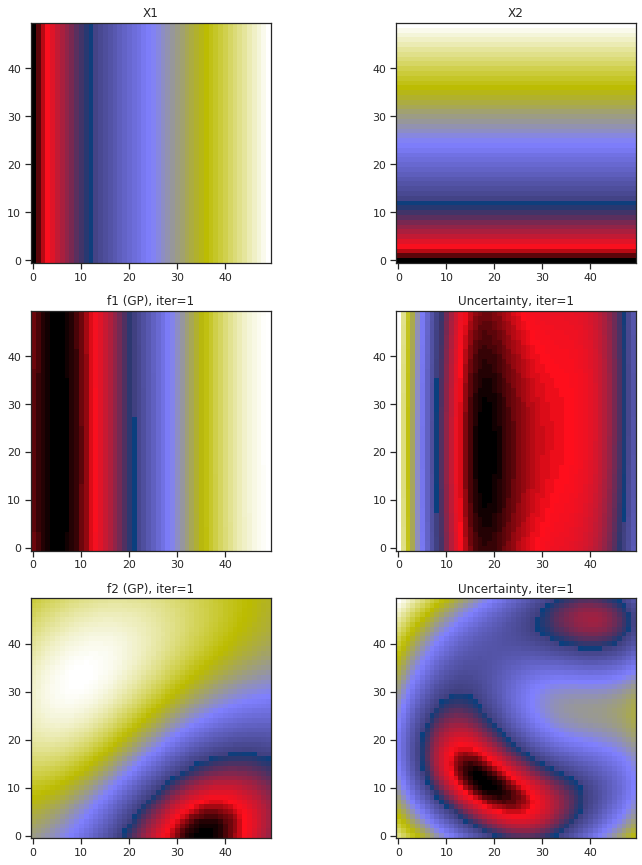

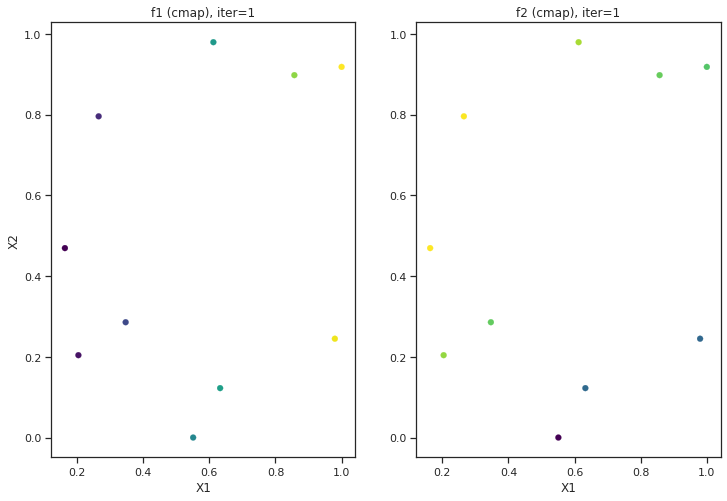

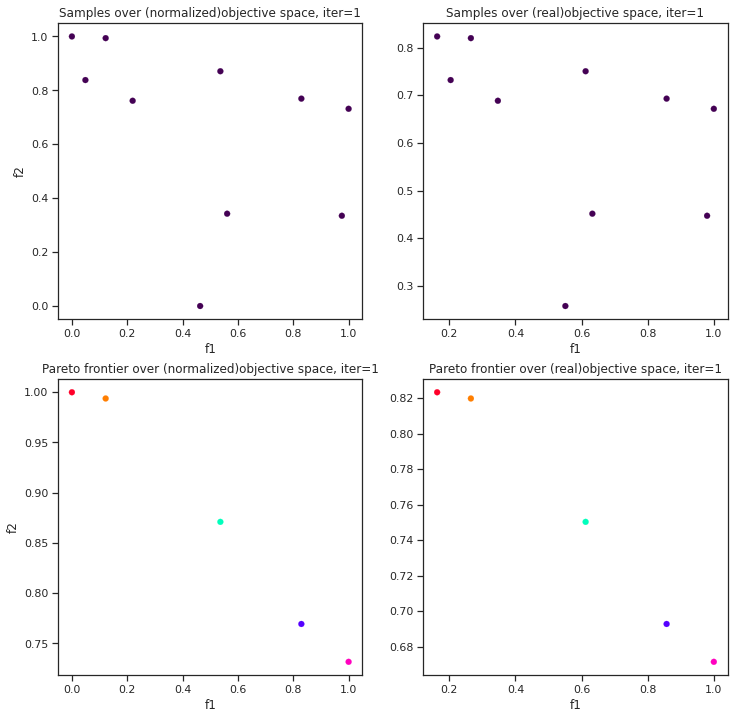

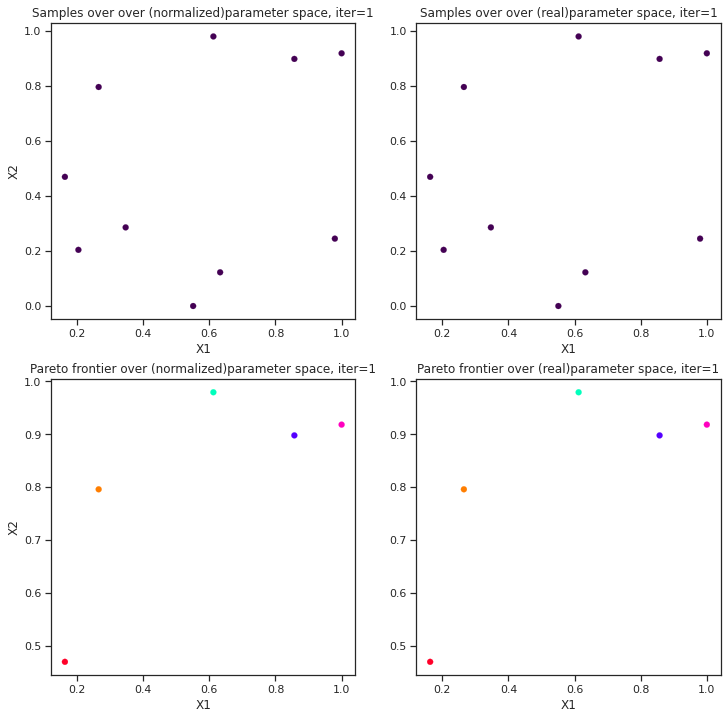

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #11
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #12
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #13
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #14
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #15
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #16
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #17
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #18
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #19
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


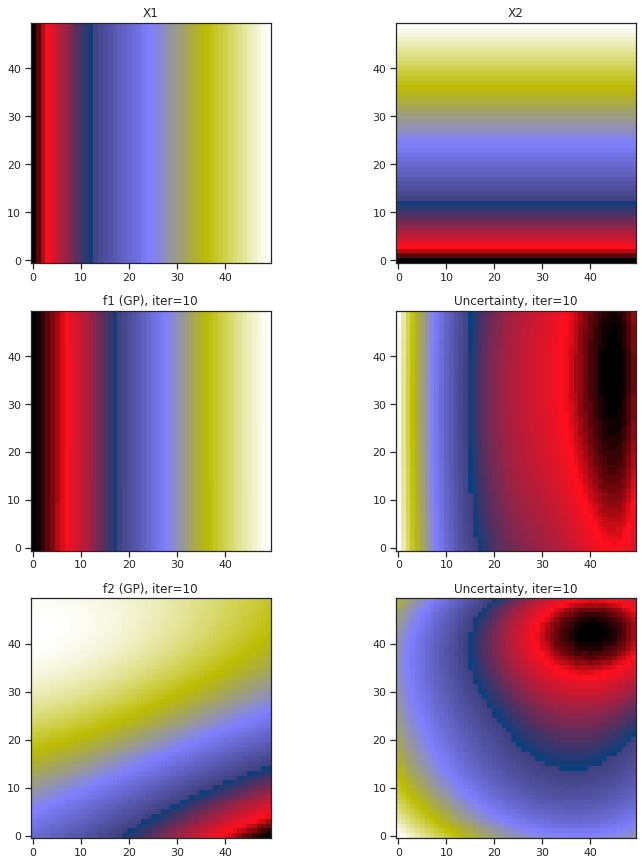

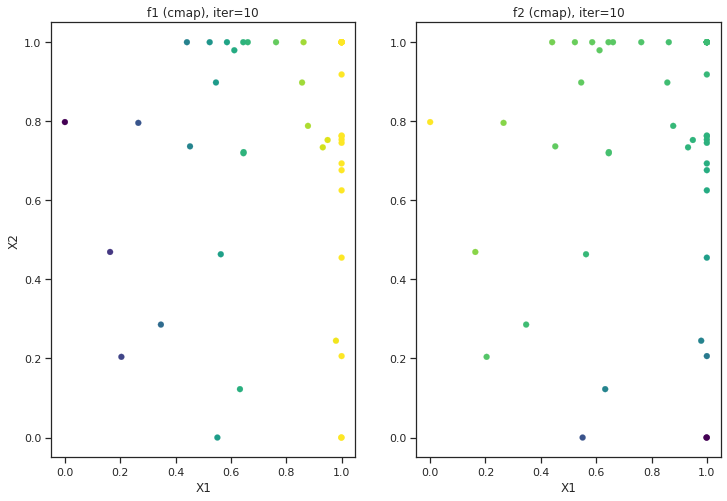

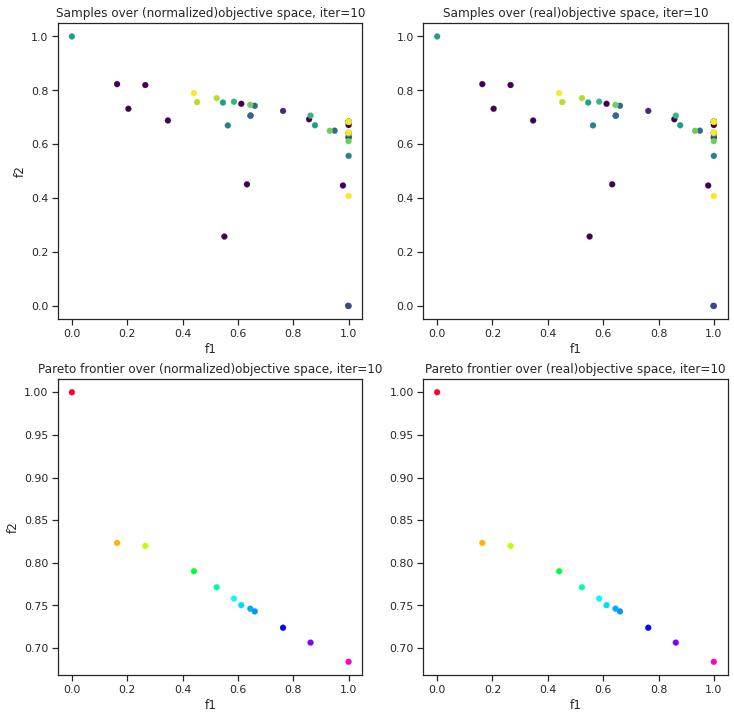

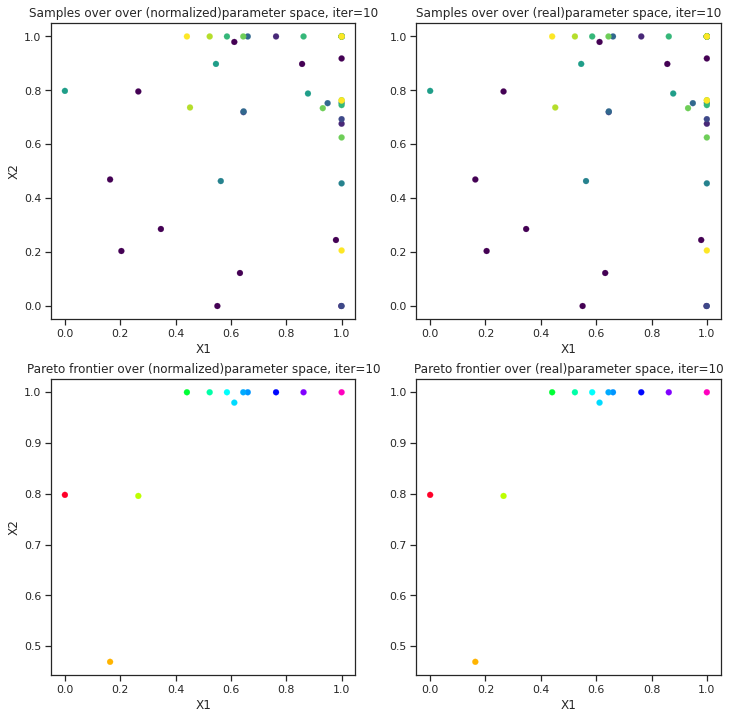

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #20
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #21
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #22
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #23
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #24
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #25
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #26
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #27
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #28
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #29
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


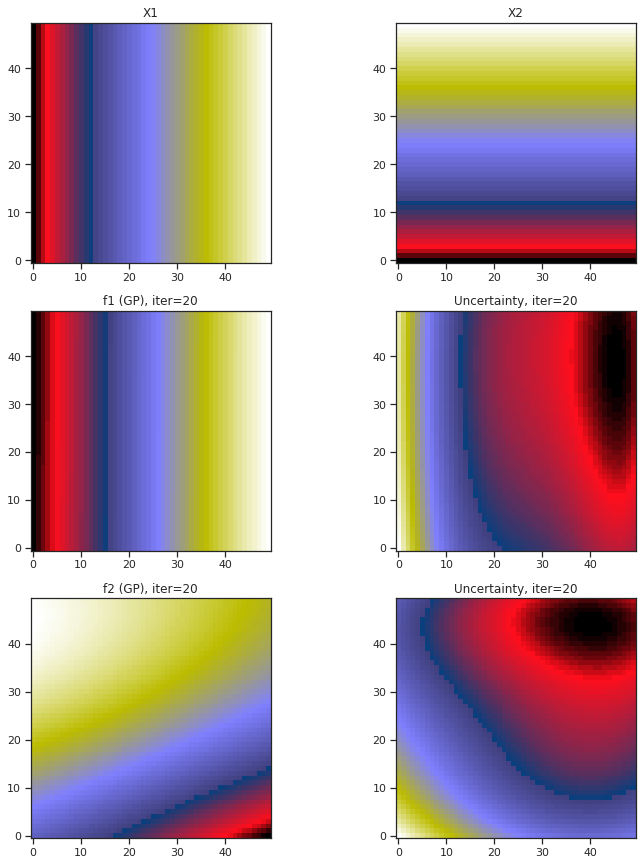

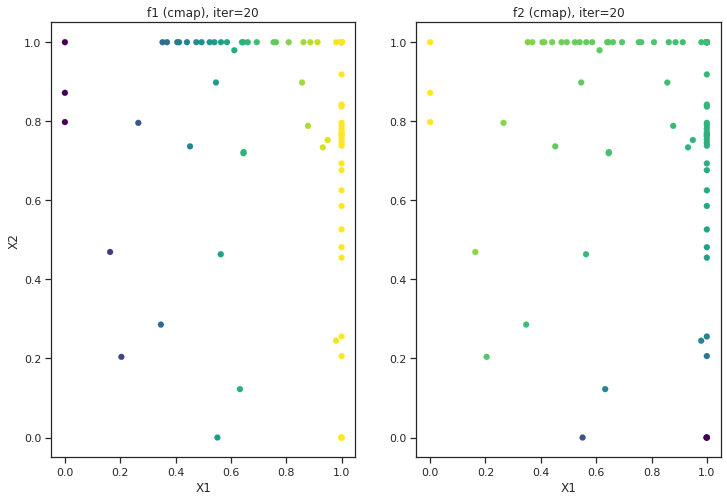

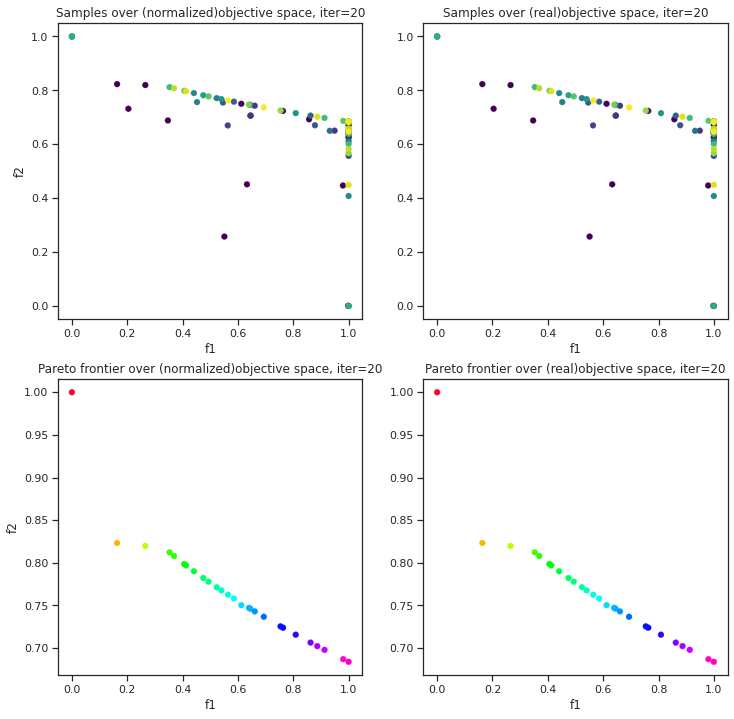

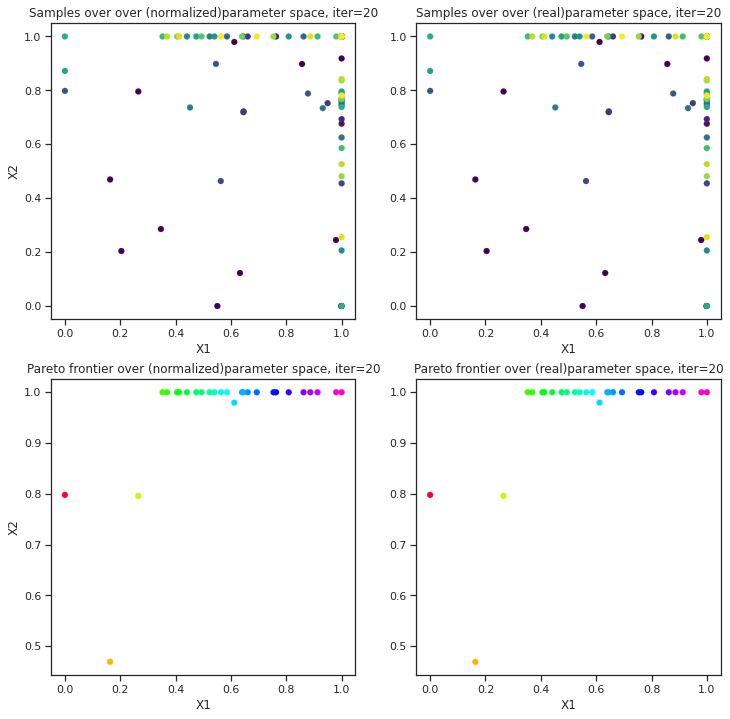

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #30
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #31
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #32
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #33
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #34
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #35
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #36
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #37
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval:

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #39
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


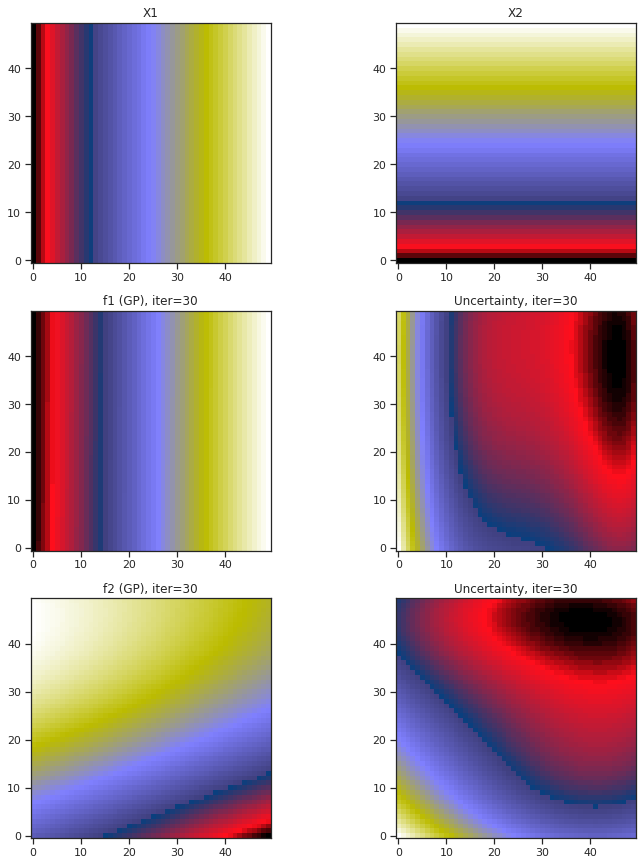

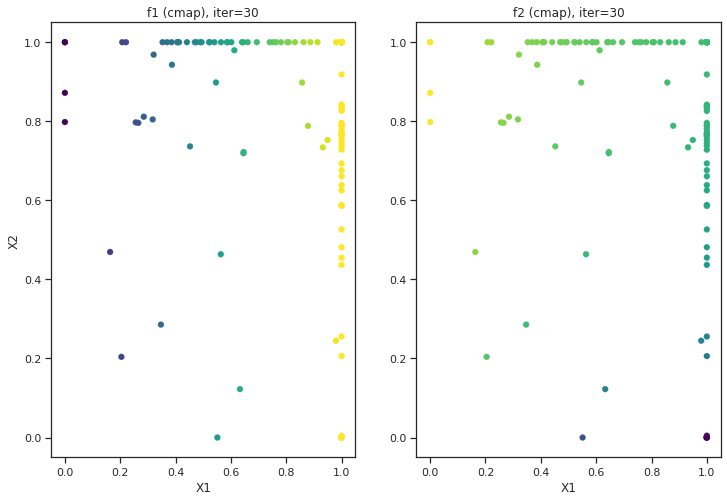

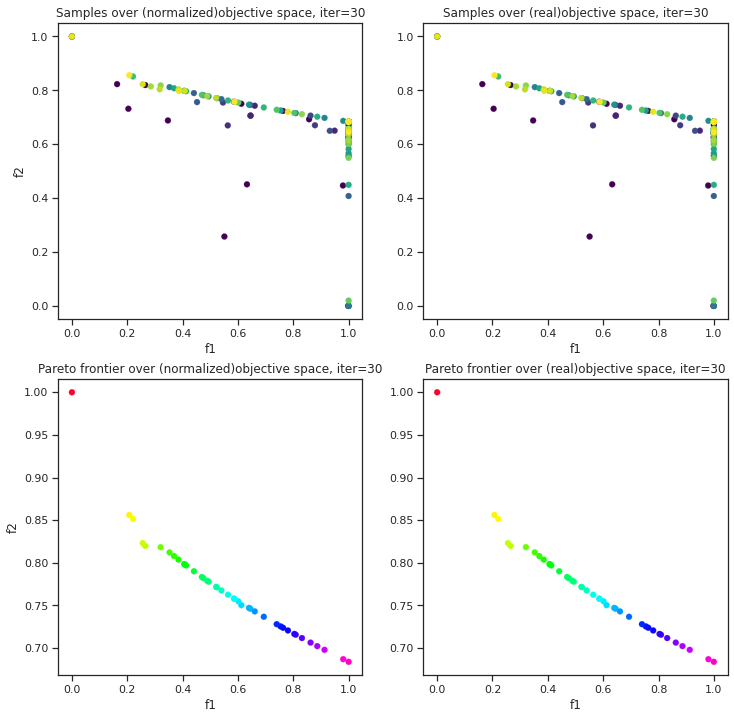

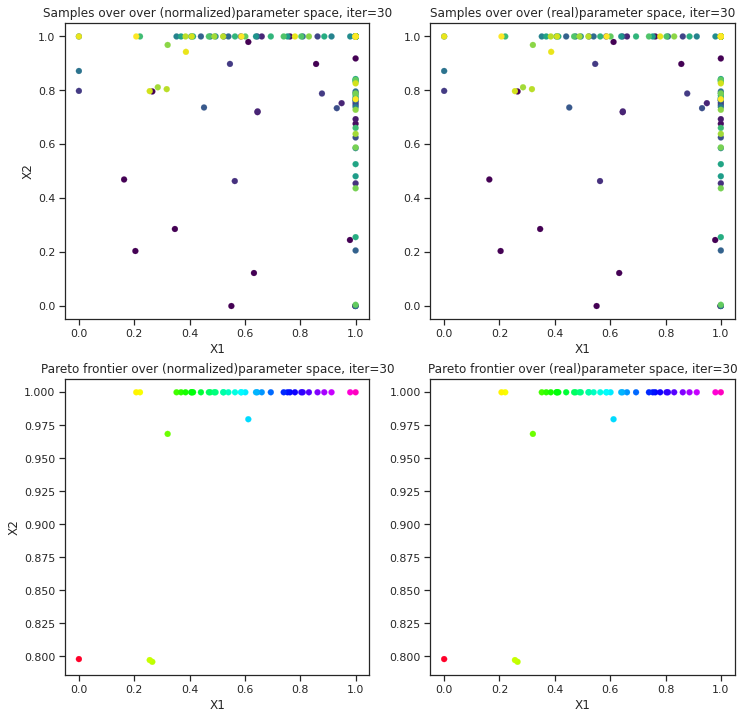

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #40
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #41
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #42
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #43
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #44
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #45
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #46
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #47
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #48
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #49
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


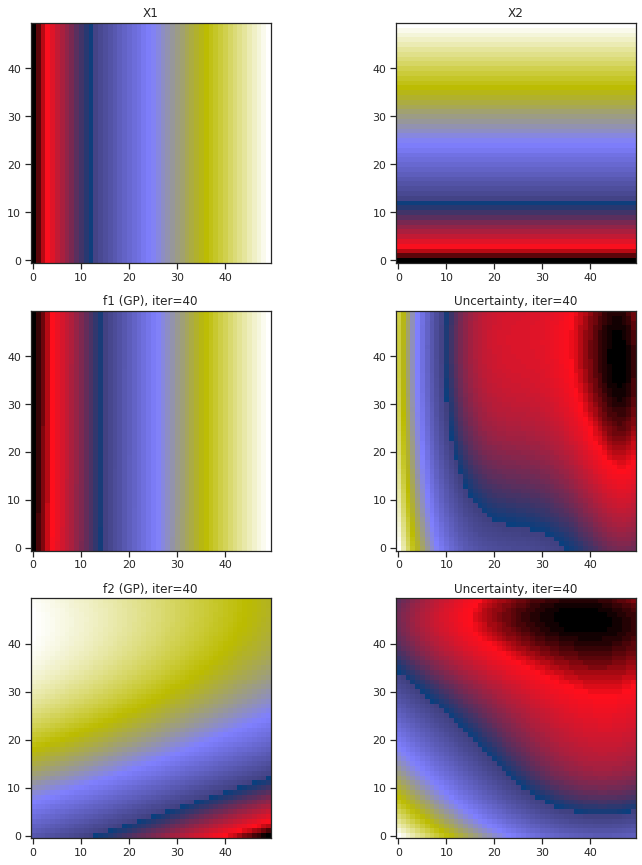

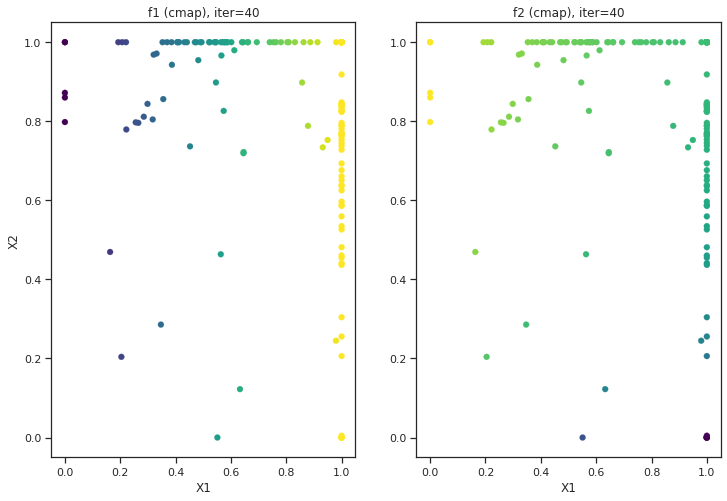

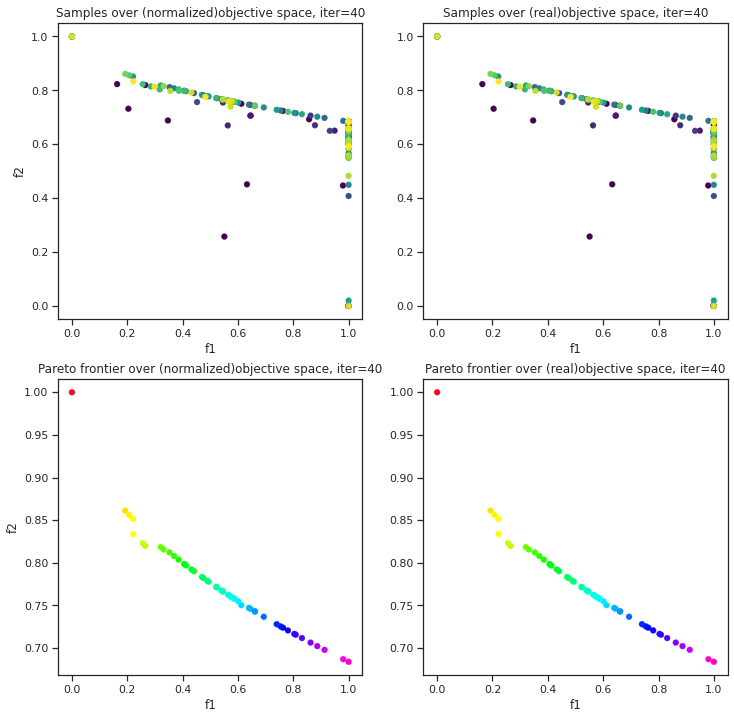

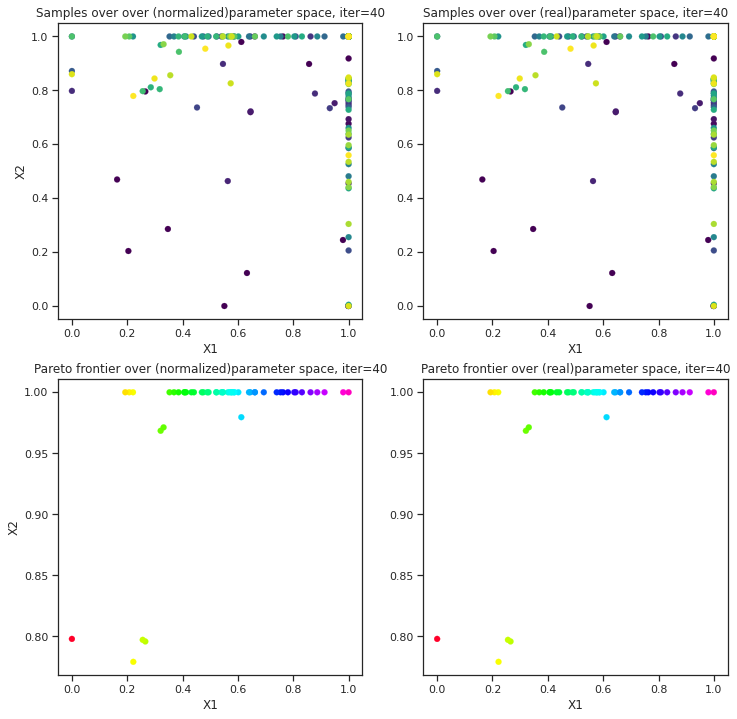

Batch Function eval #50
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #51
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #52
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #53
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #54
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #55
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #56
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #57
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #58
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #59
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #60
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Max. sampling reached, model stopped


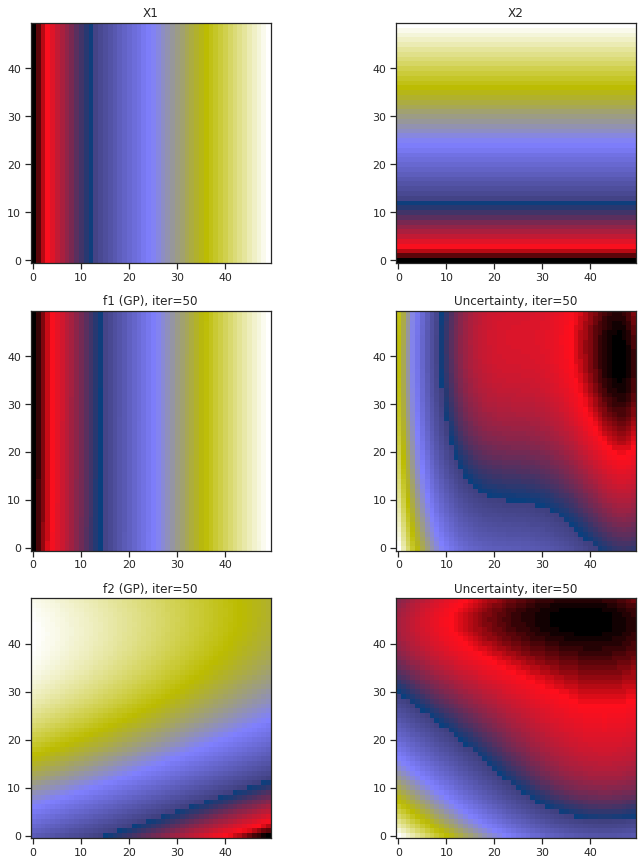

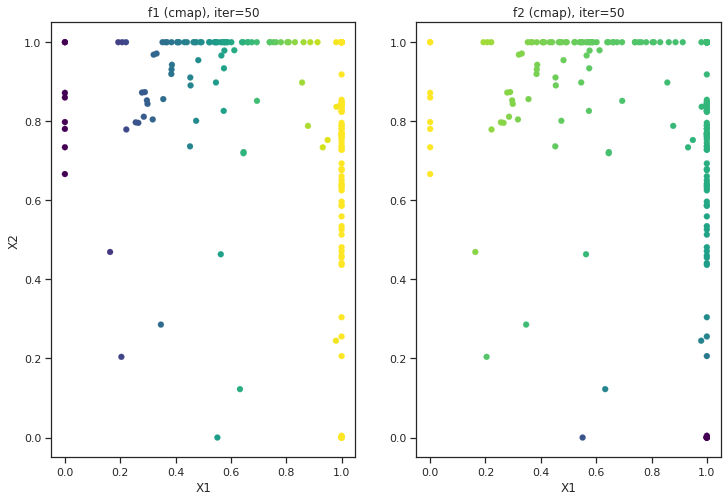

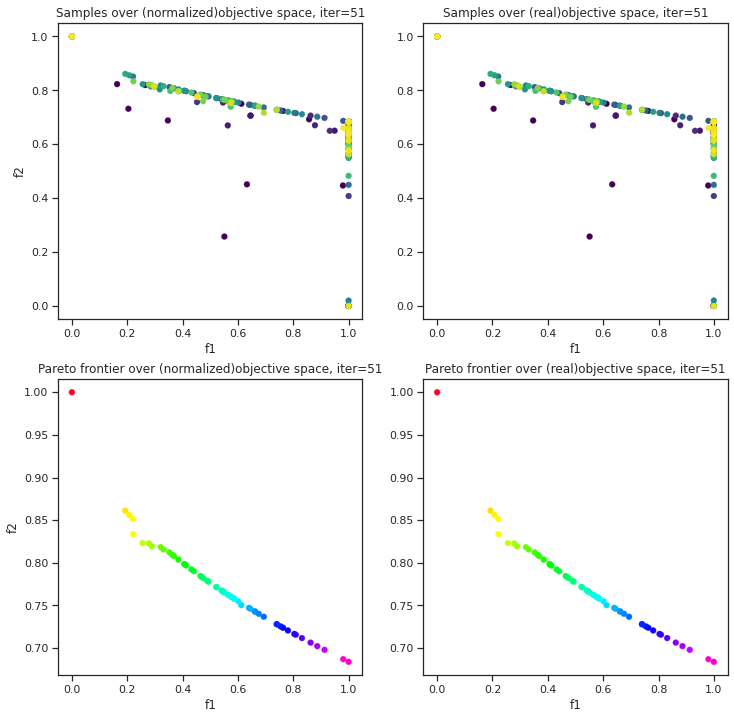

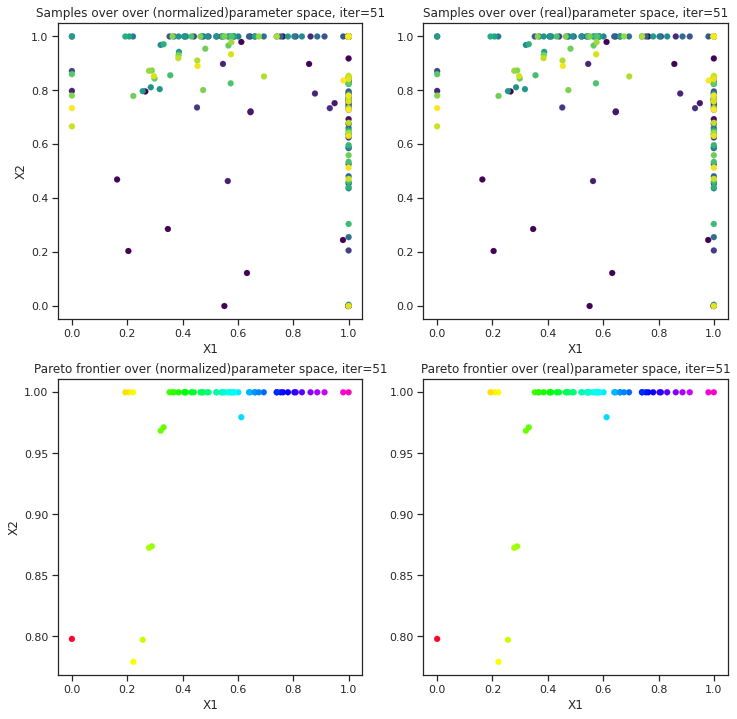

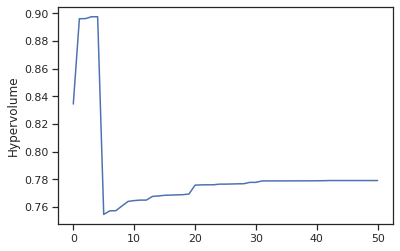

tensor(0.0042, dtype=torch.float64)
tensor(0.0033, dtype=torch.float64)
Run NSGA 2 for test function-- Without MOBO
n_gen |  n_eval |  n_nds  |     eps      |  indicator  
    1 |     100 |      23 |            - |            -
    2 |     200 |      27 |  0.107969634 |        nadir
    3 |     300 |      50 |  0.008406783 |            f
    4 |     400 |      79 |  0.008501667 |        ideal
    5 |     500 |     100 |  0.003794414 |        nadir
    6 |     600 |     100 |  0.003901667 |            f
    7 |     700 |     100 |  0.002164742 |            f
    8 |     800 |     100 |  0.002300958 |            f
    9 |     900 |     100 |  0.002034865 |            f
   10 |    1000 |     100 |  0.002201031 |            f
   11 |    1100 |     100 |  0.005970354 |        nadir
   12 |    1200 |     100 |  0.001558952 |            f
   13 |    1300 |     100 |  0.030812556 |        nadir
   14 |    1400 |     100 |  0.001602627 |            f
   15 |    1500 |     100 |  0.001488781 |  

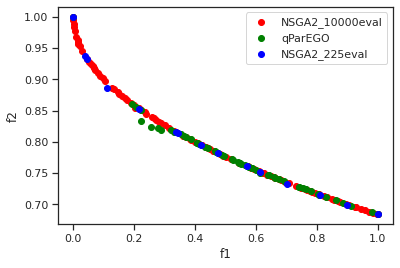

In [ ]:
tkwargs = {
    "dtype": to.double,
    "device": to.device("cuda" if to.cuda.is_available() else "cpu"),
}
BATCH_SIZE = 4

# List of options
# 'qEHVI'- Expected Hypervolume acquistion function
# 'qParEGO' -qParEGO
acquisition = 'qParEGO'

#List of control params- Temp, rho, h, deltaG
# Choose any two control params to create the parameter space considering the same order-
param1 = 'X1'
param2 = 'X2'
# Choose any two objectives to do MOO (MOBO)-
obj1 = 'f1'
obj2 = 'f2'

#List of toy test functions
# 'ZDT1'
# '6HC-IAP'- Six hump Camel back - Inversed Ackley's path
testfunction = 'ZDT1'

# Input choice of problem- where it is minimization or maximization for objective 1 and 2 respectively
# List of options
# 'min'- Minimization
# 'max' -Maximization (default setting)
problem =['max','max']

#Define parameter space based on above choice of params (2D only)
num_rows =50
num = 10  # Starting samples
#N = (0.1 * num_rows ** 2) - num  # Maximum evaluations
#N = int(N)
N=50

if (testfunction =='ZDT1'):
    X1 = np.linspace(0, 1, num_rows)
    test_X1 = np.linspace(0, 1, num_rows)
    X2 = np.linspace(0, 1, num_rows)
    test_X2 = np.linspace(0, 1, num_rows)
elif (testfunction =='6HC-IAP'):
    X1 = np.linspace(-3, 3, num_rows)
    test_X1 = np.linspace(-3, 3, num_rows)
    X2 = np.linspace(-2, 2, num_rows)
    test_X2 = np.linspace(-2, 2, num_rows)
else:
    print("Invalid test function")

MOBO_testfunc(X1, X2, test_X1, test_X2, num_rows, N, BATCH_SIZE, param1, param2, obj1, obj2, acquisition, problem, testfunction)

<h1> Analysis 1b

Test function- **ZDT1**, acquistion function - **qEHVI**, num_rows =50, num = 10, N= 50

Maximize f1, f2

Function evaluaton for initial randomly selected samples
Function eval #1
Function eval #2
Function eval #3
Function eval #4
Function eval #5
Function eval #6
Function eval #7
Function eval #8
Function eval #9
Function eval #10
Initial evaluation complete. Start BO- acq func: qEHVI


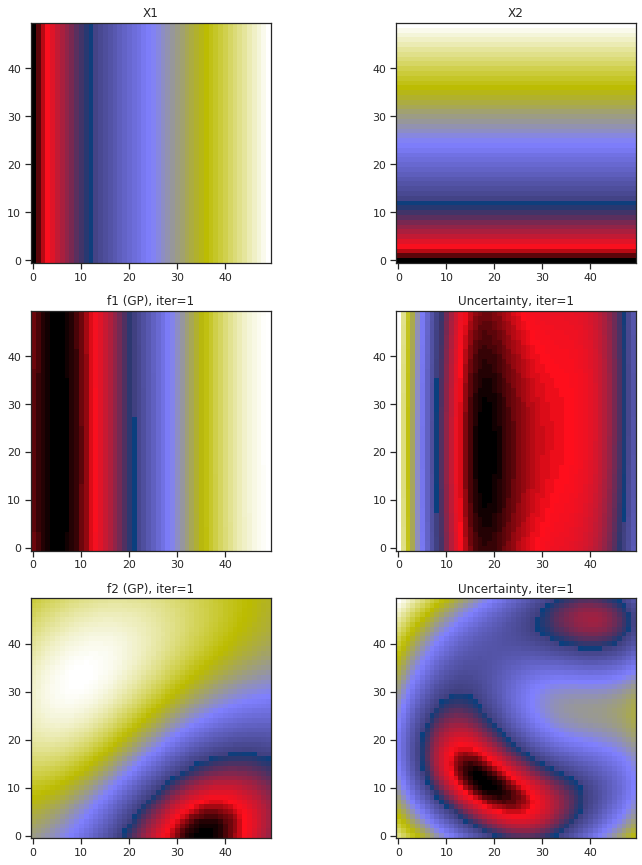

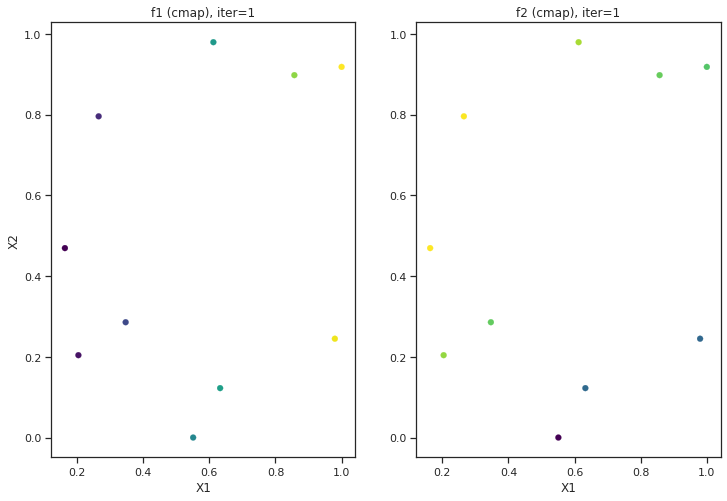

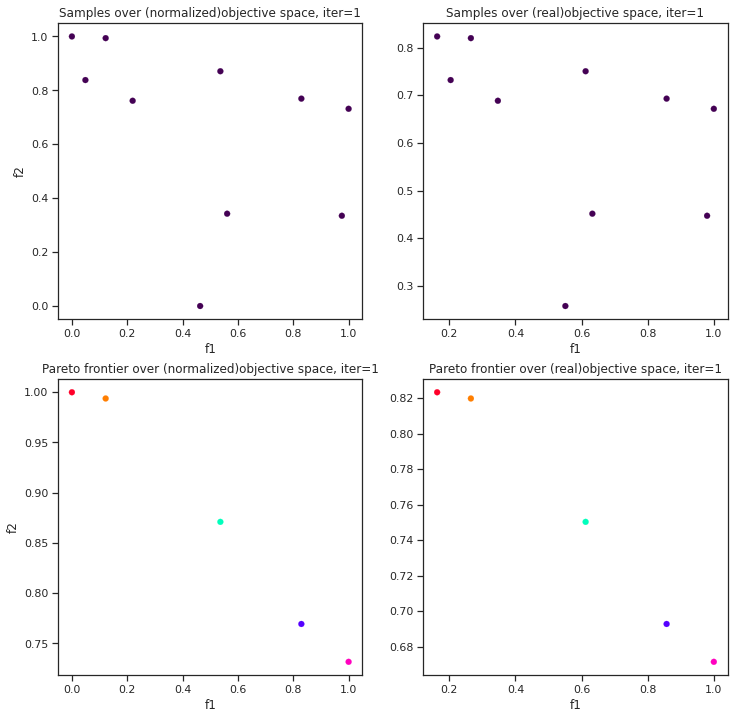

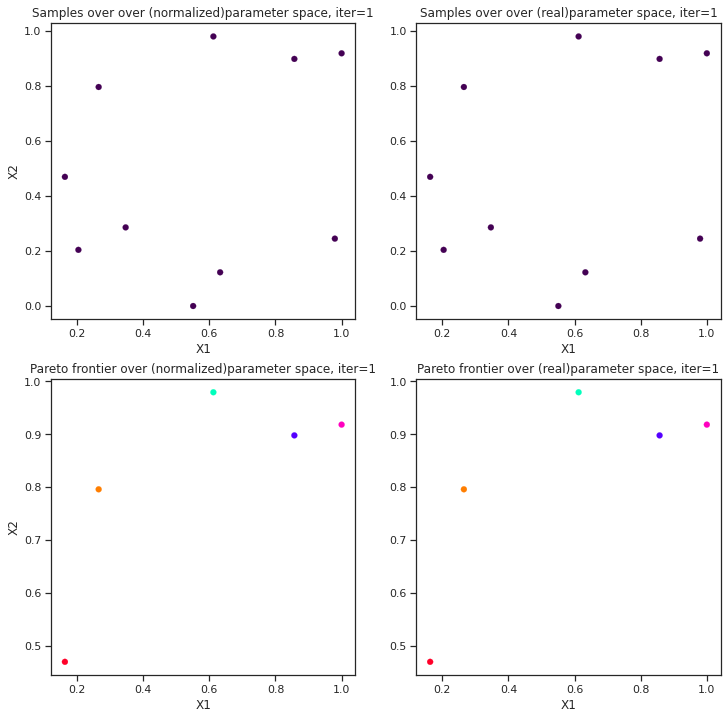

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #11
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #12
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #13
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #14
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #15
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #16
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #17
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #18
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #19
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


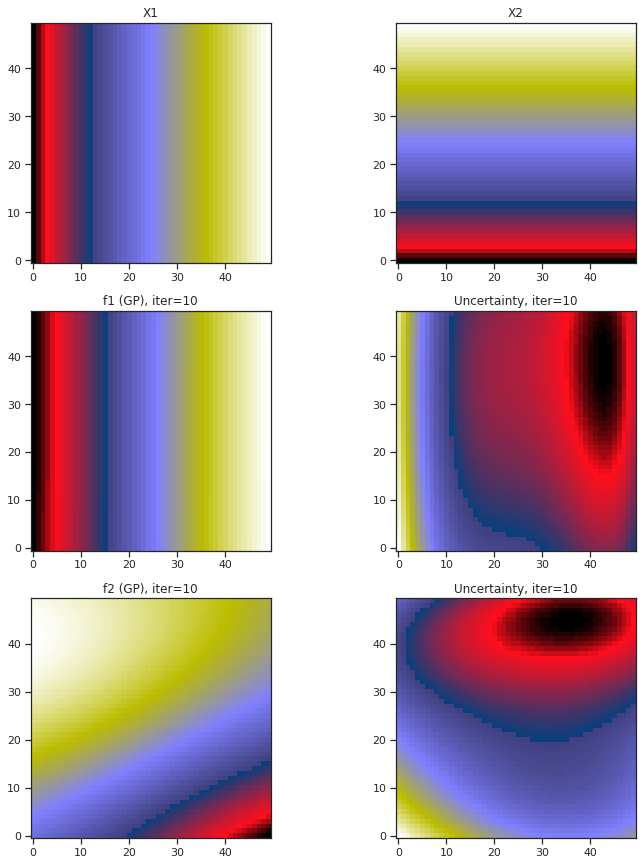

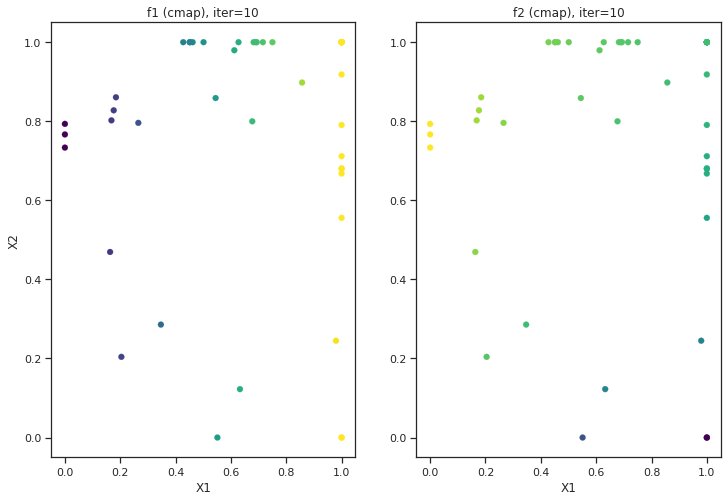

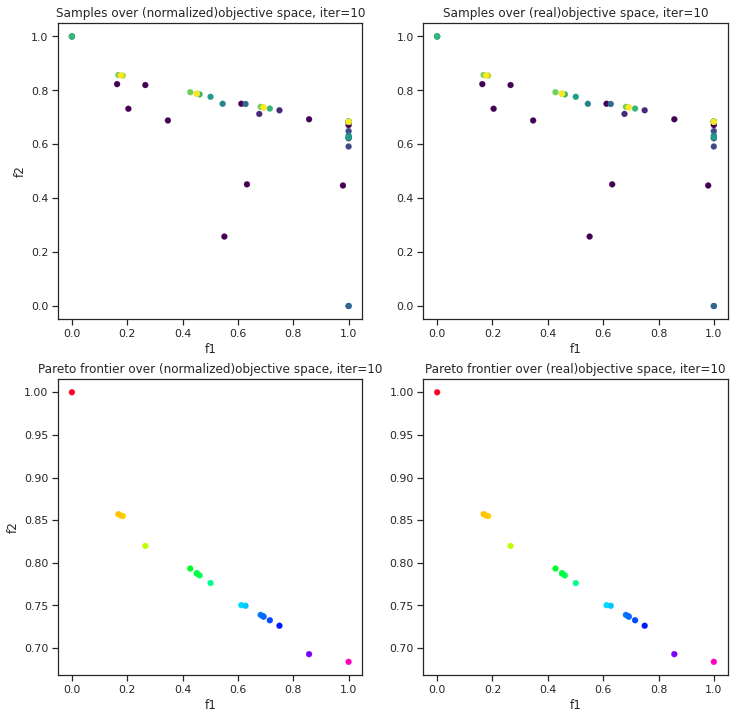

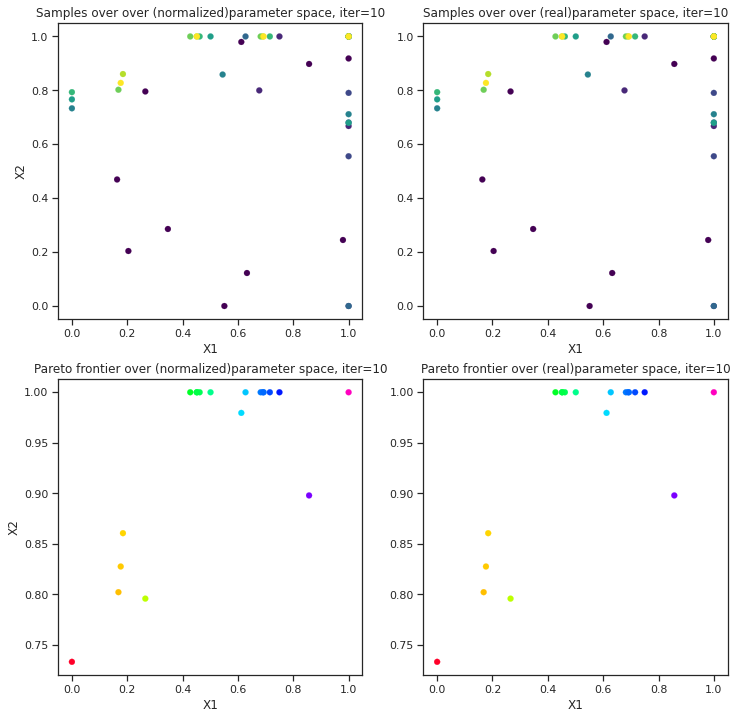

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #20
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #21
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #22
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #23
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #24
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #25
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #26
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #27
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #28
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #29
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


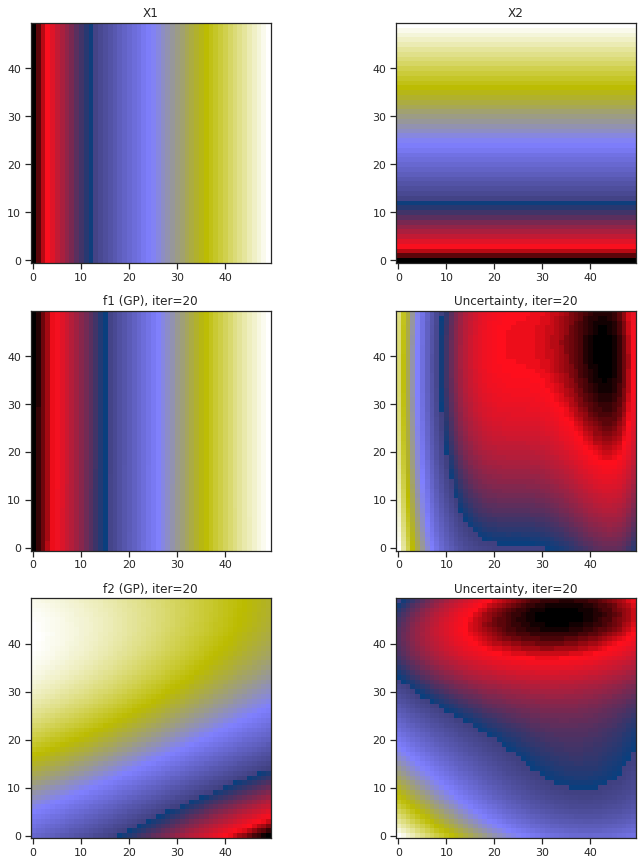

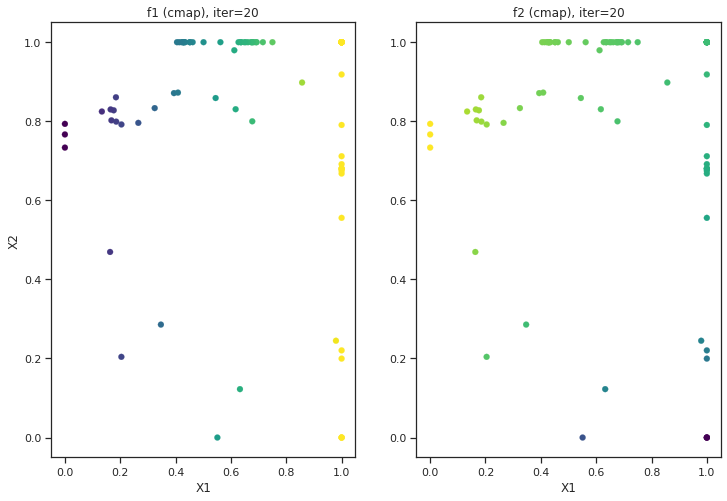

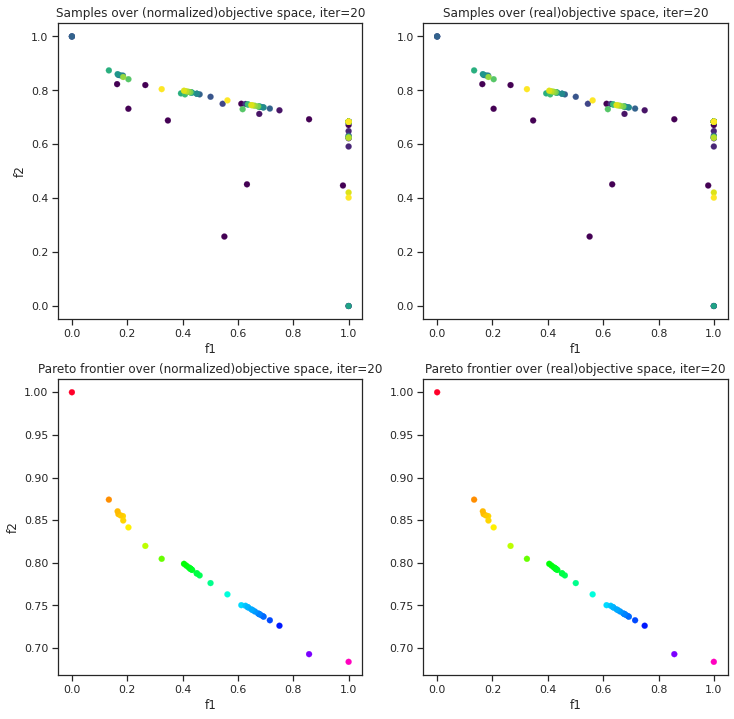

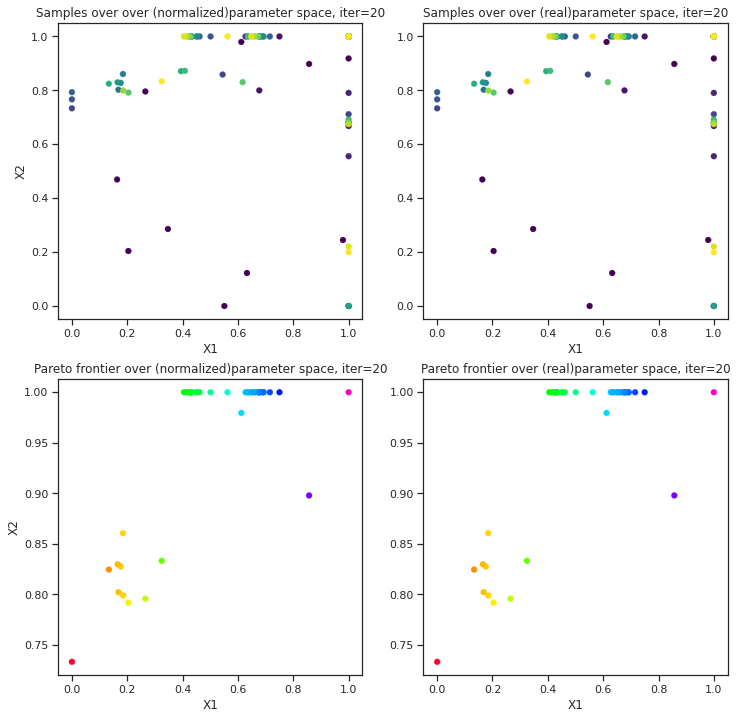

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #30
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #31
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #32
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #33
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #34
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #35
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #36
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #37
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #38
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #39
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


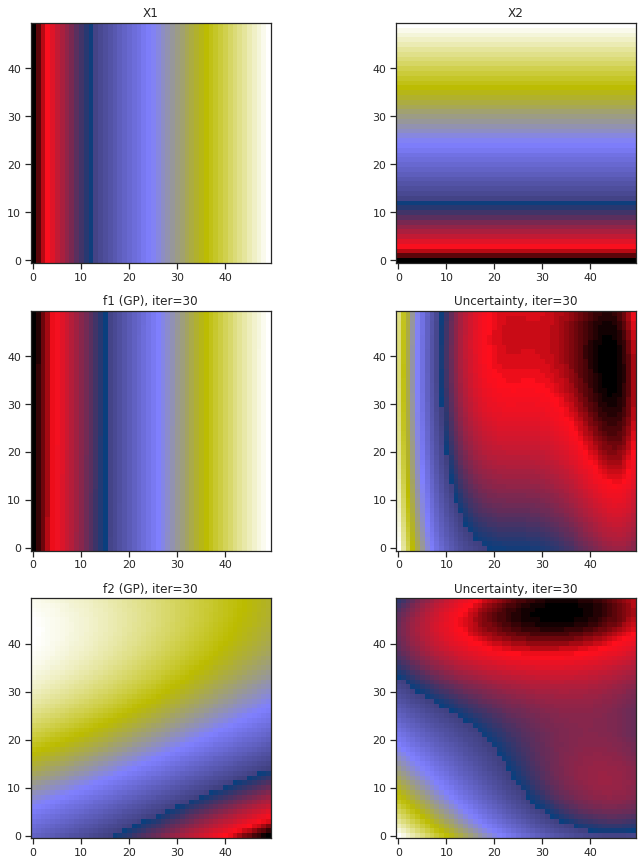

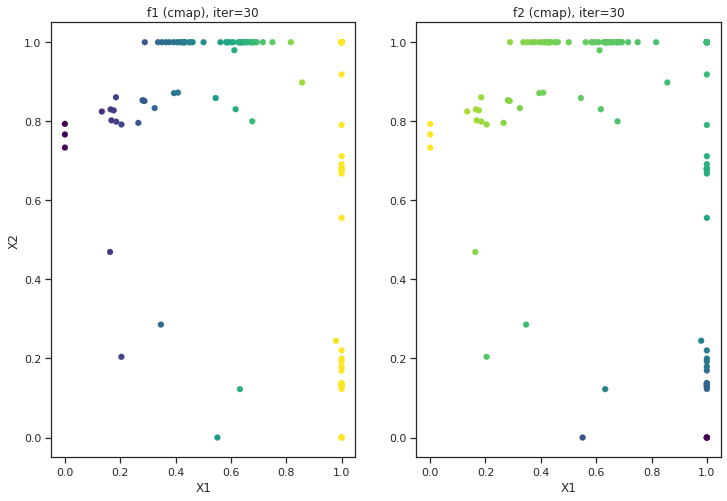

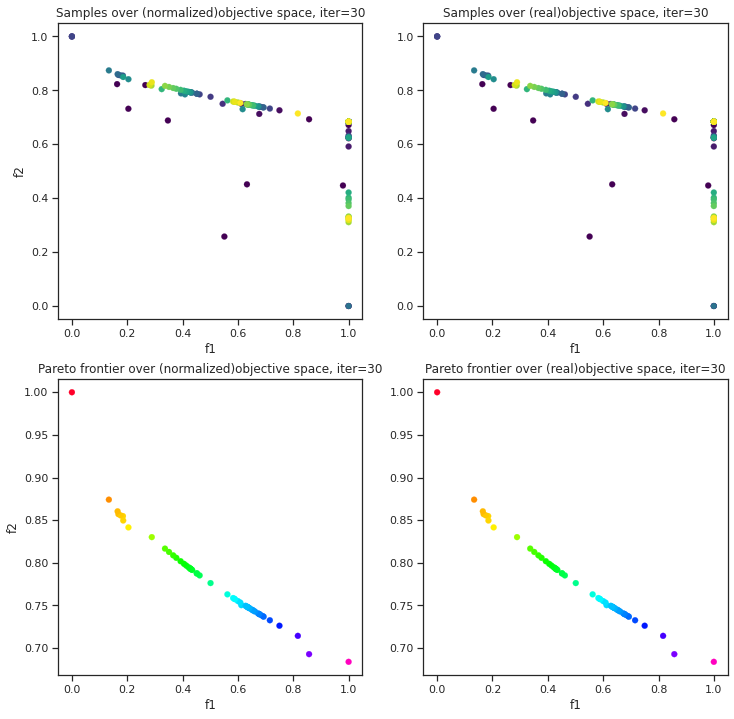

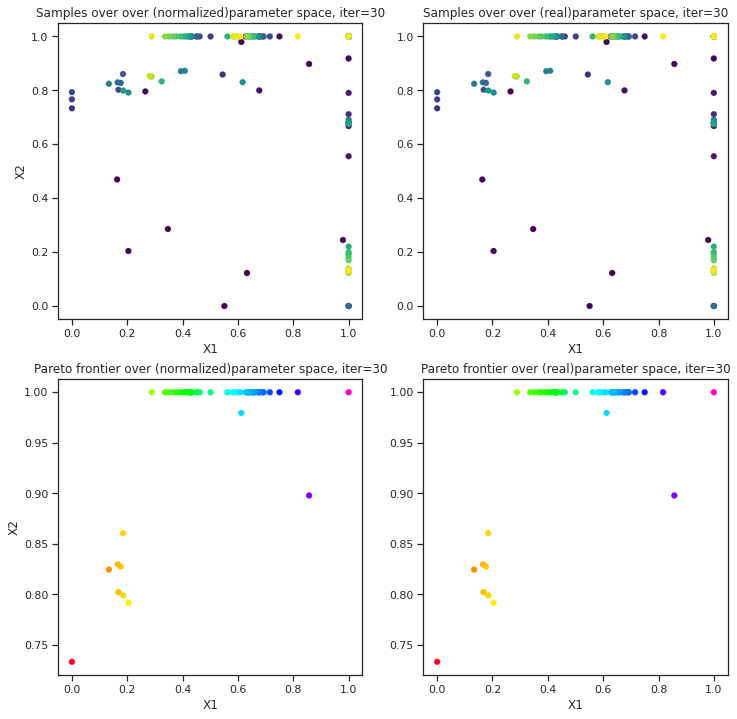

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #40
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #41
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #42
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #43
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #44
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #45
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #46
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #47
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #48
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #49
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


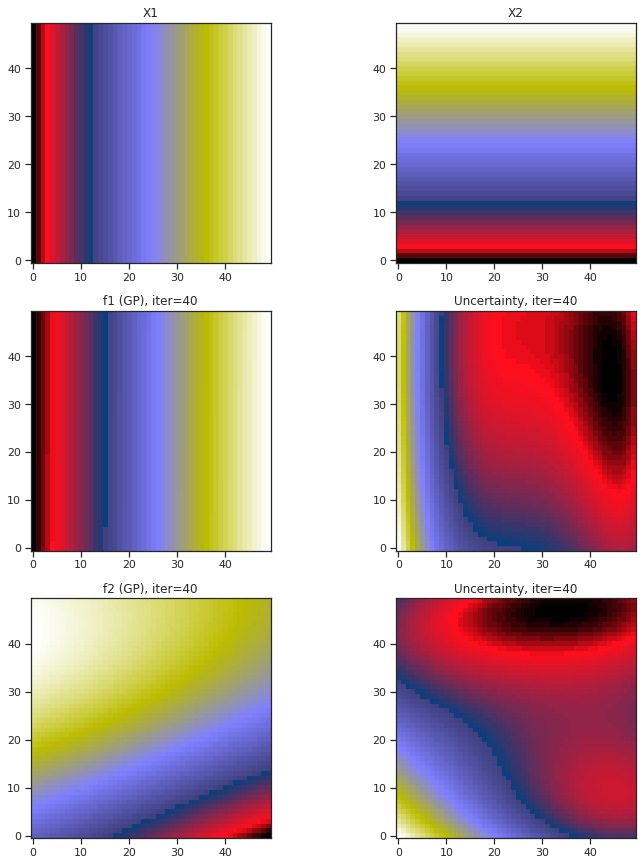

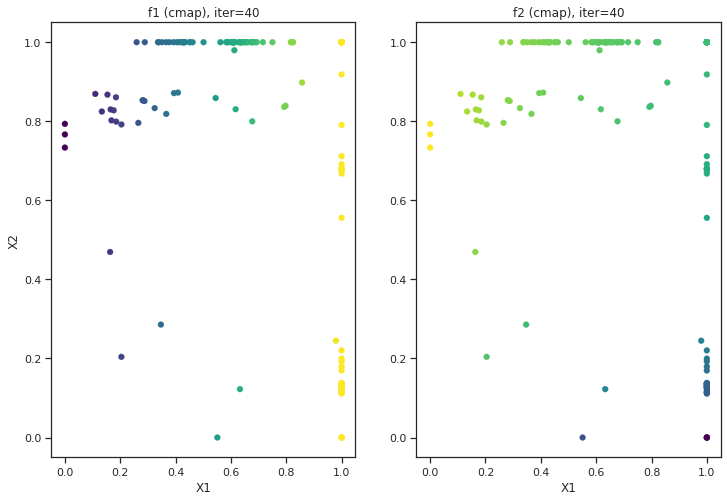

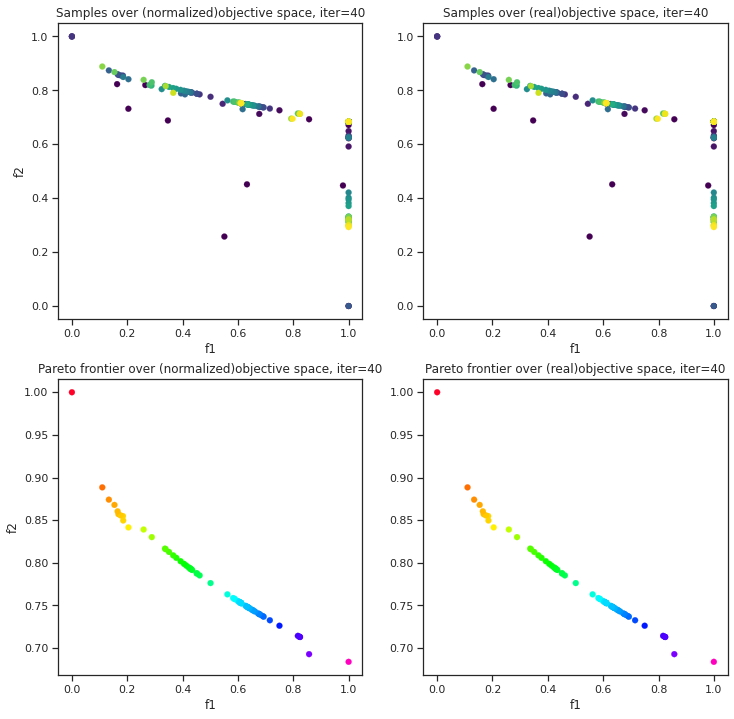

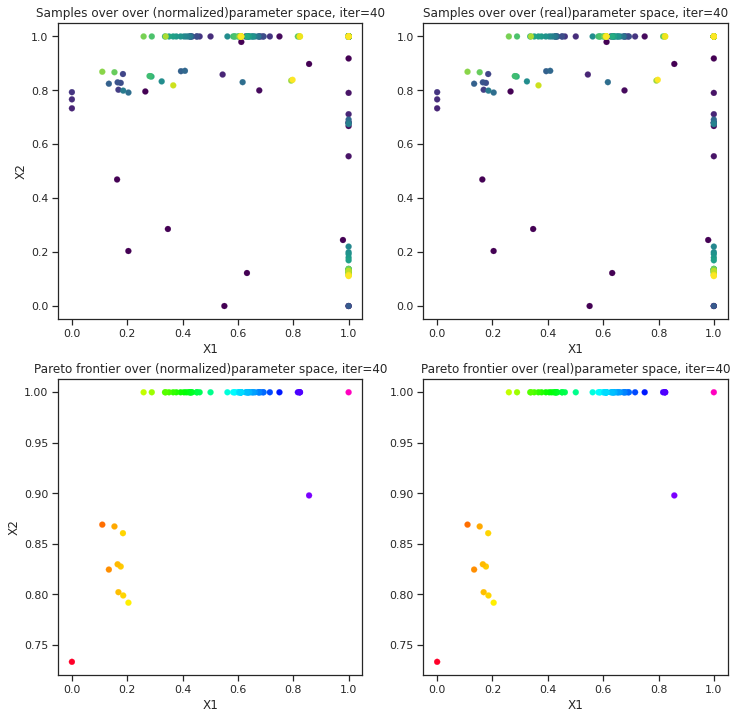

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #50
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #51
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #52
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #53
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #54
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #55
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #56
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #57
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #58
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #59
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #60
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Max. sampling reached, model stopped


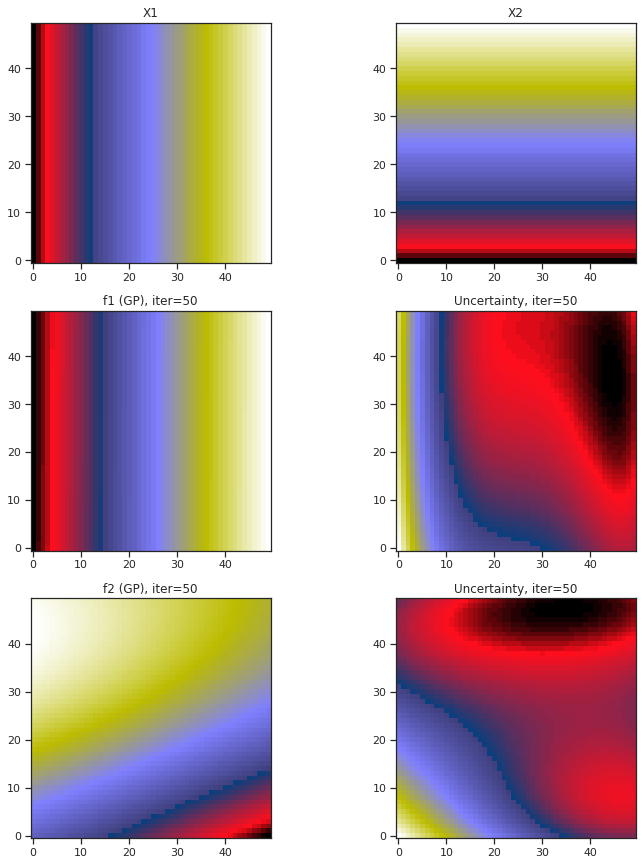

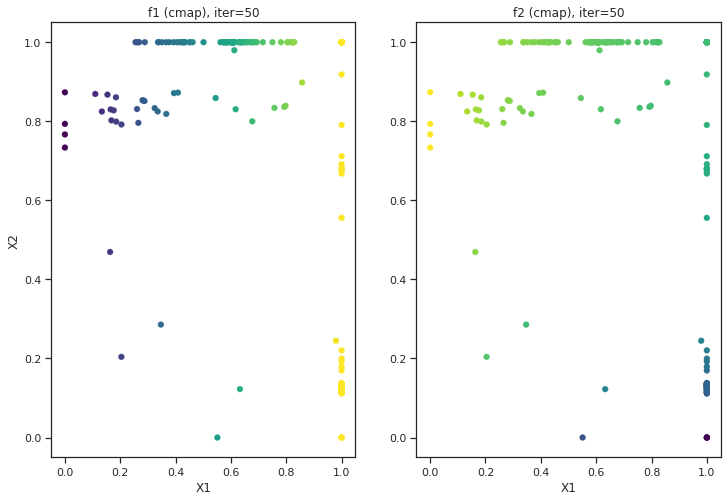

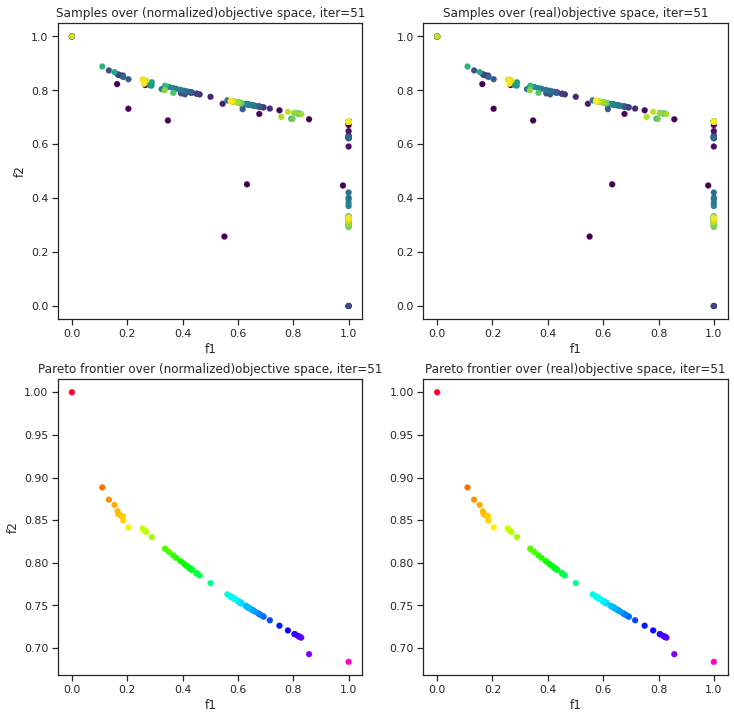

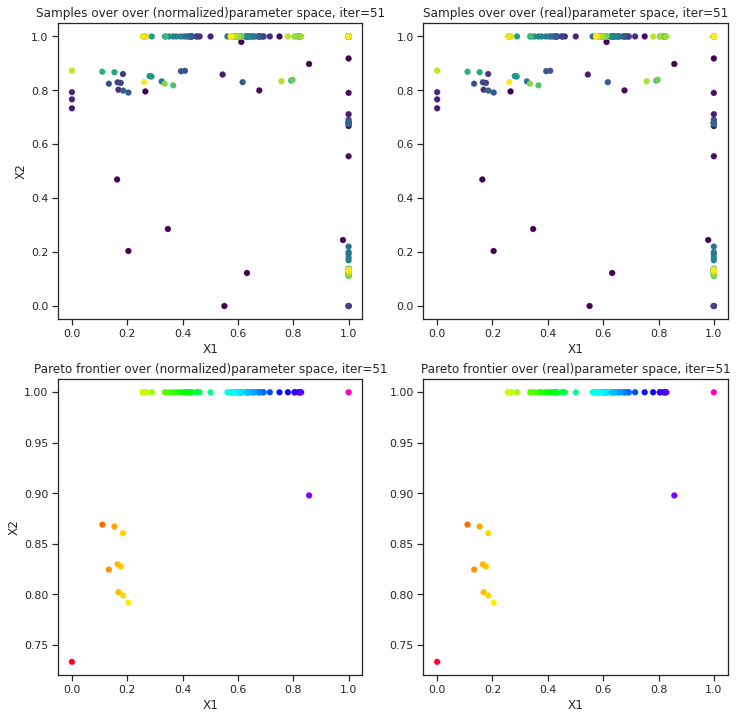

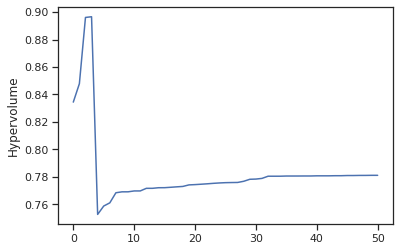

tensor(0.0426, dtype=torch.float64)
tensor(0.0128, dtype=torch.float64)
Run NSGA 2 for test function-- Without MOBO
n_gen |  n_eval |  n_nds  |     eps      |  indicator  
    1 |     100 |      23 |            - |            -
    2 |     200 |      27 |  0.107969634 |        nadir
    3 |     300 |      50 |  0.008406783 |            f
    4 |     400 |      79 |  0.008501667 |        ideal
    5 |     500 |     100 |  0.003794414 |        nadir
    6 |     600 |     100 |  0.003901667 |            f
    7 |     700 |     100 |  0.002164742 |            f
    8 |     800 |     100 |  0.002300958 |            f
    9 |     900 |     100 |  0.002034865 |            f
   10 |    1000 |     100 |  0.002201031 |            f
   11 |    1100 |     100 |  0.005970354 |        nadir
   12 |    1200 |     100 |  0.001558952 |            f
   13 |    1300 |     100 |  0.030812556 |        nadir
   14 |    1400 |     100 |  0.001602627 |            f
   15 |    1500 |     100 |  0.001488781 |  

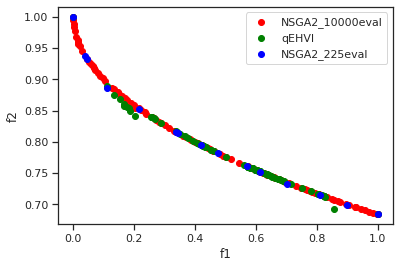

In [ ]:
tkwargs = {
    "dtype": to.double,
    "device": to.device("cuda" if to.cuda.is_available() else "cpu"),
}
BATCH_SIZE = 4

# List of options
# 'qEHVI'- Expected Hypervolume acquistion function
# 'qParEGO' -qParEGO
acquisition = 'qEHVI'

#List of control params- Temp, rho, h, deltaG
# Choose any two control params to create the parameter space considering the same order-
param1 = 'X1'
param2 = 'X2'
# Choose any two objectives to do MOO (MOBO)-
obj1 = 'f1'
obj2 = 'f2'

#List of toy test functions
# 'ZDT1'
# '6HC-IAP'- Six hump Camel back - Inversed Ackley's path
testfunction = 'ZDT1'

# Input choice of problem- where it is minimization or maximization for objective 1 and 2 respectively
# List of options
# 'min'- Minimization
# 'max' -Maximization (default setting)
problem =['max','max']

#Define parameter space based on above choice of params (2D only)
num_rows =50
num = 10  # Starting samples
#N = (0.1 * num_rows ** 2) - num  # Maximum evaluations
#N = int(N)
N=50

if (testfunction =='ZDT1'):
    X1 = np.linspace(0, 1, num_rows)
    test_X1 = np.linspace(0, 1, num_rows)
    X2 = np.linspace(0, 1, num_rows)
    test_X2 = np.linspace(0, 1, num_rows)
elif (testfunction =='6HC-IAP'):
    X1 = np.linspace(-3, 3, num_rows)
    test_X1 = np.linspace(-3, 3, num_rows)
    X2 = np.linspace(-2, 2, num_rows)
    test_X2 = np.linspace(-2, 2, num_rows)
else:
    print("Invalid test function")

MOBO_testfunc(X1, X2, test_X1, test_X2, num_rows, N, BATCH_SIZE, param1, param2, obj1, obj2, acquisition, problem, testfunction)

<h1> Analysis 2a

Test function- **6HC-IAP**, acquistion function - **qParEGO**, num_rows =50, num = 10, N= 50

Maximize f1, f2

Function evaluaton for initial randomly selected samples
Function eval #1
Function eval #2
Function eval #3
Function eval #4
Function eval #5
Function eval #6
Function eval #7
Function eval #8
Function eval #9
Function eval #10
Initial evaluation complete. Start BO- acq func: qParEGO


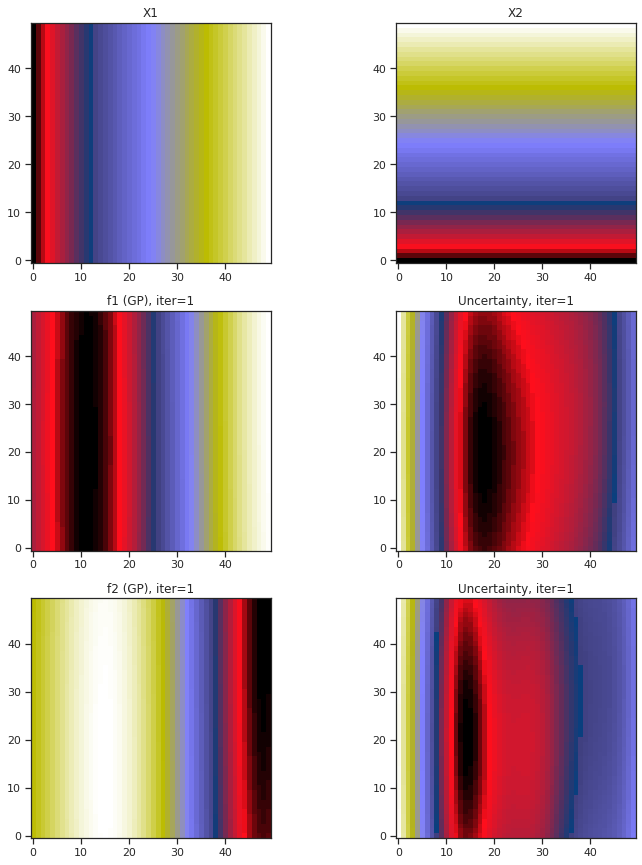

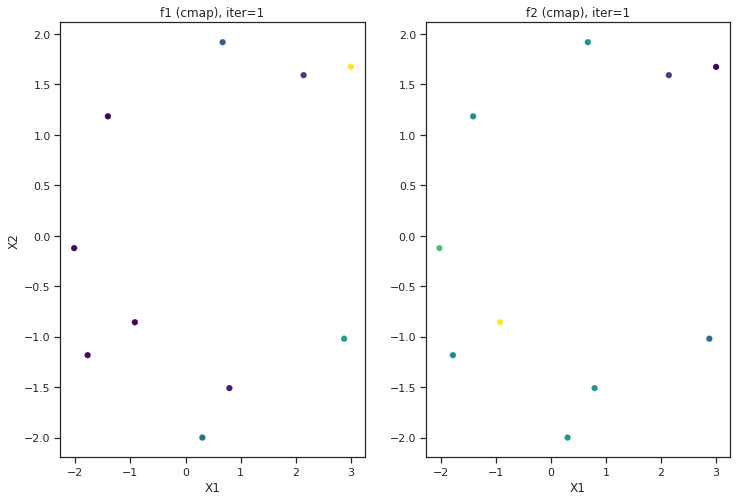

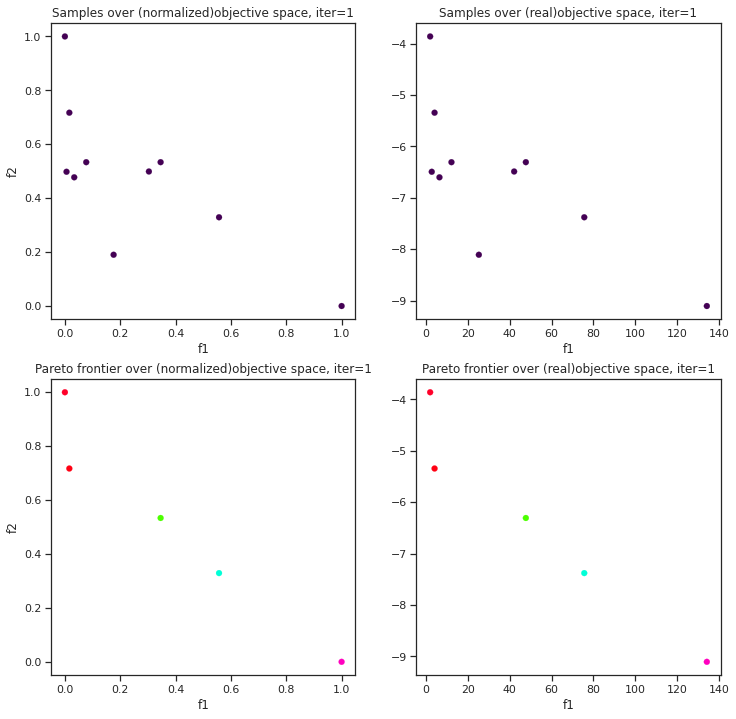

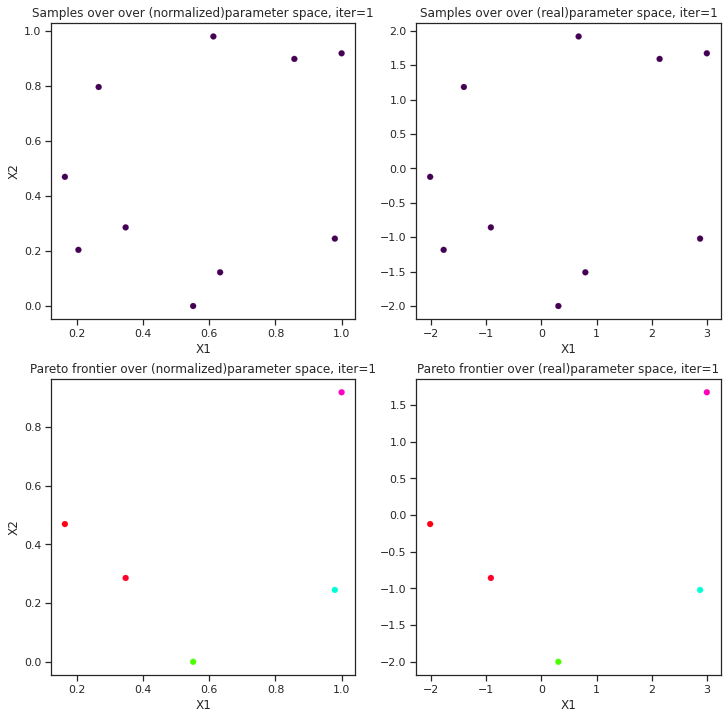

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #11
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #12
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #13
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #14
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #15
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #16
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #17
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #18
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #19
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


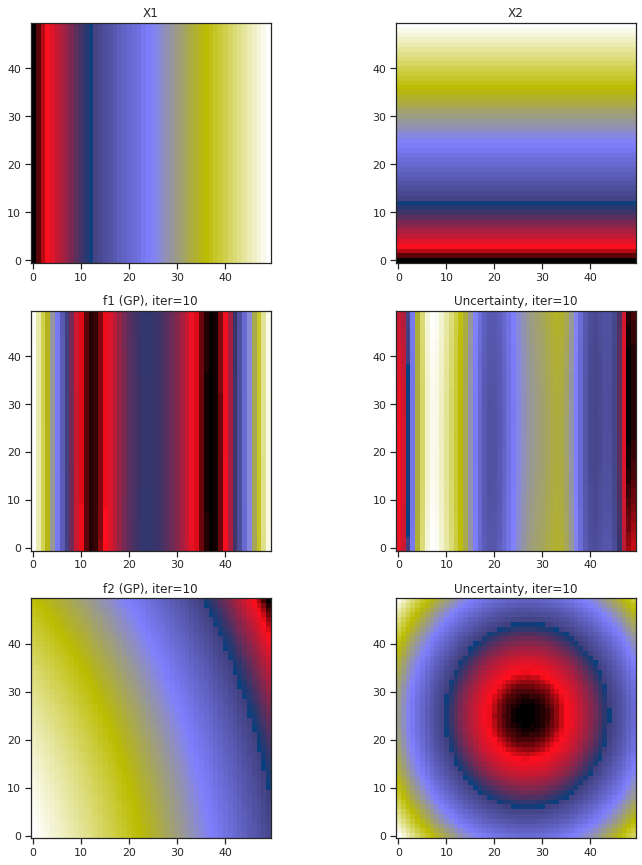

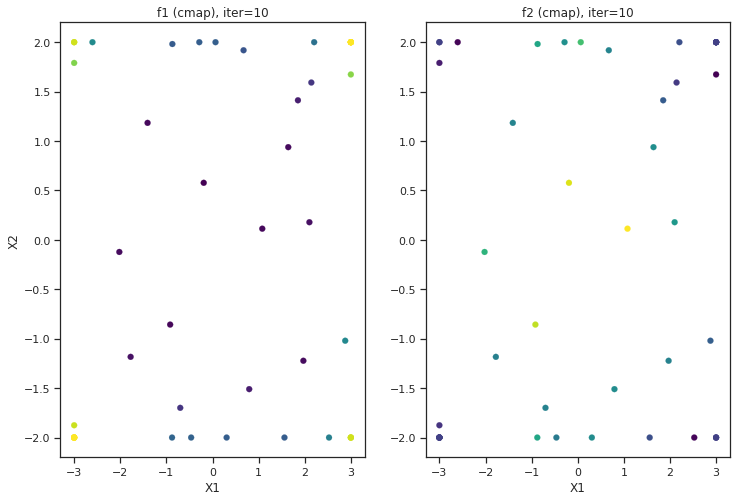

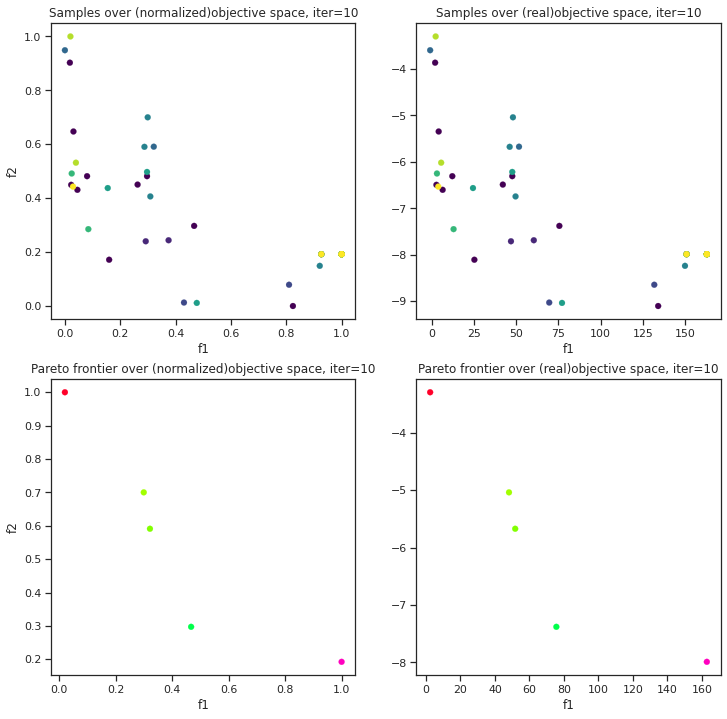

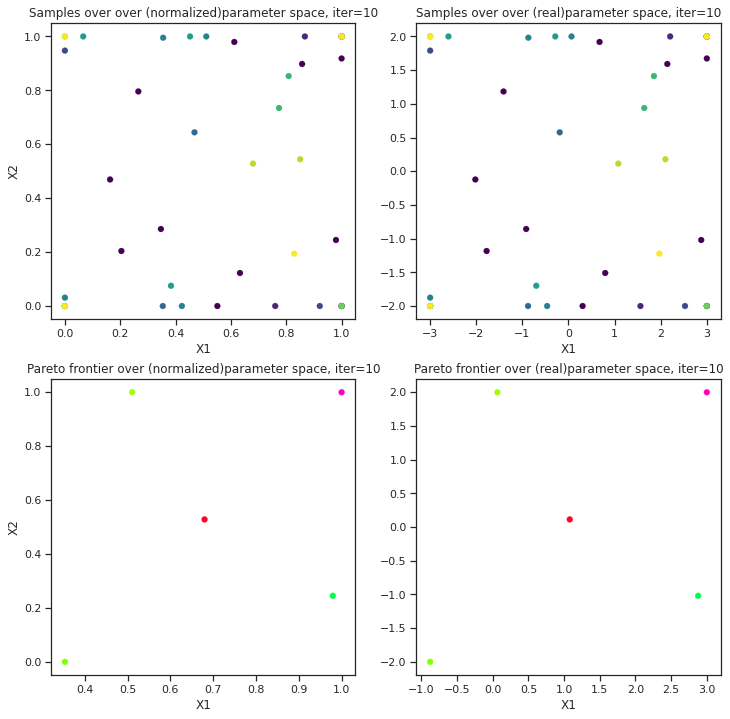

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #20
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #21
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #22
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #23
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #24
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #25
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #26
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval:

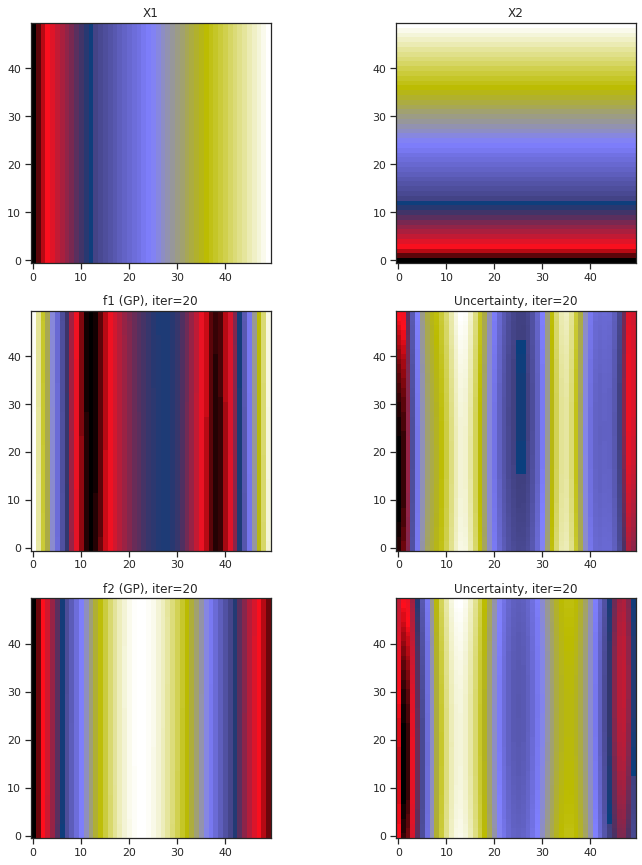

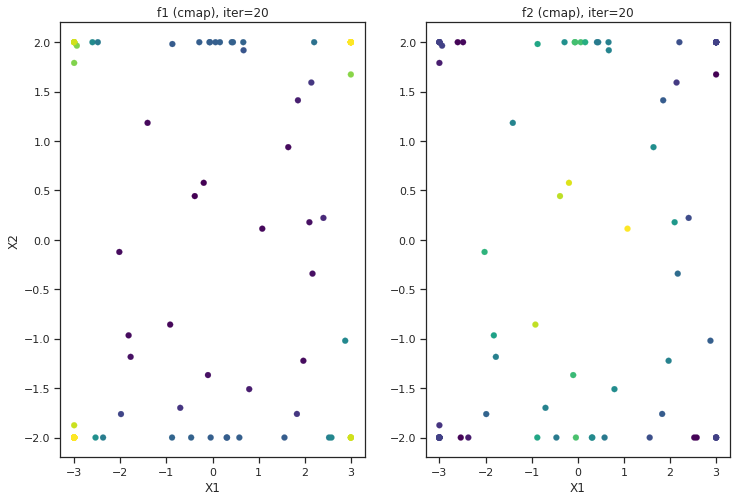

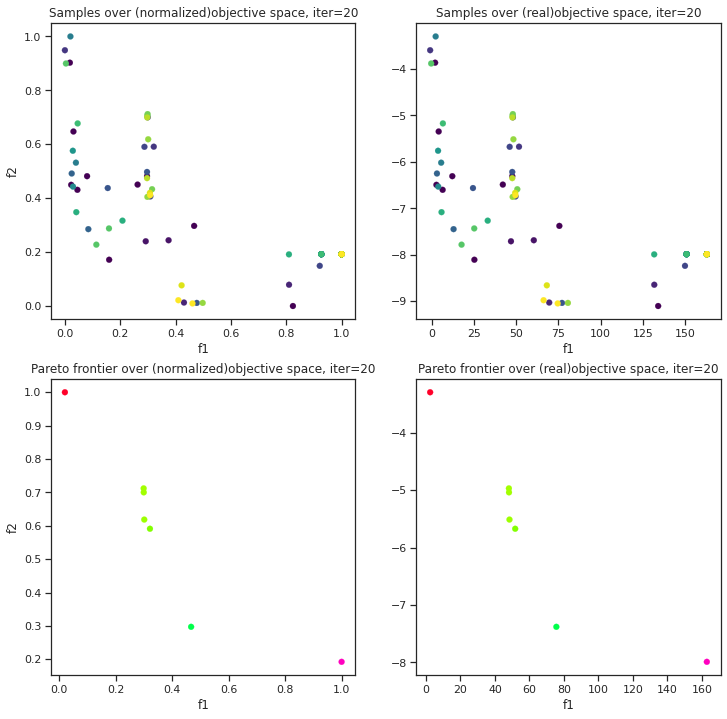

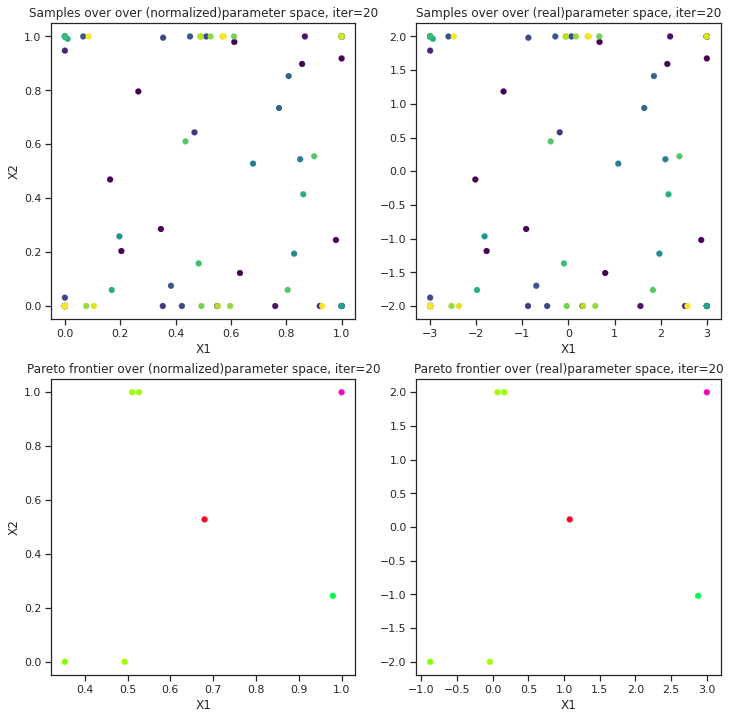

Batch Function eval #30
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #31
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #32
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #33
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #34
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #35
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #36
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #37
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #38
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #39
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


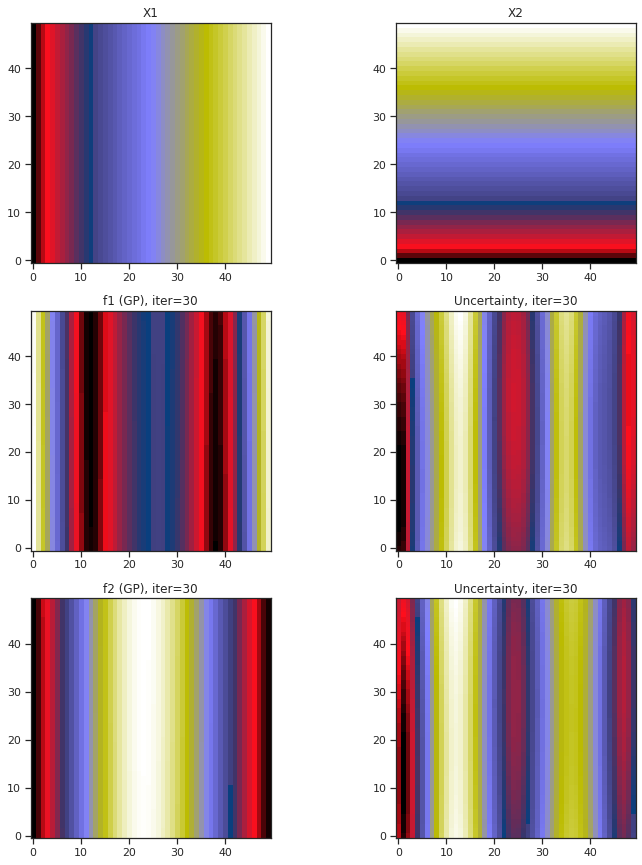

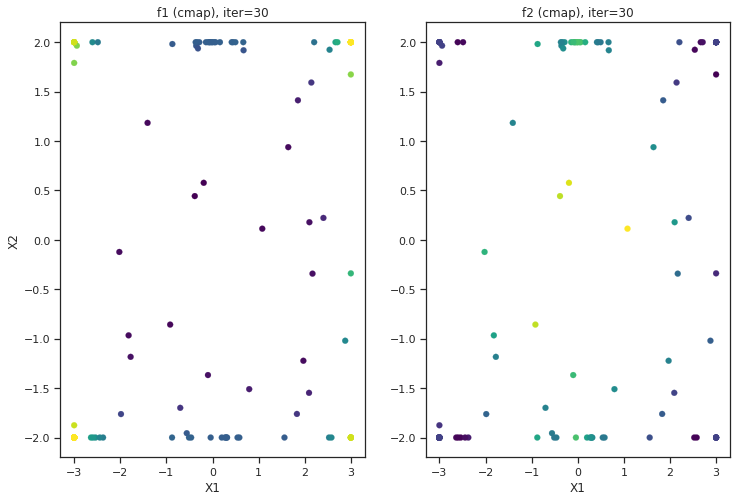

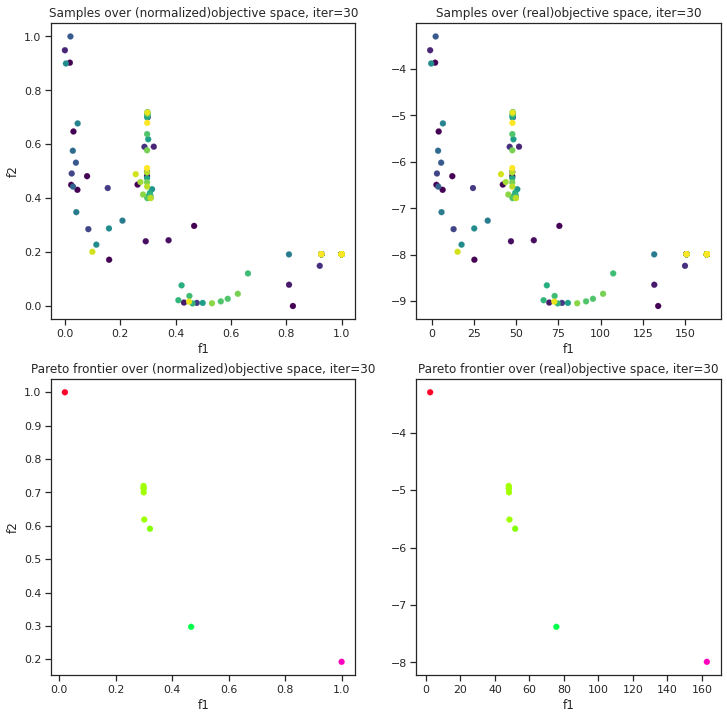

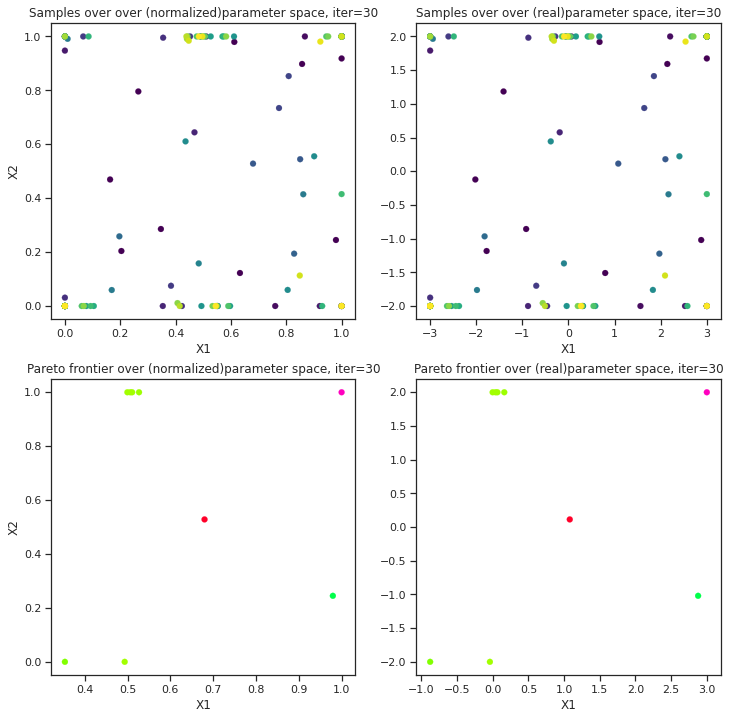

Batch Function eval #40
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #41
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #42
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #43
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #44
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #45
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval:

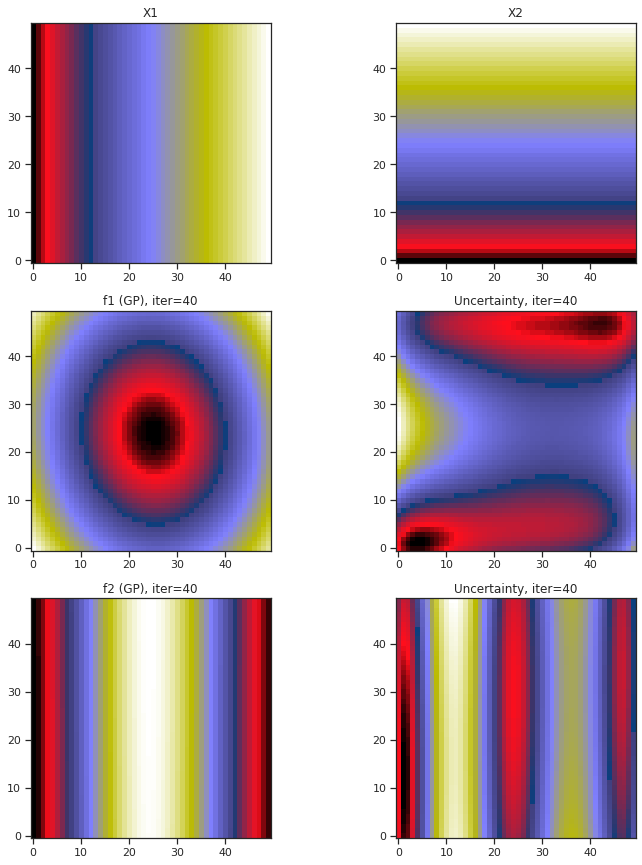

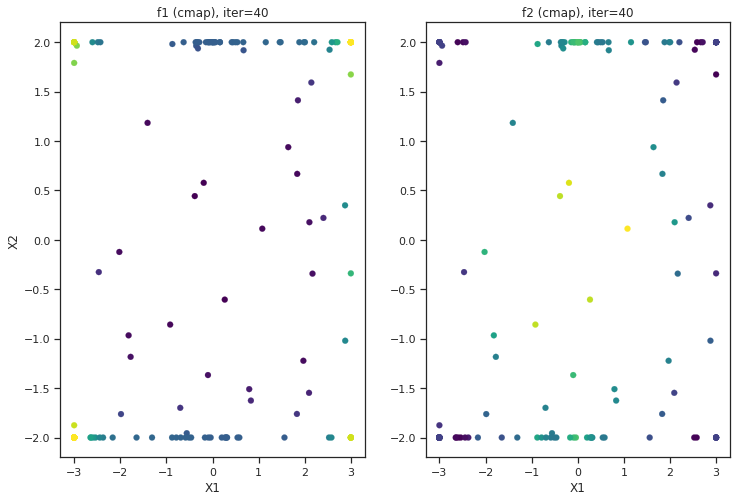

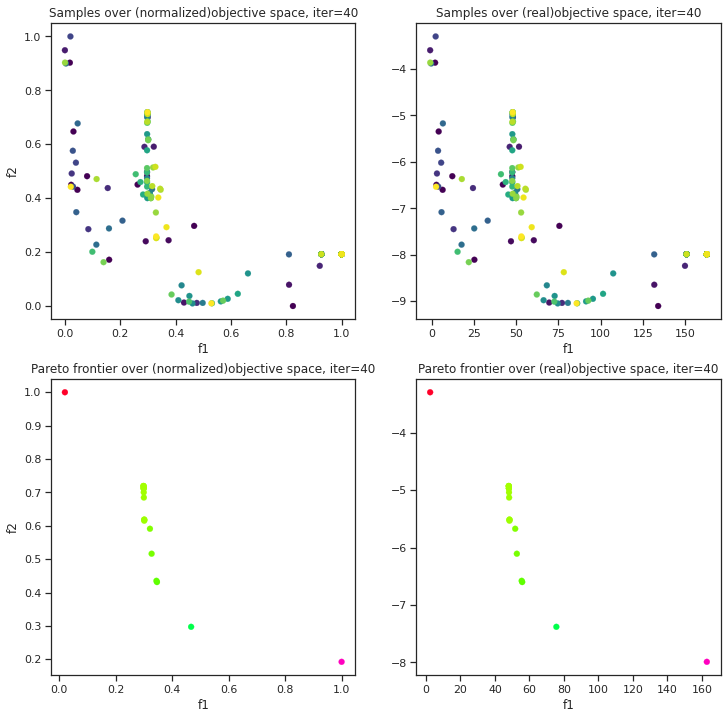

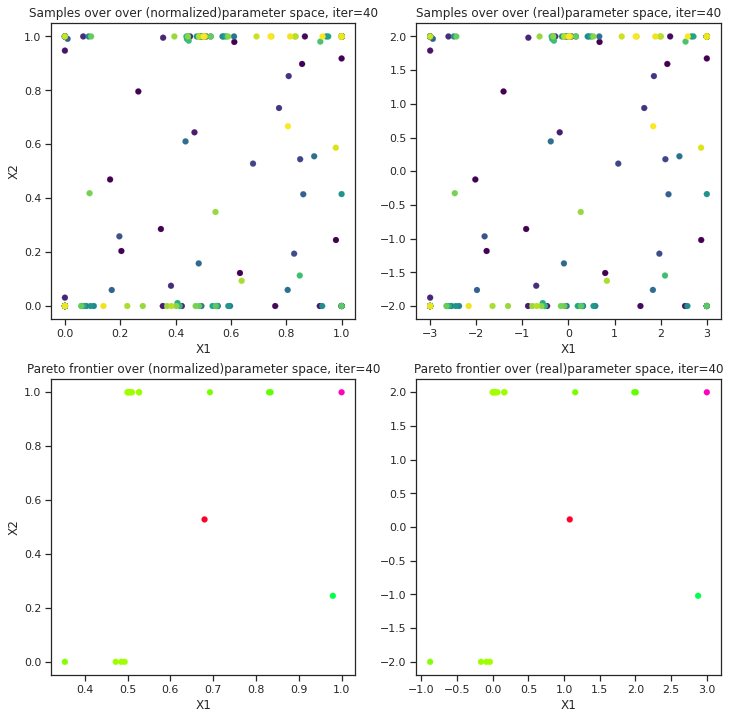

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #50
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #51
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #52
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #53
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #54
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #55
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval:

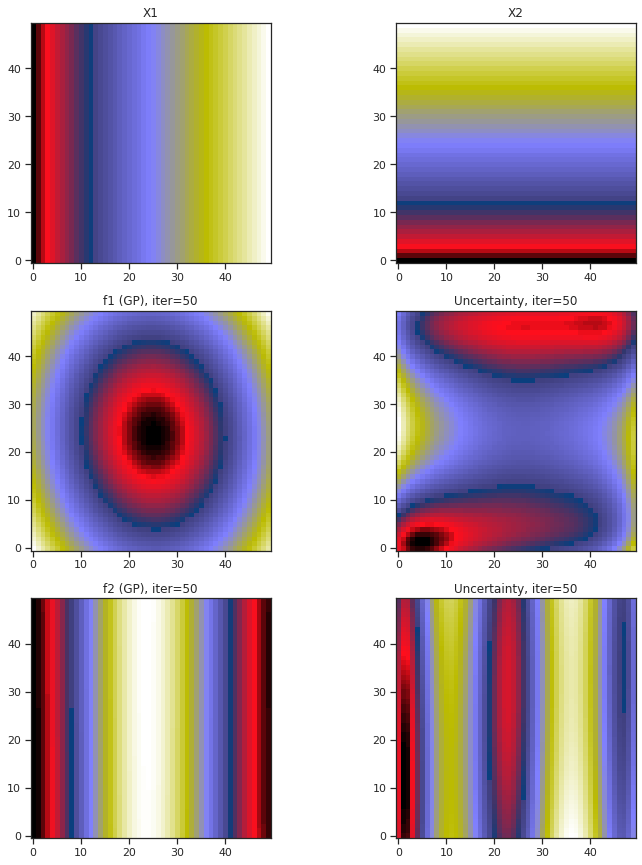

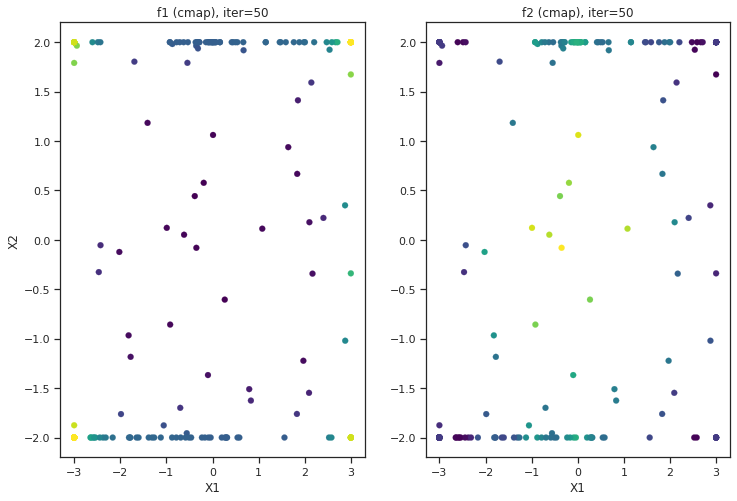

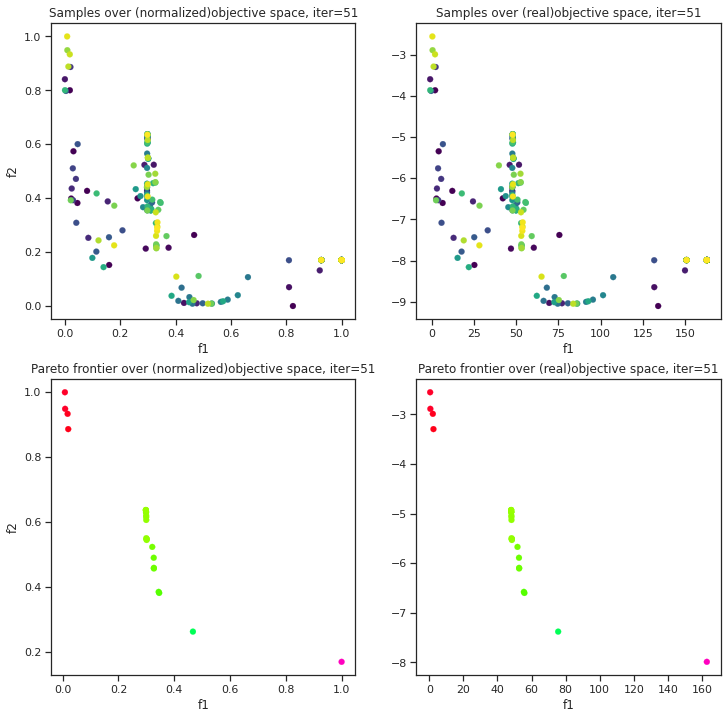

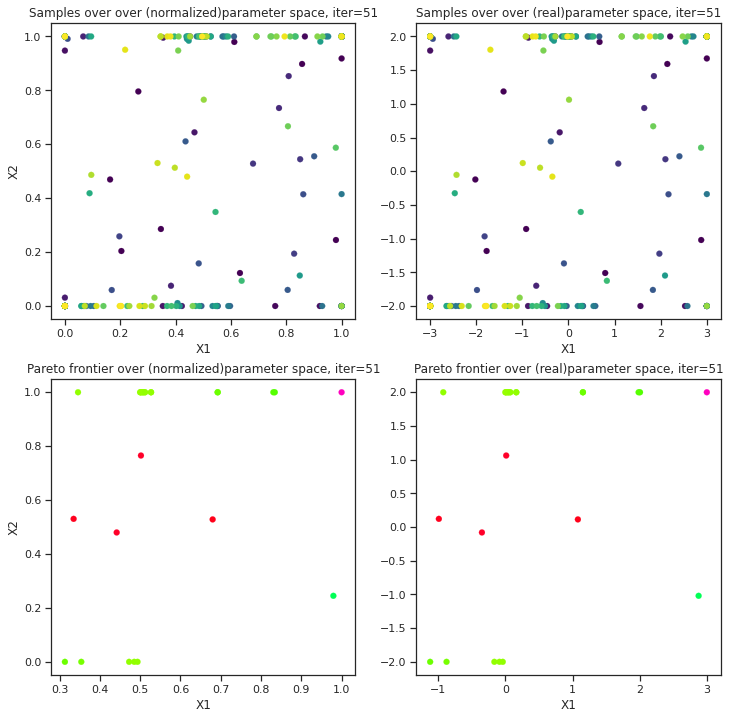

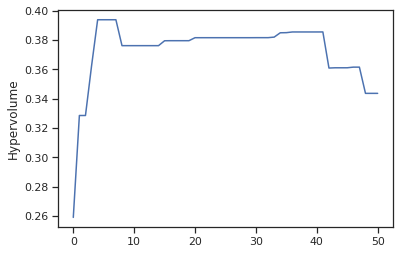

tensor(0.0134, dtype=torch.float64)
tensor(0.0043, dtype=torch.float64)
Run NSGA 2 for test function-- Without MOBO
n_gen |  n_eval |  n_nds  |     eps      |  indicator  
    1 |     100 |       8 |            - |            -
    2 |     200 |      14 |  0.191387722 |        ideal
    3 |     300 |      18 |  0.030616629 |        ideal
    4 |     400 |      26 |  0.137526363 |        ideal
    5 |     500 |      27 |  0.019992509 |        ideal
    6 |     600 |      34 |  0.011838254 |        ideal
    7 |     700 |      36 |  0.022968358 |        ideal
    8 |     800 |      46 |  0.013976818 |        ideal
    9 |     900 |      57 |  0.014916253 |        ideal
   10 |    1000 |      66 |  0.001367498 |            f
   11 |    1100 |      73 |  0.002086125 |            f
   12 |    1200 |      91 |  0.001344358 |            f
   13 |    1300 |     100 |  0.006443484 |        ideal
   14 |    1400 |     100 |  0.000854942 |            f
   15 |    1500 |     100 |  0.000907962 |  

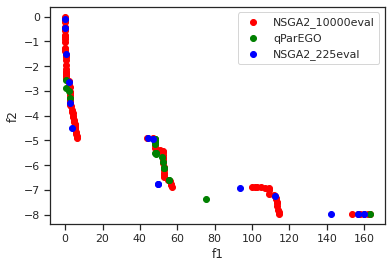

In [ ]:
tkwargs = {
    "dtype": to.double,
    "device": to.device("cuda" if to.cuda.is_available() else "cpu"),
}
BATCH_SIZE = 4

# List of options
# 'qEHVI'- Expected Hypervolume acquistion function
# 'qParEGO' -qParEGO
acquisition = 'qParEGO'

#List of control params- Temp, rho, h, deltaG
# Choose any two control params to create the parameter space considering the same order-
param1 = 'X1'
param2 = 'X2'
# Choose any two objectives to do MOO (MOBO)-
obj1 = 'f1'
obj2 = 'f2'

#List of toy test functions
# 'ZDT1'
# '6HC-IAP'- Six hump Camel back - Inversed Ackley's path
testfunction = '6HC-IAP'

# Input choice of problem- where it is minimization or maximization for objective 1 and 2 respectively
# List of options
# 'min'- Minimization
# 'max' -Maximization (default setting)
problem =['max','max']

#Define parameter space based on above choice of params (2D only)
num_rows =50
num = 10  # Starting samples
#N = (0.1 * num_rows ** 2) - num  # Maximum evaluations
#N = int(N)
N=50

if (testfunction =='ZDT1'):
    X1 = np.linspace(0, 1, num_rows)
    test_X1 = np.linspace(0, 1, num_rows)
    X2 = np.linspace(0, 1, num_rows)
    test_X2 = np.linspace(0, 1, num_rows)
elif (testfunction =='6HC-IAP'):
    X1 = np.linspace(-3, 3, num_rows)
    test_X1 = np.linspace(-3, 3, num_rows)
    X2 = np.linspace(-2, 2, num_rows)
    test_X2 = np.linspace(-2, 2, num_rows)
else:
    print("Invalid test function")

MOBO_testfunc(X1, X2, test_X1, test_X2, num_rows, N, BATCH_SIZE, param1, param2, obj1, obj2, acquisition, problem, testfunction)

<h1> Analysis 2b

Test function- **6HC-IAP**, acquistion function - **qEHVI**, num_rows =50, num = 10, N= 50

Maximize f1, f2

Function evaluaton for initial randomly selected samples
Function eval #1
Function eval #2
Function eval #3
Function eval #4
Function eval #5
Function eval #6
Function eval #7
Function eval #8
Function eval #9
Function eval #10
Initial evaluation complete. Start BO- acq func: qEHVI


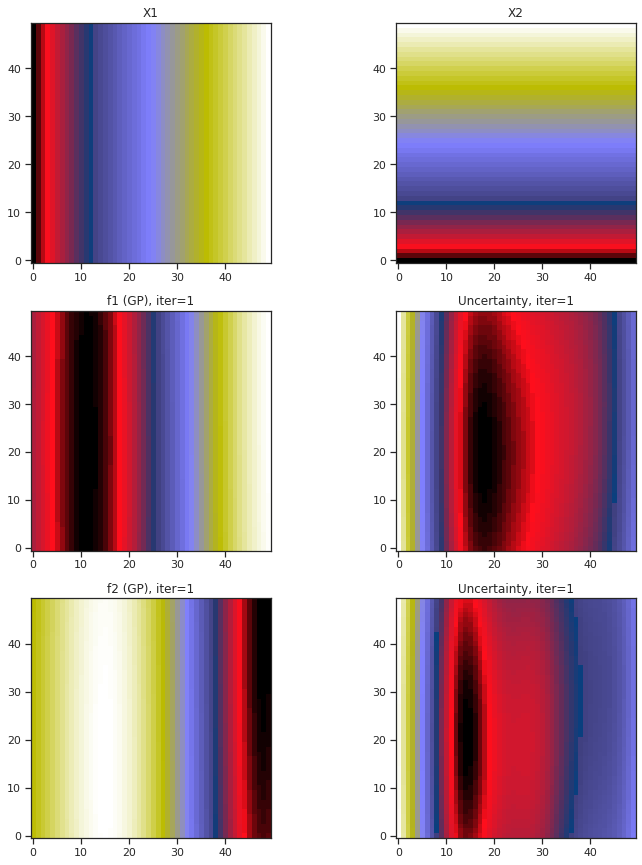

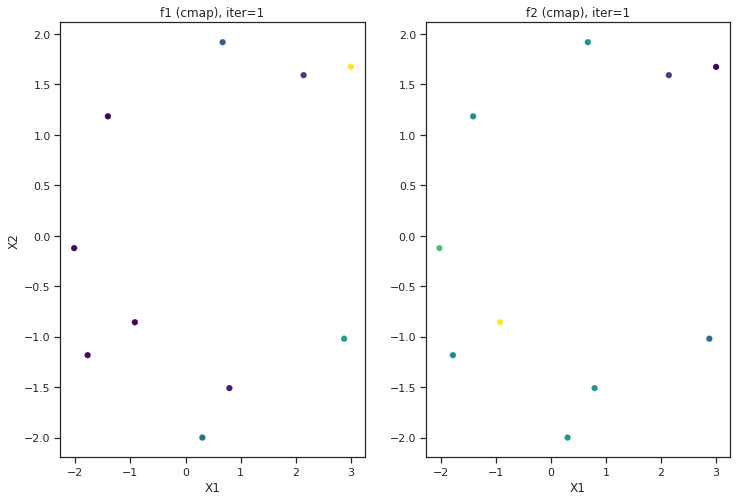

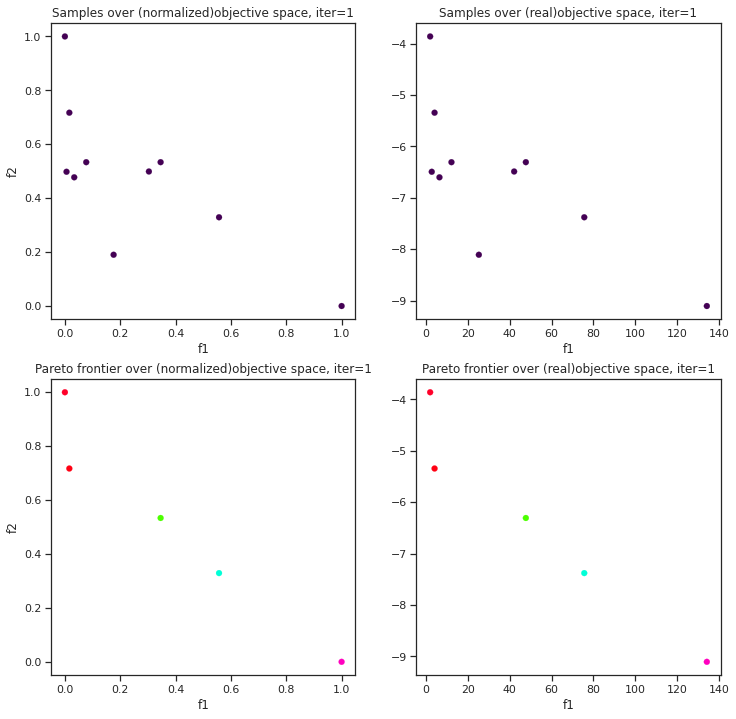

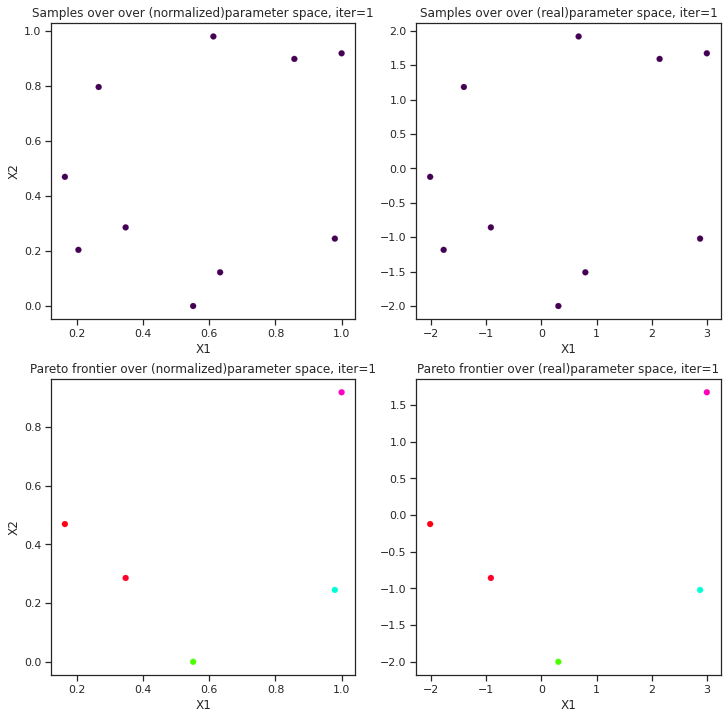

Batch Function eval #11
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #12
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #13
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #14
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #15
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #16
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval:

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #18
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #19
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


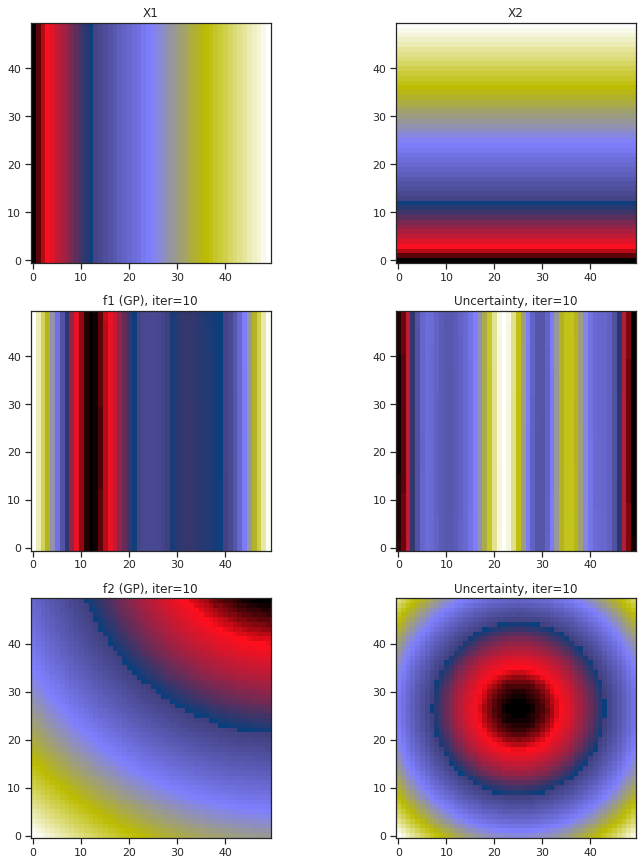

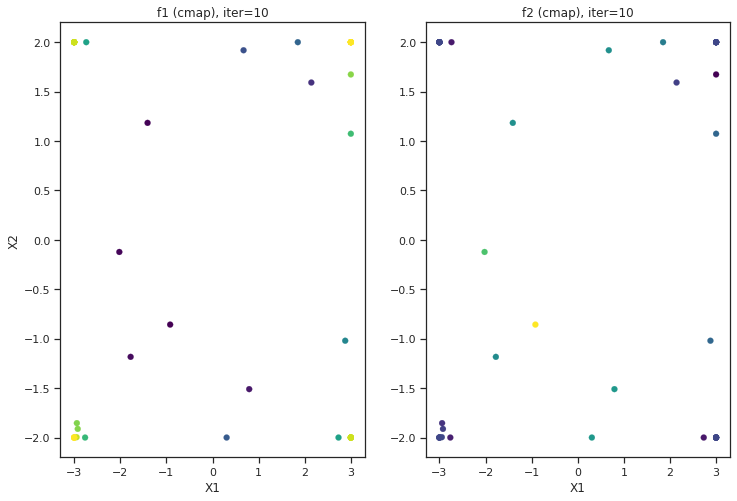

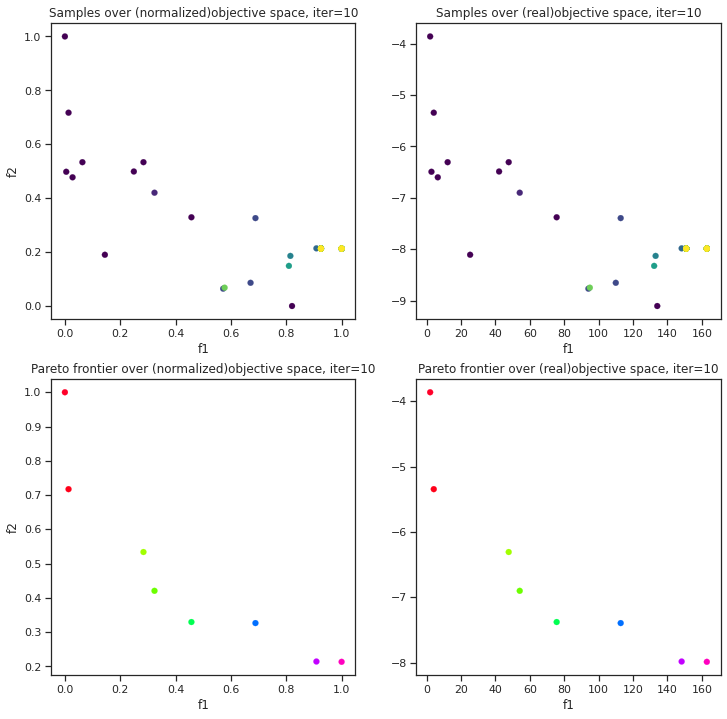

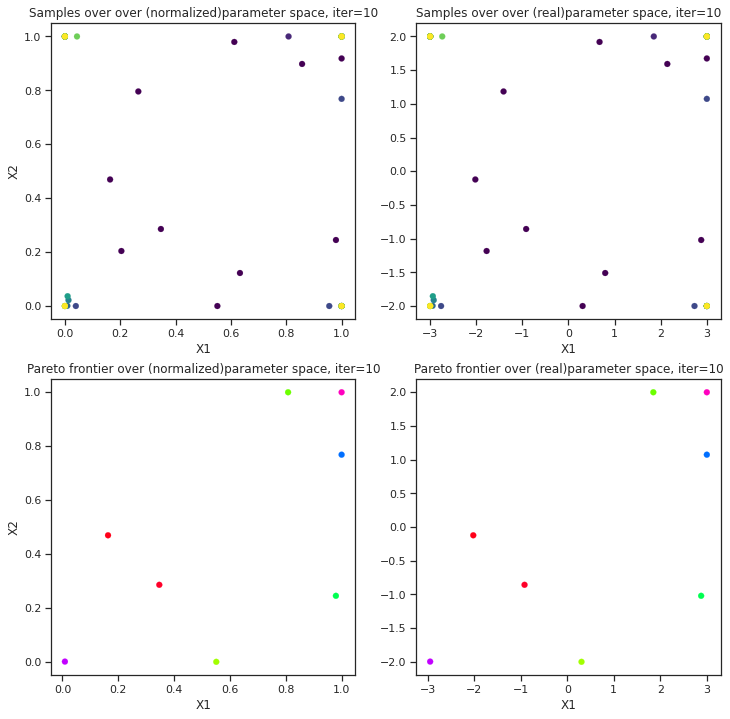

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #20
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #21
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #22
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #23
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #24
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #25
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #26
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #27
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #28
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #29
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


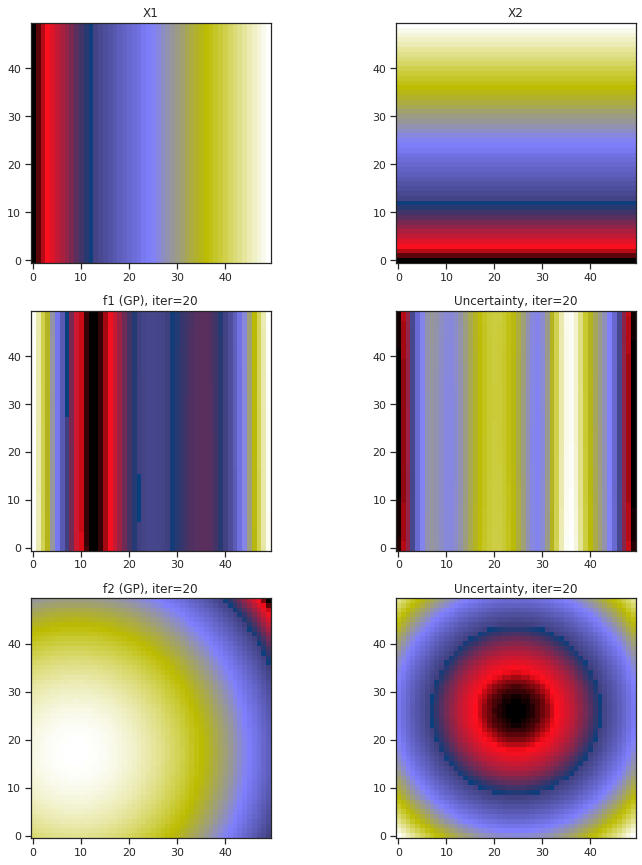

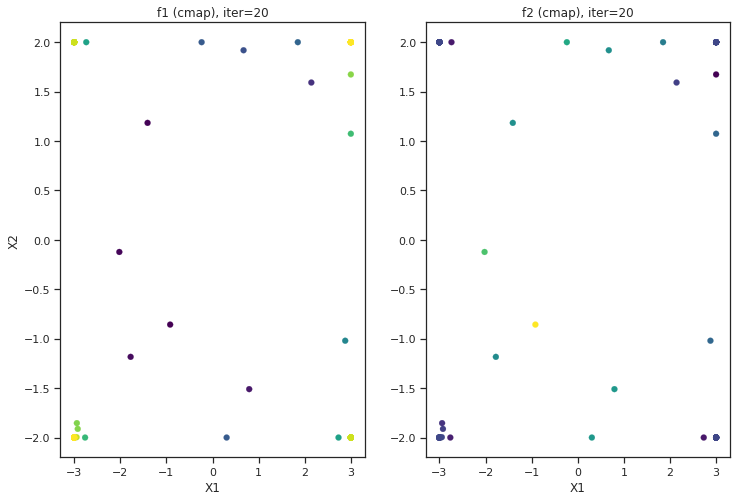

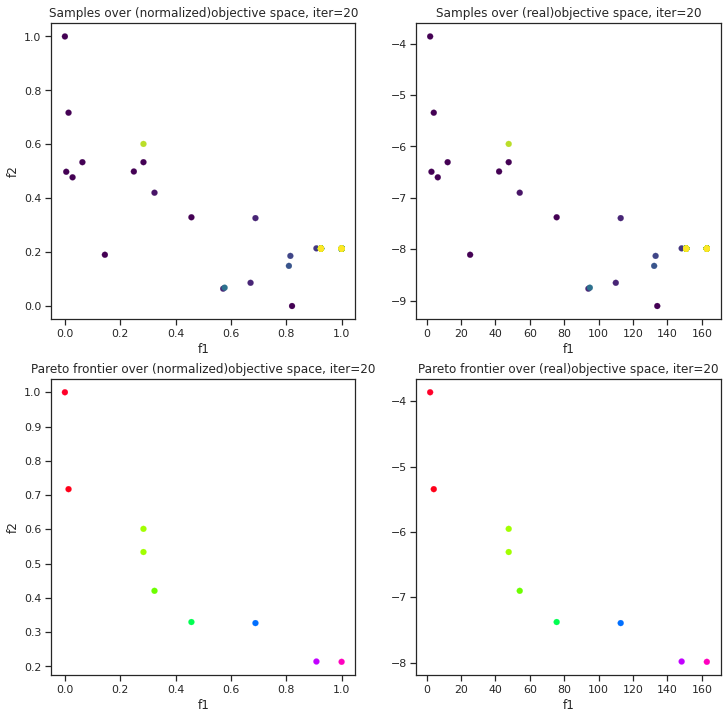

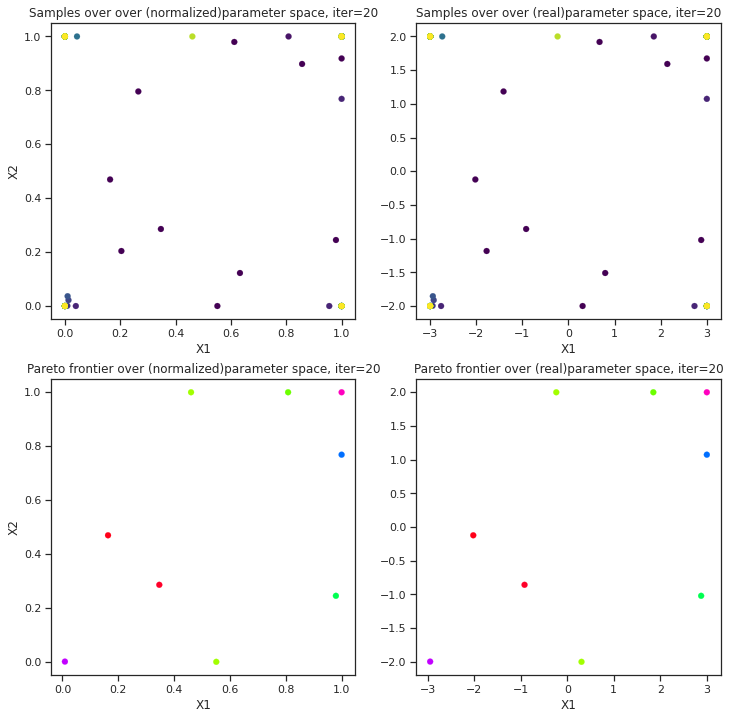

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #30
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #31
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #32
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #33
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #34
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #35
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #36
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #37
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #38
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


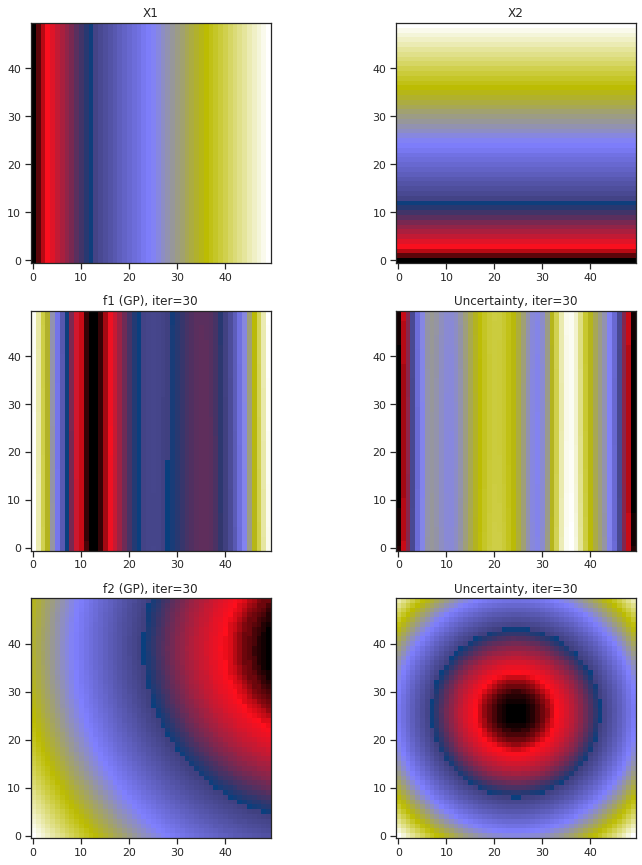

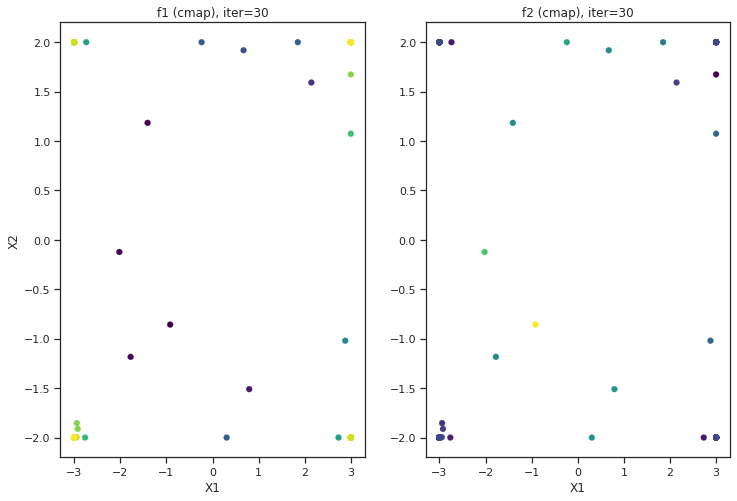

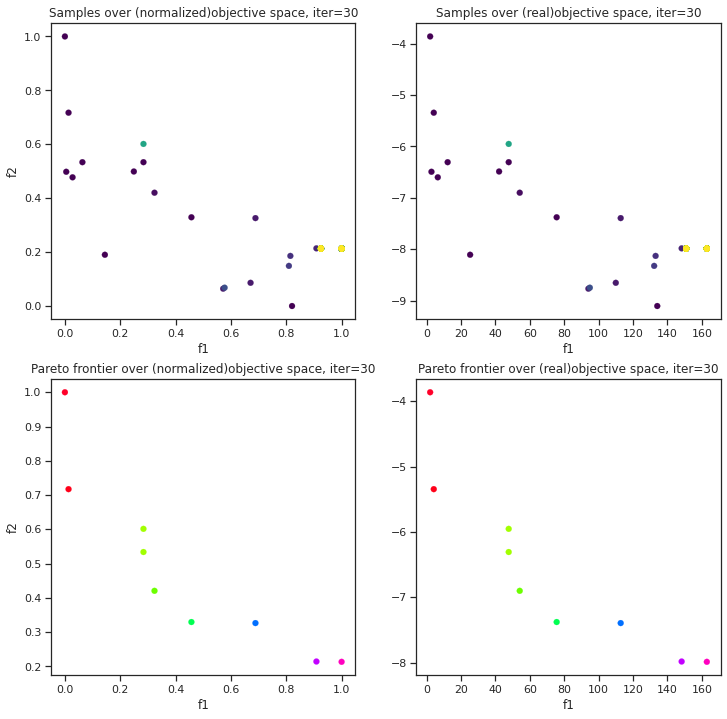

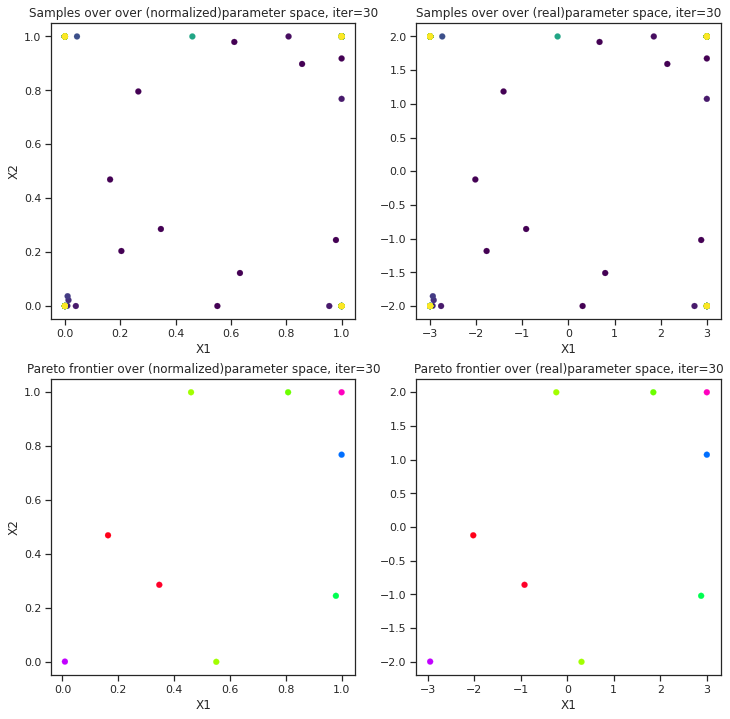

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #40
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #41
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #42
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #43
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #44
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #45
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #46
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #47
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #48
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #49
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


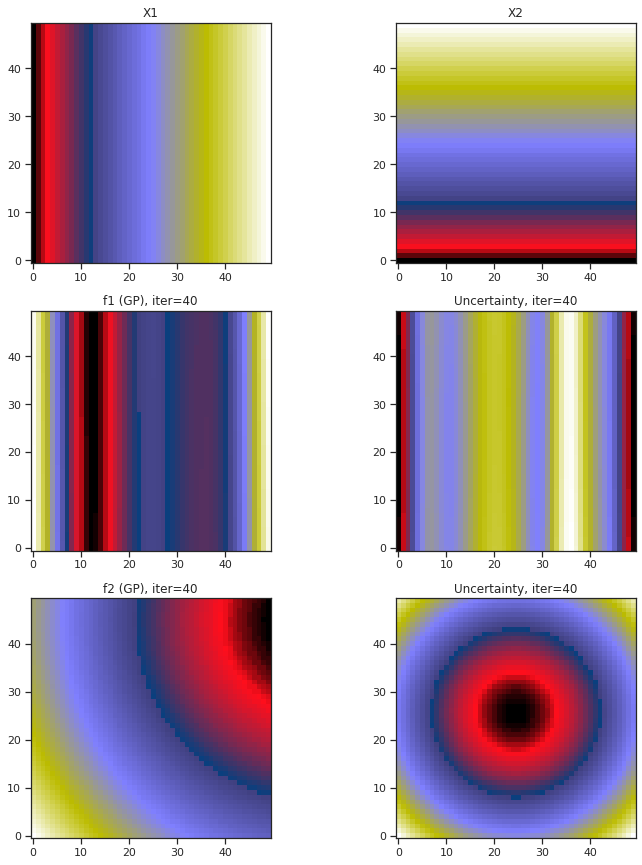

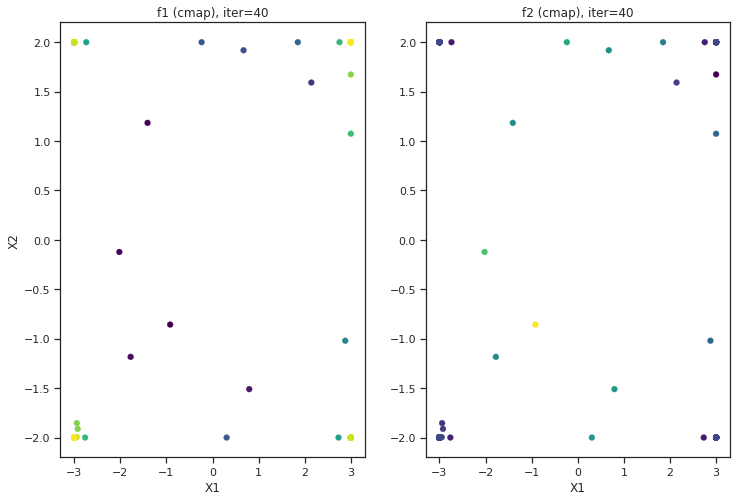

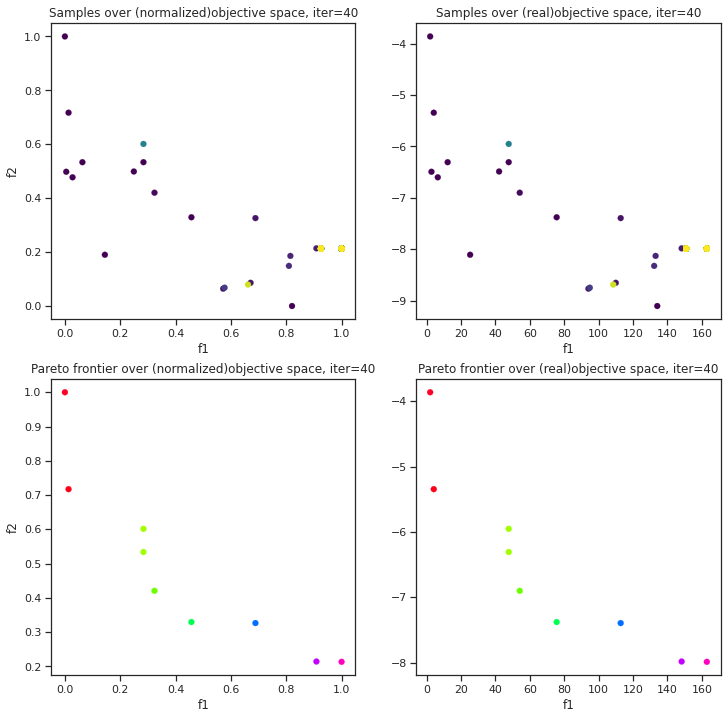

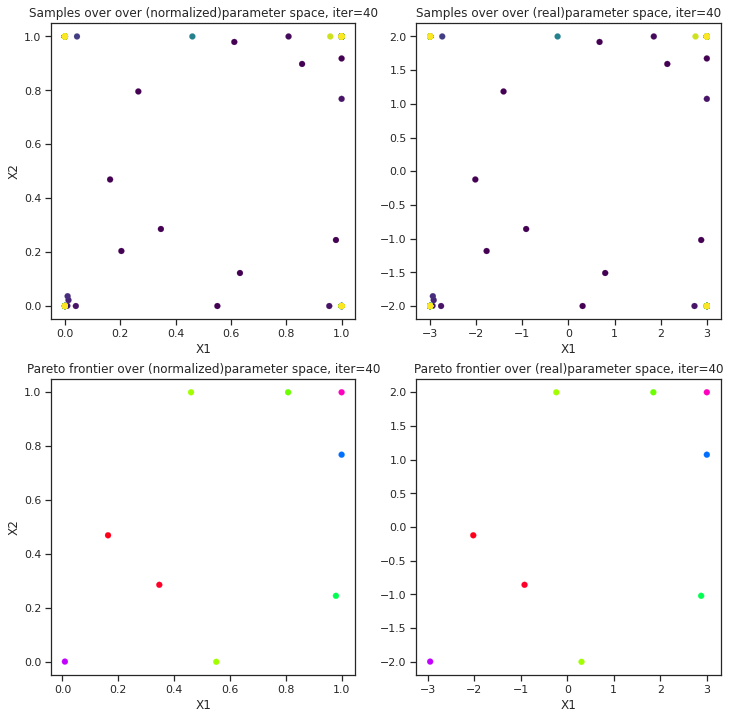

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #50
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #51
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #52
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #53
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #54
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #55
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval:

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #56
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #57
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #58
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #59
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #60
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Max. sampling reached, model stopped


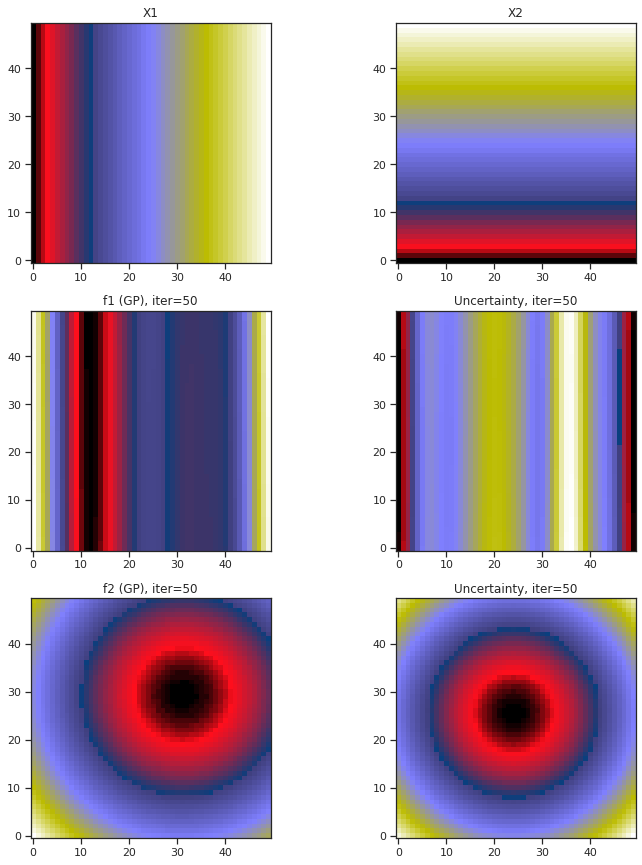

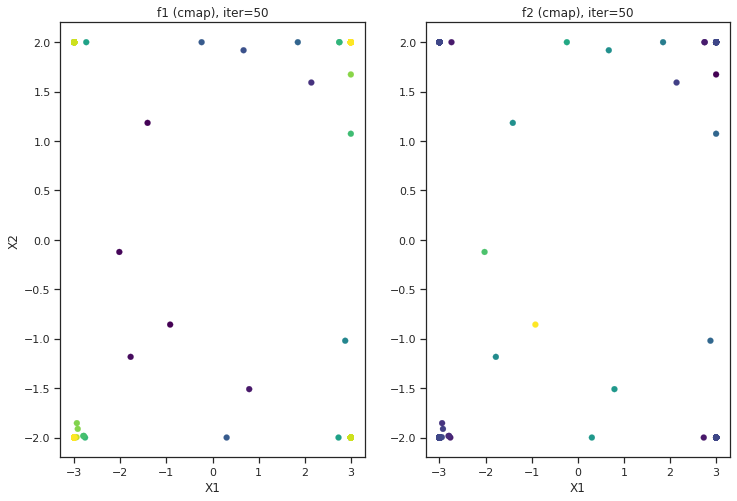

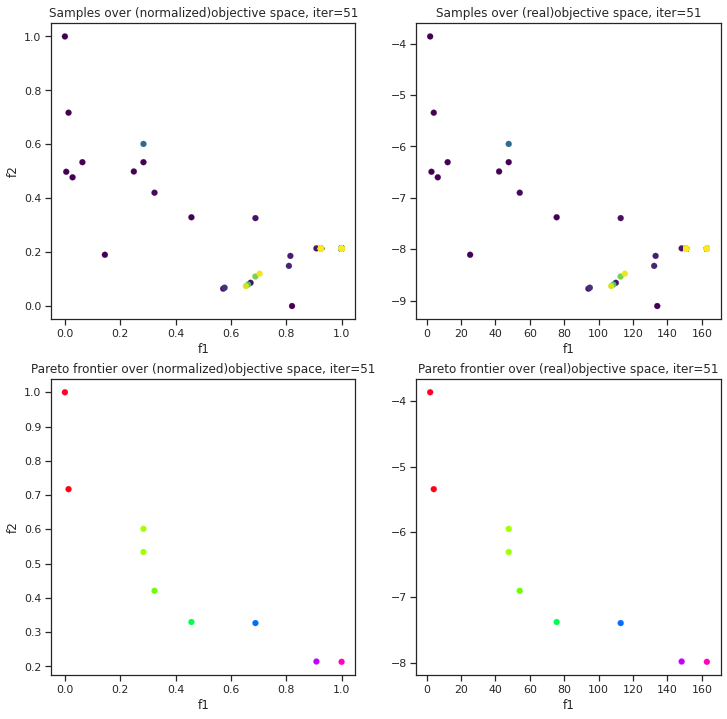

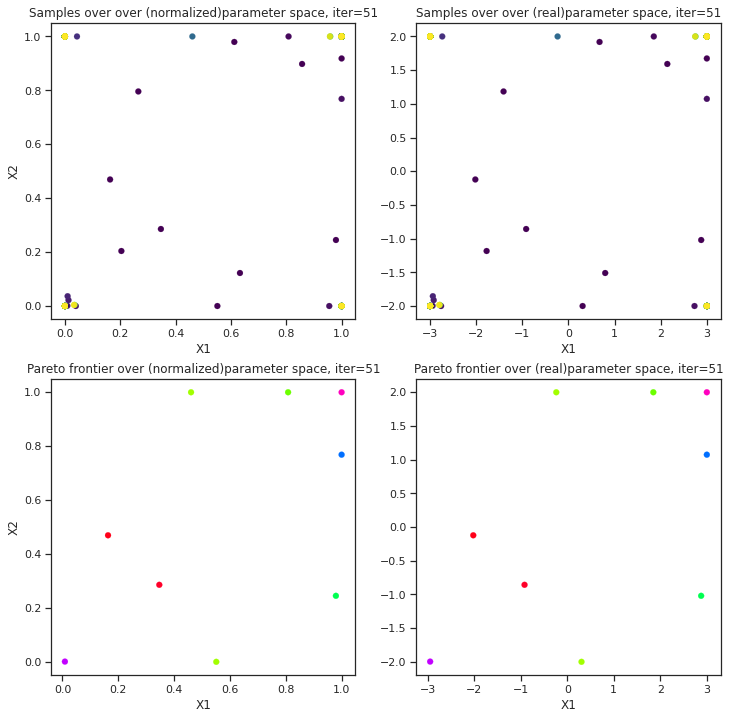

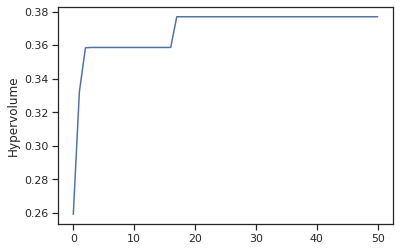

tensor(0.0213, dtype=torch.float64)
tensor(0.0063, dtype=torch.float64)
Run NSGA 2 for test function-- Without MOBO
n_gen |  n_eval |  n_nds  |     eps      |  indicator  
    1 |     100 |       8 |            - |            -
    2 |     200 |      14 |  0.191387722 |        ideal
    3 |     300 |      18 |  0.030616629 |        ideal
    4 |     400 |      26 |  0.137526363 |        ideal
    5 |     500 |      27 |  0.019992509 |        ideal
    6 |     600 |      34 |  0.011838254 |        ideal
    7 |     700 |      36 |  0.022968358 |        ideal
    8 |     800 |      46 |  0.013976818 |        ideal
    9 |     900 |      57 |  0.014916253 |        ideal
   10 |    1000 |      66 |  0.001367498 |            f
   11 |    1100 |      73 |  0.002086125 |            f
   12 |    1200 |      91 |  0.001344358 |            f
   13 |    1300 |     100 |  0.006443484 |        ideal
   14 |    1400 |     100 |  0.000854942 |            f
   15 |    1500 |     100 |  0.000907962 |  

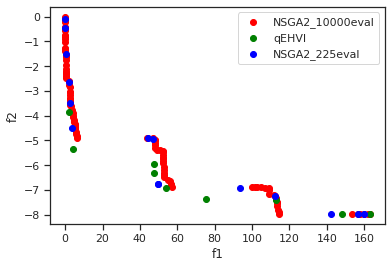

In [ ]:
tkwargs = {
    "dtype": to.double,
    "device": to.device("cuda" if to.cuda.is_available() else "cpu"),
}
BATCH_SIZE = 4

# List of options
# 'qEHVI'- Expected Hypervolume acquistion function
# 'qParEGO' -qParEGO
acquisition = 'qEHVI'

#List of control params- Temp, rho, h, deltaG
# Choose any two control params to create the parameter space considering the same order-
param1 = 'X1'
param2 = 'X2'
# Choose any two objectives to do MOO (MOBO)-
obj1 = 'f1'
obj2 = 'f2'

#List of toy test functions
# 'ZDT1'
# '6HC-IAP'- Six hump Camel back - Inversed Ackley's path
testfunction = '6HC-IAP'

# Input choice of problem- where it is minimization or maximization for objective 1 and 2 respectively
# List of options
# 'min'- Minimization
# 'max' -Maximization (default setting)
problem =['max','max']

#Define parameter space based on above choice of params (2D only)
num_rows =50
num = 10  # Starting samples
#N = (0.1 * num_rows ** 2) - num  # Maximum evaluations
#N = int(N)
N=50

if (testfunction =='ZDT1'):
    X1 = np.linspace(0, 1, num_rows)
    test_X1 = np.linspace(0, 1, num_rows)
    X2 = np.linspace(0, 1, num_rows)
    test_X2 = np.linspace(0, 1, num_rows)
elif (testfunction =='6HC-IAP'):
    X1 = np.linspace(-3, 3, num_rows)
    test_X1 = np.linspace(-3, 3, num_rows)
    X2 = np.linspace(-2, 2, num_rows)
    test_X2 = np.linspace(-2, 2, num_rows)
else:
    print("Invalid test function")

MOBO_testfunc(X1, X2, test_X1, test_X2, num_rows, N, BATCH_SIZE, param1, param2, obj1, obj2, acquisition, problem, testfunction)

<h1>Complex Physics based numerical model

Theoritical Model (2-4-6 KLGD for bulk PZO) as presented in the paper (link provided below)

Paper cite: https://arxiv.org/abs/2106.13096

Goal is to do optimize multiple objectives as Energy Storage and Loss (optimal balance between them) through MOBO over various control parameters as Temerature, partial O2 pressure, film thickness and ion formation energies.

<h1>Model

Develop physics based decision tree of target functions from loop structures

In [ ]:
def AFIloop(x, T, rho, h, dG, e):

    alpha_pt = 2.7969*10**5
    alpha_at = 4.8789*10**6
    Tp = 463.2
    Ta = 490
    beta_p = -3.825*10**8
    beta_a = -2.056*10**9
    xhi = 1.7754*10**10
    #xhi =0
    gamma_p = 3.126*10**9
    gamma_a = 2.28*10**10
    #gamma_p = 0
    #gamma_a = 0
    h=h*10**-9
    epsilon_b = 7
    l_da = 2*10**-9
    epsilon_d = 10
    epsilon_0 = 8.85*10**-12
    charge = 1.6*10**-19
    Z = [2, -2]
    n = [2, -2]
    Ai = [10**-18, 10**-18]
    kb = 1.38*10**-23
    delta_G = dG*charge
    U0= 5

    f1 = (1 + np.exp(delta_G / (kb * T)) * rho ** (1 / n[0])) ** (-1)
    f2 = (1 + np.exp(delta_G / (kb * T)) * rho ** (1 / n[1])) ** (-1)
    screen = ((l_da * h) / (epsilon_0 * ((epsilon_d * h) + (l_da * epsilon_b)))) * (((charge * Z[0] * f1) ** 2 / (Ai[0] * kb * T)) + ((charge * Z[1] * f2) ** 2 / (Ai[1] * kb * T)))
    Esi = (l_da / (epsilon_0 * ((epsilon_d * h) + (l_da * epsilon_b)))) * (((charge * Z[0] * f1) / Ai[0]) + ((charge * Z[1] * f1) / Ai[1]))
    # Ea = -(epsilon_d*U)/((epsilon_d*h) + (l_da*epsilon_b))
    # Eff = 0
    E = e / 10 ** -9
    Eff = Esi + E
    alpha_p = alpha_pt * (T - Tp)
    alpha_a = alpha_at * (T - Ta)
    alpha_pr = alpha_p * (1 + screen) + ((l_da * 0.5) / (epsilon_0 * ((epsilon_d * h) + (l_da * epsilon_b))))
    beta_pr = (1 + screen) * beta_p
    gamma_pr = (1 + screen) * gamma_p
    xhi_r = (1 + screen) * xhi
    En = alpha_pr * x[0] ** 2 + beta_pr * x[0] ** 4 + gamma_pr * x[0] ** 6 - Eff * x[0] + xhi_r * x[0] ** 2 * x[1] ** 2 + alpha_a * x[1] ** 2 + beta_a * x[1] ** 4 + gamma_a * x[1] ** 6

    return En


def objzeroloop(sol,e, T, rho):
    M=1
    p_mat = sol[313:437]
    E = e[313:437]

    slope_p = np.zeros((len(p_mat)-1))
    for i in range(0, len(p_mat)-1):
        p1 = p_mat[i]
        p2 = p_mat[i+1]
        slope_p[i]= (p1-p2)
    pks, pks_ht = find_peaks(slope_p, height=0.7*max(slope_p), distance=5)
    # number of peaks will determine the curve, for linear the slope is constant and wont have any peaks, for sigmoid 1 peaks, for wavy >1 peaks
    if (max(slope_p)<=1e-3) or ((max(slope_p)-min(slope_p))<1e-3): #linear, no sudden peaks
        index= range(0,len(pks))
        pks = np.delete(pks,index)

    npks = len(pks)
    if (npks > 2): #This to avoid in the loop structure when we sometimes get some impractical peaks due to convergence issues
        npks =2

    if (npks ==2):
        objeval = (npks + slope_p[pks[0]] + slope_p[pks[1]]) * M
    elif (npks==1):
        objeval = (npks + slope_p[pks[0]]) * M
    else:
        objeval = npks*M

    return objeval

def objoneloop(sol,e, T, rho):
    M=1
    # In some cases for the limit of field interval, loop does not form fully- to avoid calculation issue for S.E and E.L,
    # we add the 1st step of the other half cycle and calculate the area- if the loop is formed for the E interval,
    # we add negligible area for this additional step as p(t+1) - p(t-1) is negligible in that case (using quadrature method for numerical integration)
    p_mats = sol[313:437]
    p_mats = np.hstack((p_mats, sol[188]))
    p_matt = sol[188:312]
    p_matt = np.hstack((p_matt, sol[313]))
    Es = e[313:437]
    Es = np.hstack((Es, e[188]))
    Et = e[188:312]
    Et = np.hstack((Et, e[313]))
    Emax = max(e[188:437])
    Emin = min(e[188:437])
    a_ps = np.zeros((len(p_mats)-1))
    a_pt = np.zeros((len(p_matt) - 1))
    for i in range(0, len(p_mats)-1):
        p1s = p_mats[i]
        p2s = p_mats[i+1]
        e1s = Es[i]
        e2s = Es[i+1]
        p1t = p_matt[i]
        p2t = p_matt[i+1]
        e1t = Et[i]
        e2t = Et[i+1]
        a_ps[i] = 0.5*np.absolute(p1s-p2s)*np.absolute(e1s-e2s) + np.absolute(p1s-p2s)*np.absolute(e2s-Emin)
        a_pt[i] = 0.5*np.absolute(p2t-p1t)*np.absolute(e2t-e1t) + np.absolute(p2t-p1t)*np.absolute(e1t-Emin)

    As = sum(a_ps)
    At = sum(a_pt)
    #Find build-in and coercive field
    iminabsp_mats = np.argmin(np.absolute(p_mats))
    iminabsp_matt = np.argmin(np.absolute(p_matt))
    Ec1 = Et[iminabsp_matt]
    Ec2 = Es[iminabsp_mats]
    lshift = 0.5*(Ec1 + Ec2)
    lwidth = (Ec1 - Ec2)
    objeval1 = lshift
    if (lwidth<0):
        objeval2 =0
    else:
        objeval2 =lwidth

    return objeval1, objeval2

def objtwoloop(sol, diff_P, e,T,rho):
    M=1
    p_mat1 = sol[313:437]
    p_mat2 = np.flip(sol[188:312])
    E = e[313:437]
    d_p = (p_mat1 - p_mat2)
    zero_crossings = np.where(np.diff(np.sign(d_p)))[0]
    if (len(zero_crossings)==4):
        E_right= E[zero_crossings[1]+1]
        P_right = p_mat1[zero_crossings[1]+1]
        E_left = E[zero_crossings[2]]
        P_left = p_mat1[zero_crossings[2]]
        if ((p_mat1[zero_crossings[0]+1]>P_right) and (P_left>p_mat1[zero_crossings[3]])):
            E_length = np.absolute(E_right-E_left)
            P_length = np.absolute(P_right-P_left)
            loop_dist = np.sqrt(E_length**2 + P_length**2)
            objeval = loop_dist*M
        else:
            objeval = 0 #Avoiding cal loop distance for loops with some impractical spikes- May be better way to compute (will visit in future)
    else:
        objeval =0

    return objeval

def objnumloop(sol, diff_P, e):
    M=1
    d_p = diff_P[313:437] #Last half cycle
    pks, pks_ht = find_peaks(d_p, height=0.7*max(d_p), distance=5)
    if (max(d_p)<=1e-3) or ((max(d_p)-min(d_p))<1e-3):
        index= range(0,len(pks))
        pks = np.delete(pks,index)

    npks = len(pks)
    if (npks > 2): #This to avoid in the loop structure when we sometimes get some impractical peaks due to convergence issues
        npks =2

    objeval1 = npks*M

    return objeval1

def calstorage(sol, e, T, rho):
    p_mats = sol[313:437]
    p_mats = np.hstack((p_mats, sol[188]))
    p_matt = sol[188:312]
    p_matt = np.hstack((p_matt, sol[313]))
    Es = e[313:437]
    Es = np.hstack((Es, e[188]))
    Et = e[188:312]
    Et = np.hstack((Et, e[313]))
    Emax = max(e[188:437])
    Emin = min(e[188:437])
    a_ps = np.zeros((len(p_mats) - 1))
    a_pt = np.zeros((len(p_matt) - 1))
    for i in range(0, len(p_mats) - 1):
        p1s = p_mats[i]
        p2s = p_mats[i + 1]
        e1s = Es[i]
        e2s = Es[i + 1]
        p1t = p_matt[i]
        p2t = p_matt[i + 1]
        e1t = Et[i]
        e2t = Et[i + 1]
        a_ps[i] = 0.5 * np.absolute(p1s - p2s) * np.absolute(e1s - e2s) + np.absolute(p1s - p2s) * np.absolute(e2s - Emin)
        a_pt[i] = 0.5 * np.absolute(p2t - p1t) * np.absolute(e2t - e1t) + np.absolute(p2t - p1t) * np.absolute(e1t - Emin)

    As = sum(a_ps)
    At = sum(a_pt)
    Al = At-As
    if (Al < -1e3):  # To avoid numerical issue for any impractical peaks or loops not formed for the given E interval, making Stored energy >> Total energy
        As = -1
        Al = -1
    return As, Al

def funoptimize(T, rho, h, dG, e):

    niter=len(e)
    sol=np.zeros(niter)
    diff_P=np.zeros(niter)
    for j in range(0, niter):

        P_ini= np.matrix([[-1, -0.5, -0.5], [1, 0.5, 0.5]])
        A_ini = np.matrix([[0, -0.5, 0.5], [0, 0.5, -0.5]])
        s_left =np.zeros((len(np.transpose(P_ini)),2))
        s_right =np.zeros((len(np.transpose(P_ini)),2))
        for jj in range(0, len(np.transpose(P_ini))):
            x_left = [P_ini[0,jj], A_ini[0,jj]]
            x_right = [P_ini[1,jj], A_ini[1,jj]]
            s_left[jj,:] = optimize.fmin(AFIloop, x_left, args=(T, rho, h, dG, e[j]), disp=0)
            s_right[jj,:] = optimize.fmin(AFIloop, x_right, args=(T, rho, h, dG, e[j]), disp=0)

        diff_P[j] = np.absolute((max(s_right[:, 0])) - (min(s_left[:, 0])))
             #rightmost and leftmost minima found
        if (j==0):
            sol[0] = min(s_left[:,0])

        elif (j>0):
            if (e[j]< e[j-1]): #sweeping high positive to negative
                sol[j] = max(s_right[:,0])
            else: #sweeping high negative to positive
                sol[j] = min(s_left[:,0])

    objeval1 = objnumloop(sol, diff_P, e) #Define for number of loops
    nloop = objeval1
    # State 2 phase analysis, given we know the Stage 1- no. of loops
    if (nloop == 0):
        objeval2 = objzeroloop(sol,e, T, rho) #Define non-linearity of hysteresis curve for zero loop
        objeval3 = objeval2
    elif (nloop == 1):
        objeval2, objeval3 = objoneloop(sol,e, T, rho) #Define stored energy and shift of loop
        #objeval3 = (objeval1/2) + objeval3 # Centering the objective within the range of one loop- left and right of the center means negative and positive shifts shift
    elif (nloop == 2):
        objeval2 = objtwoloop(sol, diff_P, e,T,rho) #Define measure of separation between the loops
        objeval3 = objeval2
    #objeval11 = objeval1 + objeval2 # For storage in one loop
    #objeval12 = objeval1 + objeval3 # For loop shift/width in one loop

    # Calculate Energy storage and Loss for all regions-
    ES, EL = calstorage(sol, e, T, rho)
    return sol, objeval1, objeval2, objeval3, ES, EL

################### Plotting functions#################################

def plot_hysteresis(fig, ax, T, rho, E, P, tp, r, t1, t2, linewidth, markersize, fontsize):
    ax[len(T) - 1 - t1, t2].plot(E, P, 'o-', linewidth=linewidth, markersize=markersize)
    ax[len(T) - 1 - t1, t2].axis('off')
    ax[len(T) - 1 - t1, t2].set_title("T=" + str(tp) + ", rho=" + str(r), fontsize=fontsize)
    return fig, ax

def plot_Storage_Loss(Storage, Loss, n_rows, tog_num, A):
    fig2, (ax2, ax3) = plt.subplots(1, 2, figsize=(15, 7))
    ax2.imshow(Storage, origin='bottom', cmap='Reds')
    ax3.imshow(Loss, origin='bottom', cmap='Reds')
    if (n_rows<=tog_num):
        for i in range(0, Storage.shape[0]):
            for j in range(0, Storage.shape[1]):
                c1 = np.around((Storage[j, i]), decimals=2)
                c2 = np.around((Loss[j, i]), decimals=2)
                ax2.text(i, j, str(c1), va='center', ha='center')
                ax3.text(i, j, str(c2), va='center', ha='center')

    ax2.set_title('Storage, A= ' + str(A))
    ax3.set_title('Loss, A= ' + str(A))
    plt.show()

def plot_phase(T, rho, phaseS1, sphasenoloop, sphaseoneloopc1, sphaseoneloopc2, sphasetwoloop, n_rows, tog_num):
    fig3, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 6))
    ax1.imshow(T, origin='bottom', cmap='PuBuGn')
    ax2.imshow(rho, origin='bottom', cmap='PuBuGn')
    ax3.imshow(phaseS1, origin='bottom', cmap='PuBuGn')

    if (n_rows <= tog_num):
        for i in range(0, phaseS1.shape[0]):
            for j in range(0, phaseS1.shape[1]):
                c11 = int(phaseS1[j, i])
                ax3.text(i, j, str(c11), color='red', va='center', ha='center')


    ax1.set_title('Temp K')
    ax2.set_title('rho')
    ax3.set_title('func eval (Stage1-# loops)')
    plt.show()

    # Plot for Stage 2- Phase diag for individual phase in Stage 1
    fig4, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(15, 7))
    ax1.imshow(sphasenoloop, origin='bottom', cmap='Purples')
    ax2.imshow(sphaseoneloopc1, origin='bottom', cmap='Blues')
    ax3.imshow(sphaseoneloopc2, origin='bottom', cmap='Blues')
    ax4.imshow(sphasetwoloop, origin='bottom', cmap='Greens')

    if (n_rows <= tog_num):
        for i in range(0, phaseS1.shape[0]):
            for j in range(0, phaseS1.shape[1]):

                c11 = sphasenoloop[j, i]
                c12 = sphaseoneloopc1[j, i]
                c13 = sphaseoneloopc2[j, i]
                c14 = sphasetwoloop[j, i]
                if (c11 > np.min(sphasenoloop)):
                    c11 = np.around(c11, decimals=2)
                    ax1.text(i, j, str(c11), color='red', va='center', ha='center')
                if (c12 > np.min(sphaseoneloopc1)):
                    c12 = np.around(c12, decimals=2)
                    ax2.text(i, j, str(c12), color='red', va='center', ha='center')
                if (c13 > np.min(sphaseoneloopc2)):
                    c13 = np.around(c13, decimals=2)
                    ax3.text(i, j, str(c13), color='red', va='center', ha='center')
                if (c14 > np.min(sphasetwoloop)):
                    c14 = np.around(c14, decimals=2)
                    ax4.text(i, j, str(c14), color='red', va='center', ha='center')

    ax1.set_title('func eval (Stage2-no loop)')
    ax2.set_title('func eval (Stage2-one loop: shift)')
    ax3.set_title('func eval (Stage2-one loop: width)')
    ax4.set_title('func eval (Stage2-two loop)')
    plt.show()

############### Function to configure phase diag matrix#############################

def phase_matrix(T, rho, objphaseS1A, objphaseS2C1A, objphaseS2C2A, num_rows, toggle_num_dim):
    M=10
    maxobjphase = np.max(objphaseS1A, axis=1)  # store obj func for phase classifies # loops
    objS2C1 = np.zeros(len(maxobjphase))
    objS2C2 = np.zeros(len(maxobjphase))
    for ii in range(0, len(maxobjphase)):
        cand = [k for k, j in enumerate(objphaseS1A[ii, :]) if j == maxobjphase[ii]]
        o1 = np.zeros(len(cand))
        o2 = np.zeros(len(cand))
        for jj in range(0, len(cand)):
            o1[jj] = objphaseS2C1A[ii, cand[jj]]
            o2[jj] = objphaseS2C2A[ii, cand[jj]]

        objS2C1[ii] = max(o1) * M
        #cd1 = np.argmax(o1)
        objS2C2[ii] = np.sign(min(o2)) * min(np.absolute(o2)) * M
        #cd2 = np.argmin(np.absolute(o2))

    sphasenoloop = np.zeros(len(maxobjphase)) + np.min(objS2C1) - 0.1 * (np.max(objS2C1) - np.min(objS2C1))
    sphaseoneloopc1 = np.zeros(len(maxobjphase)) + np.min(objS2C1) - 0.1 * (np.max(objS2C1) - np.min(objS2C1))
    sphaseoneloopc2 = np.zeros(len(maxobjphase)) + np.min(objS2C2) - 0.1 * (np.max(objS2C2) - np.min(objS2C2))
    sphasetwoloop = np.zeros(len(maxobjphase)) + np.min(objS2C1) - 0.1 * (np.max(objS2C1) - np.min(objS2C1))

    # Creating subspace matrix- Putting fake values for the other phases different than the subspace
    for ii in range(0, len(maxobjphase)):
        if (maxobjphase[ii] == 0):
            sphasenoloop[ii] = objS2C1[ii]
        if (maxobjphase[ii] == 1):
            sphaseoneloopc1[ii] = objS2C1[ii]
            sphaseoneloopc2[ii] = objS2C2[ii]
        if (maxobjphase[ii] == 2):
            sphasetwoloop[ii] = objS2C1[ii]

    maxobjphase = np.reshape(maxobjphase, (len(T), len(T)))
    sphasenoloop = np.reshape(sphasenoloop, (len(T), len(T)))
    sphaseoneloopc1 = np.reshape(sphaseoneloopc1, (len(T), len(T)))
    sphaseoneloopc2 = np.reshape(sphaseoneloopc2, (len(T), len(T)))
    sphasetwoloop = np.reshape(sphasetwoloop, (len(T), len(T)))

    # Plot full objective grid image defined from hysteresis loops- classifies #of loops, other criteria for each loops
    # Plot Stage 2 decision tree phases, each for no loop, one loop and two loops

    plot_phase(T, rho, maxobjphase, sphasenoloop, sphaseoneloopc1, sphaseoneloopc2, sphasetwoloop, num_rows,
               toggle_num_dim)

    return maxobjphase, sphasenoloop, sphaseoneloopc1, sphaseoneloopc2, sphasetwoloop


<h1>Define Field process 

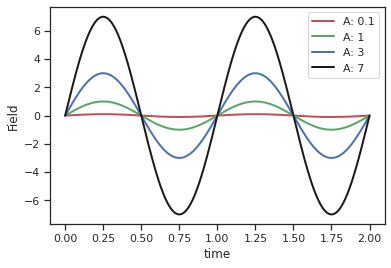

In [ ]:
#Define field process
time_vec = np.linspace(0, 2, 500)
A = [0.1, 1, 3, 7]
color=['r','g','b','k']
for proc in range(0, len(A)):
    E = A[proc] * np.sin(2 * np.pi * time_vec)
    cs =color[proc]
    plt.plot(time_vec, E, cs, linewidth=2, label = "A: "+str(A[proc]))

plt.xlabel("time")
plt.ylabel("Field")
plt.legend(loc="best")
plt.show()

<h1>Generate a sample hysteresis loop

2


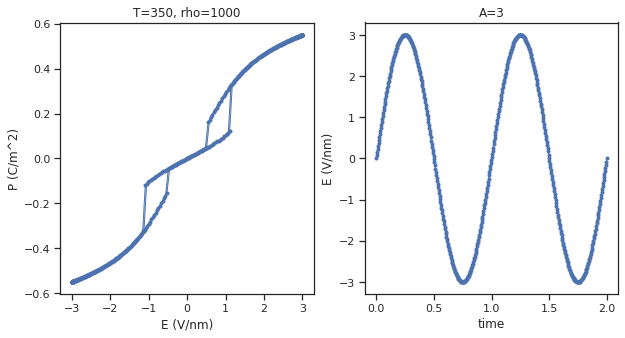

In [ ]:
# Loop Structure Analysis, for a fixed parameter space of T and rho, given a fixed amplitude of field.
#Change the amplitude to get better visualization of the loops if required.
time_vec = np.linspace(0, 2, 500)
A = 3
E = A * np.sin(2 * np.pi * time_vec)
T = 350
rho = 10**3
Pmat, objeval, objeval2, objeval3, ES, EL = funoptimize(T, rho, 5, 0.2, E)
print(objeval)


# Plot Hysteresis Loop
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].plot(E, Pmat, 'o-', linewidth=1, markersize=3)
ax[0].set_xlabel('E (V/nm)')
ax[0].set_ylabel('P (C/m^2)')
ax[0].set_title("T=" + str(T) +", rho=" +str(rho))
ax[1].plot(time_vec, E, 'o-', linewidth=1, markersize=3)
ax[1].set_xlabel('time')
ax[1].set_ylabel('E (V/nm)')
ax[1].set_title("A=" + str(A))
plt.show()
    

<h1> Generate phase diagrams-

physics-driven decision tree based target functions generated from loop structures.

Here, we develop phases with full grid evaluations

$h=50 nm$

$Temp=[250,300,350,400,450,500,550]$

$rho=[10^2,10^3,10^4,10^5,10^6,10^7,10^8]$

Process:1; Analysis:1
Process:1; Analysis:2
Process:1; Analysis:3
Process:1; Analysis:4
Process:1; Analysis:5
Process:1; Analysis:6
Process:1; Analysis:7
Process:1; Analysis:8
Process:1; Analysis:9
Process:1; Analysis:10
Process:1; Analysis:11
Process:1; Analysis:12
Process:1; Analysis:13
Process:1; Analysis:14
Process:1; Analysis:15
Process:1; Analysis:16
Process:1; Analysis:17
Process:1; Analysis:18
Process:1; Analysis:19
Process:1; Analysis:20
Process:1; Analysis:21
Process:1; Analysis:22
Process:1; Analysis:23
Process:1; Analysis:24
Process:1; Analysis:25
Process:1; Analysis:26
Process:1; Analysis:27
Process:1; Analysis:28
Process:1; Analysis:29
Process:1; Analysis:30
Process:1; Analysis:31
Process:1; Analysis:32
Process:1; Analysis:33
Process:1; Analysis:34
Process:1; Analysis:35
Process:1; Analysis:36
Process:1; Analysis:37
Process:1; Analysis:38
Process:1; Analysis:39
Process:1; Analysis:40
Process:1; Analysis:41
Process:1; Analysis:42
Process:1; Analysis:43
Process:1; Analysis:

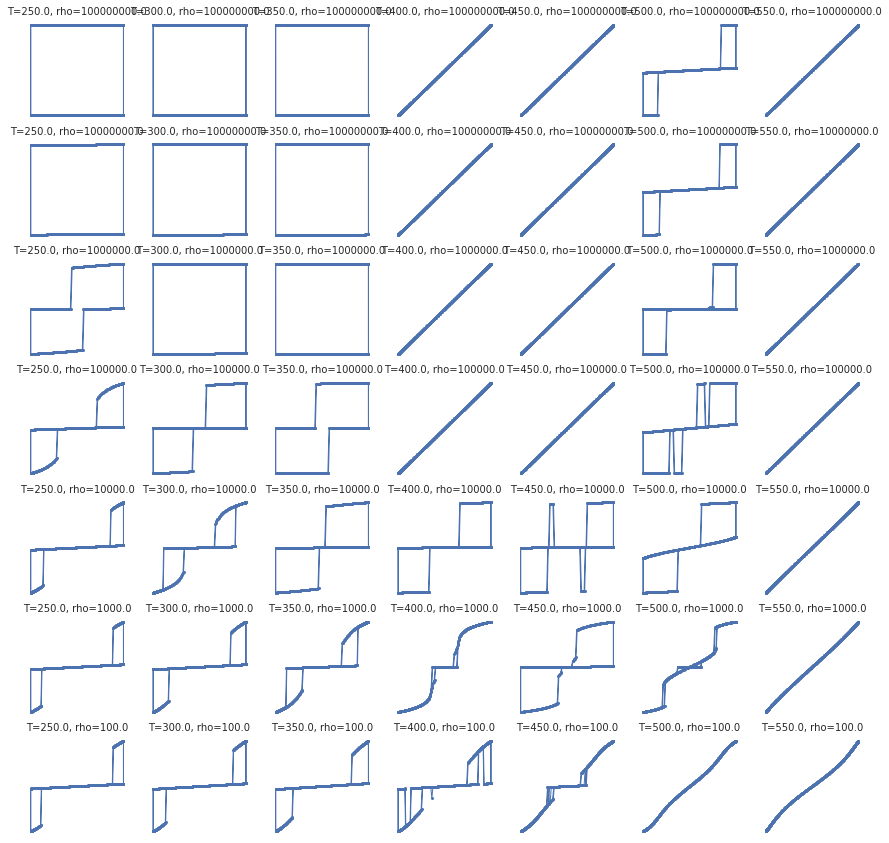

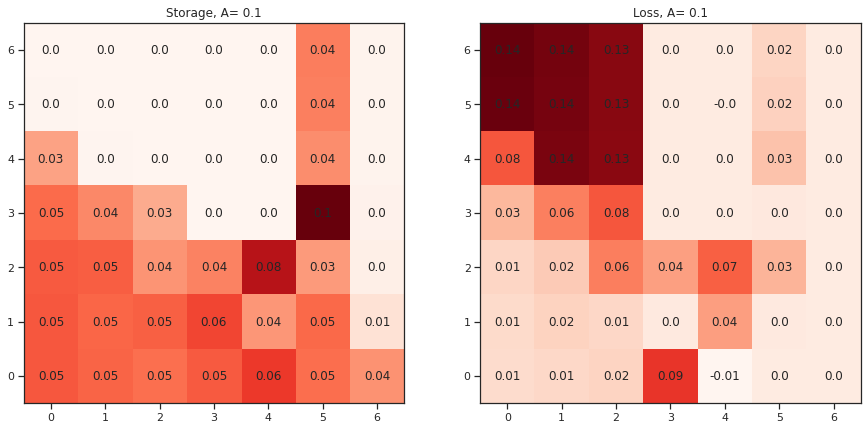

Process:2; Analysis:1
Process:2; Analysis:2
Process:2; Analysis:3
Process:2; Analysis:4
Process:2; Analysis:5
Process:2; Analysis:6
Process:2; Analysis:7
Process:2; Analysis:8
Process:2; Analysis:9
Process:2; Analysis:10
Process:2; Analysis:11
Process:2; Analysis:12
Process:2; Analysis:13
Process:2; Analysis:14
Process:2; Analysis:15
Process:2; Analysis:16
Process:2; Analysis:17
Process:2; Analysis:18
Process:2; Analysis:19
Process:2; Analysis:20
Process:2; Analysis:21
Process:2; Analysis:22
Process:2; Analysis:23
Process:2; Analysis:24
Process:2; Analysis:25
Process:2; Analysis:26
Process:2; Analysis:27
Process:2; Analysis:28
Process:2; Analysis:29
Process:2; Analysis:30
Process:2; Analysis:31
Process:2; Analysis:32
Process:2; Analysis:33
Process:2; Analysis:34
Process:2; Analysis:35
Process:2; Analysis:36
Process:2; Analysis:37
Process:2; Analysis:38
Process:2; Analysis:39
Process:2; Analysis:40
Process:2; Analysis:41
Process:2; Analysis:42
Process:2; Analysis:43
Process:2; Analysis:

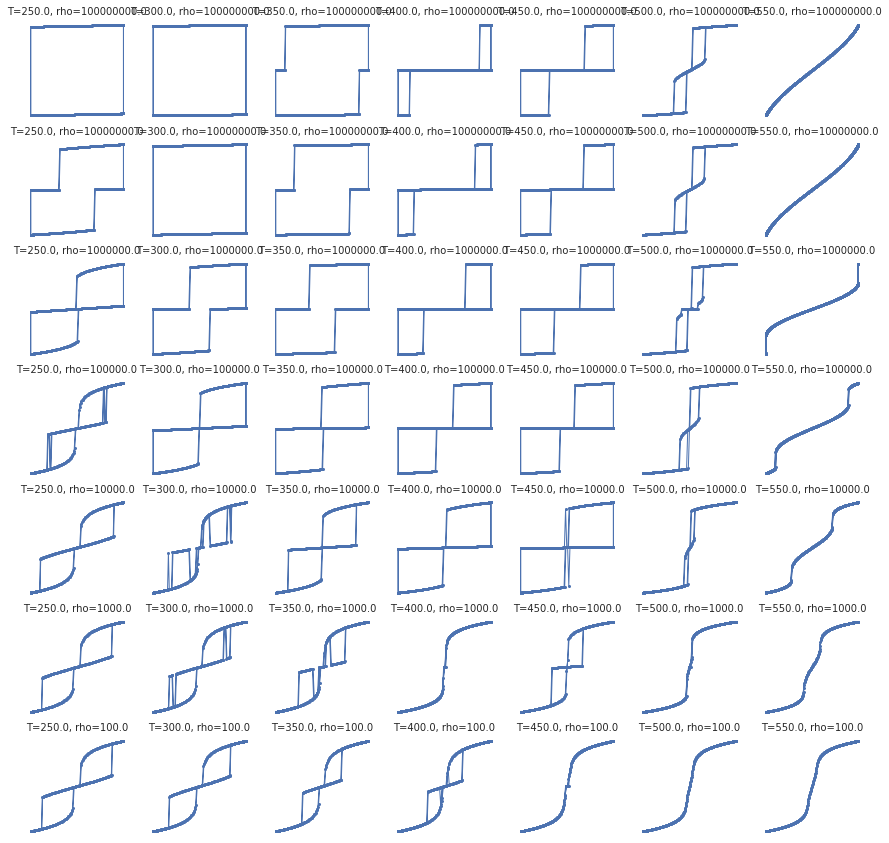

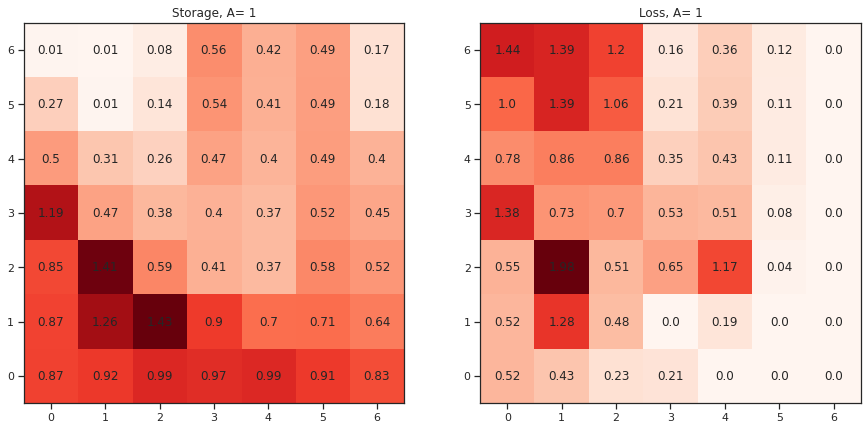

Process:3; Analysis:1
Process:3; Analysis:2
Process:3; Analysis:3
Process:3; Analysis:4
Process:3; Analysis:5
Process:3; Analysis:6
Process:3; Analysis:7
Process:3; Analysis:8
Process:3; Analysis:9
Process:3; Analysis:10
Process:3; Analysis:11
Process:3; Analysis:12
Process:3; Analysis:13
Process:3; Analysis:14
Process:3; Analysis:15
Process:3; Analysis:16
Process:3; Analysis:17
Process:3; Analysis:18
Process:3; Analysis:19
Process:3; Analysis:20
Process:3; Analysis:21
Process:3; Analysis:22
Process:3; Analysis:23
Process:3; Analysis:24
Process:3; Analysis:25
Process:3; Analysis:26
Process:3; Analysis:27
Process:3; Analysis:28
Process:3; Analysis:29
Process:3; Analysis:30
Process:3; Analysis:31
Process:3; Analysis:32
Process:3; Analysis:33
Process:3; Analysis:34
Process:3; Analysis:35
Process:3; Analysis:36
Process:3; Analysis:37
Process:3; Analysis:38
Process:3; Analysis:39
Process:3; Analysis:40
Process:3; Analysis:41
Process:3; Analysis:42
Process:3; Analysis:43
Process:3; Analysis:

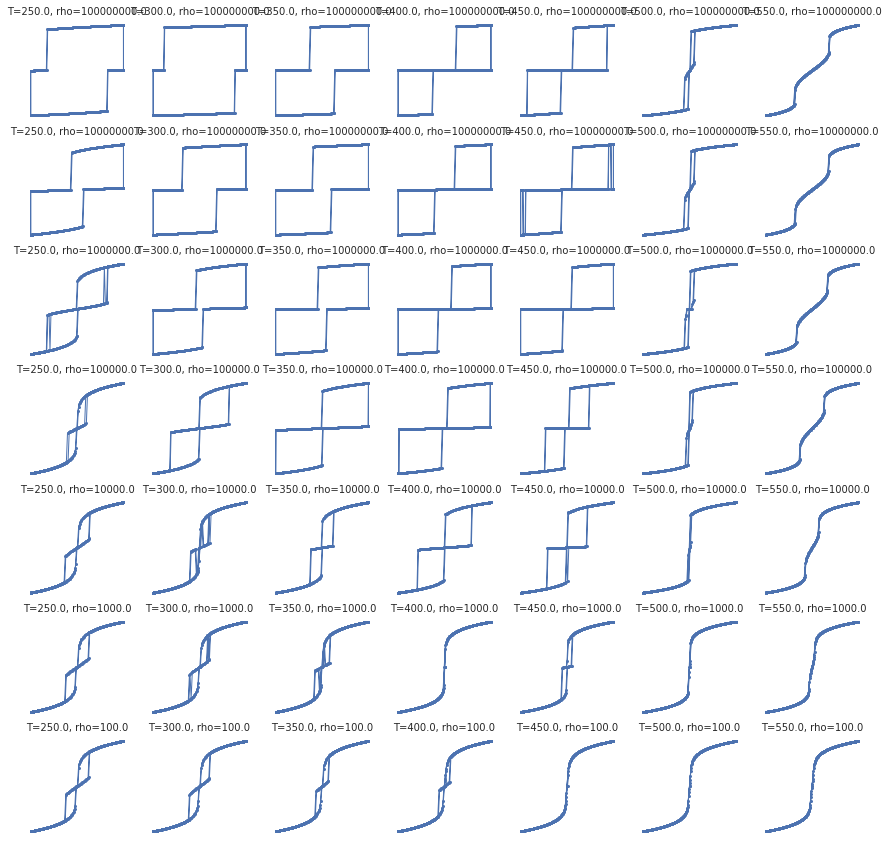

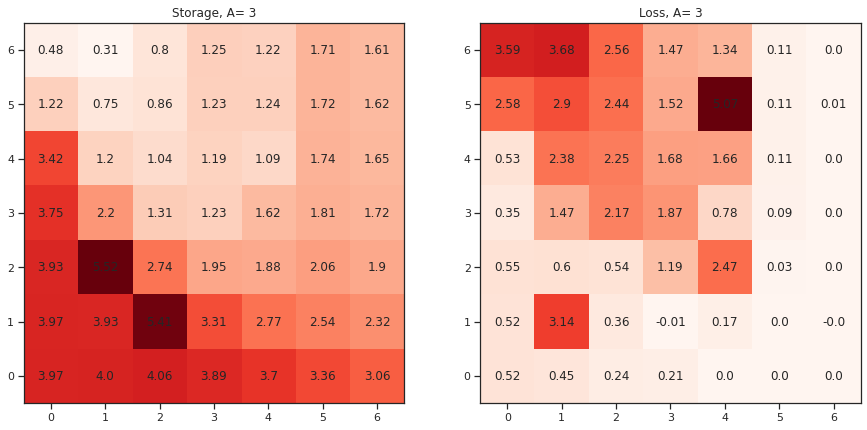

Process:4; Analysis:1
Process:4; Analysis:2
Process:4; Analysis:3
Process:4; Analysis:4
Process:4; Analysis:5
Process:4; Analysis:6
Process:4; Analysis:7
Process:4; Analysis:8
Process:4; Analysis:9
Process:4; Analysis:10
Process:4; Analysis:11
Process:4; Analysis:12
Process:4; Analysis:13
Process:4; Analysis:14
Process:4; Analysis:15
Process:4; Analysis:16
Process:4; Analysis:17
Process:4; Analysis:18
Process:4; Analysis:19
Process:4; Analysis:20
Process:4; Analysis:21
Process:4; Analysis:22
Process:4; Analysis:23
Process:4; Analysis:24
Process:4; Analysis:25
Process:4; Analysis:26
Process:4; Analysis:27
Process:4; Analysis:28
Process:4; Analysis:29
Process:4; Analysis:30
Process:4; Analysis:31
Process:4; Analysis:32
Process:4; Analysis:33
Process:4; Analysis:34
Process:4; Analysis:35
Process:4; Analysis:36
Process:4; Analysis:37
Process:4; Analysis:38
Process:4; Analysis:39
Process:4; Analysis:40
Process:4; Analysis:41
Process:4; Analysis:42
Process:4; Analysis:43
Process:4; Analysis:

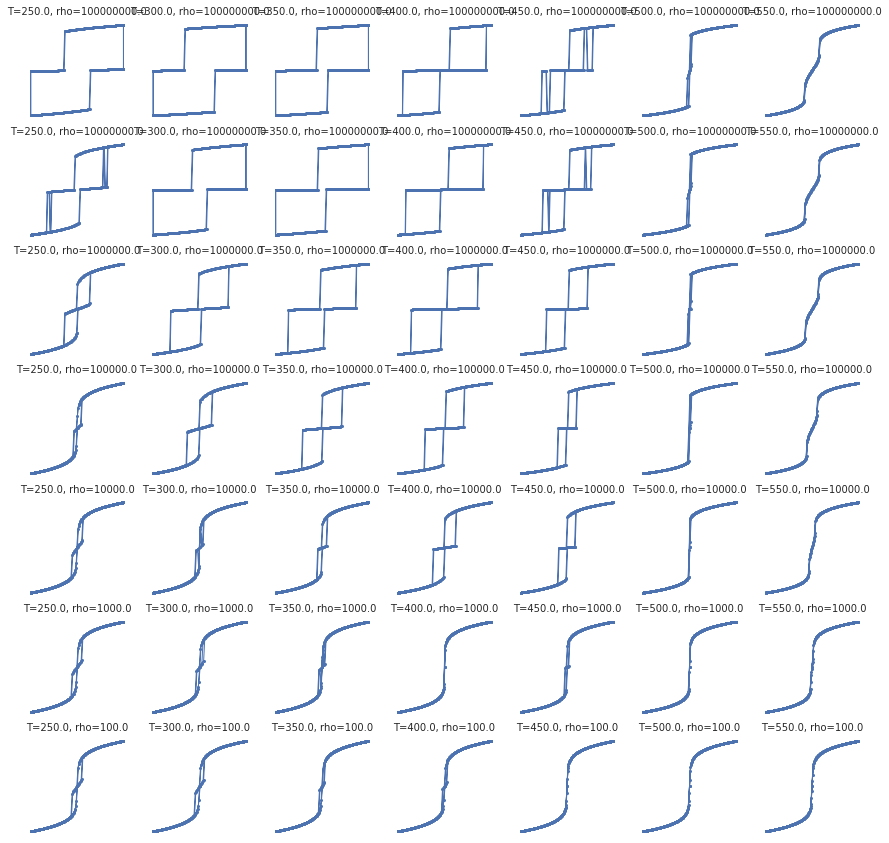

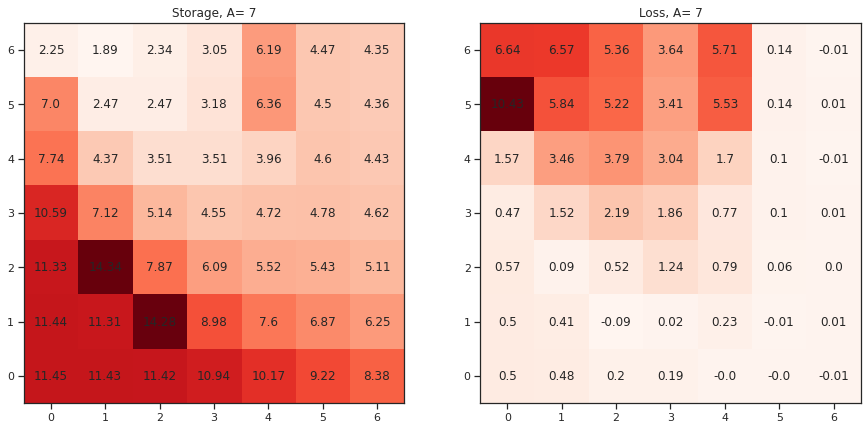

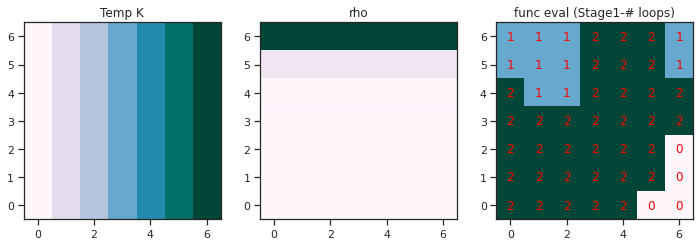

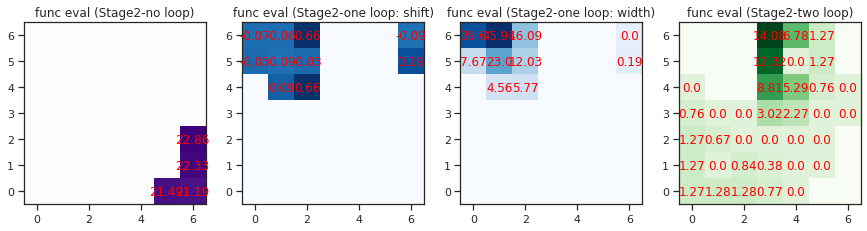

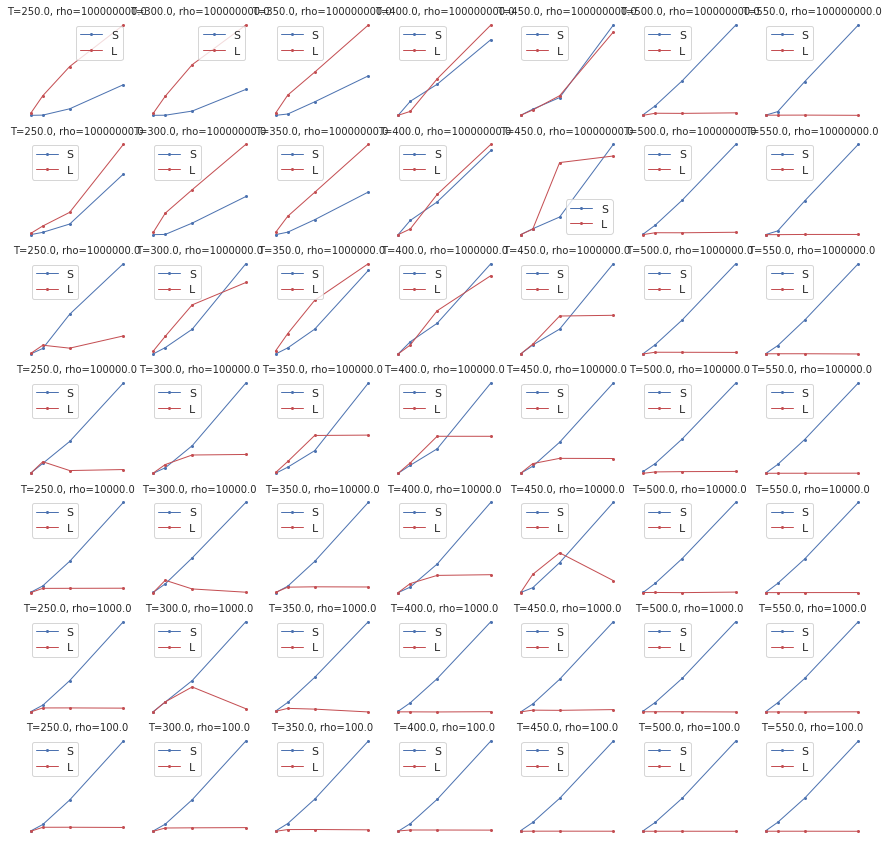

In [ ]:
time_vec = np.linspace(0, 2, 500)
A = [0.1, 1, 3, 7]

num_rows =7
max_hysplot_dim =10 # With denser maps, the hysteresis loop grid image will get very messy and thus redundant to plot. Thus, we toogle off the full hysteresis plot if the dim>10. Instead we can plot hysteresis loop separately in the previous code segment
toggle_num_dim =10  # With denser maps, the numbers in the heatmap of phase diag will get very messy and thus redundant to plot. Thus, we toogle off if the dim>10. We can get good visualization with color intensity with denser maps
Temp = np.linspace(250, 550, num_rows)
n= np.linspace(2, 8, num_rows)
#n=int(n)
rho = np.zeros(len(n))
for i in range(0, len(n)):
    rho[i] = 10**(n[i])

#Temp=[500, 550]
#rho=[10**7, 10**8]

objphaseS1 = np.zeros((len(Temp), len(Temp)))
objphaseS1A =np.zeros((len(Temp)**2,len(A)))
objphasesS2C1 = np.zeros((len(Temp), len(Temp)))
objphasesS2C2 = np.zeros((len(Temp), len(Temp)))
objphaseS2C1A =np.zeros((len(Temp)**2,len(A)))
objphaseS2C2A =np.zeros((len(Temp)**2,len(A)))
Storage = np.zeros((len(Temp), len(Temp)))
StorageA =np.zeros((len(Temp)**2,len(A)))
Loss = np.zeros((len(Temp), len(Temp)))
LossA =np.zeros((len(Temp)**2,len(A)))
Temp,rho = np.meshgrid(Temp, rho)


for proc in range(0, len(A)):
    E = A[proc] * np.sin(2 * np.pi * time_vec)
    m=0
    if (num_rows<=max_hysplot_dim):
        fig1, ax1 = plt.subplots(len(Temp), len(Temp), figsize=(15,15))

    for t1, (x1, x2) in enumerate(zip(Temp, rho)):
        for t2, (xx1, xx2) in enumerate(zip(x1, x2)):
            m=m+1
            print("Process:" +str(proc+1)+"; Analysis:"+str(m))
            Pmat, objeval, objeval2, objeval3, ES, EL= funoptimize(xx1, xx2, 50, 0.2, E)
            objphaseS1[t1, t2] = objeval #Stage 1 valuation
            objphasesS2C1[t1, t2] = objeval2 #Stage 2 -Criteria 1: One loop- Storage Energy
            objphasesS2C2[t1, t2] = objeval3 #Stage 2- Criteria 2: One loop- Loop Shift/Width
            Storage[t1, t2] = ES
            Loss[t1, t2] =EL
            if (num_rows<=max_hysplot_dim):
            #Plot for hysteresis loops at each region for each A
                fig1, ax1 = plot_hysteresis(fig1, ax1, Temp, rho, E, Pmat, xx1, xx2, t1, t2, 1, 2, 10)


    plt.show()
    objphaseS1A[:,proc]= np.reshape(objphaseS1, (len(Temp)**2))
    objphaseS2C1A[:, proc] = np.reshape(objphasesS2C1, (len(Temp) ** 2))
    objphaseS2C2A[:, proc] = np.reshape(objphasesS2C2, (len(Temp) ** 2))
    StorageA[:, proc] = np.reshape(Storage, (len(Temp) ** 2))
    LossA[:, proc] = np.reshape(Loss, (len(Temp) ** 2))

    #Plot Storage and loss grid image for each A
    plot_Storage_Loss(Storage, Loss, num_rows, toggle_num_dim, A[proc])


## Generate phase matrix and plot phases for Stage 1 and Stage 2
phaseS1, sphasenoloop, sphaseoneloopc1, sphaseoneloopc2, sphasetwoloop= phase_matrix(Temp, rho, objphaseS1A, objphaseS2C1A, objphaseS2C2A, num_rows, toggle_num_dim)

#Additional plot -just to play around####
if (num_rows<=max_hysplot_dim):
    # Plot Storage and loss vs A for each region
    fig5, ax4 = plt.subplots(len(Temp), len(Temp), figsize=(15, 15))
    m=0
    for t1, (x1, x2) in enumerate(zip(Temp, rho)):
        for t2, (xx1, xx2) in enumerate(zip(x1, x2)):
            ax4[len(Temp) - 1 - t1, t2].plot(A, StorageA[m, :], 'bo-', linewidth=1, markersize=2, label = "S")
            ax4[len(Temp) - 1 - t1, t2].plot(A, LossA[m, :], 'ro-', linewidth=1, markersize=2, label = "L")
            ax4[len(Temp) - 1 - t1, t2].axis('off')
            ax4[len(Temp) - 1 - t1, t2].set_title("T=" + str(xx1) + ", rho=" + str(xx2), fontsize=10)
            ax4[len(Temp) - 1 - t1, t2].legend(loc ="best")
            #fig3.text(0.5, 0.97, 'Plots of Storage/Loss vs A under each grid locs', ha='center', fontsize=40)
            m=m+1

    plt.show()

$h=5 nm$

$Temp=[250,300,350,400,450,500,550]$

$rho=[10^2,10^3,10^4,10^5,10^6,10^7,10^8]$

Process:1; Analysis:1
Process:1; Analysis:2
Process:1; Analysis:3
Process:1; Analysis:4
Process:1; Analysis:5
Process:1; Analysis:6
Process:1; Analysis:7
Process:1; Analysis:8
Process:1; Analysis:9
Process:1; Analysis:10
Process:1; Analysis:11
Process:1; Analysis:12
Process:1; Analysis:13
Process:1; Analysis:14
Process:1; Analysis:15
Process:1; Analysis:16
Process:1; Analysis:17
Process:1; Analysis:18
Process:1; Analysis:19
Process:1; Analysis:20
Process:1; Analysis:21
Process:1; Analysis:22
Process:1; Analysis:23
Process:1; Analysis:24
Process:1; Analysis:25
Process:1; Analysis:26
Process:1; Analysis:27
Process:1; Analysis:28
Process:1; Analysis:29
Process:1; Analysis:30
Process:1; Analysis:31
Process:1; Analysis:32
Process:1; Analysis:33
Process:1; Analysis:34
Process:1; Analysis:35
Process:1; Analysis:36
Process:1; Analysis:37
Process:1; Analysis:38
Process:1; Analysis:39
Process:1; Analysis:40
Process:1; Analysis:41
Process:1; Analysis:42
Process:1; Analysis:43
Process:1; Analysis:

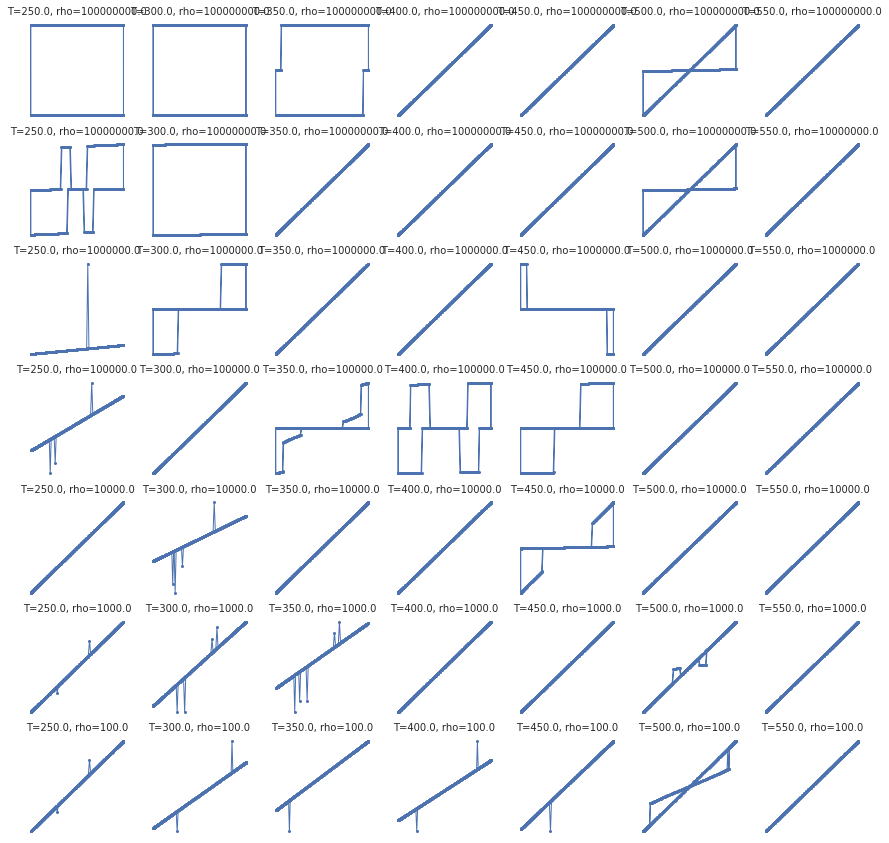

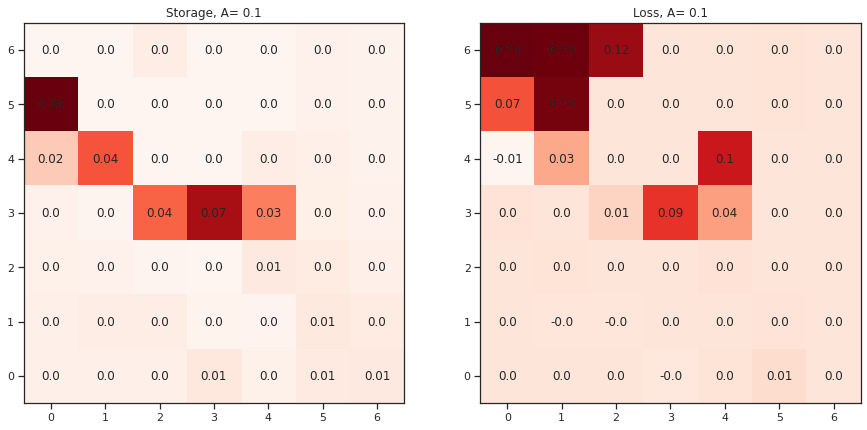

Process:2; Analysis:1
Process:2; Analysis:2
Process:2; Analysis:3
Process:2; Analysis:4
Process:2; Analysis:5
Process:2; Analysis:6
Process:2; Analysis:7
Process:2; Analysis:8
Process:2; Analysis:9
Process:2; Analysis:10
Process:2; Analysis:11
Process:2; Analysis:12
Process:2; Analysis:13
Process:2; Analysis:14
Process:2; Analysis:15
Process:2; Analysis:16
Process:2; Analysis:17
Process:2; Analysis:18
Process:2; Analysis:19
Process:2; Analysis:20
Process:2; Analysis:21
Process:2; Analysis:22
Process:2; Analysis:23
Process:2; Analysis:24
Process:2; Analysis:25
Process:2; Analysis:26
Process:2; Analysis:27
Process:2; Analysis:28
Process:2; Analysis:29
Process:2; Analysis:30
Process:2; Analysis:31
Process:2; Analysis:32
Process:2; Analysis:33
Process:2; Analysis:34
Process:2; Analysis:35
Process:2; Analysis:36
Process:2; Analysis:37
Process:2; Analysis:38
Process:2; Analysis:39
Process:2; Analysis:40
Process:2; Analysis:41
Process:2; Analysis:42
Process:2; Analysis:43
Process:2; Analysis:

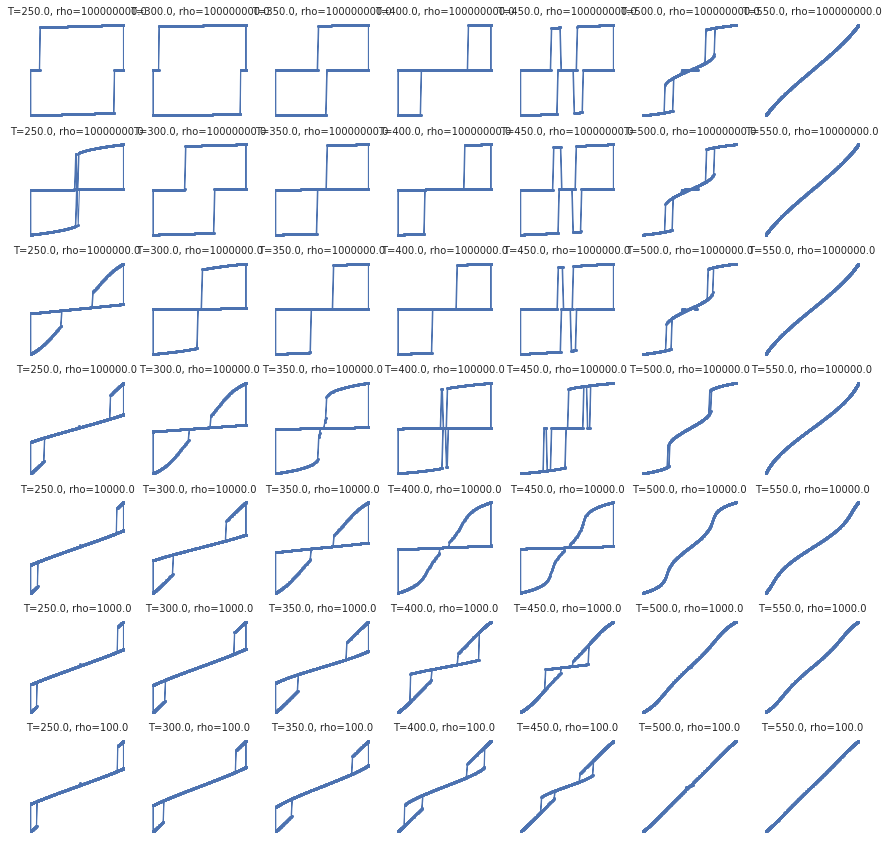

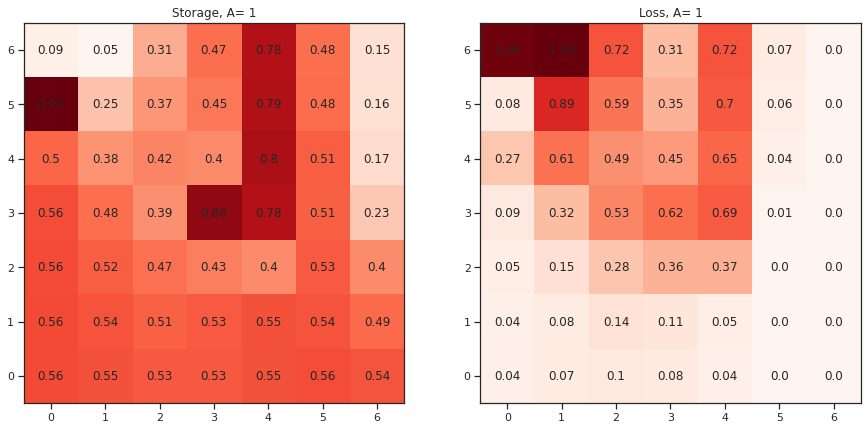

Process:3; Analysis:1
Process:3; Analysis:2
Process:3; Analysis:3
Process:3; Analysis:4
Process:3; Analysis:5
Process:3; Analysis:6
Process:3; Analysis:7
Process:3; Analysis:8
Process:3; Analysis:9
Process:3; Analysis:10
Process:3; Analysis:11
Process:3; Analysis:12
Process:3; Analysis:13
Process:3; Analysis:14
Process:3; Analysis:15
Process:3; Analysis:16
Process:3; Analysis:17
Process:3; Analysis:18
Process:3; Analysis:19
Process:3; Analysis:20
Process:3; Analysis:21
Process:3; Analysis:22
Process:3; Analysis:23
Process:3; Analysis:24
Process:3; Analysis:25
Process:3; Analysis:26
Process:3; Analysis:27
Process:3; Analysis:28
Process:3; Analysis:29
Process:3; Analysis:30
Process:3; Analysis:31
Process:3; Analysis:32
Process:3; Analysis:33
Process:3; Analysis:34
Process:3; Analysis:35
Process:3; Analysis:36
Process:3; Analysis:37
Process:3; Analysis:38
Process:3; Analysis:39
Process:3; Analysis:40
Process:3; Analysis:41
Process:3; Analysis:42
Process:3; Analysis:43
Process:3; Analysis:

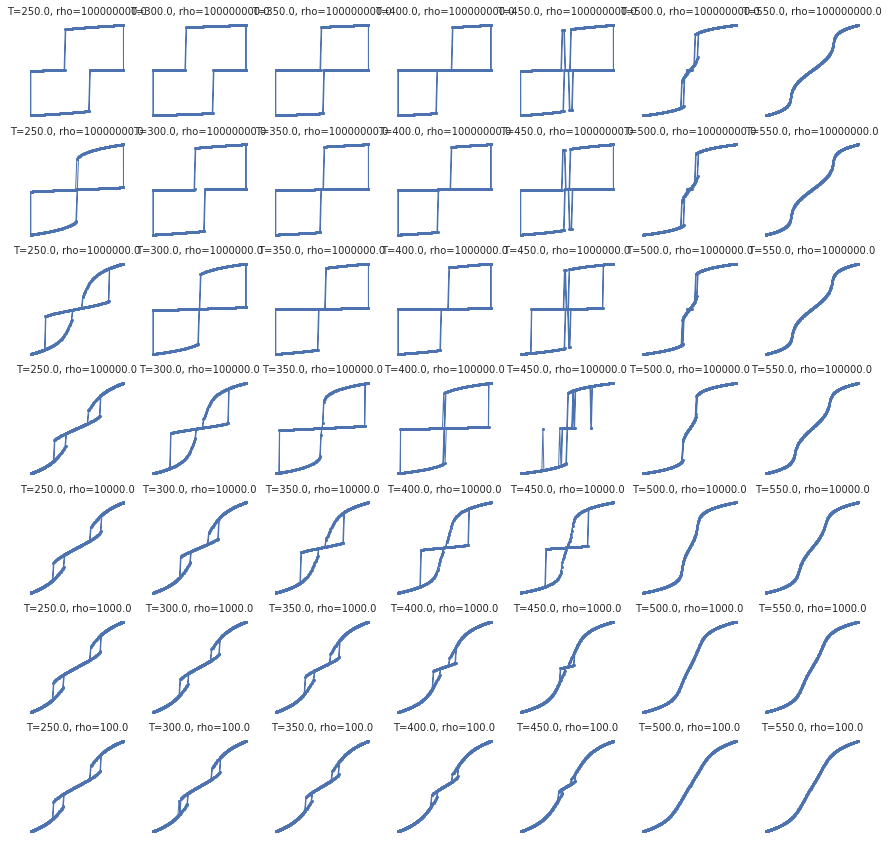

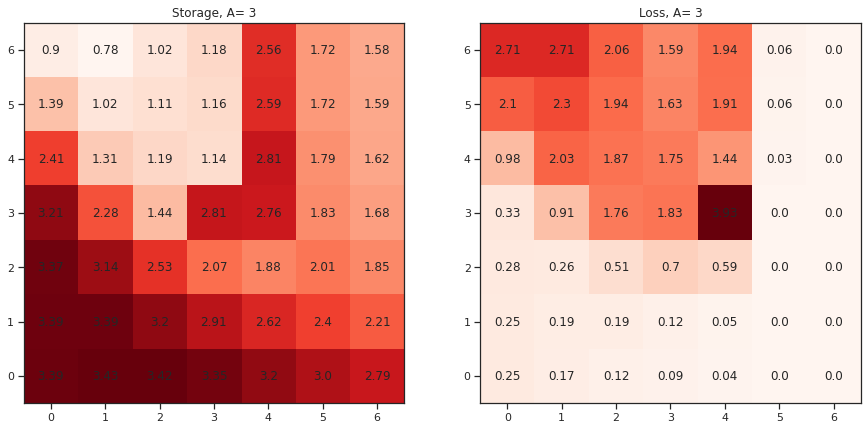

Process:4; Analysis:1
Process:4; Analysis:2
Process:4; Analysis:3
Process:4; Analysis:4
Process:4; Analysis:5
Process:4; Analysis:6
Process:4; Analysis:7
Process:4; Analysis:8
Process:4; Analysis:9
Process:4; Analysis:10
Process:4; Analysis:11
Process:4; Analysis:12
Process:4; Analysis:13
Process:4; Analysis:14
Process:4; Analysis:15
Process:4; Analysis:16
Process:4; Analysis:17
Process:4; Analysis:18
Process:4; Analysis:19
Process:4; Analysis:20
Process:4; Analysis:21
Process:4; Analysis:22
Process:4; Analysis:23
Process:4; Analysis:24
Process:4; Analysis:25
Process:4; Analysis:26
Process:4; Analysis:27
Process:4; Analysis:28
Process:4; Analysis:29
Process:4; Analysis:30
Process:4; Analysis:31
Process:4; Analysis:32
Process:4; Analysis:33
Process:4; Analysis:34
Process:4; Analysis:35
Process:4; Analysis:36
Process:4; Analysis:37
Process:4; Analysis:38
Process:4; Analysis:39
Process:4; Analysis:40
Process:4; Analysis:41
Process:4; Analysis:42
Process:4; Analysis:43
Process:4; Analysis:

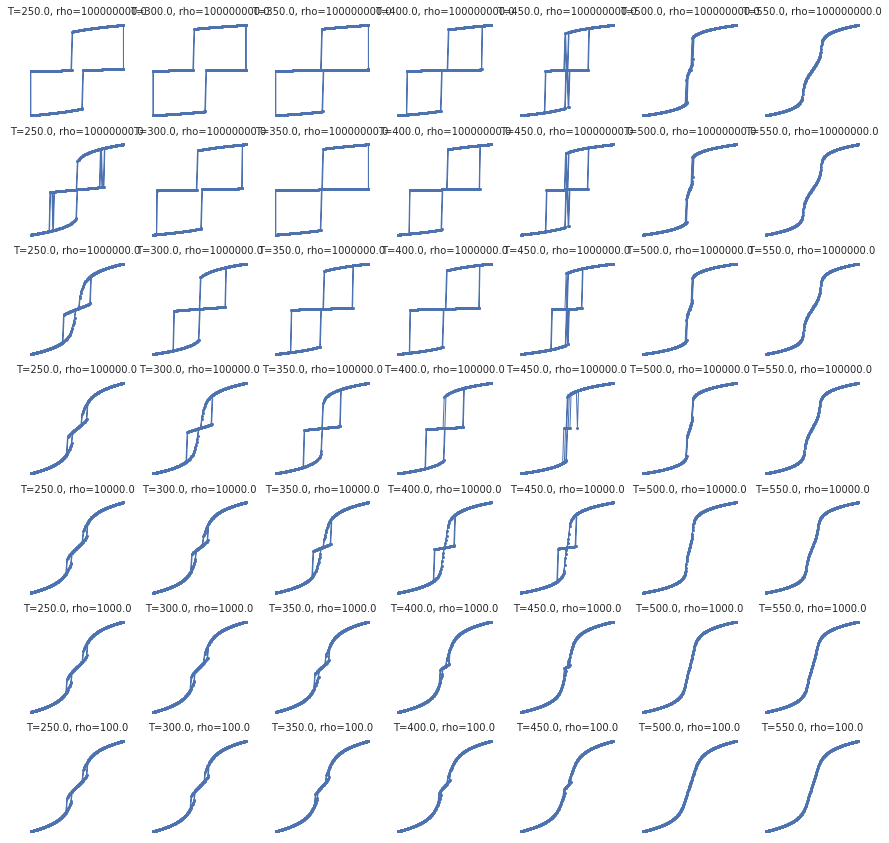

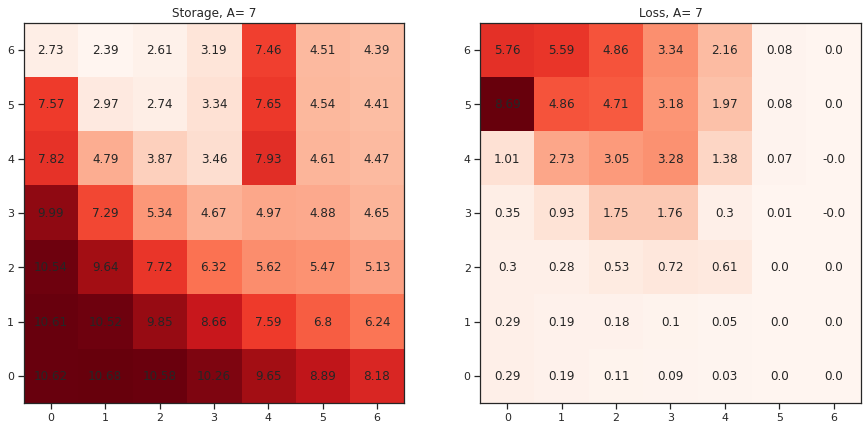

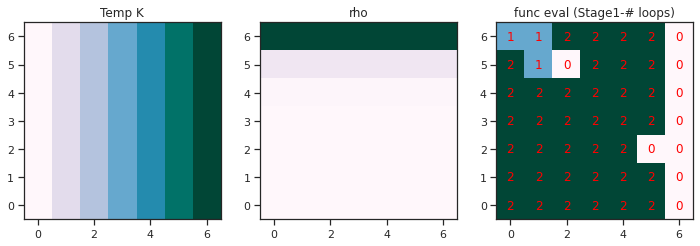

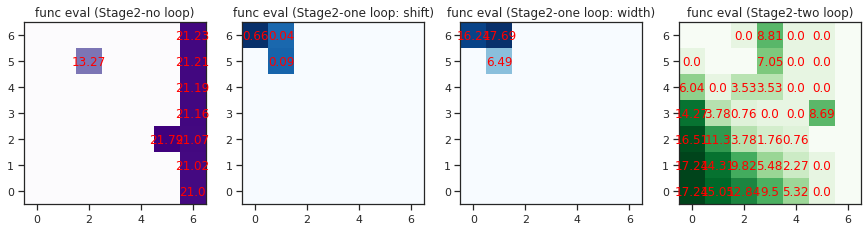

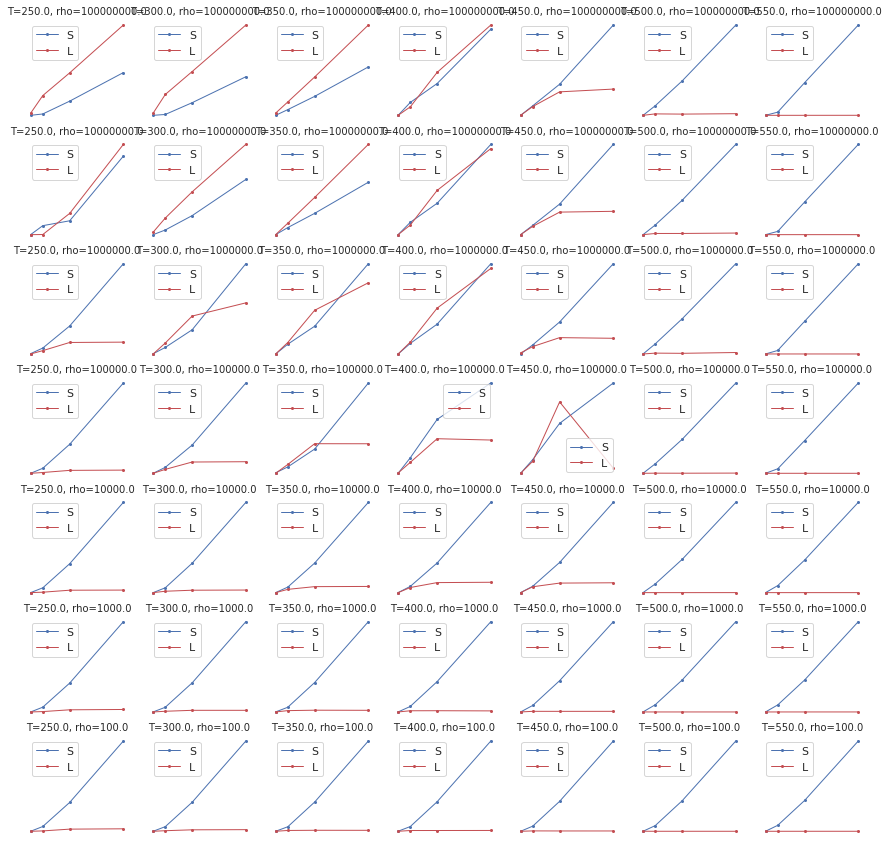

In [ ]:
time_vec = np.linspace(0, 2, 500)
A = [0.1, 1, 3, 7]

num_rows =7
max_hysplot_dim =10 # With denser maps, the hysteresis loop grid image will get very messy and thus redundant to plot. Thus, we toogle off the full hysteresis plot if the dim>10. Instead we can plot hysteresis loop separately in the previous code segment
toggle_num_dim =10  # With denser maps, the numbers in the heatmap of phase diag will get very messy and thus redundant to plot. Thus, we toogle off if the dim>10. We can get good visualization with color intensity with denser maps
Temp = np.linspace(250, 550, num_rows)
n= np.linspace(2, 8, num_rows)
#n=int(n)
rho = np.zeros(len(n))
for i in range(0, len(n)):
    rho[i] = 10**(n[i])

#Temp=[500, 550]
#rho=[10**7, 10**8]

objphaseS1 = np.zeros((len(Temp), len(Temp)))
objphaseS1A =np.zeros((len(Temp)**2,len(A)))
objphasesS2C1 = np.zeros((len(Temp), len(Temp)))
objphasesS2C2 = np.zeros((len(Temp), len(Temp)))
objphaseS2C1A =np.zeros((len(Temp)**2,len(A)))
objphaseS2C2A =np.zeros((len(Temp)**2,len(A)))
Storage = np.zeros((len(Temp), len(Temp)))
StorageA =np.zeros((len(Temp)**2,len(A)))
Loss = np.zeros((len(Temp), len(Temp)))
LossA =np.zeros((len(Temp)**2,len(A)))
Temp,rho = np.meshgrid(Temp, rho)


for proc in range(0, len(A)):
    E = A[proc] * np.sin(2 * np.pi * time_vec)
    m=0
    if (num_rows<=max_hysplot_dim):
        fig1, ax1 = plt.subplots(len(Temp), len(Temp), figsize=(15,15))

    for t1, (x1, x2) in enumerate(zip(Temp, rho)):
        for t2, (xx1, xx2) in enumerate(zip(x1, x2)):
            m=m+1
            print("Process:" +str(proc+1)+"; Analysis:"+str(m))
            Pmat, objeval, objeval2, objeval3, ES, EL= funoptimize(xx1, xx2, 5, 0.2, E)
            objphaseS1[t1, t2] = objeval #Stage 1 valuation
            objphasesS2C1[t1, t2] = objeval2 #Stage 2 -Criteria 1: One loop- Storage Energy
            objphasesS2C2[t1, t2] = objeval3 #Stage 2- Criteria 2: One loop- Loop Shift/Width
            Storage[t1, t2] = ES
            Loss[t1, t2] =EL
            if (num_rows<=max_hysplot_dim):
            #Plot for hysteresis loops at each region for each A
                fig1, ax1 = plot_hysteresis(fig1, ax1, Temp, rho, E, Pmat, xx1, xx2, t1, t2, 1, 2, 10)


    plt.show()
    objphaseS1A[:,proc]= np.reshape(objphaseS1, (len(Temp)**2))
    objphaseS2C1A[:, proc] = np.reshape(objphasesS2C1, (len(Temp) ** 2))
    objphaseS2C2A[:, proc] = np.reshape(objphasesS2C2, (len(Temp) ** 2))
    StorageA[:, proc] = np.reshape(Storage, (len(Temp) ** 2))
    LossA[:, proc] = np.reshape(Loss, (len(Temp) ** 2))

    #Plot Storage and loss grid image for each A
    plot_Storage_Loss(Storage, Loss, num_rows, toggle_num_dim, A[proc])


## Generate phase matrix and plot phases for Stage 1 and Stage 2
phaseS1, sphasenoloop, sphaseoneloopc1, sphaseoneloopc2, sphasetwoloop= phase_matrix(Temp, rho, objphaseS1A, objphaseS2C1A, objphaseS2C2A, num_rows, toggle_num_dim)

#Additional plot -just to play around####
if (num_rows<=max_hysplot_dim):
    # Plot Storage and loss vs A for each region
    fig5, ax4 = plt.subplots(len(Temp), len(Temp), figsize=(15, 15))
    m=0
    for t1, (x1, x2) in enumerate(zip(Temp, rho)):
        for t2, (xx1, xx2) in enumerate(zip(x1, x2)):
            ax4[len(Temp) - 1 - t1, t2].plot(A, StorageA[m, :], 'bo-', linewidth=1, markersize=2, label = "S")
            ax4[len(Temp) - 1 - t1, t2].plot(A, LossA[m, :], 'ro-', linewidth=1, markersize=2, label = "L")
            ax4[len(Temp) - 1 - t1, t2].axis('off')
            ax4[len(Temp) - 1 - t1, t2].set_title("T=" + str(xx1) + ", rho=" + str(xx2), fontsize=10)
            ax4[len(Temp) - 1 - t1, t2].legend(loc ="best")
            #fig3.text(0.5, 0.97, 'Plots of Storage/Loss vs A under each grid locs', ha='center', fontsize=40)
            m=m+1

    plt.show()

<h1> MOBO framework

PZO model example- choosing storage energy and loss as target functions to maximize- finding a balance between them

In [ ]:
def normalize_get_initialdata_PZO(X1, X2, fix_x1, fix_x2, E, test_X1, test_X2, num_rows, num, param1, param2, problem, m):
#Normalize X
    minX1 = min(X1)
    maxX1 = max(X1)
    minX2 = min(X2)
    maxX2 = max(X2)
    Xmin = np.hstack((minX1, minX2))
    Xmax = np.hstack((maxX1, maxX2))
    X1, X2 = np.meshgrid(X1, X2)
    test_X1, test_X2 = np.meshgrid(test_X1, test_X2)
    X1_norm = (X1-Xmin[0])/(Xmax[0]-Xmin[0])
    X2_norm = (X2-Xmin[1])/(Xmax[1]-Xmin[1])
    testX1_norm = (test_X1-Xmin[0])/(Xmax[0]-Xmin[0])
    testX2_norm = (test_X2-Xmin[1])/(Xmax[1]-Xmin[1])

    # Select starting samples randomly as training data
    testX1_norm = np.reshape(testX1_norm, (num_rows ** 2, 1))
    testX2_norm = np.reshape(testX2_norm, (num_rows ** 2, 1))
    test_X1 = np.reshape(test_X1, (num_rows ** 2, 1))
    test_X2 = np.reshape(test_X2, (num_rows ** 2, 1))
    np.random.seed(10)
    ind_start = np.random.choice(len(testX1_norm) - 1, size=num, replace=False)
    train_X = np.zeros((num, 2))
    train_X_norm = np.zeros((num, 2))
    train_y = np.zeros((num, 2))
    t_y = np.zeros((num_rows**2,2))
    m=0
    print("Function evaluaton for initial randomly selected samples")
    for i in range(0, num):
        train_X_norm[i, 0] = testX1_norm[ind_start[i]]
        train_X_norm[i, 1] = testX2_norm[ind_start[i]]
        train_X[i, 0]= test_X1[ind_start[i]]
        train_X[i, 1]= test_X2[ind_start[i]]
        print("Function eval #" + str(m + 1))
        if (param1 == 'Temp') and (param2 == 'rho'):
            h= fix_x1
            deltaG = fix_x2
            Pmat, objeval, objeval2, objeval3, ES, EL= funoptimize(train_X[i, 0], train_X[i, 1], h, deltaG, E)
        elif (param1 == 'Temp') and (param2 == 'h'):
            rho= fix_x1
            deltaG = fix_x2
            Pmat, objeval, objeval2, objeval3, ES, EL = funoptimize(train_X[i, 0], rho, train_X[i, 1], deltaG, E)
        elif (param1 == 'Temp') and (param2 == 'deltaG'):
            rho= fix_x1
            h = fix_x2
            Pmat, objeval, objeval2, objeval3, ES, EL = funoptimize(train_X[i, 0], rho, h, train_X[i, 1], E)
        elif (param1 == 'rho') and (param2 == 'h'):
            T= fix_x1
            deltaG = fix_x2
            Pmat, objeval, objeval2, objeval3, ES, EL = funoptimize(T, train_X[i, 0], train_X[i, 1], deltaG, E)
        elif (param1 == 'rho') and (param2 == 'deltaG'):
            h= T
            h = fix_x2
            Pmat, objeval, objeval2, objeval3, ES, EL = funoptimize(T, train_X[i, 0], h, train_X[i, 1], E)
        elif (param1 == 'h') and (param2 == 'deltaG'):
            T= fix_x1
            rho = fix_x2
            Pmat, objeval, objeval2, objeval3, ES, EL = funoptimize(T, rho, train_X[i, 0], train_X[i, 1], E)
        else:
            print("Error: Choose 2 params considering the sequence as mentioned")

        #By default, BO settting is for maximization, for minimization we just use f(x) =-f(x)
        if (problem[0]=='min'):
            train_y[i, 0] = -ES #By default, BO settting is for maximization, for minimization we just use f(x) =-f(x)
            t_y[ind_start[i], 0] = -ES #By default, BO settting is for maximization, for minimization we just use f(x) =-f(x)
        else:
            train_y[i, 0] = ES
            t_y[ind_start[i], 0] = ES

        if (problem[1]=='min'):
            train_y[i, 1] = -EL #By default, BO settting is for maximization, for minimization we just use f(x) =-f(x)
            t_y[ind_start[i], 1] = -EL #By default, BO settting is for maximization, for minimization we just use f(x) =-f(x)
        else:
            train_y[i, 1] = EL
            t_y[ind_start[i], 1] = EL

        #testX1_norm[ind_start[i]] =-1
        #testX2_norm[ind_start[i]] =-1
        m = m + 1

    testX1_norm = np.reshape(testX1_norm, (num_rows, num_rows))
    testX2_norm = np.reshape(testX2_norm, (num_rows, num_rows))
    t_y = np.reshape(t_y, (num_rows, num_rows, 2))

    #Convert to torch
    train_X_norm = to.from_numpy(train_X_norm)
    train_X_norm = train_X_norm.double()
    train_Y = to.from_numpy(train_y)
    #Normalize Y
    testY1_norm = (train_Y[:,0]-train_Y[:,0].min())/(train_Y[:,0].max()-train_Y[:,0].min())
    testY2_norm = (train_Y[:,1]-train_Y[:,1].min())/(train_Y[:,1].max()-train_Y[:,1].min())
    train_Y_norm = to.empty(train_Y.__len__(), 2)
    train_Y_norm[:,0]=testY1_norm
    train_Y_norm[:,1]=testY2_norm

    return X1_norm, X2_norm, testX1_norm, testX2_norm, train_X, train_X_norm, train_Y, train_Y_norm, Xmin, Xmax, t_y, m

def augment_newdata_PZO(acq_X, train_X, train_X_norm, train_Y, fix_x1, fix_x2, E, Xmin, Xmax, BATCH_SIZE, num_rows, param1, param2, problem, m):
    nextX_norm = acq_X
    nextX = nextX_norm*(to.from_numpy(Xmax)-to.from_numpy(Xmin)) + to.from_numpy(Xmin)
    nextX = nextX.detach().numpy()
    train_X_norm = to.cat((train_X_norm, nextX_norm), 0)
    train_X_norm = train_X_norm.double()
    train_X = np.vstack((train_X, nextX))
    next_feval = to.empty(BATCH_SIZE, 2)
    print("Batch Function eval #" + str(m + 1))

    for j in range(0, BATCH_SIZE):
                # Function evaluation for new data
        print("Within batch: Function eval: " + str(j + 1) + " of " +str(BATCH_SIZE))
                    #Pmat, objeval, objeval2, objeval3, ES, EL = funoptimize(train_X[-1, 0], train_X[-1, 1], h, deltaG, E)
        if (param1 == 'Temp') and (param2 == 'rho'):
            h= fix_x1
            deltaG = fix_x2
            Pmat, objeval, objeval2, objeval3, ES, EL = funoptimize(nextX[j, 0], nextX[j, 1], h, deltaG, E)
        elif (param1 == 'Temp') and (param2 == 'h'):
            rho= fix_x1
            deltaG = fix_x2
            Pmat, objeval, objeval2, objeval3, ES, EL = funoptimize(nextX[j, 0], rho, nextX[j, 1], deltaG, E)
        elif (param1 == 'Temp') and (param2 == 'deltaG'):
            rho= fix_x1
            h = fix_x2
            Pmat, objeval, objeval2, objeval3, ES, EL = funoptimize(nextX[j, 0], rho, h, nextX[j, 1], E)
        elif (param1 == 'rho') and (param2 == 'h'):
            T= fix_x1
            deltaG = fix_x2
            Pmat, objeval, objeval2, objeval3, ES, EL = funoptimize(T, nextX[j, 0], nextX[j, 1], deltaG, E)
        elif (param1 == 'rho') and (param2 == 'deltaG'):
            T= fix_x1
            h = fix_x2
            Pmat, objeval, objeval2, objeval3, ES, EL = funoptimize(T, nextX[j, 0], h, nextX[j, 1], E)
        elif (param1 == 'h') and (param2 == 'deltaG'):
            T= fix_x1
            rho = fix_x2
            Pmat, objeval, objeval2, objeval3, ES, EL = funoptimize(T, rho, nextX[j, 0], nextX[j, 1], E)
        else:
            print("Error: Choose 2 params considering the sequence as mentioned")

                    # By default, BO settting is for maximization, for minimization we just use f(x) =-f(x)
        if (problem[0] == 'min'):
            next_feval[j, 0] = -ES
        else:
            next_feval[j, 0] = ES
        if (problem[1] == 'min'):
            next_feval[j, 1] = -EL
        else:
            next_feval[j, 1] = EL

    train_Y = to.cat((train_Y, next_feval), 0)
            # Normalize Y
    testY1_norm = (train_Y[:, 0] - train_Y[:, 0].min()) / (train_Y[:, 0].max() - train_Y[:, 0].min())
    testY2_norm = (train_Y[:, 1] - train_Y[:, 1].min()) / (train_Y[:, 1].max() - train_Y[:, 1].min())
    train_Y_norm = to.empty(train_Y.__len__(), 2)
    train_Y_norm[:, 0] = testY1_norm
    train_Y_norm[:, 1] = testY2_norm
    m = m + 1

    return train_X, train_X_norm, train_Y, train_Y_norm, m

In [ ]:
def MOBO_PZO(X1, X2, fix_x1, fix_x2, E, test_X1, test_X2, num_rows, N, BATCH_SIZE, param1, param2, obj1, obj2, acquisition, problem, max_hysplot_dim, toggle_num_dim):
        ##MOBO framework#######
    m=0
    X1_norm, X2_norm, testX1_norm, testX2_norm, train_X, train_X_norm, train_Y, train_Y_norm, Xmin, Xmax, t_y, m=\
        normalize_get_initialdata_PZO(X1, X2, fix_x1, fix_x2, E, test_X1, test_X2, num_rows, num, param1, param2, problem, m)

    X1, X2 = np.meshgrid(X1, X2)
    test_X1, test_X2 = np.meshgrid(test_X1, test_X2)

    print("Initial evaluation complete. Start BO- acq func: " +str(acquisition))
    # Gp model fit
    gp_surro= optimize_hyperparam_trainGP(train_X_norm, train_Y_norm)

    # compute pareto front
    pareto_mask_norm = is_non_dominated(train_Y_norm)
    pareto_y_norm = train_Y_norm[pareto_mask_norm]
    pareto_x_norm = train_X_norm[pareto_mask_norm]
    pareto_mask = is_non_dominated(train_Y)
    pareto_x = train_X[pareto_mask]
    pareto_y = train_Y[pareto_mask]
    # compute hypervolume
    hvs = []
    rf= to.tensor([0.0] * 2)-0.001
    hv = Hypervolume(ref_point=rf)
    volume = hv.compute(pareto_y_norm)
    hvs.append(volume)


    for i in range(1, N + 1):

        if (i == 1 or i == 10 or i == 20 or i == 30 or i == 40 or i == 90 or i == 140 or i == 190 or i == 240):
            #Calculate posterior for analysis for intermidiate iterations
            y_pred_means, y_pred_vars = cal_posterior(gp_surro, testX1_norm, testX2_norm, t_y, num_rows)
            plot_exploration_results(X1, X2, y_pred_means, y_pred_vars, train_X, train_Y, i, param1, param2, obj1, obj2, problem)
            plotPareto(pareto_y, pareto_y_norm, pareto_x, pareto_x_norm, train_Y, train_Y_norm, train_X, train_X_norm, num, i - 1, BATCH_SIZE, param1, param2, obj1, obj2, problem)

        # List of acquisition functions as per user choice- functions from BOtorch packages
        if (acquisition == 'qEHVI'):

            acq_X, acq_val = optimize_qehvi(gp_surro, train_X_norm, train_Y_norm, rf, BATCH_SIZE)
            val = to.mean(acq_val)

        elif (acquisition == 'qParEGO'):

            acq_X, acq_val = optimize_qparego(gp_surro, train_X_norm, train_Y_norm, BATCH_SIZE)
            val = to.mean(acq_val)

    ################################################################
        ## Find next point which maximizes the learning through exploration
        if (i == 1):
            val_ini = val
        # Check for convergence
        if ((val) < 0):  # Stop for negligible expected improvement
            print("Model converged due to sufficient learning over search space ")
            break
        else:
            # Evaluate true function for new data, augment data
            train_X, train_X_norm, train_Y, train_Y_norm, m = augment_newdata_PZO(acq_X, train_X, train_X_norm, train_Y, fix_x1, fix_x2, E, Xmin, Xmax, BATCH_SIZE, num_rows, param1, param2, problem, m)

            #Update Pareto front, compute hypervolume
            # compute pareto front
            pareto_mask_norm = is_non_dominated(train_Y_norm)
            pareto_y_norm = train_Y_norm[pareto_mask_norm]
            pareto_x_norm = train_X_norm[pareto_mask_norm]
            pareto_mask = is_non_dominated(train_Y)
            pareto_x = train_X[pareto_mask]
            pareto_y = train_Y[pareto_mask]
            # compute hypervolume
            volume = hv.compute(pareto_y_norm)
            hvs.append(volume)

            # Updating GP model, conditioning on new data
            # Gp model fit
            gp_surro = optimize_hyperparam_trainGP(train_X_norm, train_Y_norm)


    ## Final posterior prediction after all the sampling done

    if (i == N):
        print("Max. sampling reached, model stopped")

    #Posterior calculation with converged GP model
    y_pred_means, y_pred_vars = cal_posterior(gp_surro, testX1_norm, testX2_norm, t_y, num_rows)
    plot_exploration_results(X1, X2, y_pred_means, y_pred_vars, train_X, train_Y, i, param1, param2, obj1, obj2, problem)


    # Plotting pareto frontier #

    # compute pareto front
    pareto_mask_norm = is_non_dominated(train_Y_norm)
    pareto_y_norm = train_Y_norm[pareto_mask_norm]
    pareto_x_norm = train_X_norm[pareto_mask_norm]
    pareto_mask = is_non_dominated(train_Y)
    pareto_x = train_X[pareto_mask]
    pareto_y = train_Y[pareto_mask]
    if (i == N):
        plotPareto(pareto_y, pareto_y_norm, pareto_x, pareto_x_norm, train_Y, train_Y_norm, train_X, train_X_norm, num, N, BATCH_SIZE, param1, param2, obj1, obj2, problem)
    else:
        plotPareto(pareto_y, pareto_y_norm, pareto_x, pareto_x_norm, train_Y, train_Y_norm, train_X, train_X_norm, num, i - 1, BATCH_SIZE, param1, param2, obj1, obj2, problem)
    # plot hypervolume
    #volume = hv.compute(pareto_y_norm)
    #hvs.append(volume)
    plt.plot(hvs)
    plt.ylabel("Hypervolume")
    plt.show()


<h1>User Inputs

**Provide BATCH_SIZE #** (default = 4)

**We include 2 acquistion functions-**
1. qEHVI 
2. qParEGO

**We can switch the optimization problem-**
1. Maximization problem (Default setting in BO)
2. Minimization problem

Example: problem =['min','max'] means obj 1 and 2 will be minimized and maximized respectively

**We can choose any 2 parameters from the list below for defining parameter space, following the same sequence-**
1. Temperature 
2. rho
3. thickness
4. deltaG

We provide the range of the 2 chosen control parameters, and provide scalar values for the remaining parameters.

**Other user inputs-**
1. num_rows (define the image map density (num_rows X num_rows), default = 50)
2. num (# of starting samples, default = 20)
3. N (maximum BO iteration, default =45)

<h1>Analysis 3a

Temp vs rho (partial O2 pressure)

50x50 grid space, Max func evaluation- 30 (max iter)x 4(batch_size) + 20(starting samples)

$Temp = [250, 410]; rho =[10^{-3}, 10^3]; h=5nm; \Delta_G =0.2$

AFE phase

**Maximize Energy Storage and Loss** - Adaptive sampling to balance between high storage and loss and find the pareto frontier.

acquistion function - **qParEGO**

Function evaluaton for initial randomly selected samples
Function eval #1
Function eval #2
Function eval #3
Function eval #4
Function eval #5
Function eval #6
Function eval #7
Function eval #8
Function eval #9
Function eval #10
Function eval #11
Function eval #12
Function eval #13
Function eval #14
Function eval #15
Function eval #16
Function eval #17
Function eval #18
Function eval #19
Function eval #20
Initial evaluation complete. Start BO- acq func: qParEGO


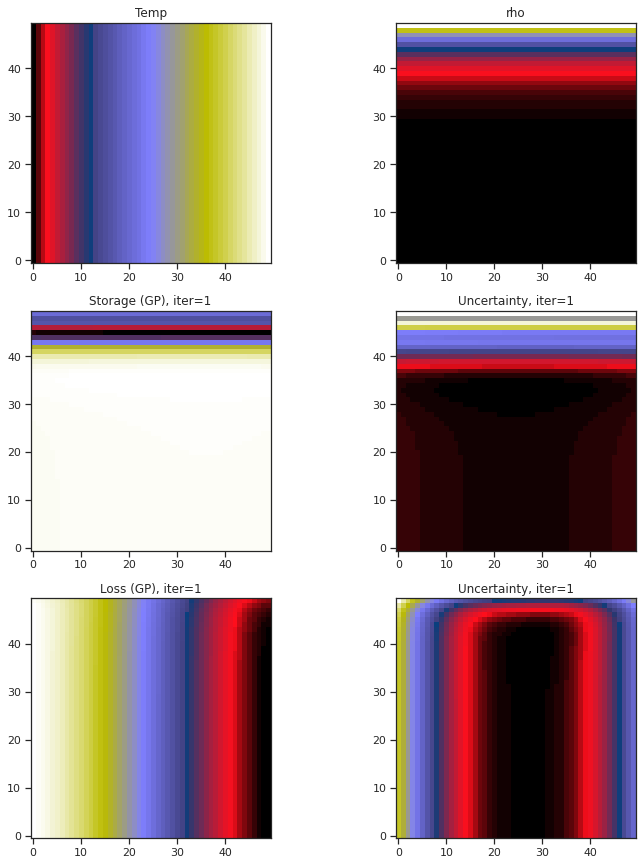

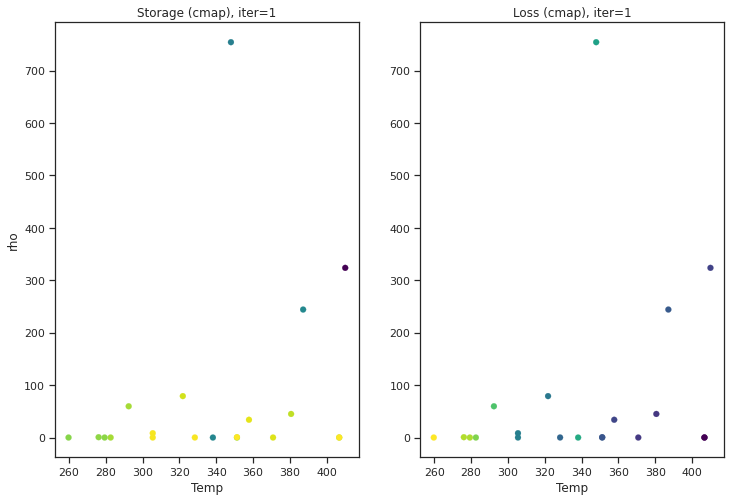

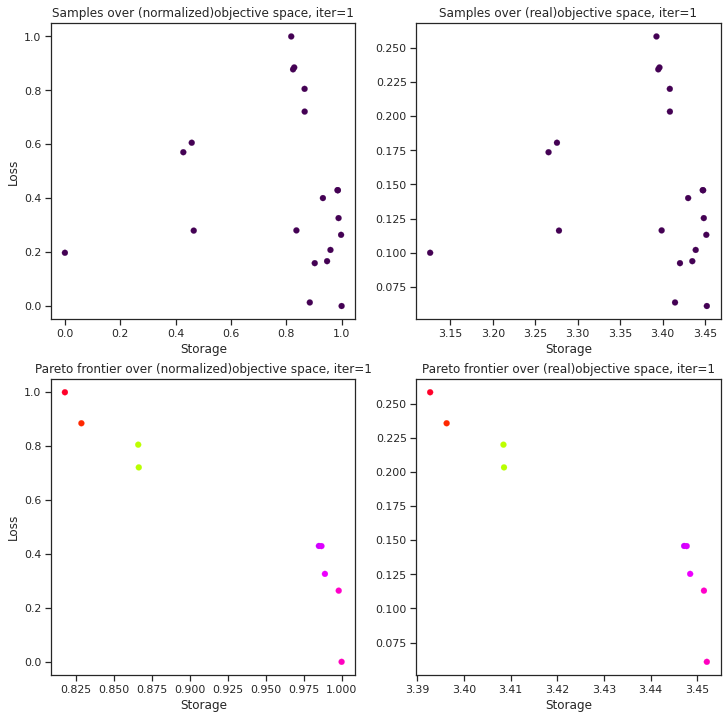

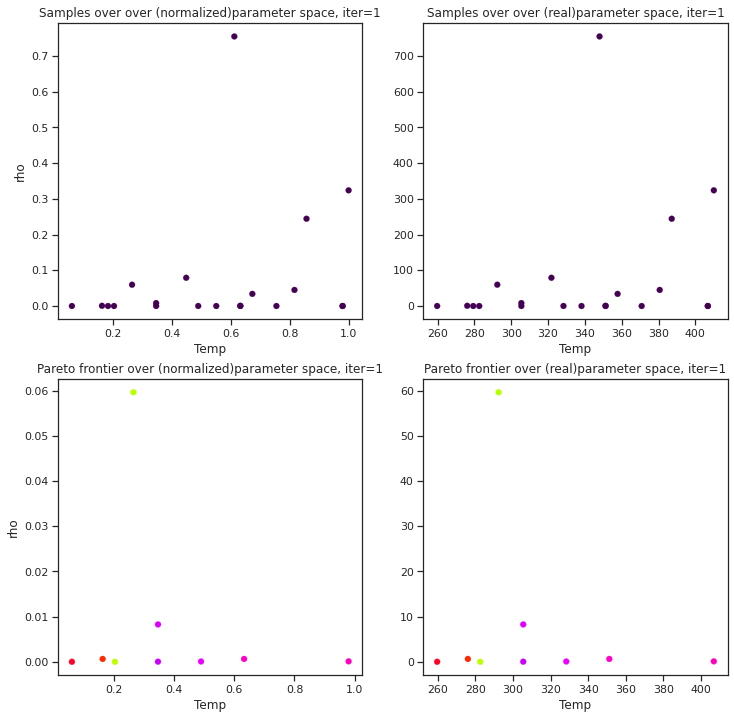

Batch Function eval #21
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #22
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #23
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #24
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #25
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #26
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #27
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #28
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #29
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


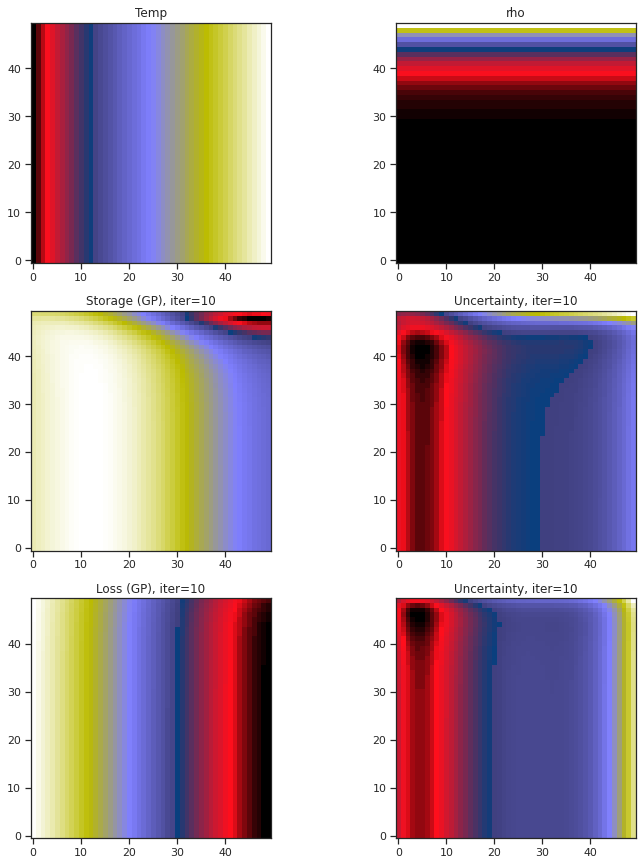

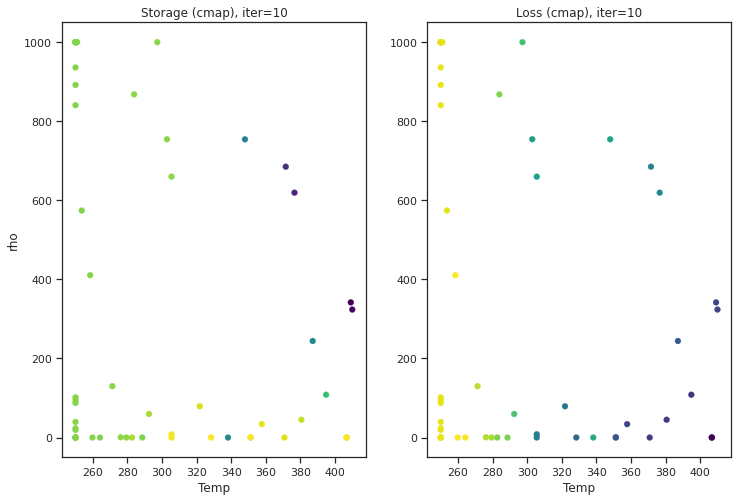

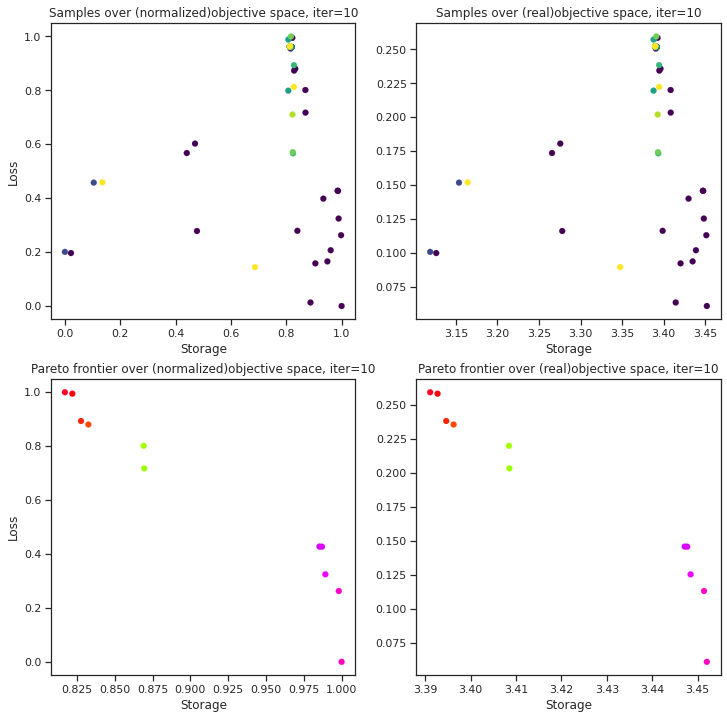

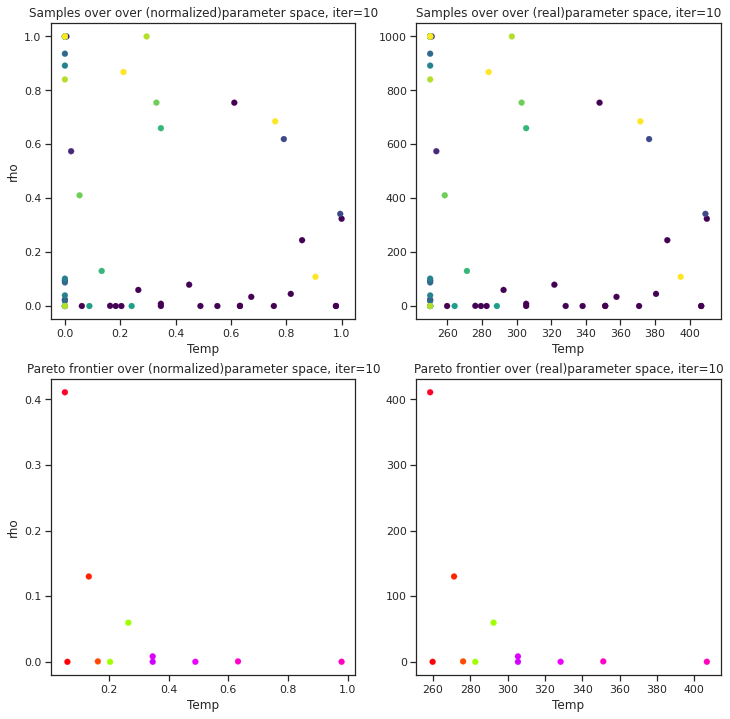

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #30
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #31
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #32
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #33
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #34
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #35
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #36
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #37
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #38
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #39
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


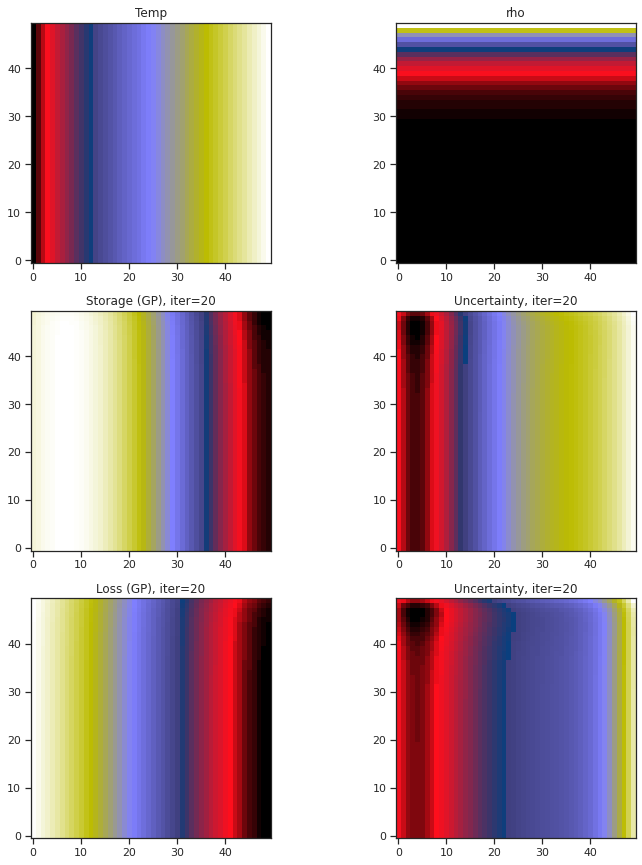

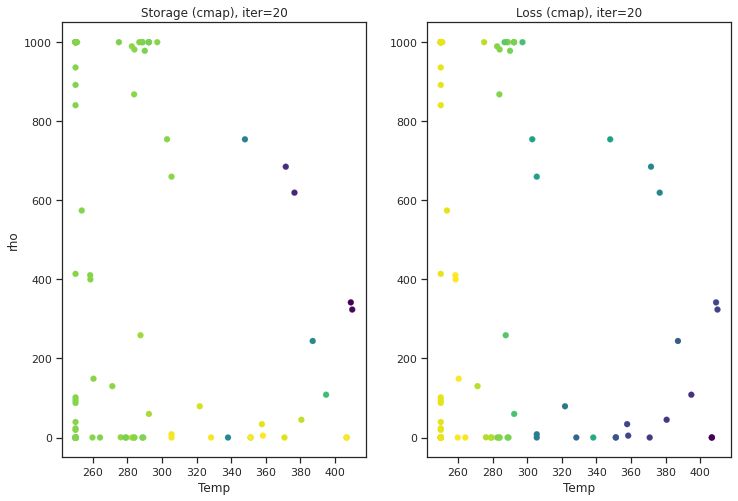

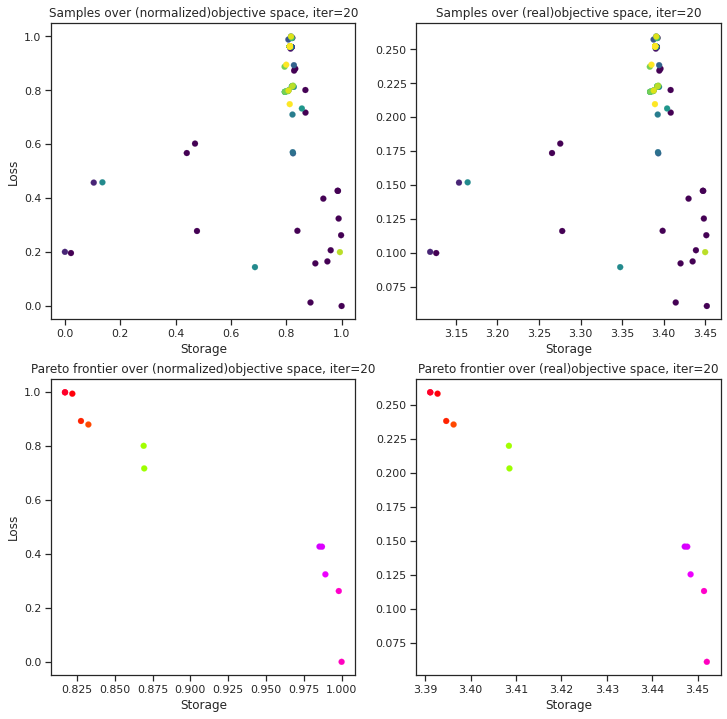

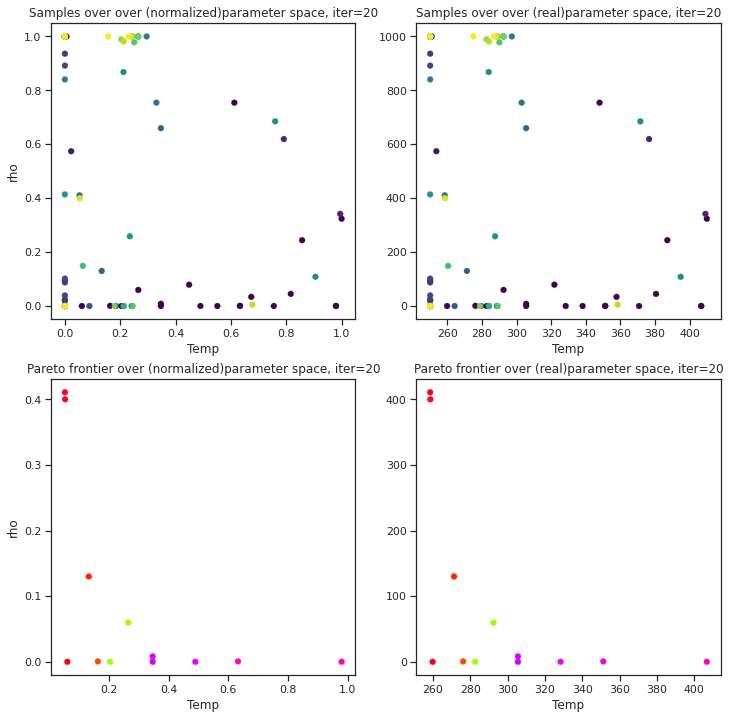

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #40
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #41
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #42
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #43
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #44
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #45
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #46
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #47
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #48
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #49
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


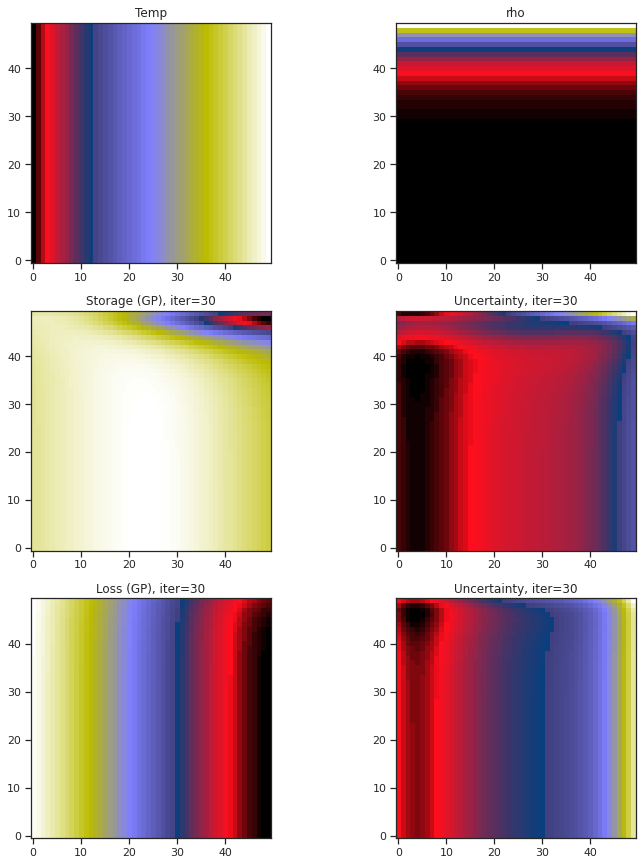

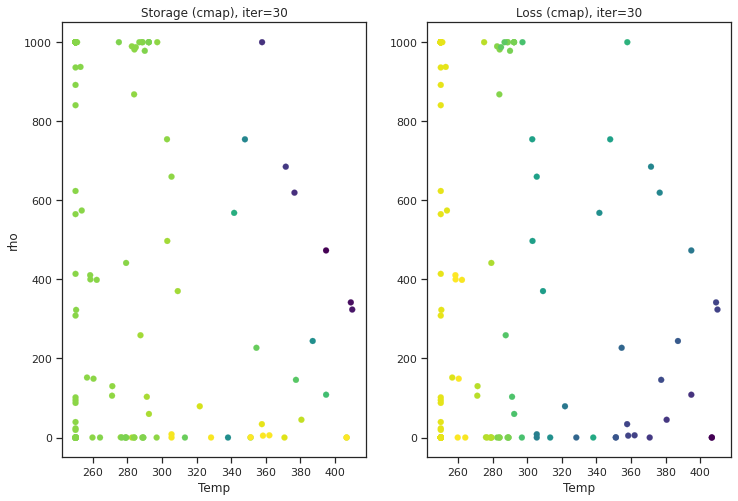

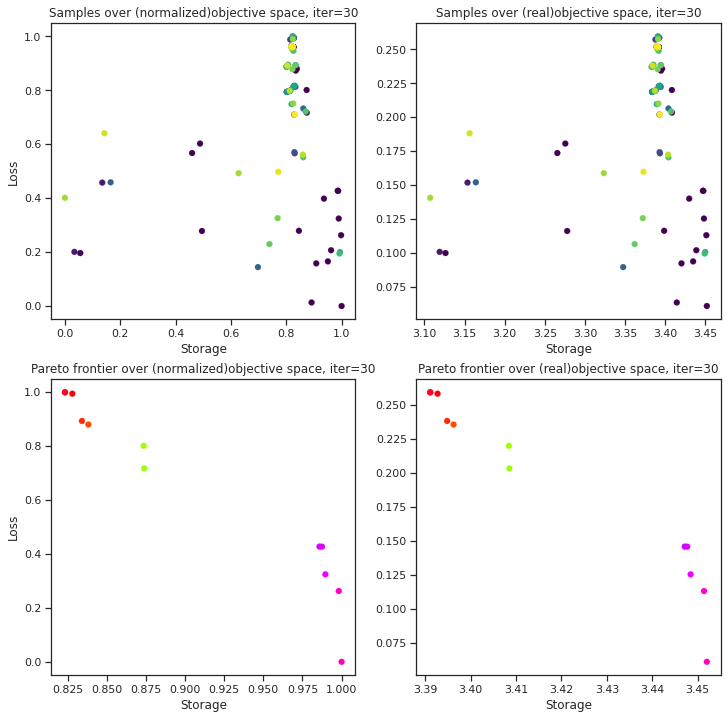

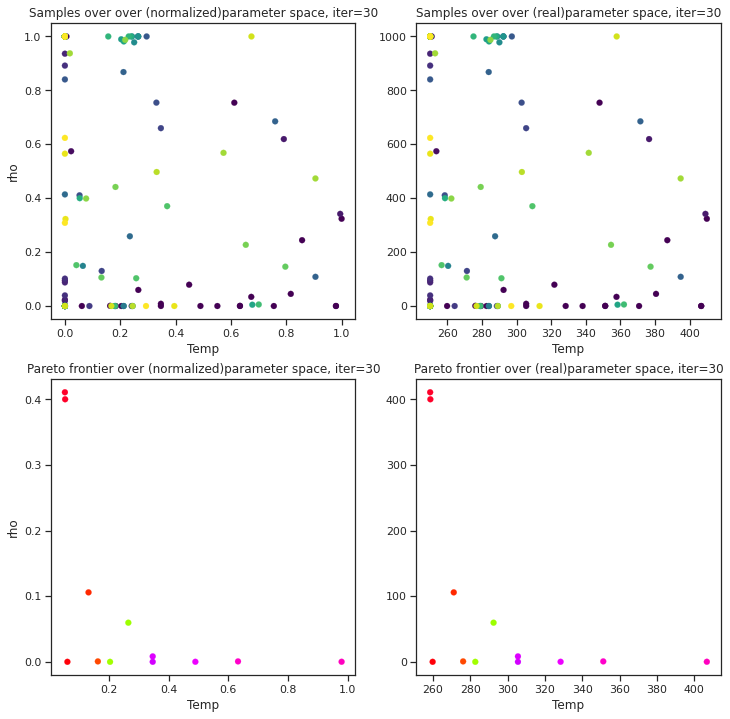

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #50
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Max. sampling reached, model stopped


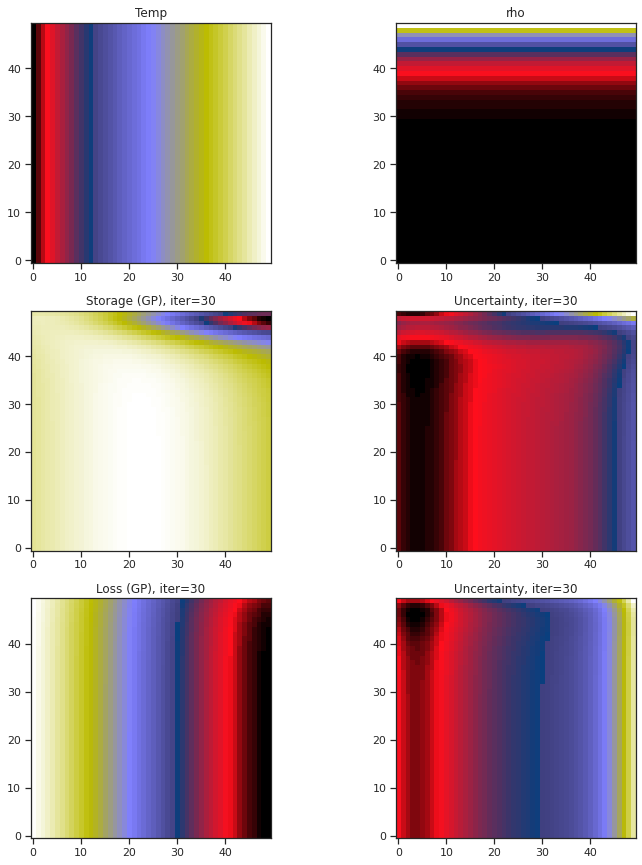

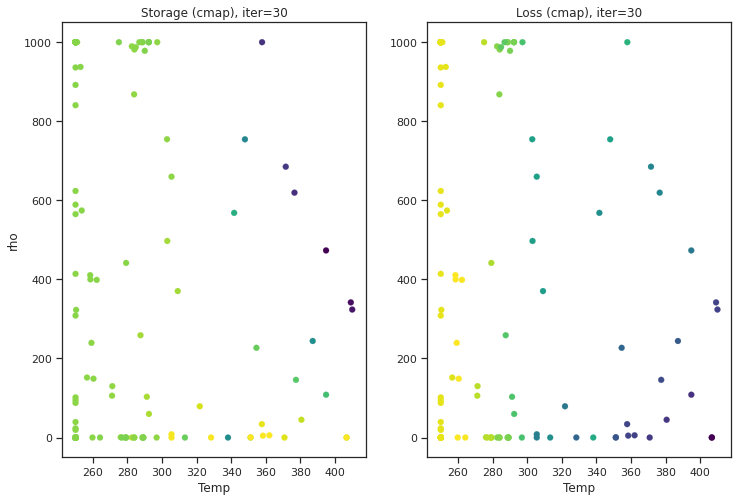

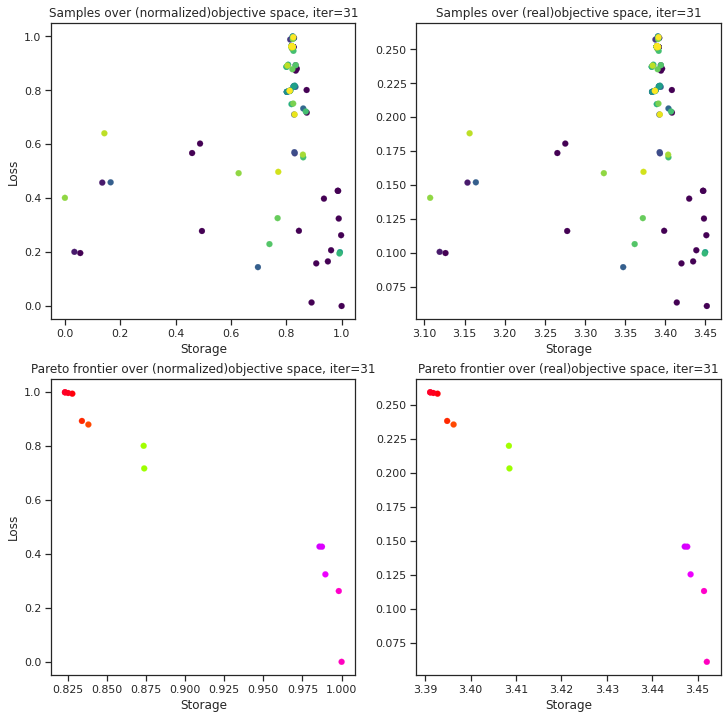

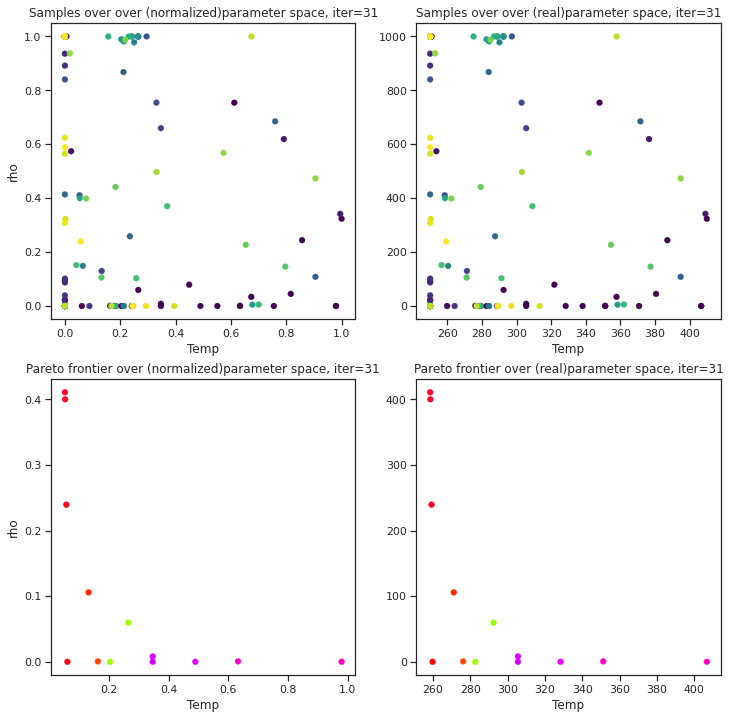

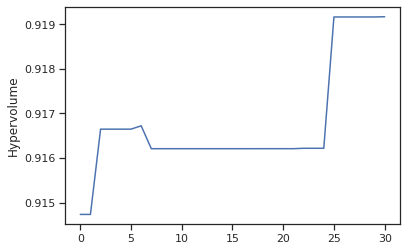

In [ ]:
tkwargs = {
    "dtype": to.double,
    "device": to.device("cuda" if to.cuda.is_available() else "cpu"),
}
BATCH_SIZE = 4 #For each iteration in BO, how many future samples we select in batch


time_vec = np.linspace(0, 2, 500)
A = 3 #Fixed amplitude
E = A * np.sin(2 * np.pi * time_vec)

# List of options
# 'qEHVI'- Expected Hypervolume acquistion function
# 'qParEGO' -qParEGO
acquisition = 'qParEGO'
# Input choice of problem- where it is minimization or maximization for objective 1 and 2 respectively
# List of options
# 'min'- Minimization
# 'max' -Maximization (default setting)
problem =['max','max']

#List of control params- Temp, rho, h, deltaG
# Choose any two control params to create the parameter space considering above the same order-
param1 = 'Temp'
param2 = 'rho'
# Choose any two objectives to do MOO (MOBO)-
obj1 = 'Storage'
obj2 = 'Loss'


#Define parameter space based on above choice of params (2D only)
num_rows =50
max_hysplot_dim =10
toggle_num_dim =10
num = 20  # Starting samples
N= 30
#N = (0.5 * num_rows ** 2) - num  # Maximum evaluations
#N = int(N)
if (param1 == 'Temp') or (param2 == 'Temp'):
    #Creating domain space for T
    T = np.linspace(250, 410, num_rows)
    test_T = np.linspace(250, 410, num_rows) # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'Temp'):
        # Build X dataset
        X1 = T
        test_X1 = test_T
    if (param2 == 'Temp'):
        # Build X dataset
        X2 = T
        test_X2 = test_T

else:
    ##Fixed params
    T=300

if (param1 == 'rho') or (param2 == 'rho'):
    # Creating domain space for rho
    n = np.linspace(-3, 3, num_rows)
    rho = np.zeros(len(n))
    test_rho = np.zeros(len(n))
    for i in range(0, len(n)):
        rho[i] = 10 ** (n[i])
        test_rho[i] = 10 ** (n[i])  # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'rho'):
        # Build X dataset
        X1 = rho
        test_X1 = test_rho
    if (param2 == 'rho'):
        # Build X dataset
        X2 = rho
        test_X2 = test_rho

else:
    ##Fixed params
    rho=10

if (param1 == 'h') or (param2 == 'h'):
    #Creating domain space for h
    h = np.linspace(3, 60, num_rows)
    test_h = np.linspace(3, 60, num_rows)  # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'h'):
        # Build X dataset
        X1 = h
        test_X1 = test_h
    if (param2 == 'h'):
        # Build X dataset
        X2 = h
        test_X2 = test_h

else:
    ##Fixed params
    h=5

if (param1 == 'deltaG') or (param2 == 'deltaG'):
    #Creating domain space for deltaG
    deltaG = np.linspace(0.02, 2, num_rows)
    test_deltaG = np.linspace(0.02, 2, num_rows) # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'deltaG'):
        # Build X dataset
        X1 = deltaG
        test_X1 = test_deltaG
    if (param2 == 'deltaG'):
        # Build X dataset
        X2 = deltaG
        test_X2 = test_deltaG

else:
    deltaG=0.2

#Order of parameters to input after choosing for control and fixed parameters - T, rho, h, delta
# example- If we consider control params as T and h- we provide arguments as 
# MOBO(X1, X2, rho, deltaG, .....)
#Run MOBO -the first two arguments are the control parameters in the recommended order, the next two arguments are the remaining parameters as fixed in the recommended order
MOBO_PZO(X1, X2, h, deltaG, E, test_X1, test_X2, num_rows, N, BATCH_SIZE, param1, param2, obj1, obj2, acquisition, problem, max_hysplot_dim, toggle_num_dim)



<h1> Analysis 3b

Using **qEHVI** acquistion function

Function evaluaton for initial randomly selected samples
Function eval #1
Function eval #2
Function eval #3
Function eval #4
Function eval #5
Function eval #6
Function eval #7
Function eval #8
Function eval #9
Function eval #10
Function eval #11
Function eval #12
Function eval #13
Function eval #14
Function eval #15
Function eval #16
Function eval #17
Function eval #18
Function eval #19
Function eval #20
Initial evaluation complete. Start BO- acq func: qEHVI


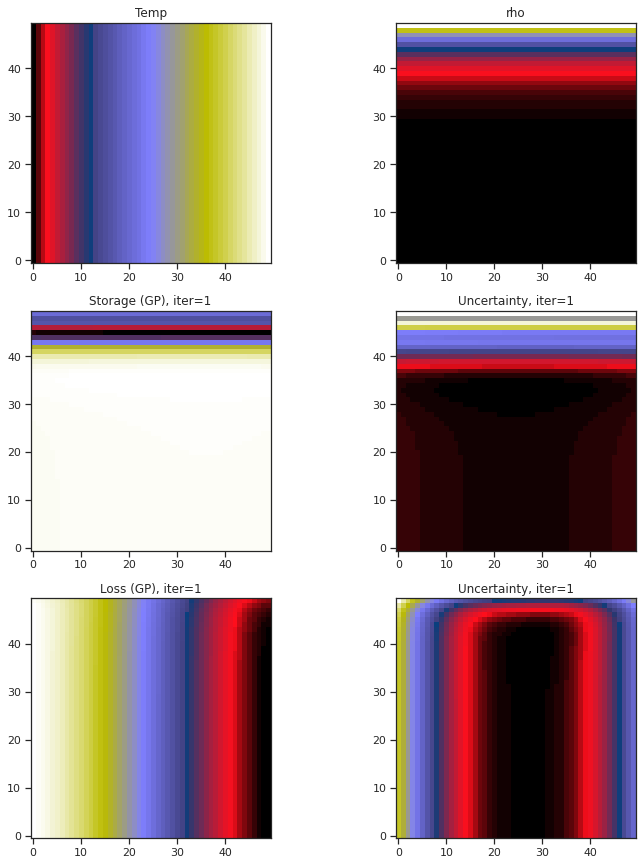

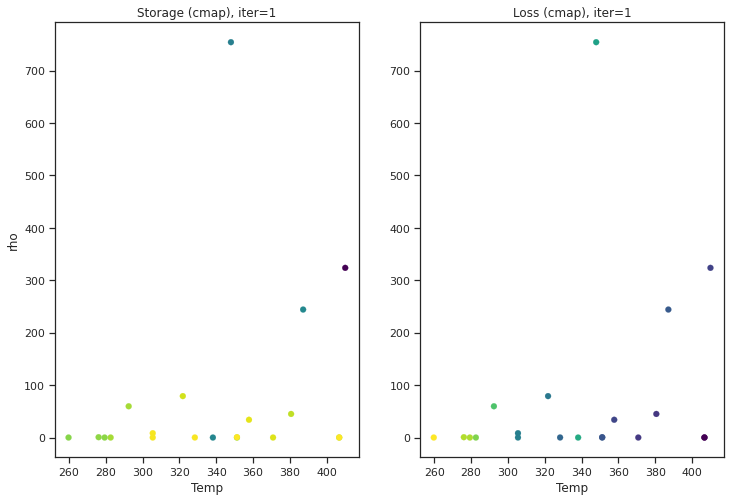

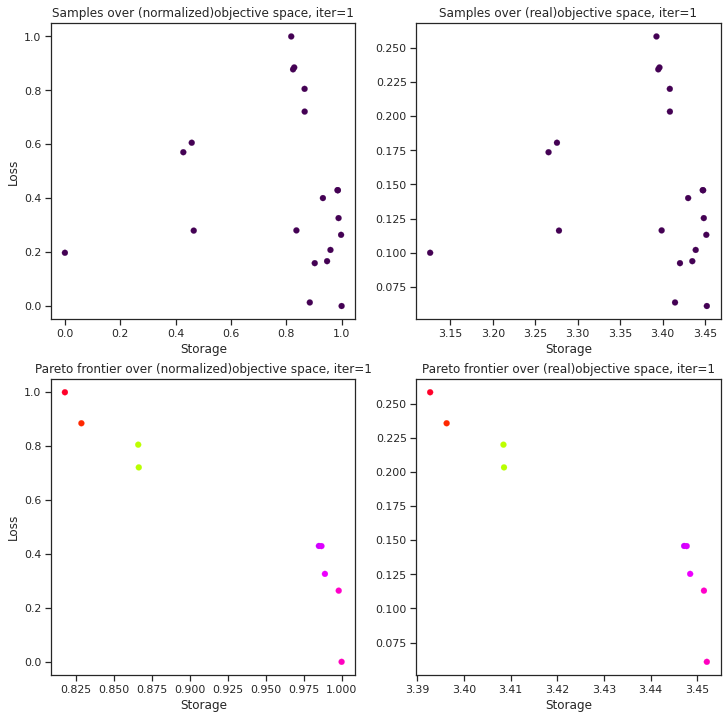

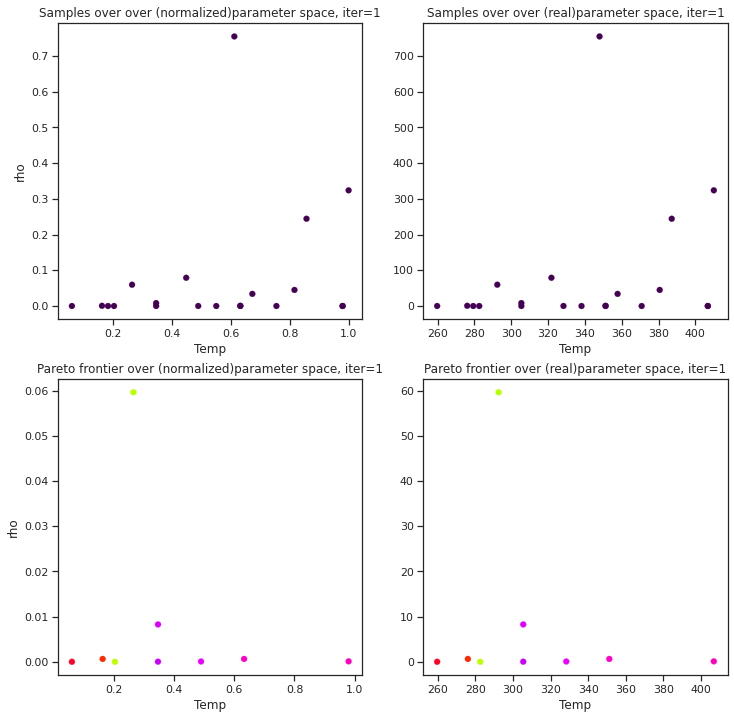

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #21
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #22
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #23
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #24
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #25
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #26
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #27
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #28
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #29
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


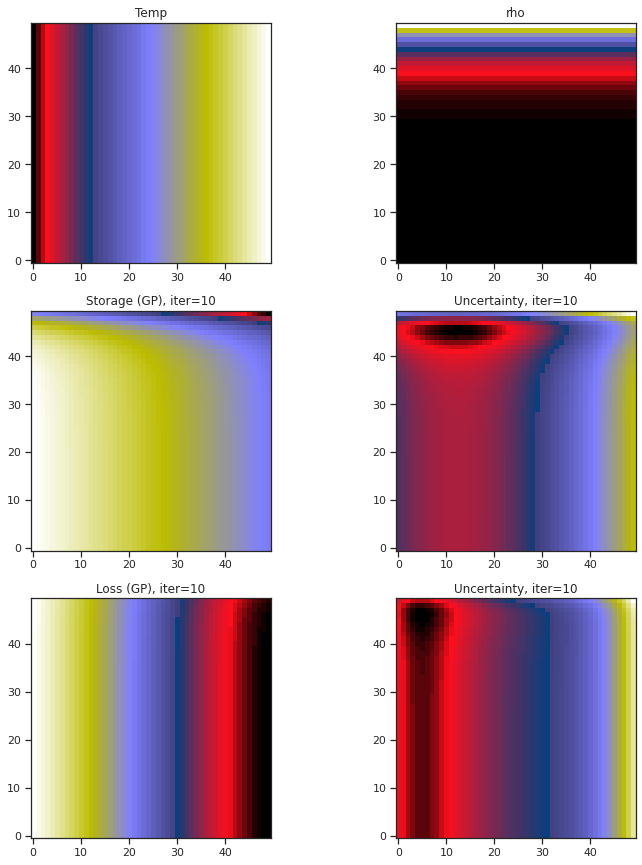

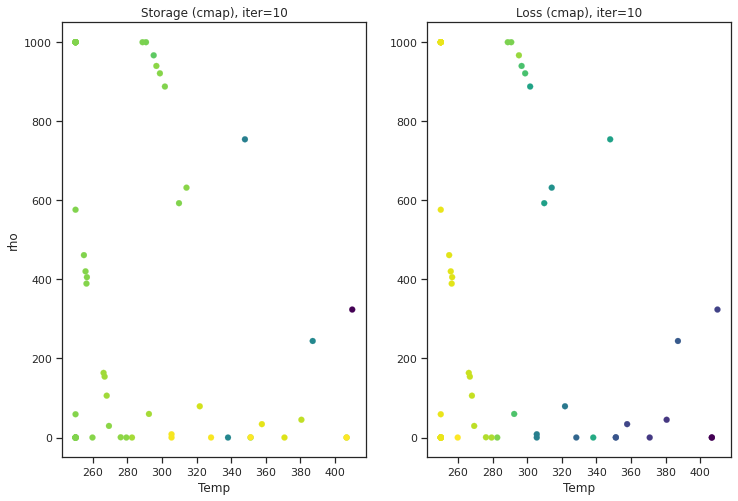

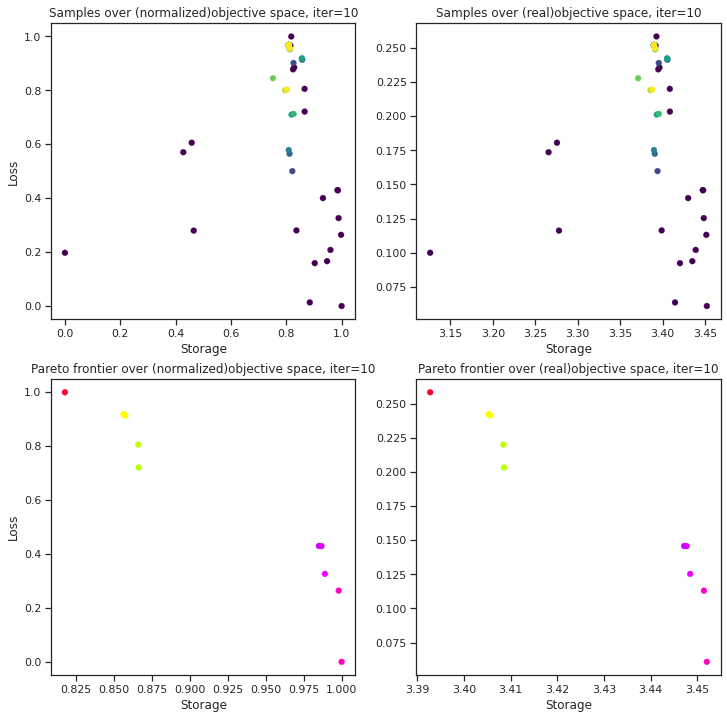

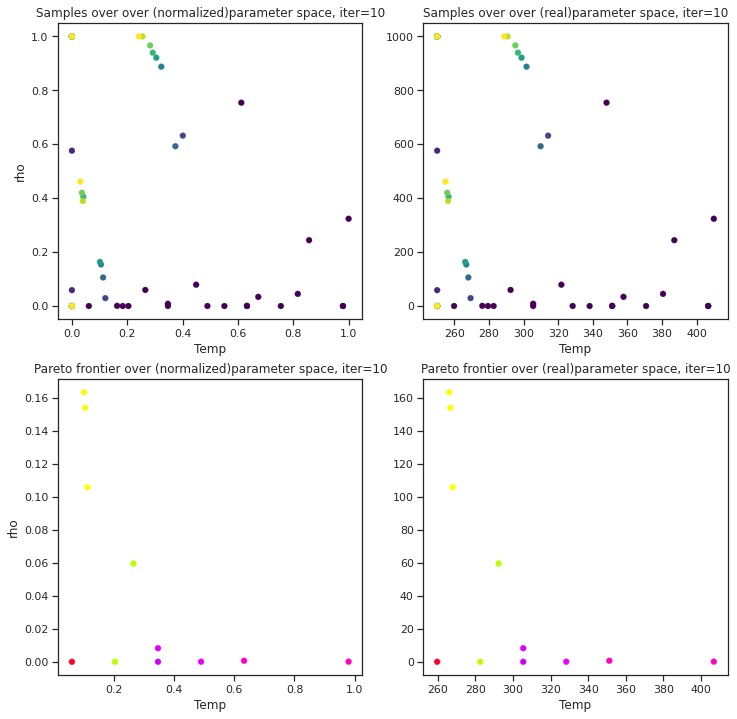

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #30
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #31
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #32
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #33
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #34
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #35
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #36
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #37
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #38
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #39
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


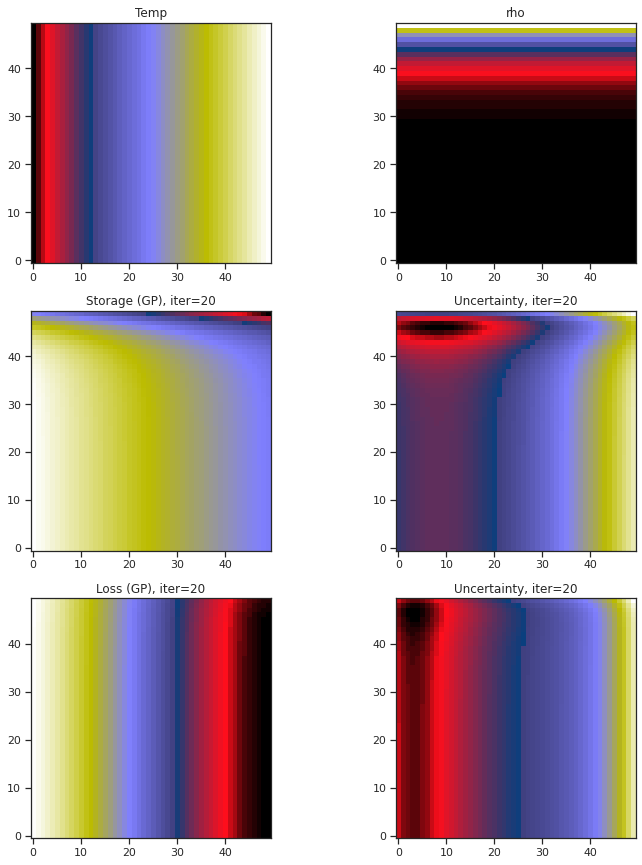

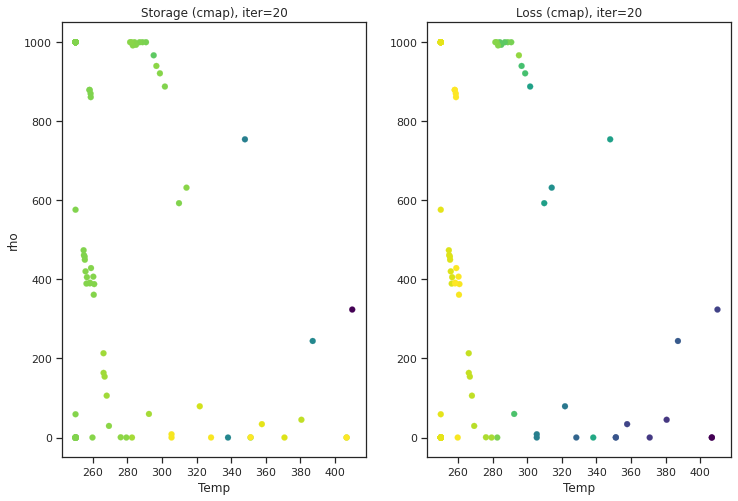

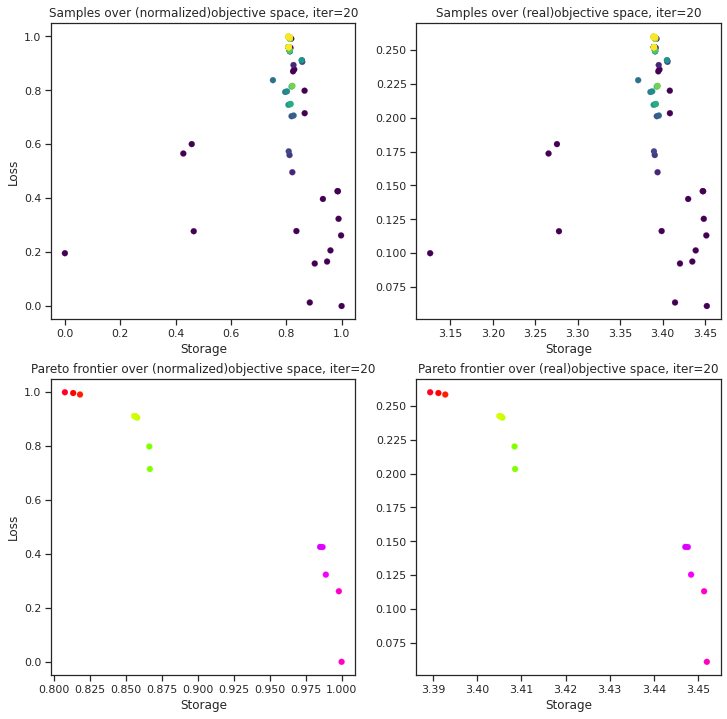

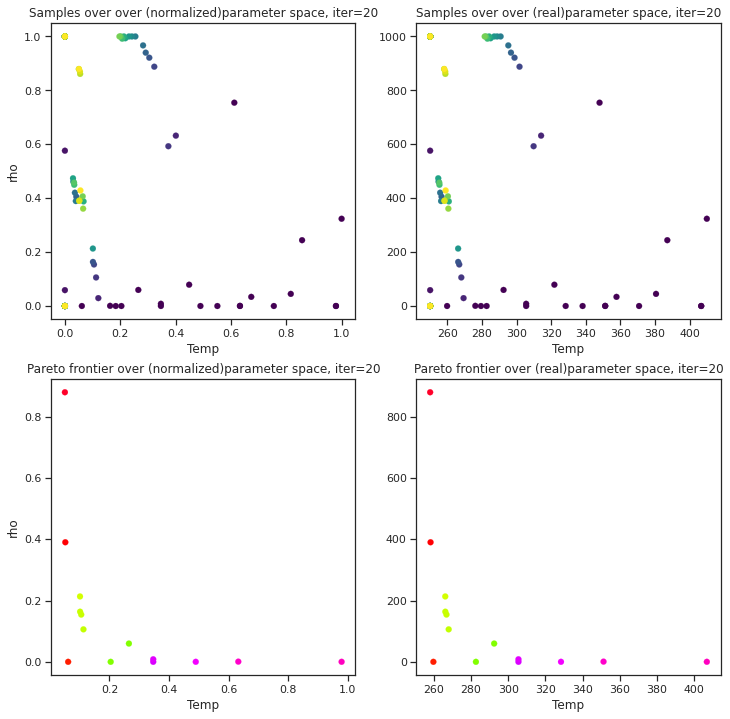

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #40
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #41
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #42
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #43
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #44
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #45
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #46
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #47
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #48
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #49
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


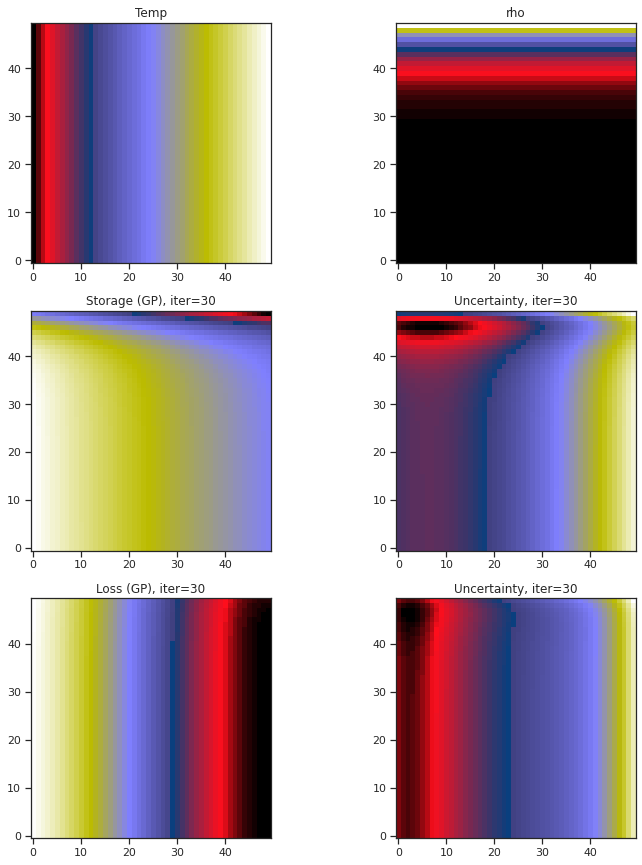

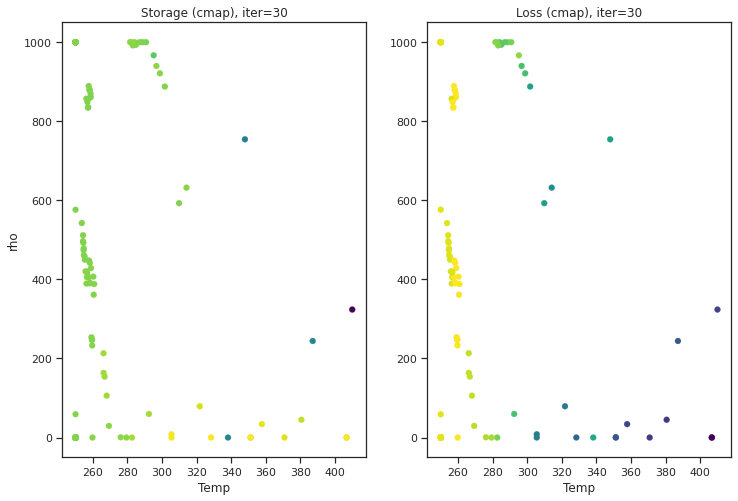

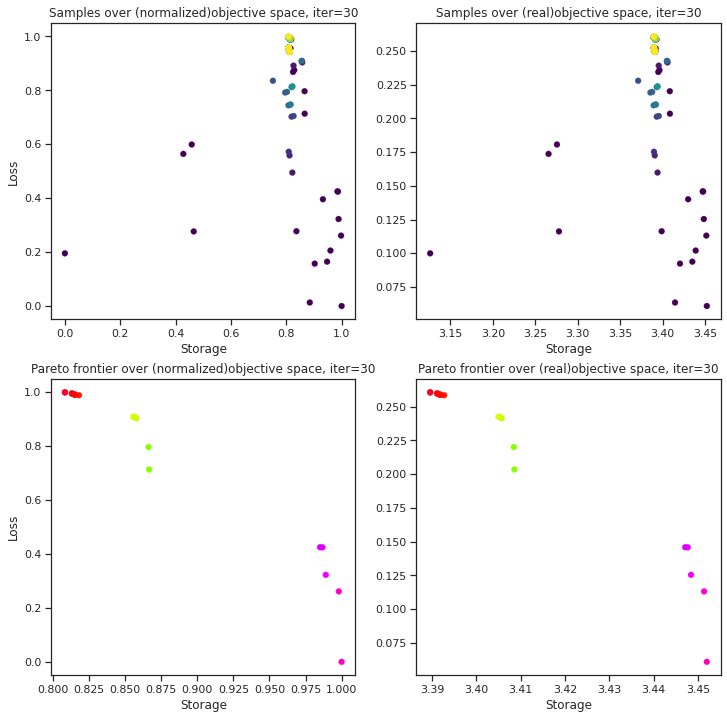

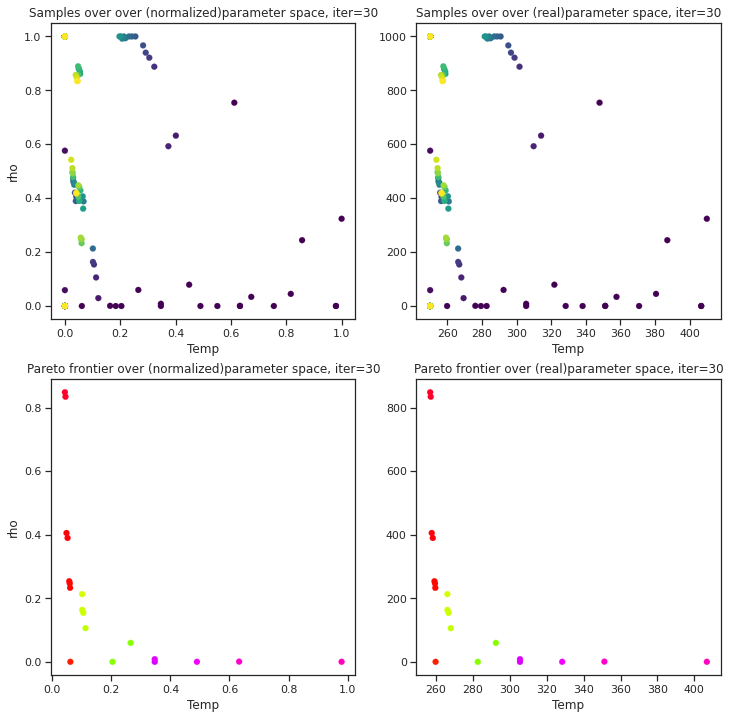

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #50
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Max. sampling reached, model stopped


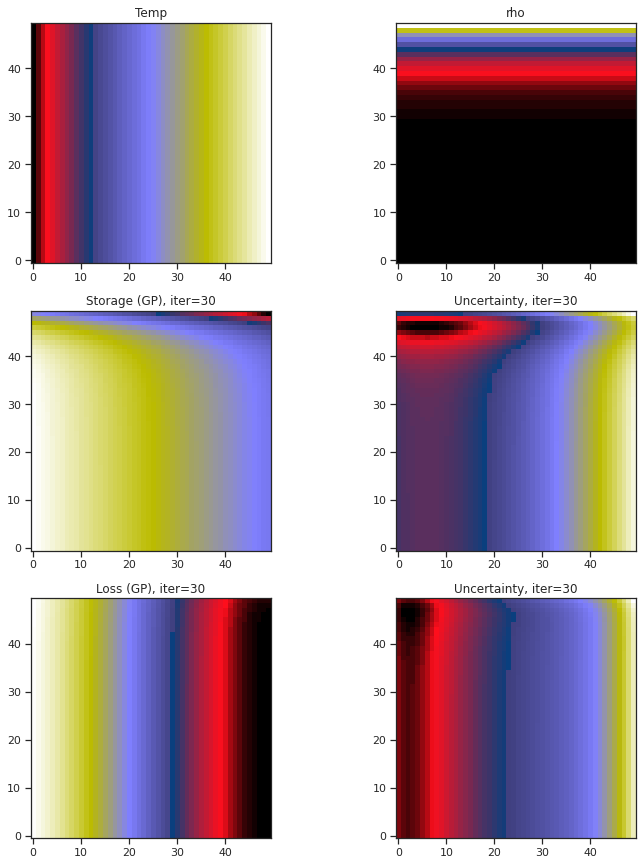

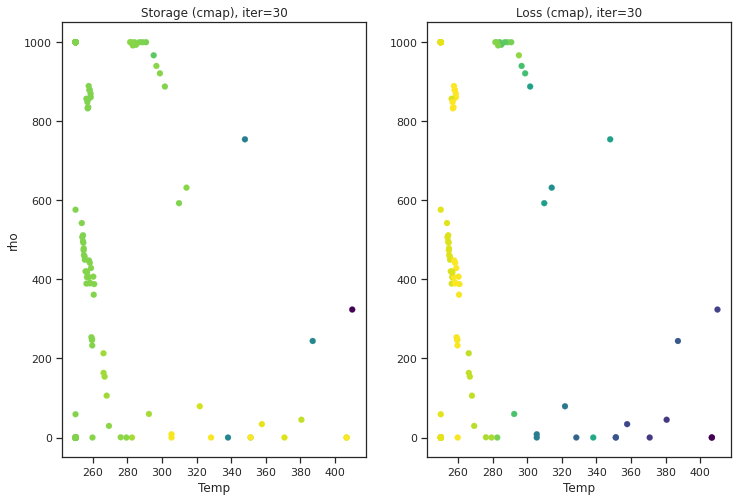

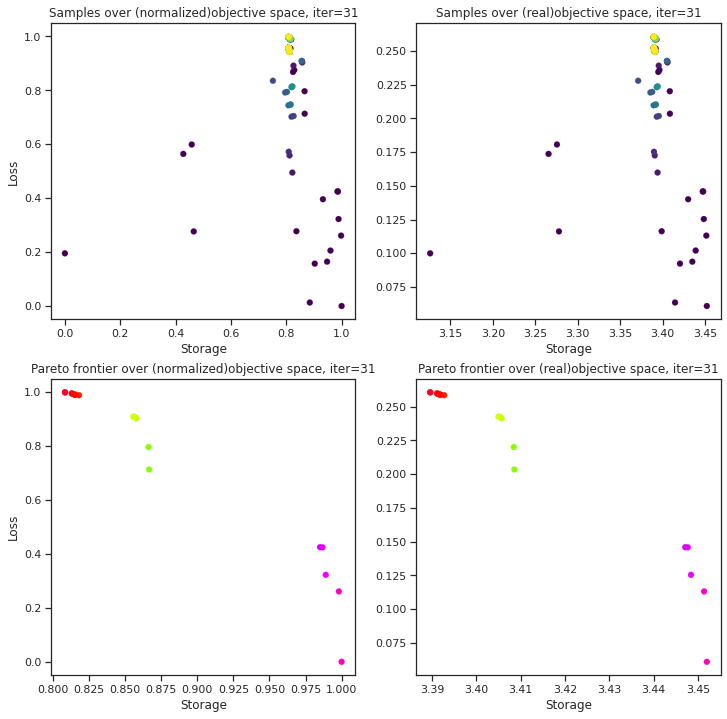

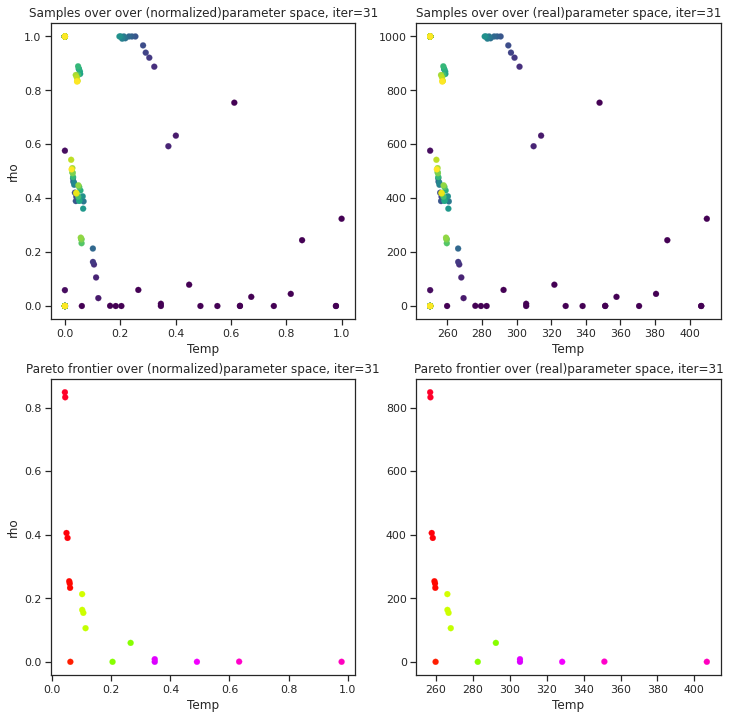

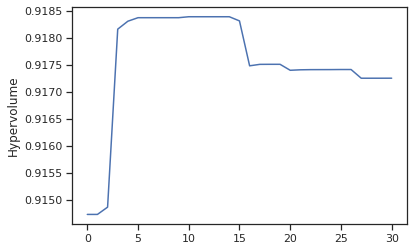

In [ ]:
tkwargs = {
    "dtype": to.double,
    "device": to.device("cuda" if to.cuda.is_available() else "cpu"),
}
BATCH_SIZE = 4 #For each iteration in BO, how many future samples we select in batch


time_vec = np.linspace(0, 2, 500)
A = 3 #Fixed amplitude
E = A * np.sin(2 * np.pi * time_vec)

# List of options
# 'qEHVI'- Expected Hypervolume acquistion function
# 'qParEGO' -qParEGO
acquisition = 'qEHVI'
# Input choice of problem- where it is minimization or maximization for objective 1 and 2 respectively
# List of options
# 'min'- Minimization
# 'max' -Maximization (default setting)
problem =['max','max']

#List of control params- Temp, rho, h, deltaG
# Choose any two control params to create the parameter space considering above the same order-
param1 = 'Temp'
param2 = 'rho'
# Choose any two objectives to do MOO (MOBO)-
obj1 = 'Storage'
obj2 = 'Loss'


#Define parameter space based on above choice of params (2D only)
num_rows =50
max_hysplot_dim =10
toggle_num_dim =10
num = 20  # Starting samples
N= 30
#N = (0.5 * num_rows ** 2) - num  # Maximum evaluations
#N = int(N)
if (param1 == 'Temp') or (param2 == 'Temp'):
    #Creating domain space for T
    T = np.linspace(250, 410, num_rows)
    test_T = np.linspace(250, 410, num_rows) # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'Temp'):
        # Build X dataset
        X1 = T
        test_X1 = test_T
    if (param2 == 'Temp'):
        # Build X dataset
        X2 = T
        test_X2 = test_T

else:
    ##Fixed params
    T=300

if (param1 == 'rho') or (param2 == 'rho'):
    # Creating domain space for rho
    n = np.linspace(-3, 3, num_rows)
    rho = np.zeros(len(n))
    test_rho = np.zeros(len(n))
    for i in range(0, len(n)):
        rho[i] = 10 ** (n[i])
        test_rho[i] = 10 ** (n[i])  # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'rho'):
        # Build X dataset
        X1 = rho
        test_X1 = test_rho
    if (param2 == 'rho'):
        # Build X dataset
        X2 = rho
        test_X2 = test_rho

else:
    ##Fixed params
    rho=10

if (param1 == 'h') or (param2 == 'h'):
    #Creating domain space for h
    h = np.linspace(3, 60, num_rows)
    test_h = np.linspace(3, 60, num_rows)  # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'h'):
        # Build X dataset
        X1 = h
        test_X1 = test_h
    if (param2 == 'h'):
        # Build X dataset
        X2 = h
        test_X2 = test_h

else:
    ##Fixed params
    h=5

if (param1 == 'deltaG') or (param2 == 'deltaG'):
    #Creating domain space for deltaG
    deltaG = np.linspace(0.02, 2, num_rows)
    test_deltaG = np.linspace(0.02, 2, num_rows) # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'deltaG'):
        # Build X dataset
        X1 = deltaG
        test_X1 = test_deltaG
    if (param2 == 'deltaG'):
        # Build X dataset
        X2 = deltaG
        test_X2 = test_deltaG

else:
    deltaG=0.2

#Order of parameters to input after choosing for control and fixed parameters - T, rho, h, delta
# example- If we consider control params as T and h- we provide arguments as 
# MOBO(X1, X2, rho, deltaG, .....)
#Run MOBO -the first two arguments are the control parameters in the recommended order, the next two arguments are the remaining parameters as fixed in the recommended order
MOBO_PZO(X1, X2, h, deltaG, E, test_X1, test_X2, num_rows, N, BATCH_SIZE, param1, param2, obj1, obj2, acquisition, problem, max_hysplot_dim, toggle_num_dim)



<h1>Analysis 3c

Temp vs rho (partial O2 pressure)

50x50 grid space, Max func evaluation- 30 (max iter)x 4(batch_size) + 20(starting samples)

$Temp = [255, 350]; rho =[10^6, 10^8]; h=50nm; \Delta_G =0.2$

FE phase

**Maximize Energy Storage and Loss** - Adaptive sampling to balance between high storage and loss and find the pareto frontier.

acquistion function - **qParEGO**

Function evaluaton for initial randomly selected samples
Function eval #1
Function eval #2
Function eval #3
Function eval #4
Function eval #5
Function eval #6
Function eval #7
Function eval #8
Function eval #9
Function eval #10
Function eval #11
Function eval #12
Function eval #13
Function eval #14
Function eval #15
Function eval #16
Function eval #17
Function eval #18
Function eval #19
Function eval #20
Initial evaluation complete. Start BO- acq func: qParEGO


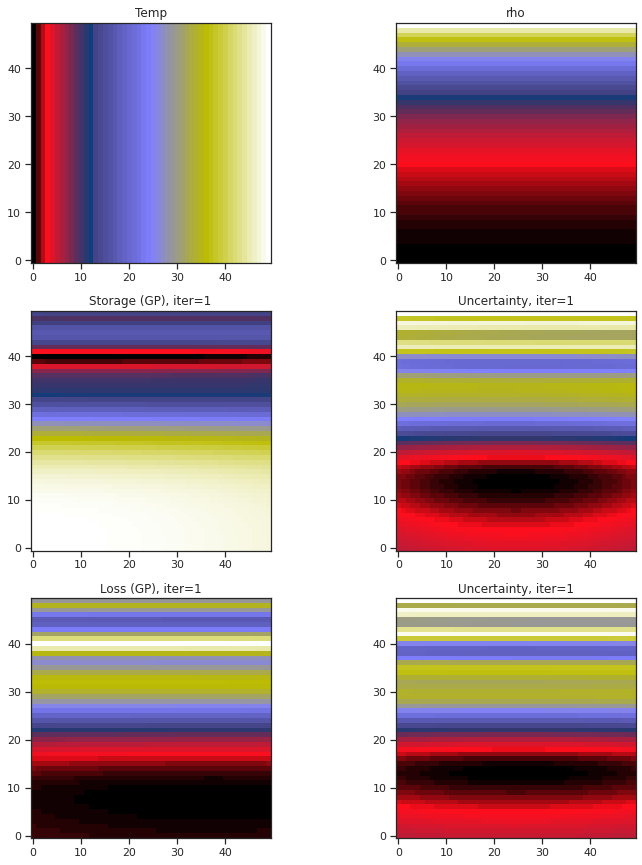

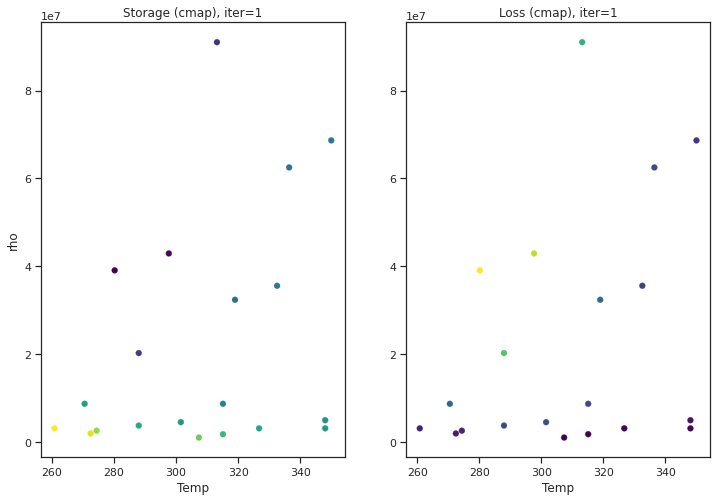

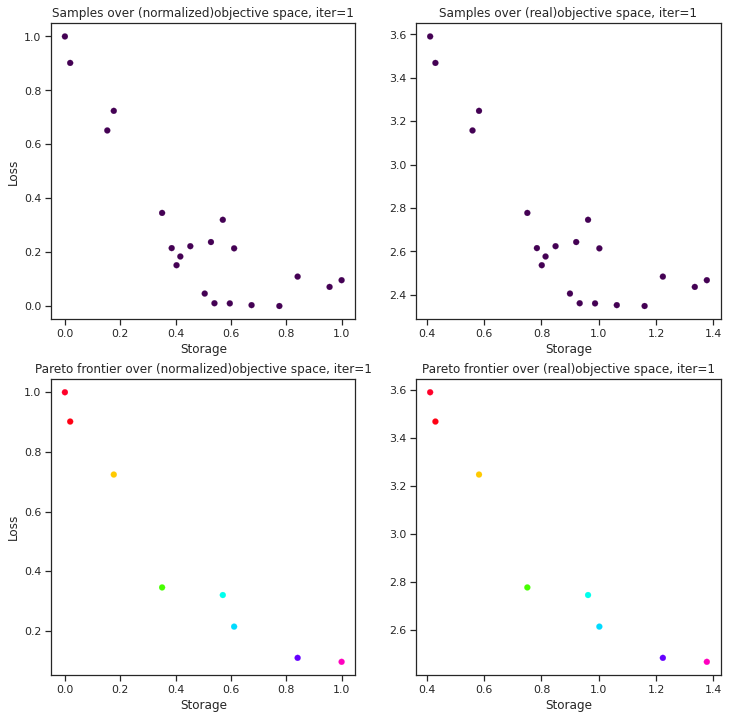

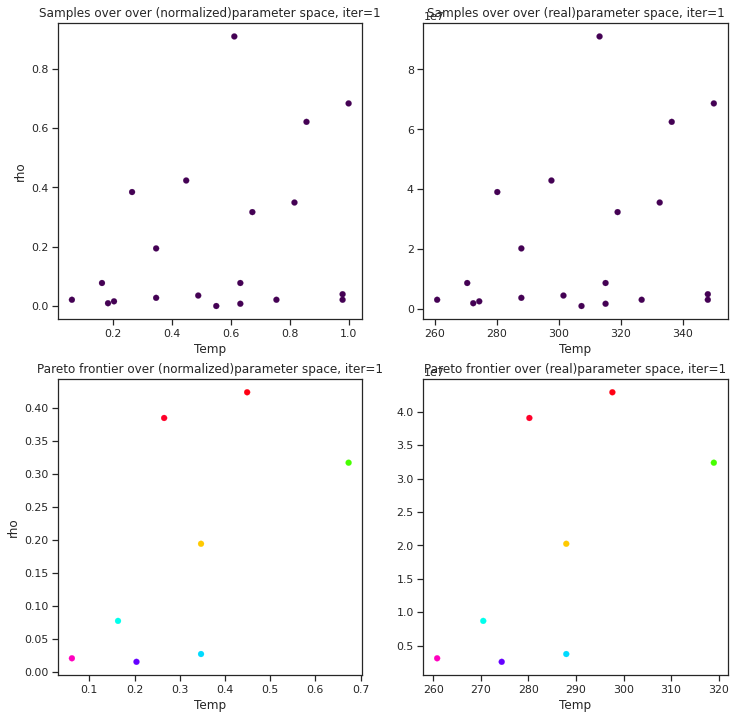

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #21
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #22
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #23
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #24
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #25
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #26
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #27
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #28
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #29
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


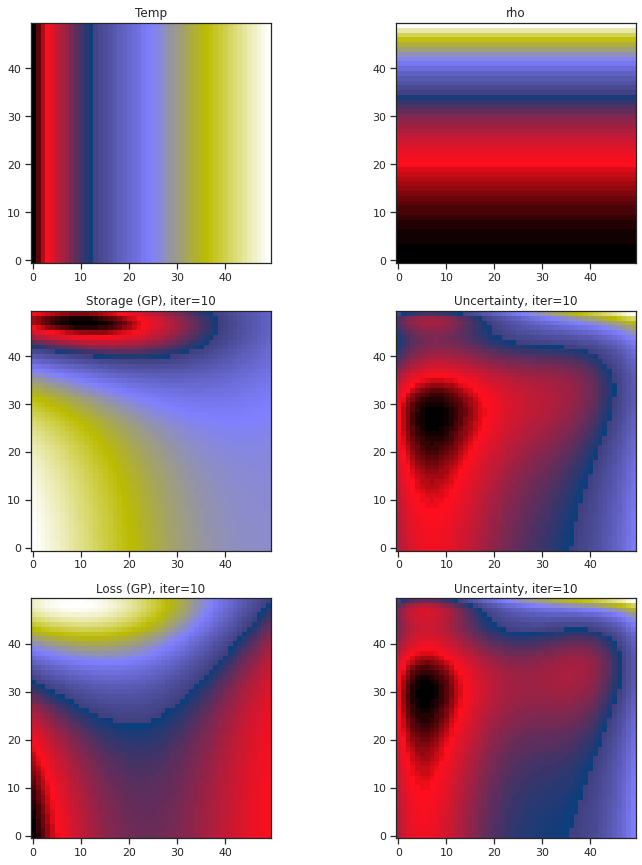

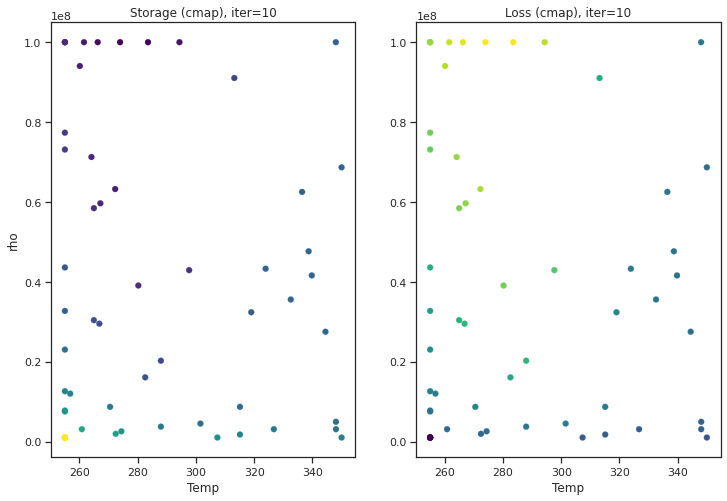

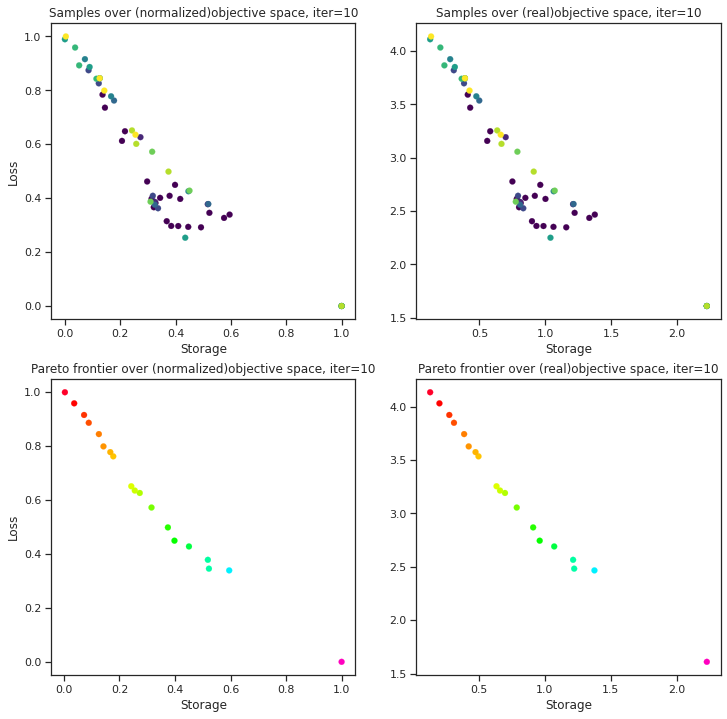

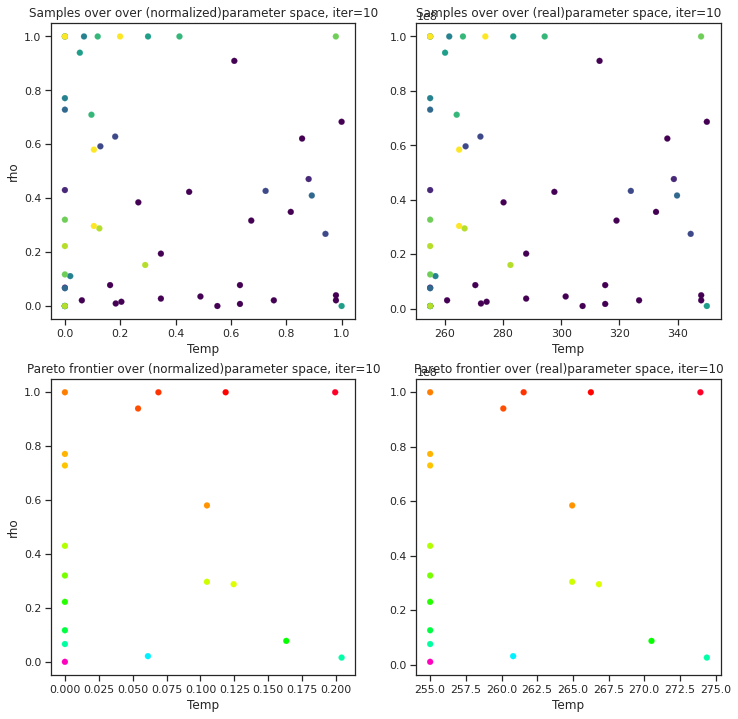

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #30
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #31
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #32
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #33
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #34
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #35
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #36
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #37
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #38
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #39
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


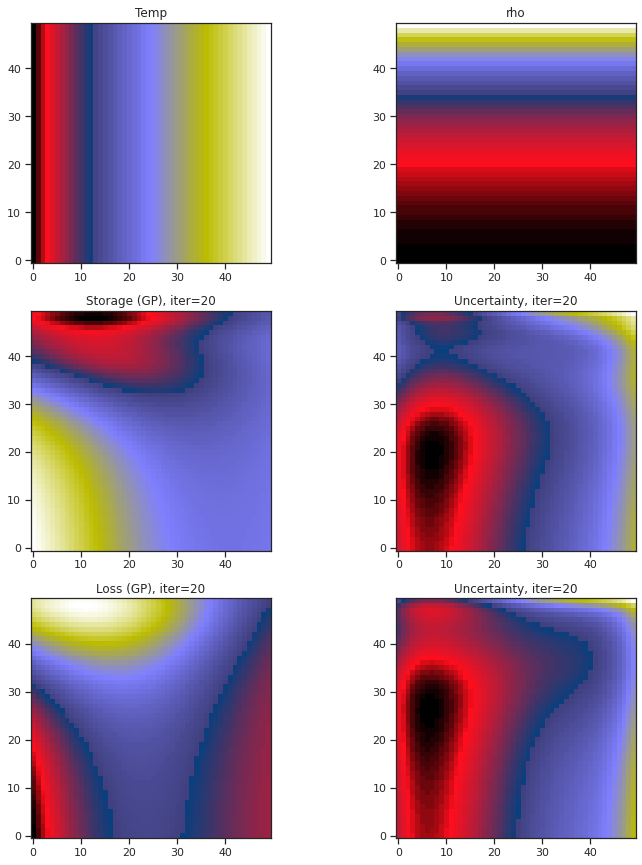

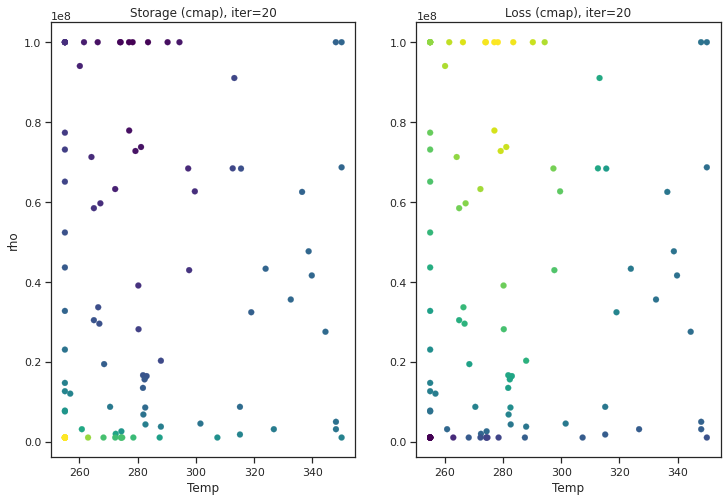

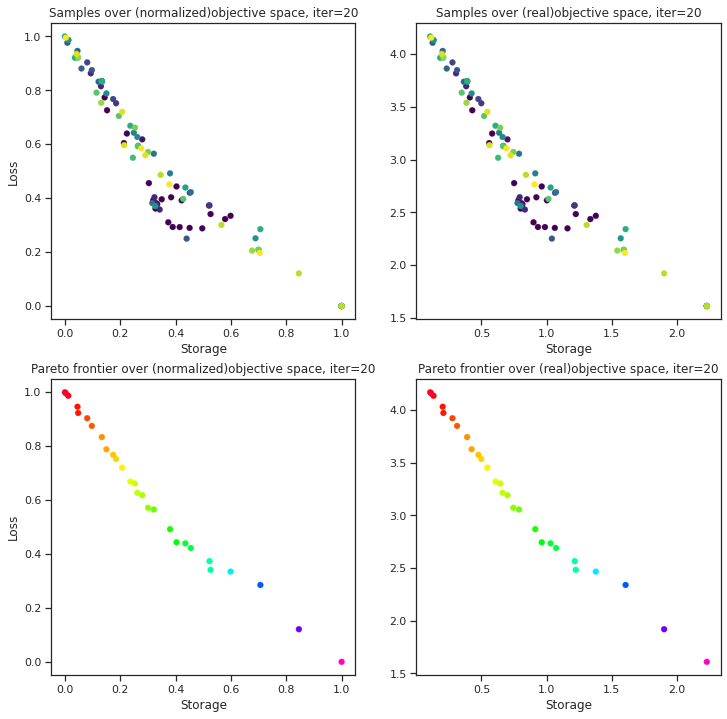

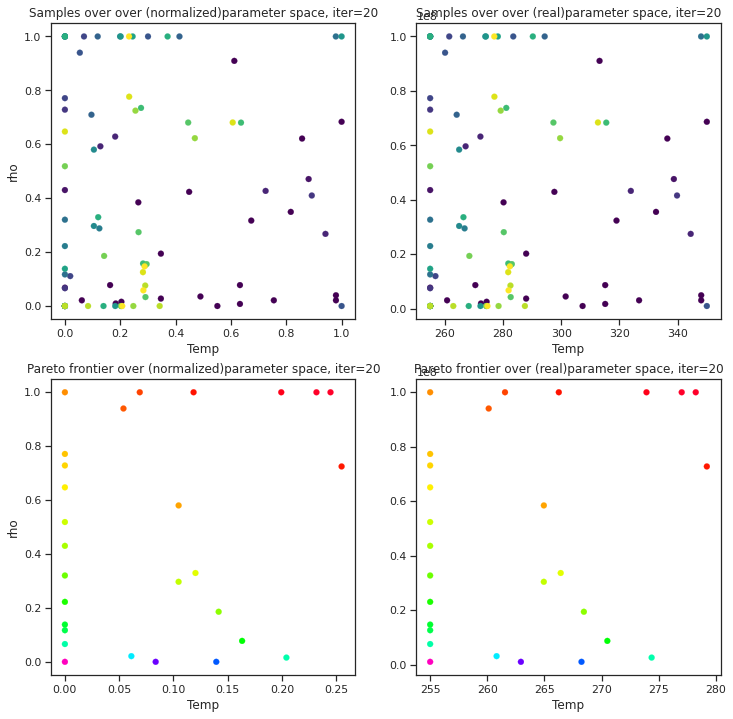

Batch Function eval #40
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #41
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #42
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #43
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #44
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #45
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval:

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #47
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #48
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #49
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


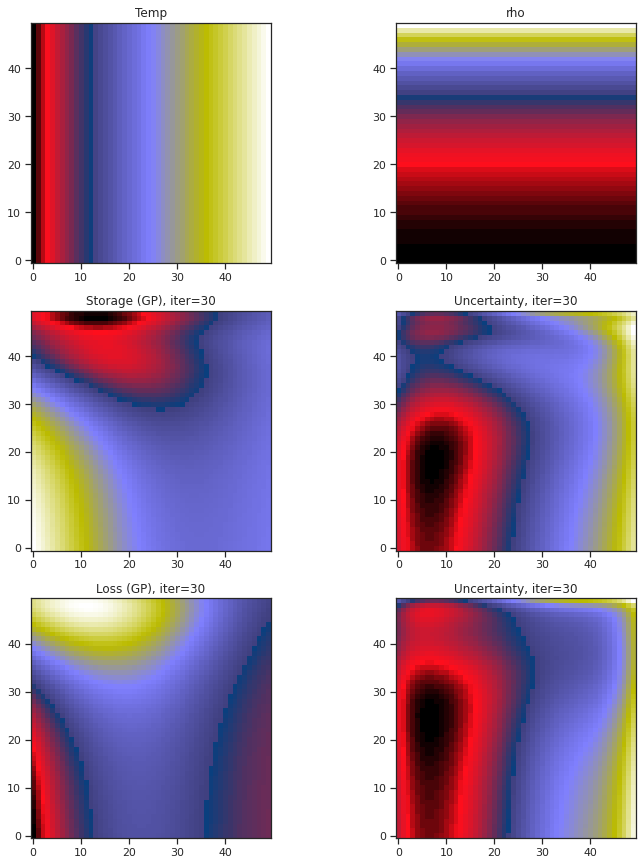

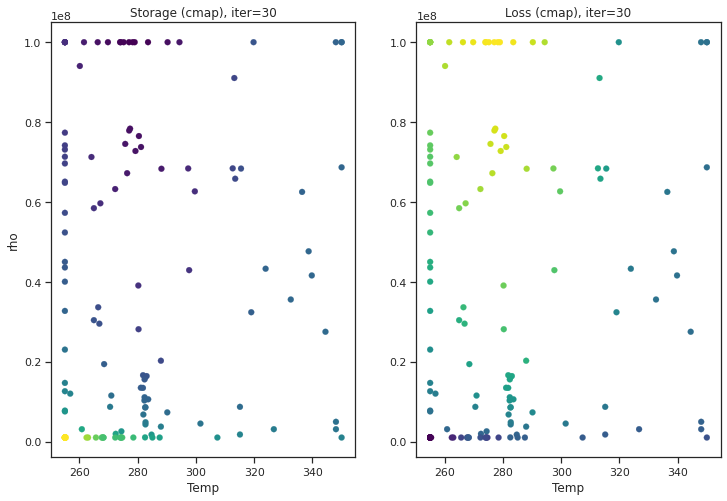

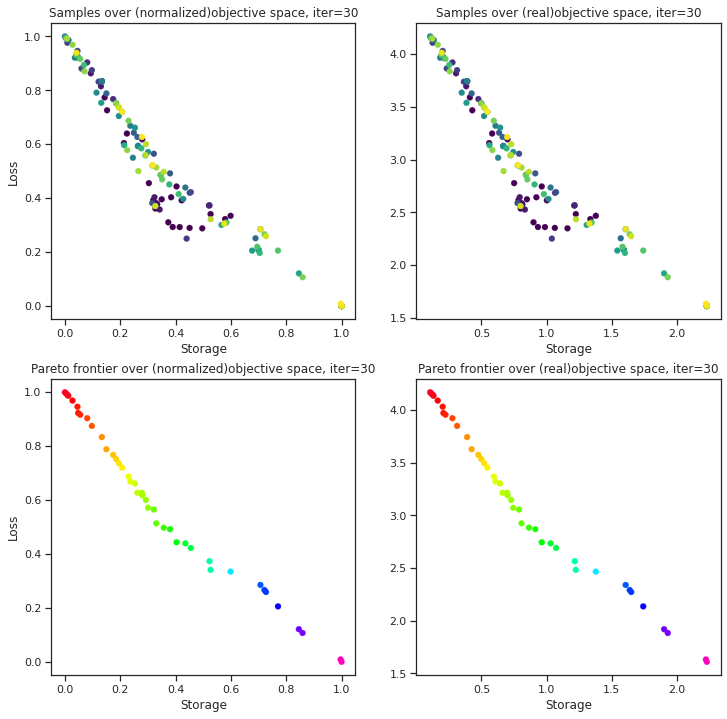

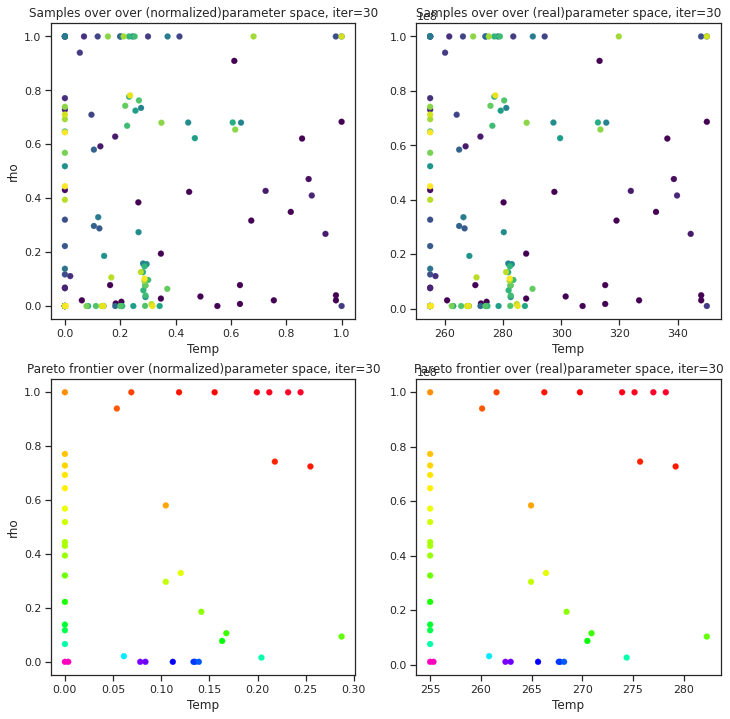

Batch Function eval #50
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Max. sampling reached, model stopped


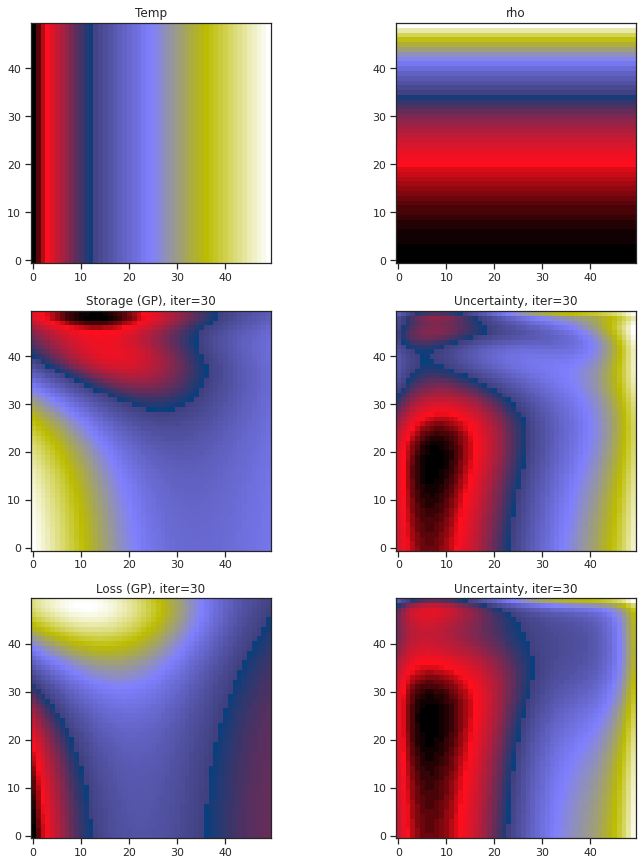

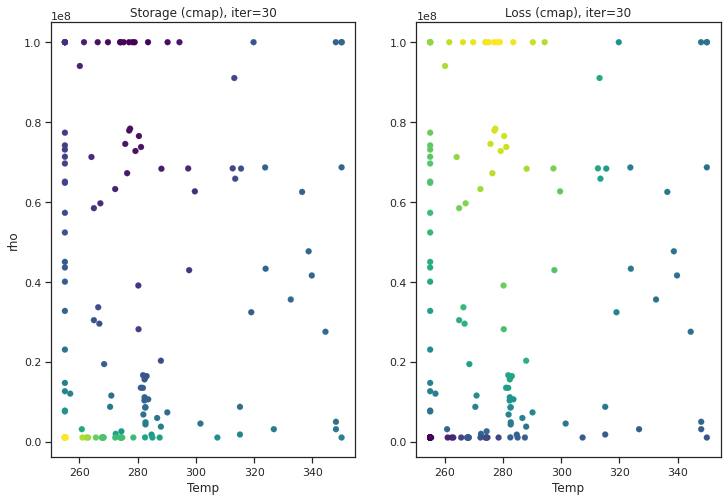

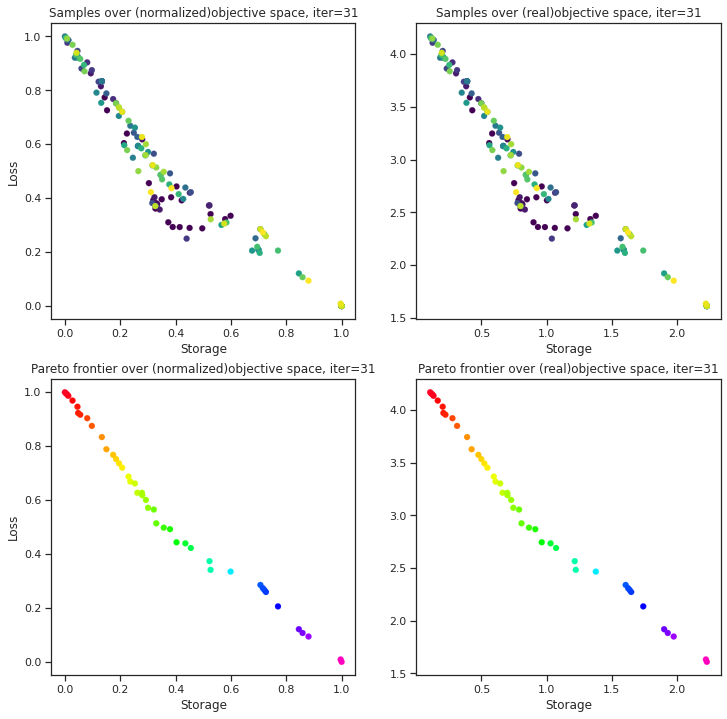

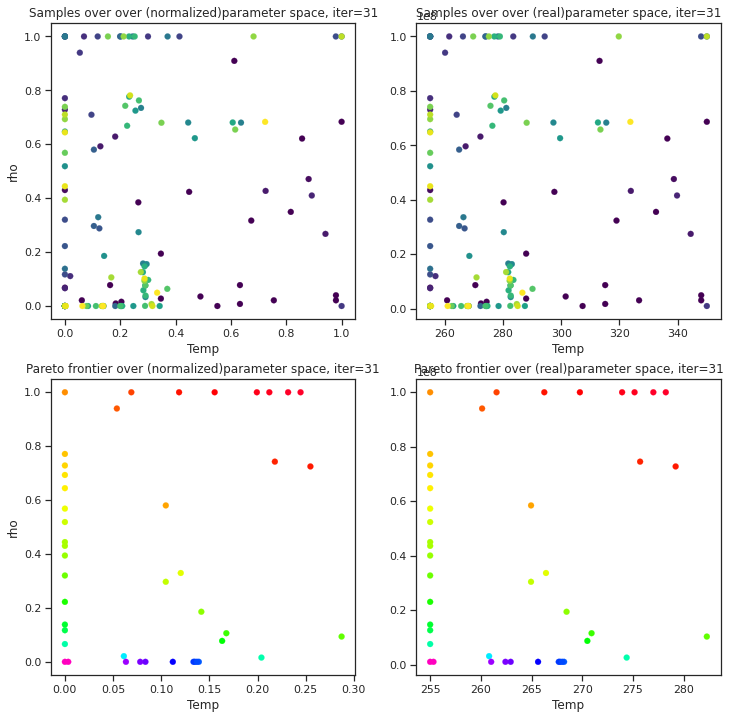

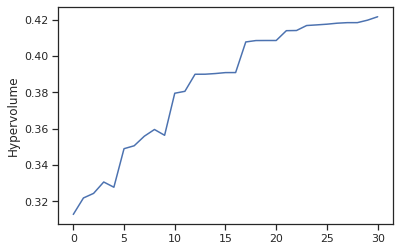

In [ ]:
tkwargs = {
    "dtype": to.double,
    "device": to.device("cuda" if to.cuda.is_available() else "cpu"),
}
BATCH_SIZE = 4 #For each iteration in BO, how many future samples we select in batch


time_vec = np.linspace(0, 2, 500)
A = 3 #Fixed amplitude
E = A * np.sin(2 * np.pi * time_vec)

# List of options
# 'qEHVI'- Expected Hypervolume acquistion function
# 'qParEGO' -qParEGO
acquisition = 'qParEGO'
# Input choice of problem- where it is minimization or maximization for objective 1 and 2 respectively
# List of options
# 'min'- Minimization
# 'max' -Maximization (default setting)
problem =['max','max']

#List of control params- Temp, rho, h, deltaG
# Choose any two control params to create the parameter space considering above the same order-
param1 = 'Temp'
param2 = 'rho'
# Choose any two objectives to do MOO (MOBO)-
obj1 = 'Storage'
obj2 = 'Loss'


#Define parameter space based on above choice of params (2D only)
num_rows =50
max_hysplot_dim =10
toggle_num_dim =10
num = 20  # Starting samples
N= 30
#N = (0.5 * num_rows ** 2) - num  # Maximum evaluations
#N = int(N)
if (param1 == 'Temp') or (param2 == 'Temp'):
    #Creating domain space for T
    T = np.linspace(255, 350, num_rows)
    test_T = np.linspace(255, 350, num_rows) # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'Temp'):
        # Build X dataset
        X1 = T
        test_X1 = test_T
    if (param2 == 'Temp'):
        # Build X dataset
        X2 = T
        test_X2 = test_T

else:
    ##Fixed params
    T=300

if (param1 == 'rho') or (param2 == 'rho'):
    # Creating domain space for rho
    n = np.linspace(6, 8, num_rows)
    rho = np.zeros(len(n))
    test_rho = np.zeros(len(n))
    for i in range(0, len(n)):
        rho[i] = 10 ** (n[i])
        test_rho[i] = 10 ** (n[i])  # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'rho'):
        # Build X dataset
        X1 = rho
        test_X1 = test_rho
    if (param2 == 'rho'):
        # Build X dataset
        X2 = rho
        test_X2 = test_rho

else:
    ##Fixed params
    rho=10

if (param1 == 'h') or (param2 == 'h'):
    #Creating domain space for h
    h = np.linspace(3, 60, num_rows)
    test_h = np.linspace(3, 60, num_rows)  # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'h'):
        # Build X dataset
        X1 = h
        test_X1 = test_h
    if (param2 == 'h'):
        # Build X dataset
        X2 = h
        test_X2 = test_h

else:
    ##Fixed params
    h=50

if (param1 == 'deltaG') or (param2 == 'deltaG'):
    #Creating domain space for deltaG
    deltaG = np.linspace(0.02, 2, num_rows)
    test_deltaG = np.linspace(0.02, 2, num_rows) # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'deltaG'):
        # Build X dataset
        X1 = deltaG
        test_X1 = test_deltaG
    if (param2 == 'deltaG'):
        # Build X dataset
        X2 = deltaG
        test_X2 = test_deltaG

else:
    deltaG=0.2

#Order of parameters to input after choosing for control and fixed parameters - T, rho, h, delta
# example- If we consider control params as T and h- we provide arguments as 
# MOBO(X1, X2, rho, deltaG, .....)
#Run MOBO -the first two arguments are the control parameters in the recommended order, the next two arguments are the remaining parameters as fixed in the recommended order
MOBO_PZO(X1, X2, h, deltaG, E, test_X1, test_X2, num_rows, N, BATCH_SIZE, param1, param2, obj1, obj2, acquisition, problem, max_hysplot_dim, toggle_num_dim)




<h1> Analysis 3d

Using **qEHVI** acquistion function

Function evaluaton for initial randomly selected samples
Function eval #1
Function eval #2
Function eval #3
Function eval #4
Function eval #5
Function eval #6
Function eval #7
Function eval #8
Function eval #9
Function eval #10
Function eval #11
Function eval #12
Function eval #13
Function eval #14
Function eval #15
Function eval #16
Function eval #17
Function eval #18
Function eval #19
Function eval #20
Initial evaluation complete. Start BO- acq func: qEHVI


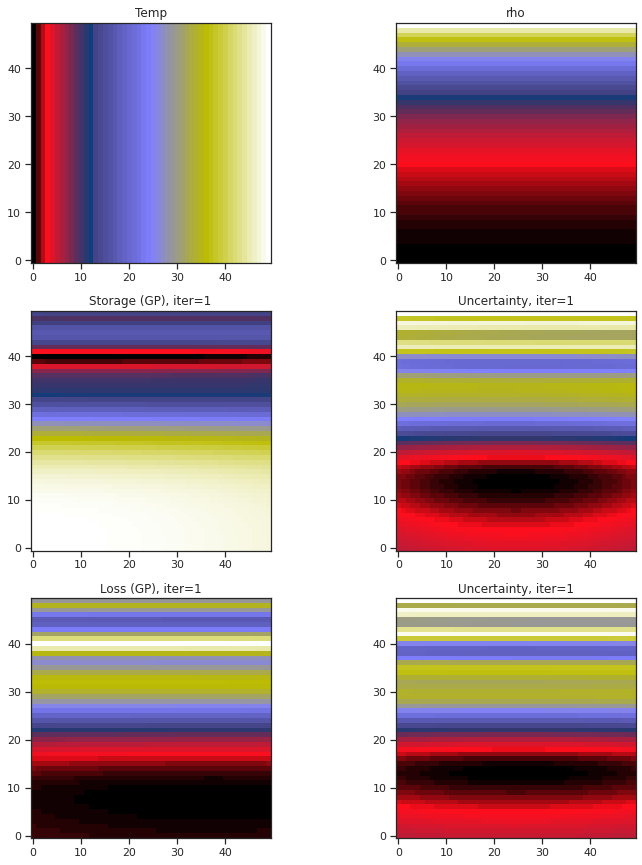

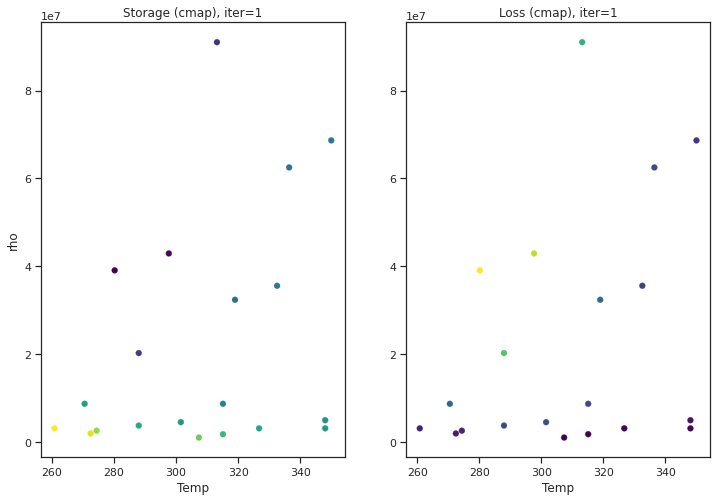

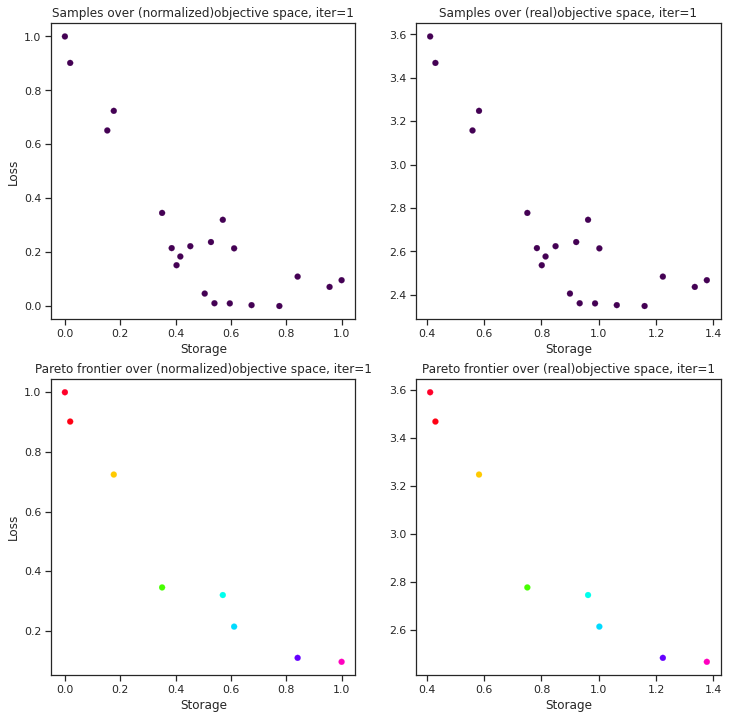

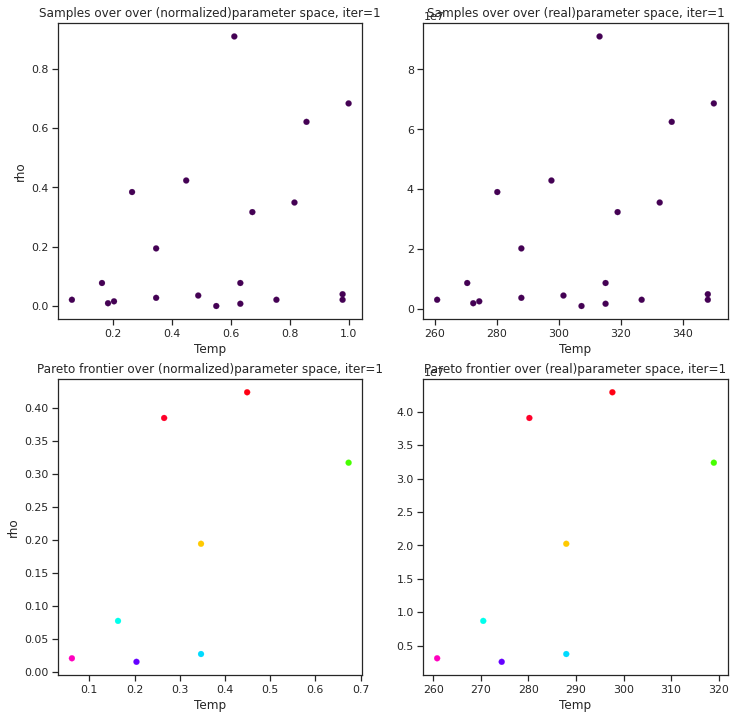

Batch Function eval #21
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #22
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #23
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #24
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #25
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #26
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #27
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #28
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #29
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


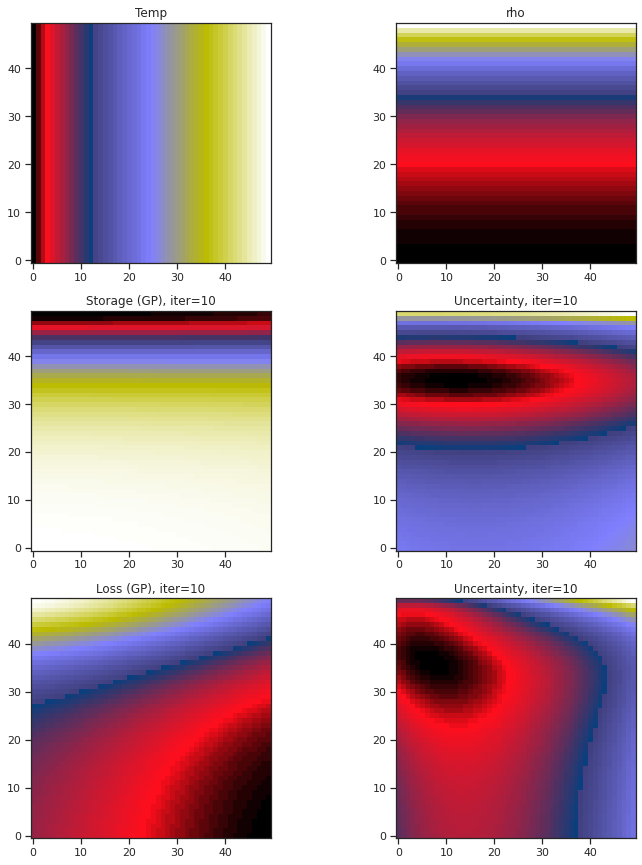

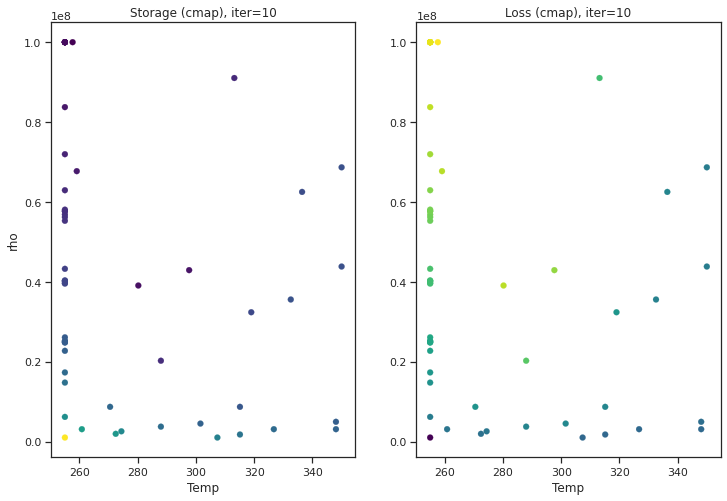

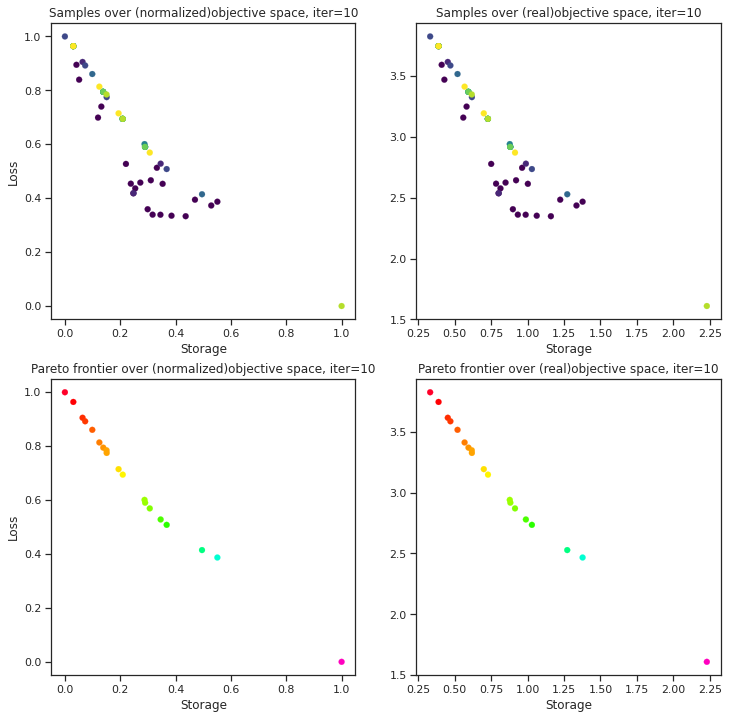

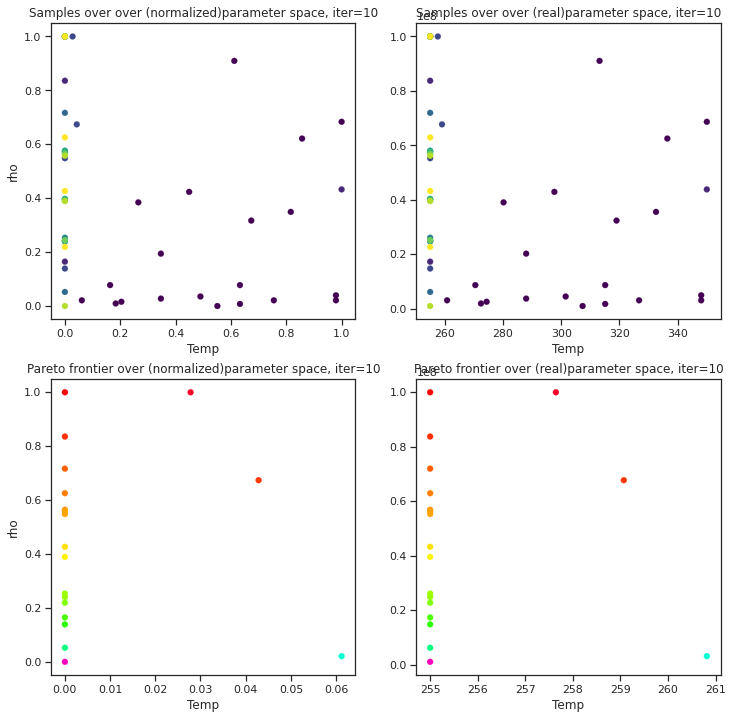

Batch Function eval #30
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #31
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #32
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #33
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #34
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #35
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #36
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #37
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #38
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #39
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


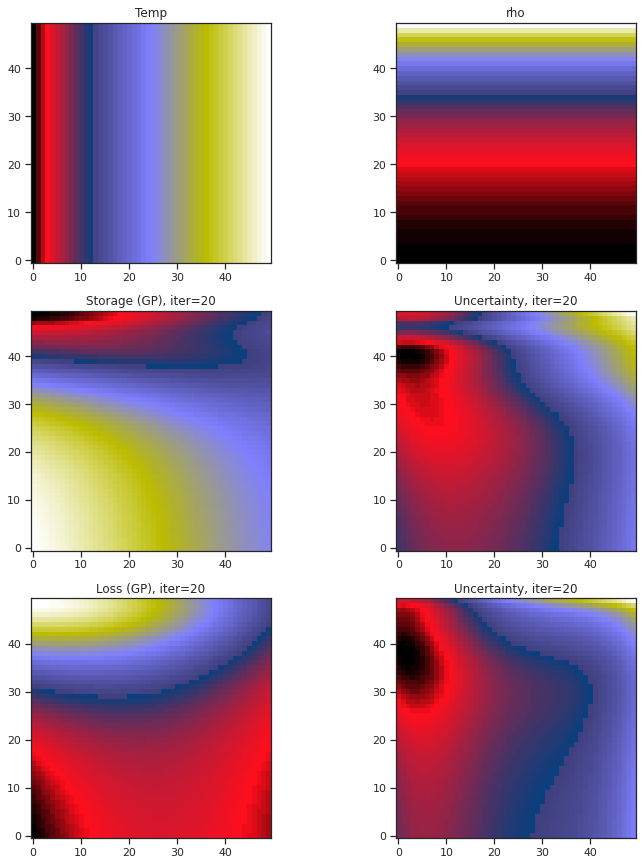

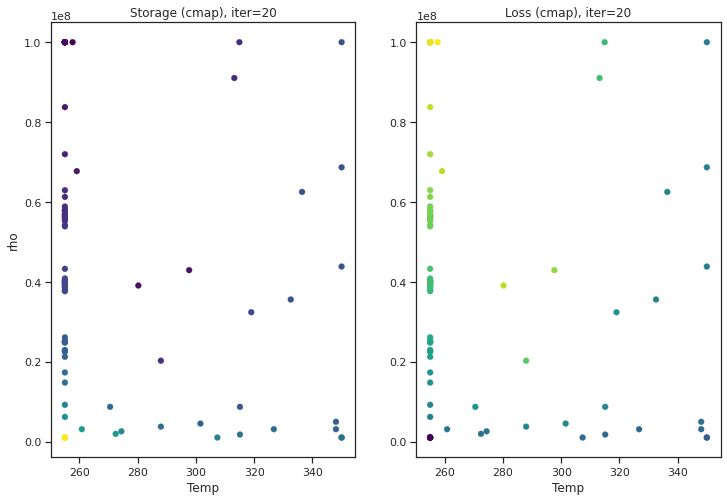

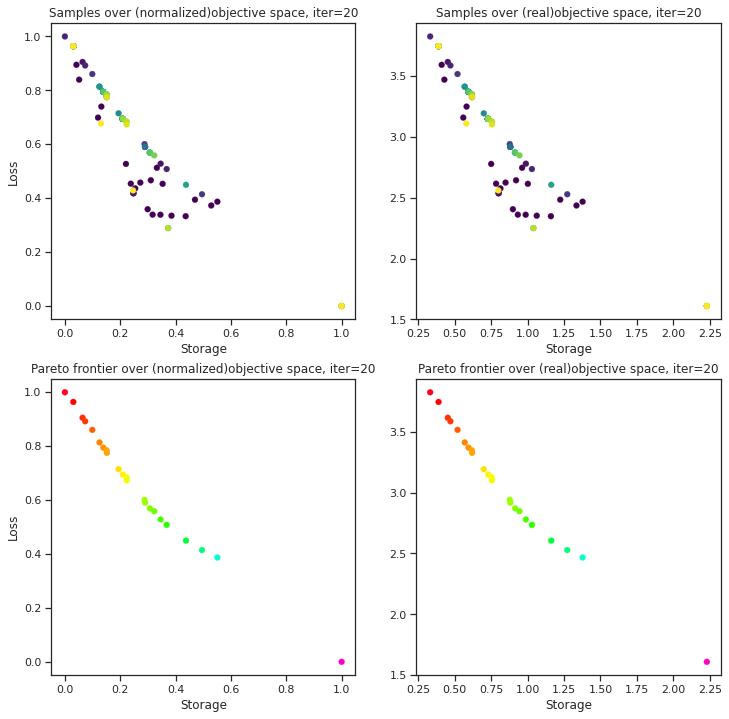

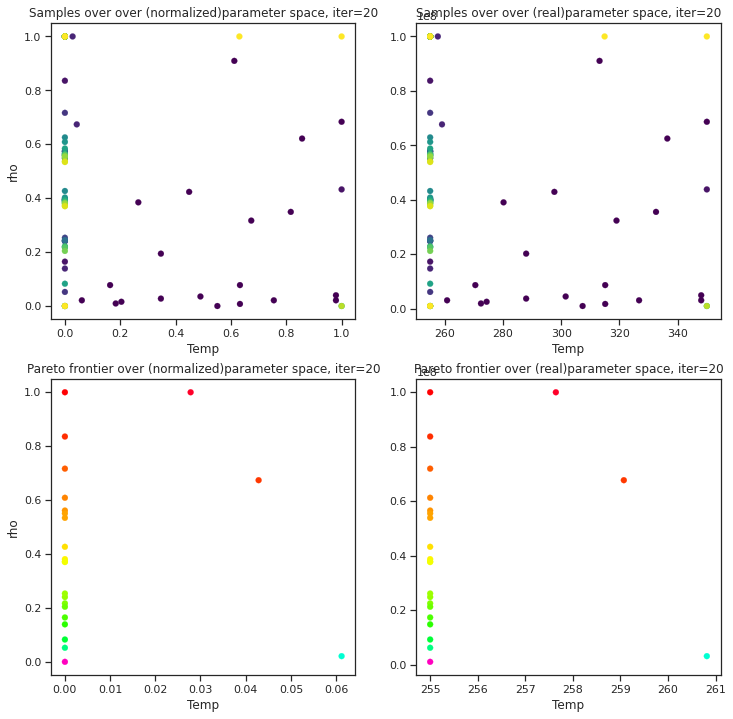

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #40
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #41
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #42
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #43
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #44
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #45
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #46
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #47
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #48
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #49
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


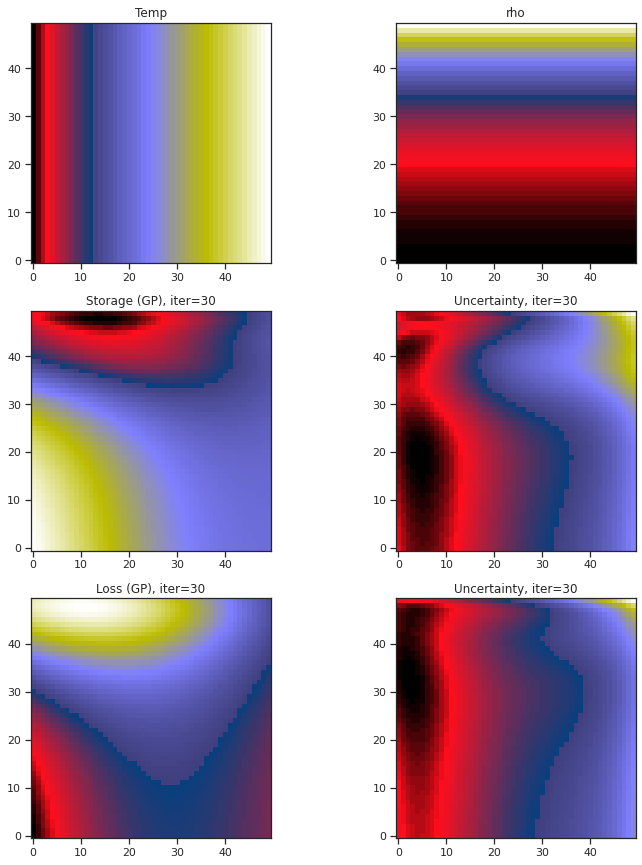

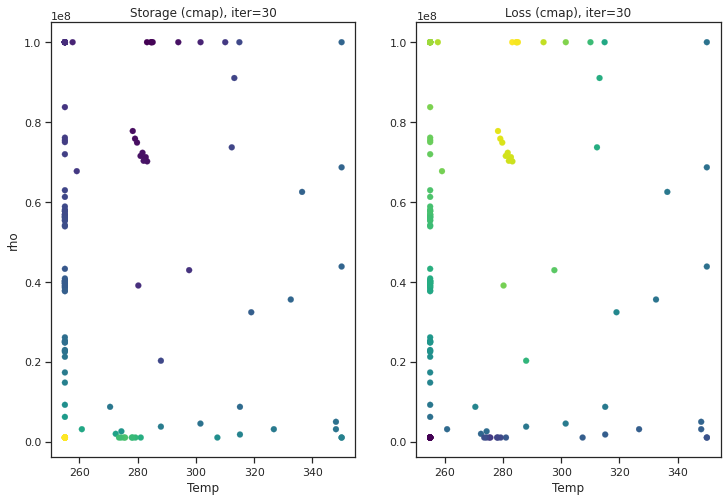

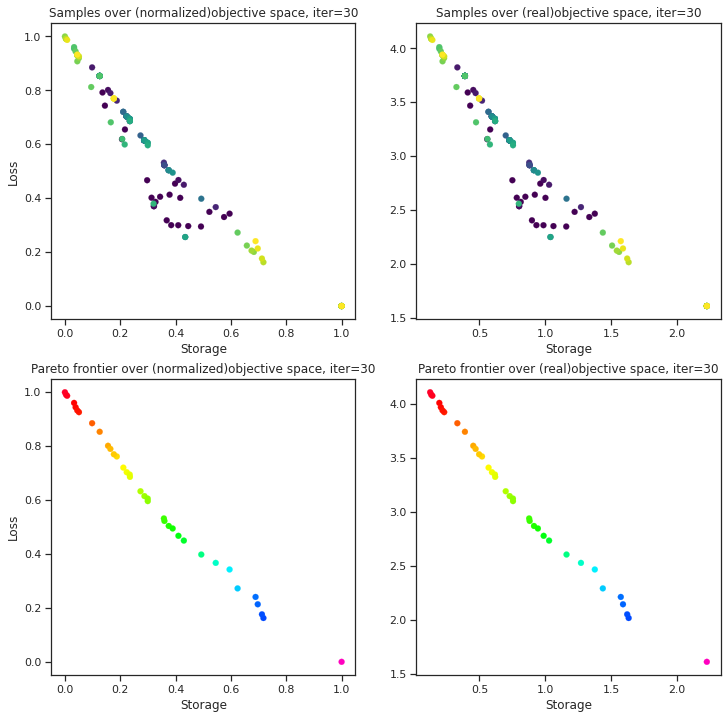

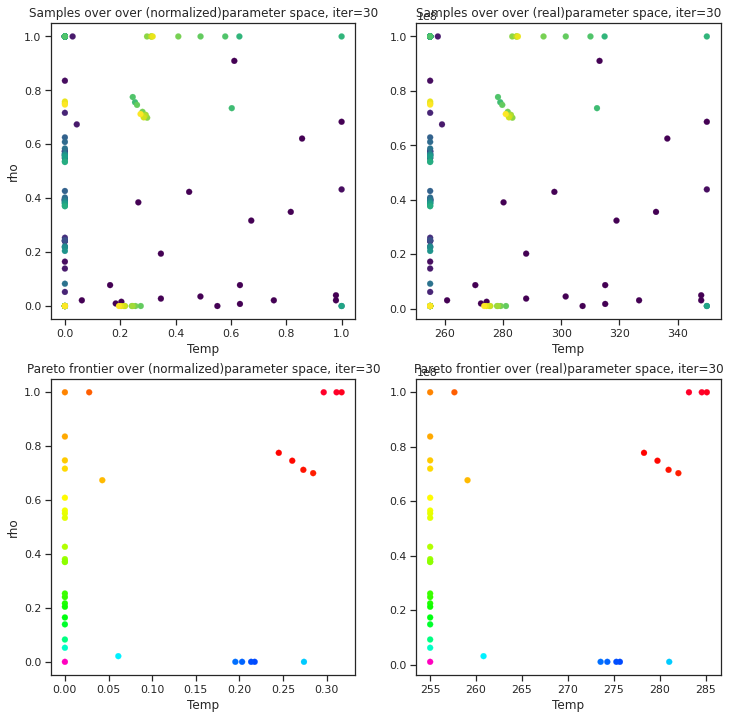

Batch Function eval #50
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Max. sampling reached, model stopped


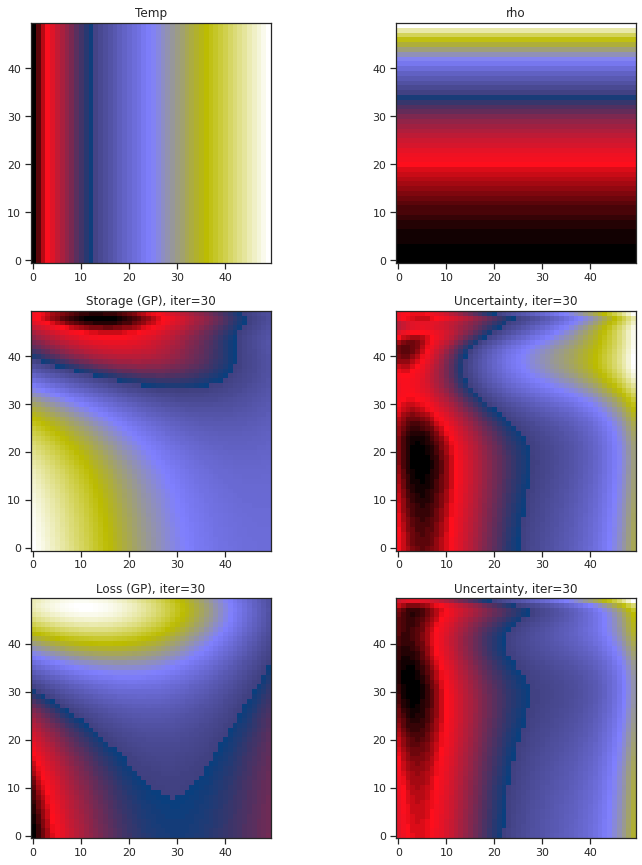

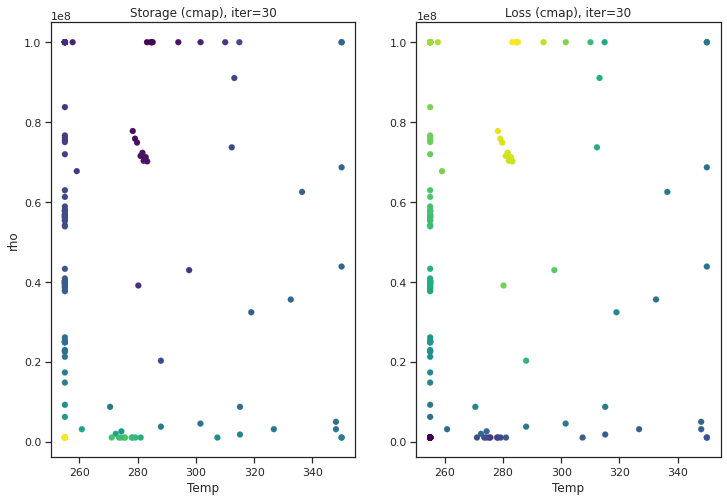

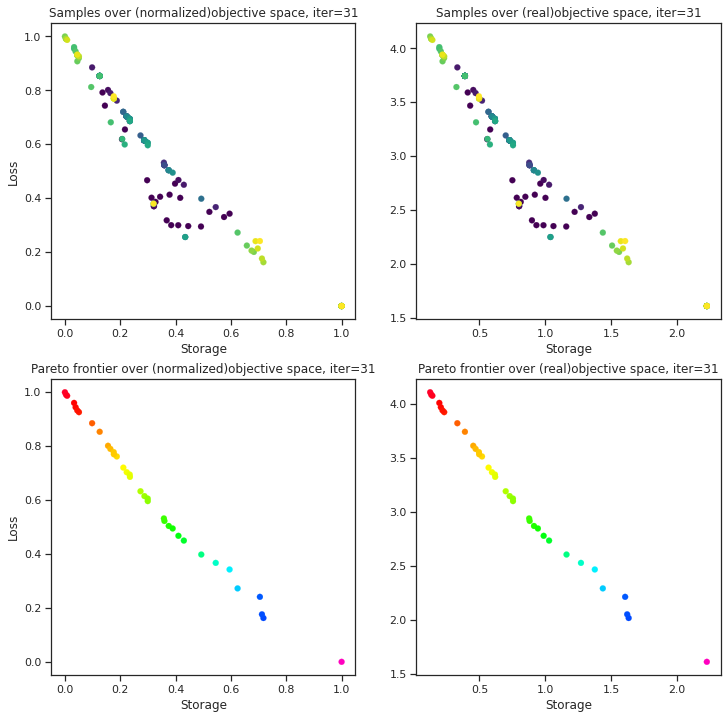

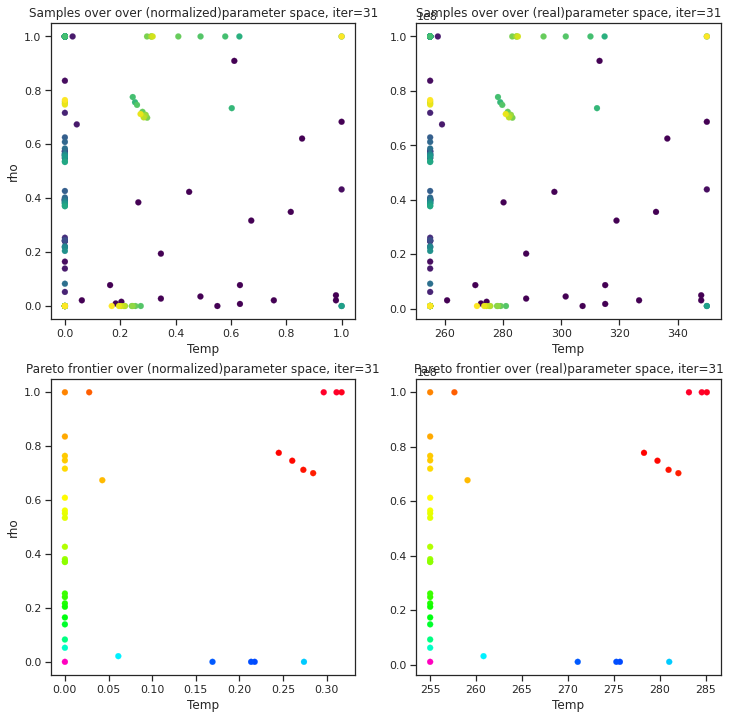

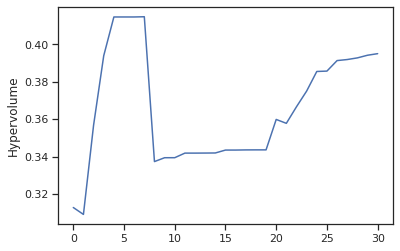

In [ ]:
tkwargs = {
    "dtype": to.double,
    "device": to.device("cuda" if to.cuda.is_available() else "cpu"),
}
BATCH_SIZE = 4 #For each iteration in BO, how many future samples we select in batch


time_vec = np.linspace(0, 2, 500)
A = 3 #Fixed amplitude
E = A * np.sin(2 * np.pi * time_vec)

# List of options
# 'qEHVI'- Expected Hypervolume acquistion function
# 'qParEGO' -qParEGO
acquisition = 'qEHVI'
# Input choice of problem- where it is minimization or maximization for objective 1 and 2 respectively
# List of options
# 'min'- Minimization
# 'max' -Maximization (default setting)
problem =['max','max']

#List of control params- Temp, rho, h, deltaG
# Choose any two control params to create the parameter space considering above the same order-
param1 = 'Temp'
param2 = 'rho'
# Choose any two objectives to do MOO (MOBO)-
obj1 = 'Storage'
obj2 = 'Loss'


#Define parameter space based on above choice of params (2D only)
num_rows =50
max_hysplot_dim =10
toggle_num_dim =10
num = 20  # Starting samples
N= 30
#N = (0.5 * num_rows ** 2) - num  # Maximum evaluations
#N = int(N)
if (param1 == 'Temp') or (param2 == 'Temp'):
    #Creating domain space for T
    T = np.linspace(255, 350, num_rows)
    test_T = np.linspace(255, 350, num_rows) # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'Temp'):
        # Build X dataset
        X1 = T
        test_X1 = test_T
    if (param2 == 'Temp'):
        # Build X dataset
        X2 = T
        test_X2 = test_T

else:
    ##Fixed params
    T=300

if (param1 == 'rho') or (param2 == 'rho'):
    # Creating domain space for rho
    n = np.linspace(6, 8, num_rows)
    rho = np.zeros(len(n))
    test_rho = np.zeros(len(n))
    for i in range(0, len(n)):
        rho[i] = 10 ** (n[i])
        test_rho[i] = 10 ** (n[i])  # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'rho'):
        # Build X dataset
        X1 = rho
        test_X1 = test_rho
    if (param2 == 'rho'):
        # Build X dataset
        X2 = rho
        test_X2 = test_rho

else:
    ##Fixed params
    rho=10

if (param1 == 'h') or (param2 == 'h'):
    #Creating domain space for h
    h = np.linspace(3, 60, num_rows)
    test_h = np.linspace(3, 60, num_rows)  # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'h'):
        # Build X dataset
        X1 = h
        test_X1 = test_h
    if (param2 == 'h'):
        # Build X dataset
        X2 = h
        test_X2 = test_h

else:
    ##Fixed params
    h=50

if (param1 == 'deltaG') or (param2 == 'deltaG'):
    #Creating domain space for deltaG
    deltaG = np.linspace(0.02, 2, num_rows)
    test_deltaG = np.linspace(0.02, 2, num_rows) # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'deltaG'):
        # Build X dataset
        X1 = deltaG
        test_X1 = test_deltaG
    if (param2 == 'deltaG'):
        # Build X dataset
        X2 = deltaG
        test_X2 = test_deltaG

else:
    deltaG=0.2

#Order of parameters to input after choosing for control and fixed parameters - T, rho, h, delta
# example- If we consider control params as T and h- we provide arguments as 
# MOBO(X1, X2, rho, deltaG, .....)
#Run MOBO -the first two arguments are the control parameters in the recommended order, the next two arguments are the remaining parameters as fixed in the recommended order
MOBO_PZO(X1, X2, h, deltaG, E, test_X1, test_X2, num_rows, N, BATCH_SIZE, param1, param2, obj1, obj2, acquisition, problem, max_hysplot_dim, toggle_num_dim)




<h1>Analysis 3e

Temp vs rho (partial O2 pressure)

50x50 grid space, Max func evaluation- 30 (max iter)x 4(batch_size) + 20(starting samples)

$Temp = [255, 410]; rho =[10^2, 10^8]; h=50nm; \Delta_G =0.2$

FE phase

**Maximize Energy Storage and Loss** - Adaptive sampling to balance between high storage and loss and find the pareto frontier.

acquistion function - **qParEGO**

Function evaluaton for initial randomly selected samples
Function eval #1
Function eval #2
Function eval #3
Function eval #4
Function eval #5
Function eval #6
Function eval #7
Function eval #8
Function eval #9
Function eval #10
Function eval #11
Function eval #12
Function eval #13
Function eval #14
Function eval #15
Function eval #16
Function eval #17
Function eval #18
Function eval #19
Function eval #20
Initial evaluation complete. Start BO- acq func: qParEGO


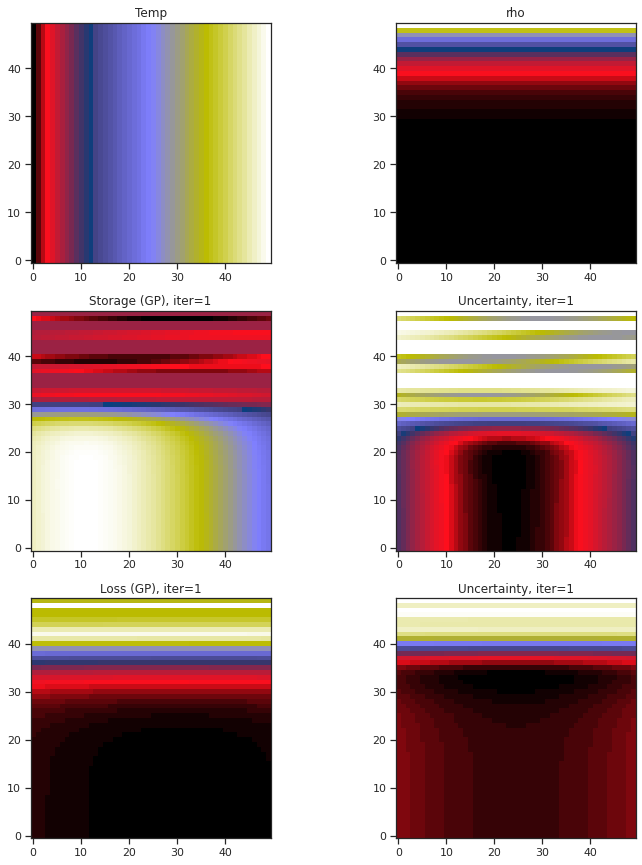

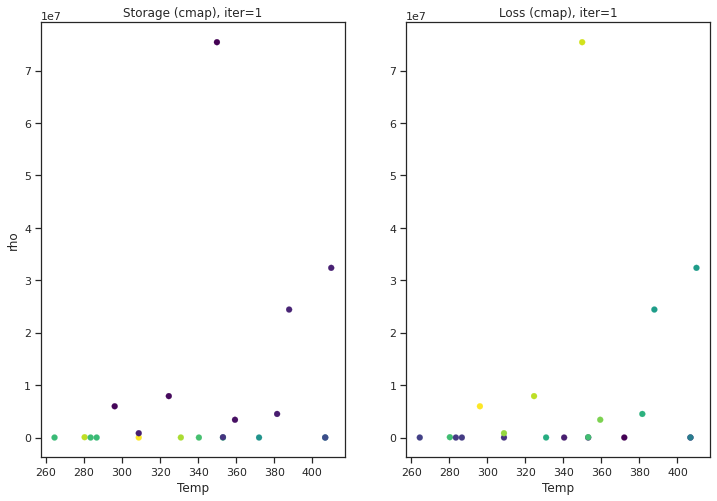

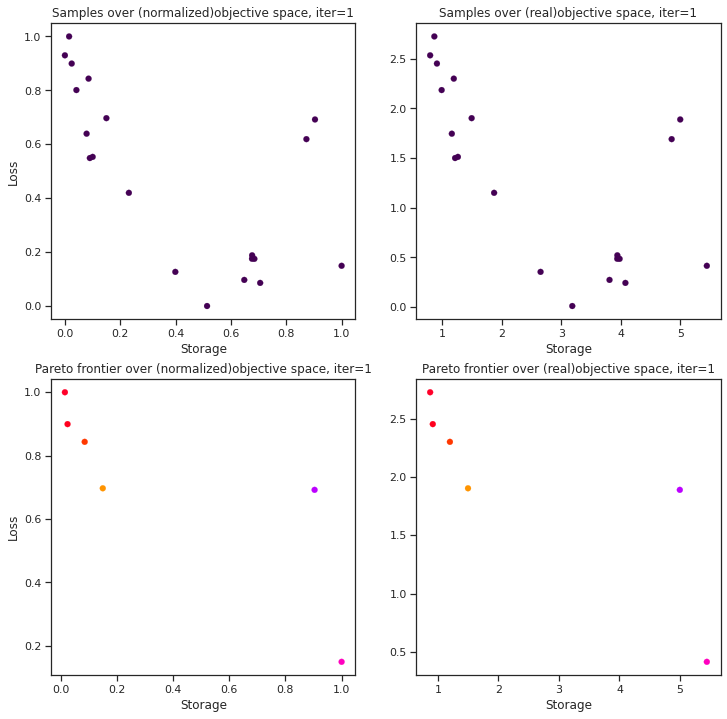

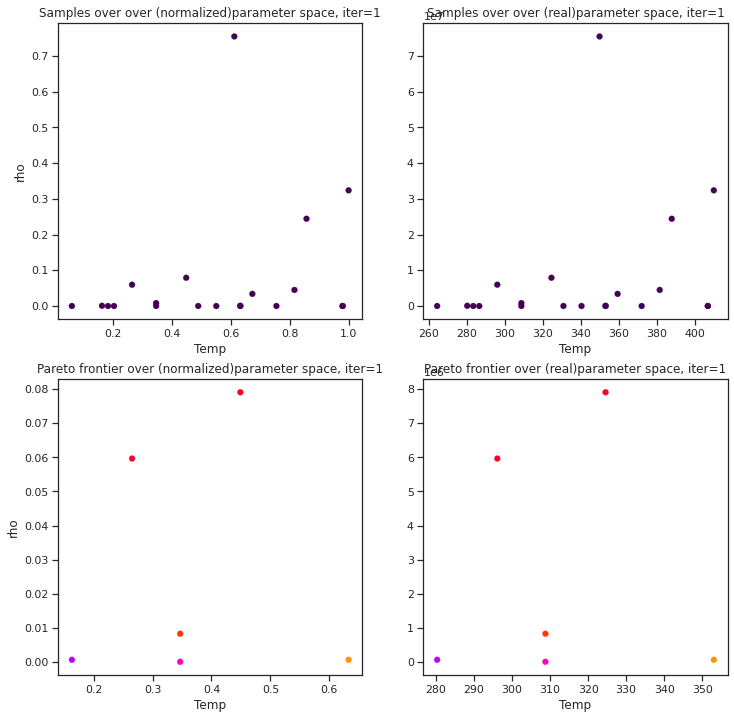

Batch Function eval #21
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #22
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #23
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #24
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #25
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #26
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval:

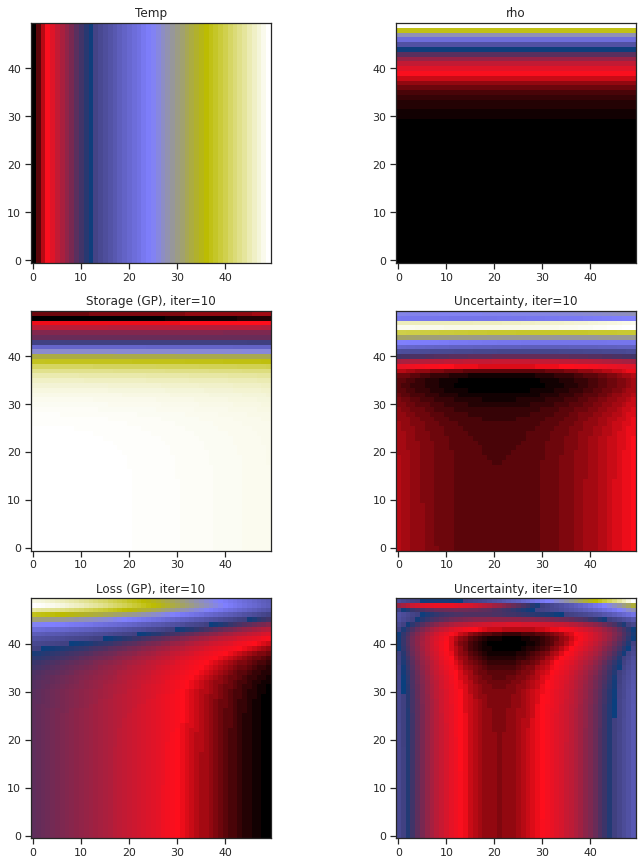

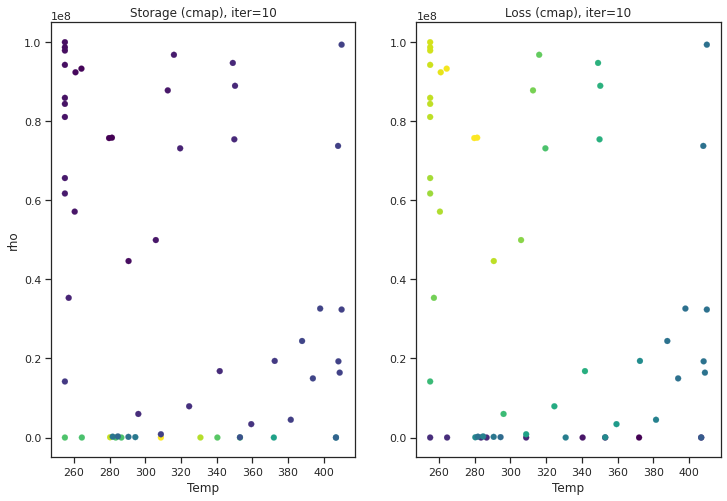

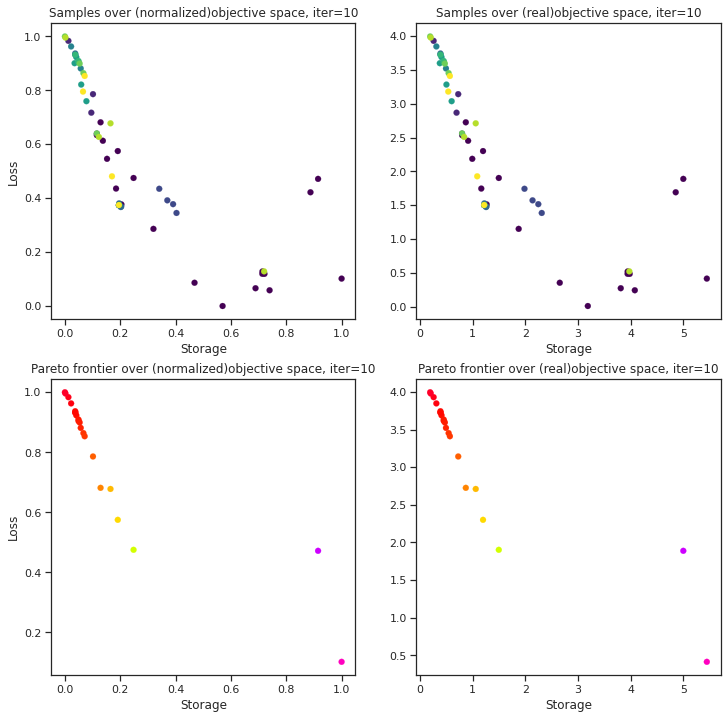

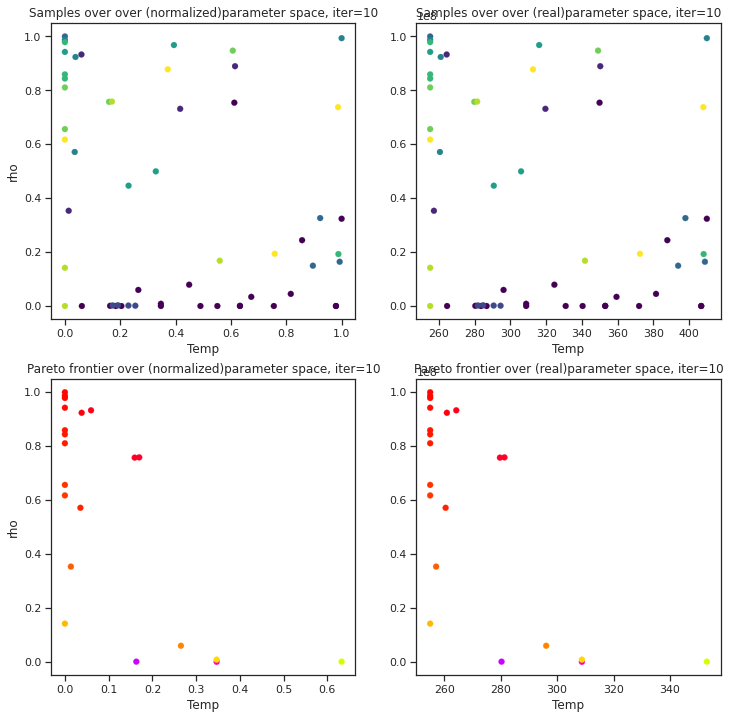

Batch Function eval #30
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #31
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #32
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #33
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #34
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #35
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #36
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval:

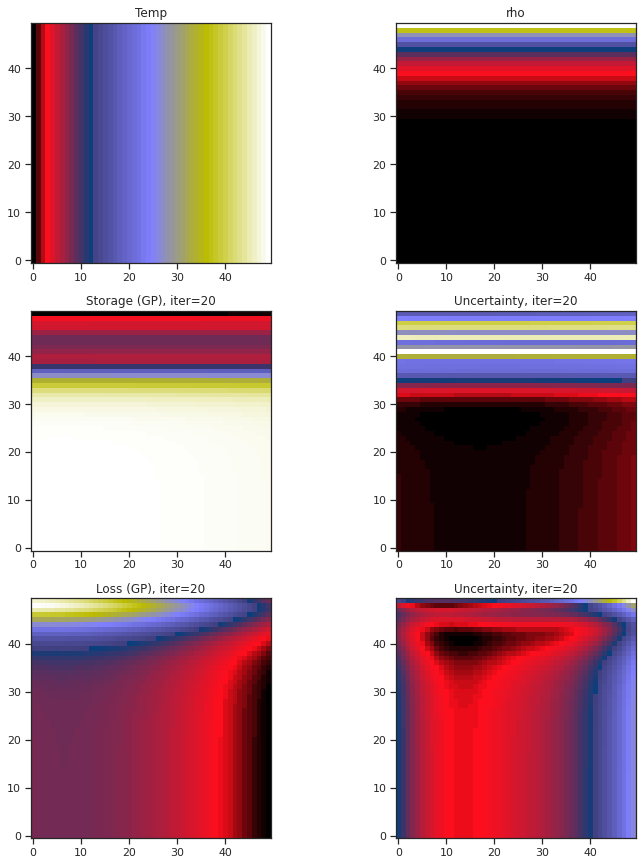

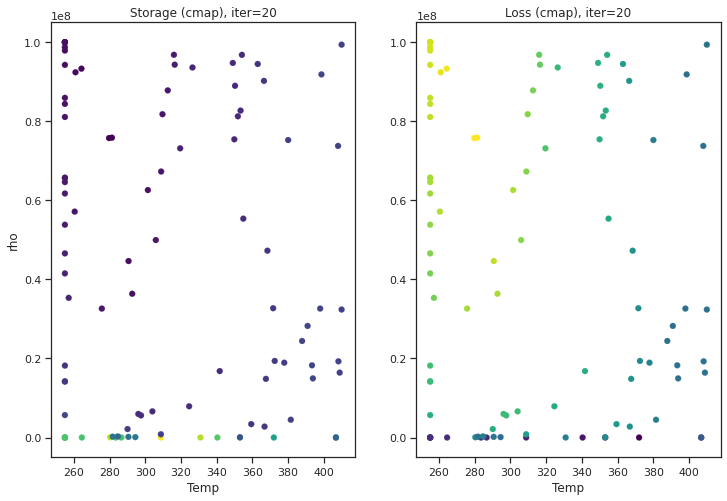

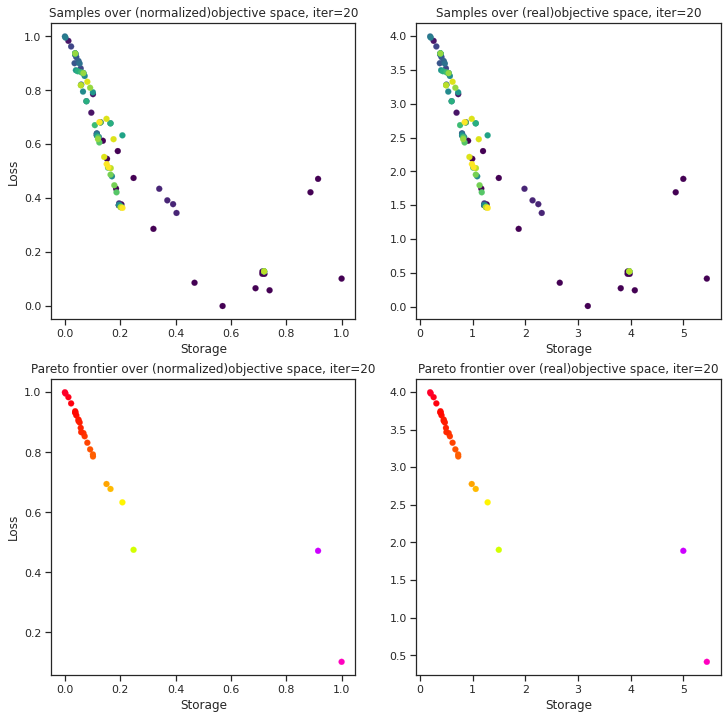

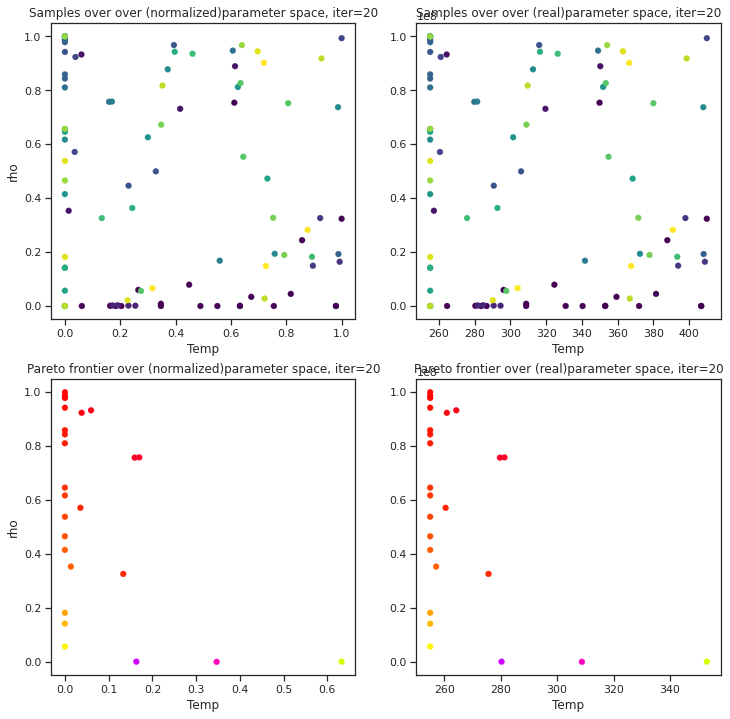

Batch Function eval #40
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #41
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #42
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #43
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #44
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #45
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval:

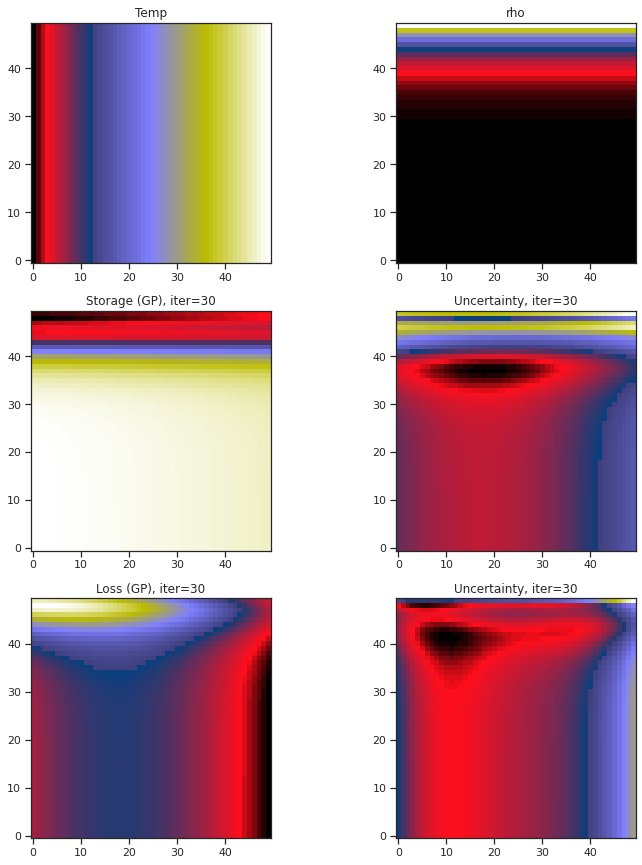

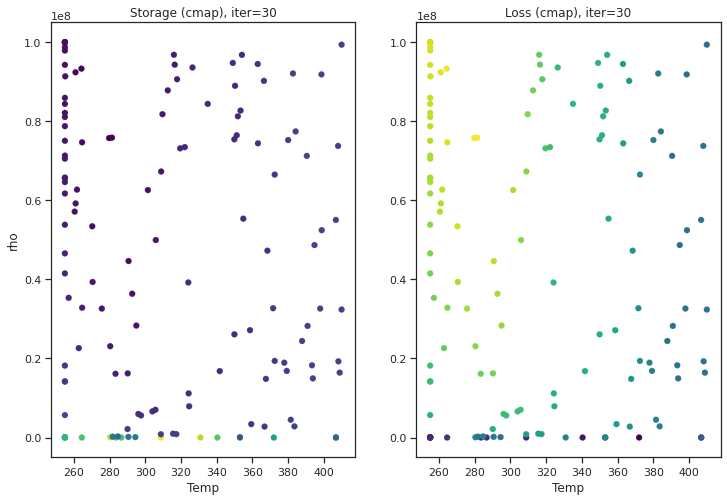

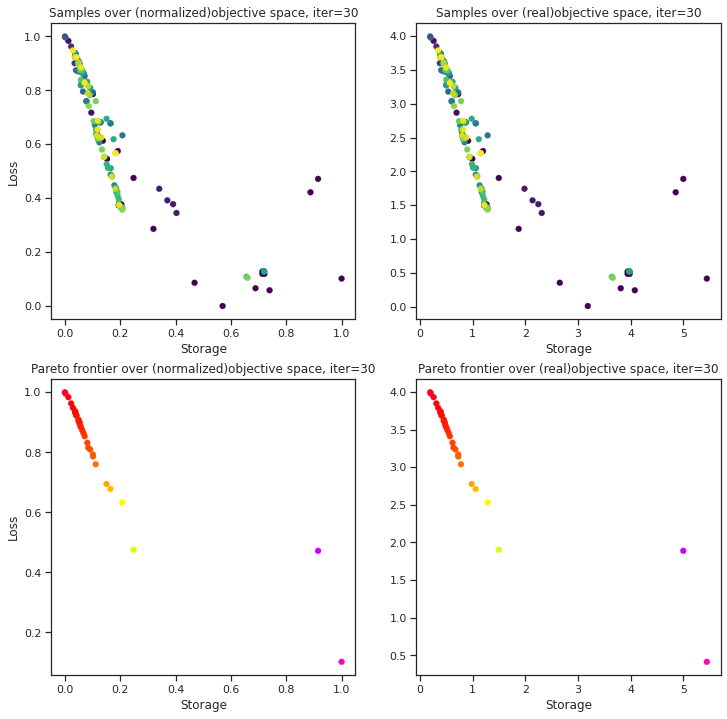

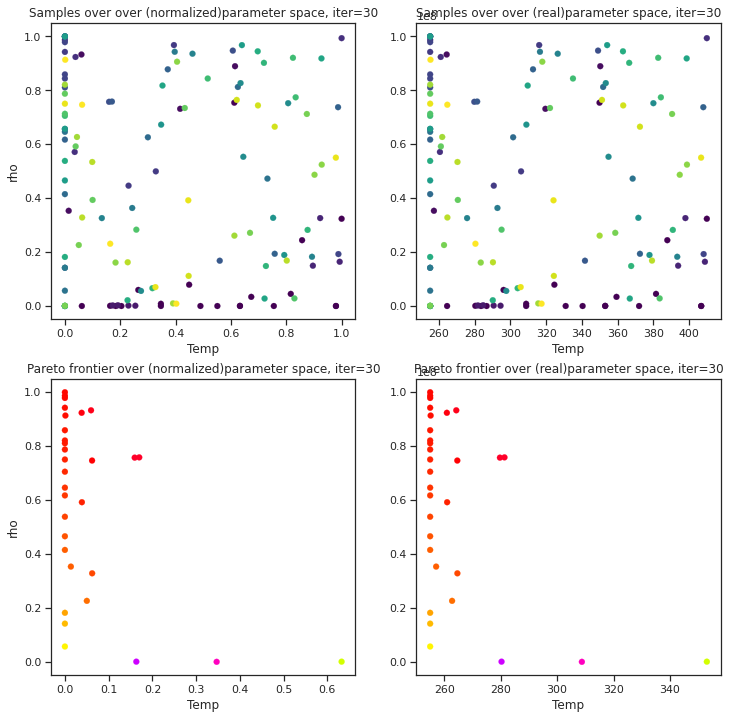

Batch Function eval #50
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Max. sampling reached, model stopped


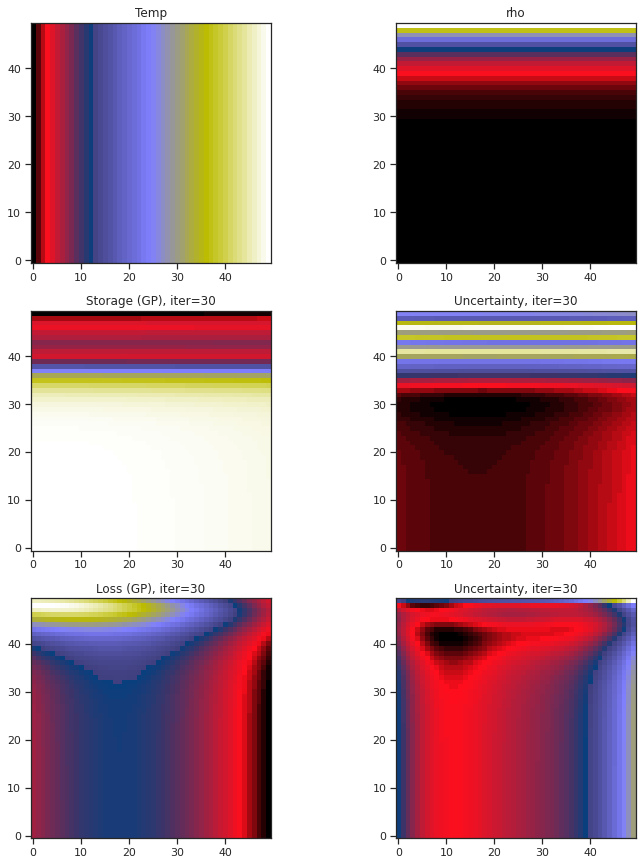

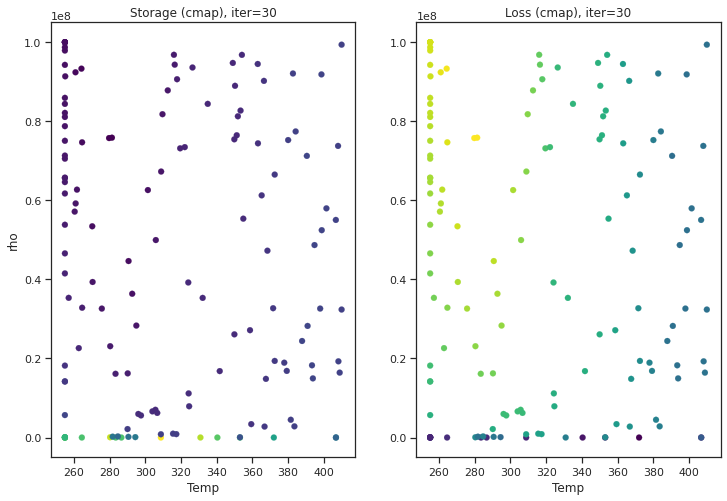

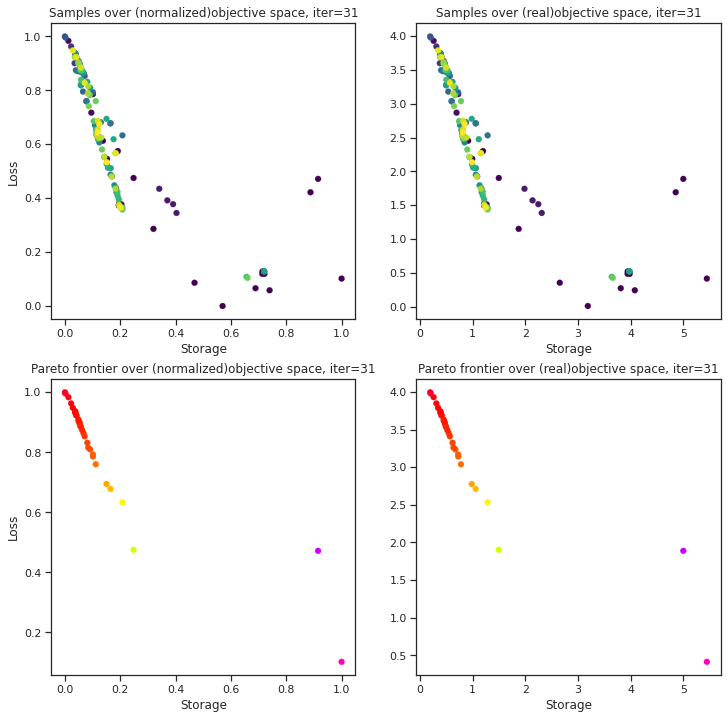

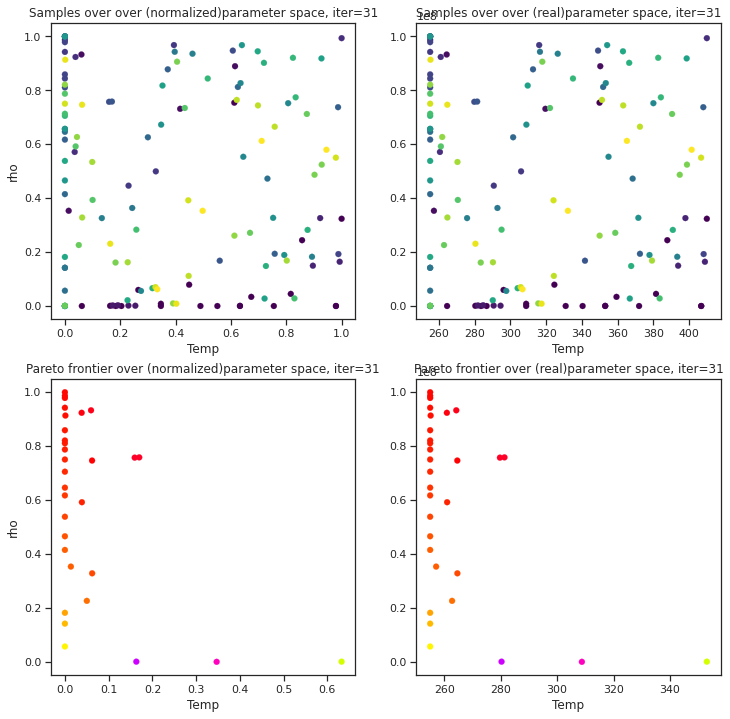

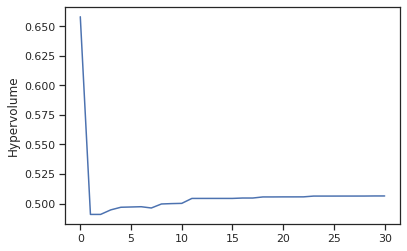

In [ ]:
tkwargs = {
    "dtype": to.double,
    "device": to.device("cuda" if to.cuda.is_available() else "cpu"),
}
BATCH_SIZE = 4 #For each iteration in BO, how many future samples we select in batch


time_vec = np.linspace(0, 2, 500)
A = 3 #Fixed amplitude
E = A * np.sin(2 * np.pi * time_vec)

# List of options
# 'qEHVI'- Expected Hypervolume acquistion function
# 'qParEGO' -qParEGO
acquisition = 'qParEGO'
# Input choice of problem- where it is minimization or maximization for objective 1 and 2 respectively
# List of options
# 'min'- Minimization
# 'max' -Maximization (default setting)
problem =['max','max']

#List of control params- Temp, rho, h, deltaG
# Choose any two control params to create the parameter space considering above the same order-
param1 = 'Temp'
param2 = 'rho'
# Choose any two objectives to do MOO (MOBO)-
obj1 = 'Storage'
obj2 = 'Loss'


#Define parameter space based on above choice of params (2D only)
num_rows =50
max_hysplot_dim =10
toggle_num_dim =10
num = 20  # Starting samples
N= 30
#N = (0.5 * num_rows ** 2) - num  # Maximum evaluations
#N = int(N)
if (param1 == 'Temp') or (param2 == 'Temp'):
    #Creating domain space for T
    T = np.linspace(255, 410, num_rows)
    test_T = np.linspace(255, 410, num_rows) # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'Temp'):
        # Build X dataset
        X1 = T
        test_X1 = test_T
    if (param2 == 'Temp'):
        # Build X dataset
        X2 = T
        test_X2 = test_T

else:
    ##Fixed params
    T=300

if (param1 == 'rho') or (param2 == 'rho'):
    # Creating domain space for rho
    n = np.linspace(2, 8, num_rows)
    rho = np.zeros(len(n))
    test_rho = np.zeros(len(n))
    for i in range(0, len(n)):
        rho[i] = 10 ** (n[i])
        test_rho[i] = 10 ** (n[i])  # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'rho'):
        # Build X dataset
        X1 = rho
        test_X1 = test_rho
    if (param2 == 'rho'):
        # Build X dataset
        X2 = rho
        test_X2 = test_rho

else:
    ##Fixed params
    rho=10

if (param1 == 'h') or (param2 == 'h'):
    #Creating domain space for h
    h = np.linspace(3, 60, num_rows)
    test_h = np.linspace(3, 60, num_rows)  # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'h'):
        # Build X dataset
        X1 = h
        test_X1 = test_h
    if (param2 == 'h'):
        # Build X dataset
        X2 = h
        test_X2 = test_h

else:
    ##Fixed params
    h=50

if (param1 == 'deltaG') or (param2 == 'deltaG'):
    #Creating domain space for deltaG
    deltaG = np.linspace(0.02, 2, num_rows)
    test_deltaG = np.linspace(0.02, 2, num_rows) # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'deltaG'):
        # Build X dataset
        X1 = deltaG
        test_X1 = test_deltaG
    if (param2 == 'deltaG'):
        # Build X dataset
        X2 = deltaG
        test_X2 = test_deltaG

else:
    deltaG=0.2

#Order of parameters to input after choosing for control and fixed parameters - T, rho, h, delta
# example- If we consider control params as T and h- we provide arguments as 
# MOBO(X1, X2, rho, deltaG, .....)
#Run MOBO -the first two arguments are the control parameters in the recommended order, the next two arguments are the remaining parameters as fixed in the recommended order
MOBO_PZO(X1, X2, h, deltaG, E, test_X1, test_X2, num_rows, N, BATCH_SIZE, param1, param2, obj1, obj2, acquisition, problem, max_hysplot_dim, toggle_num_dim)




<h1>Analysis 3f

Temp vs deltaG (ion formation energy)

50x50 grid space, Max func evaluation- 30 (max iter)x 4(batch_size) + 20(starting samples)

$Temp = [255, 410]; \Delta_G =[0.002, 0.3]; h=5nm; \rho =10^2$

**Maximize Energy Storage and Loss** - Adaptive sampling to balance between high storage and loss and find the pareto frontier.

acquistion function - **qEHVI**

Function evaluaton for initial randomly selected samples
Function eval #1
Function eval #2
Function eval #3
Function eval #4
Function eval #5
Function eval #6
Function eval #7
Function eval #8
Function eval #9
Function eval #10
Function eval #11
Function eval #12
Function eval #13
Function eval #14
Function eval #15
Function eval #16
Function eval #17
Function eval #18
Function eval #19
Function eval #20
Initial evaluation complete. Start BO- acq func: qEHVI


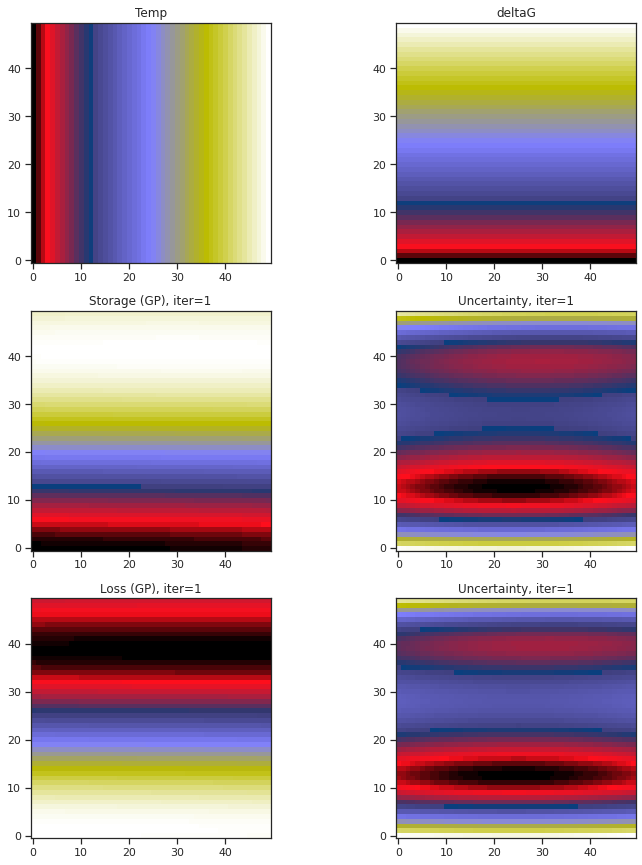

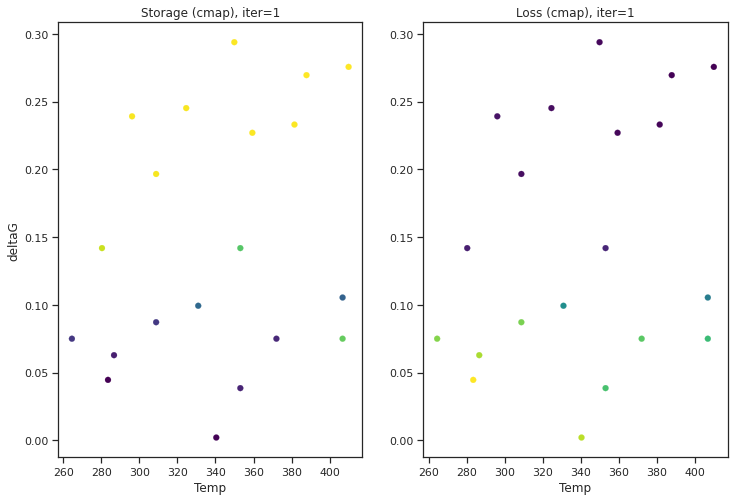

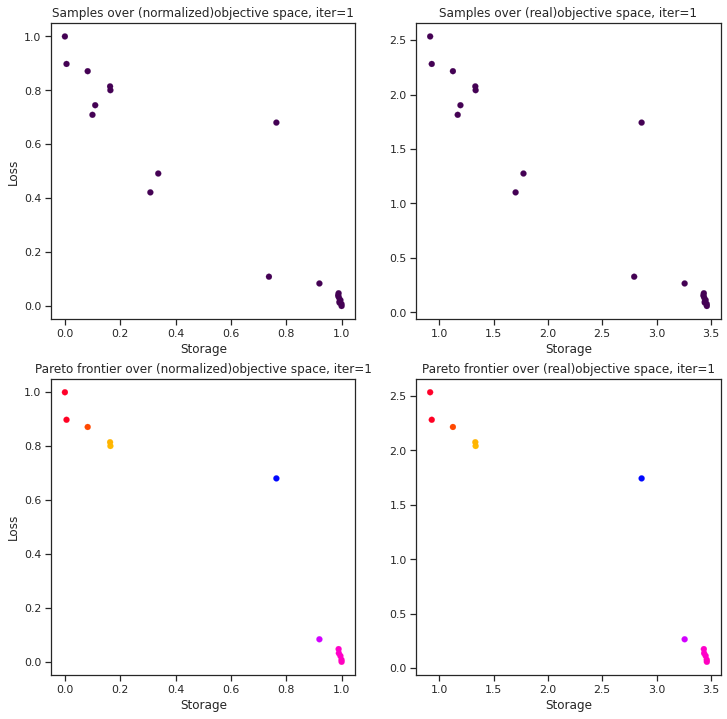

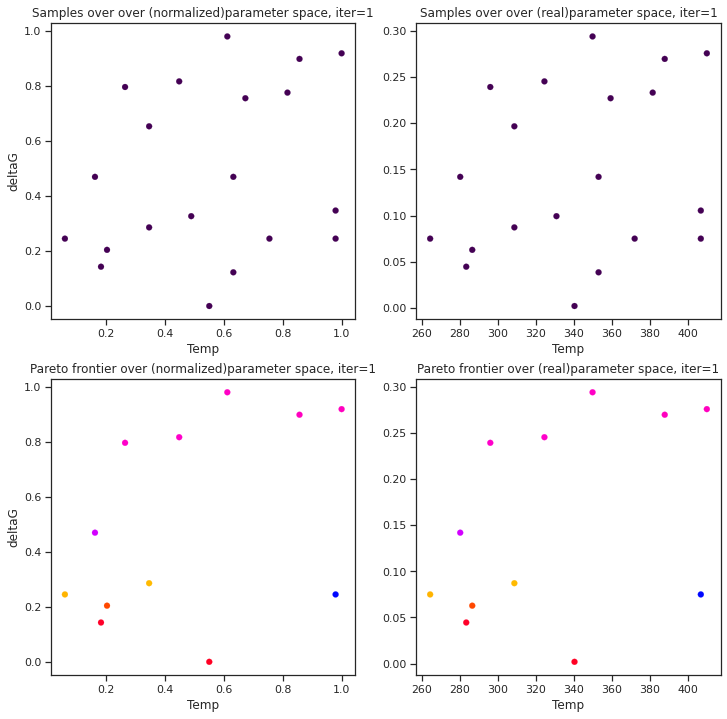

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #21
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #22
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #23
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #24
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #25
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #26
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #27
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #28
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #29
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


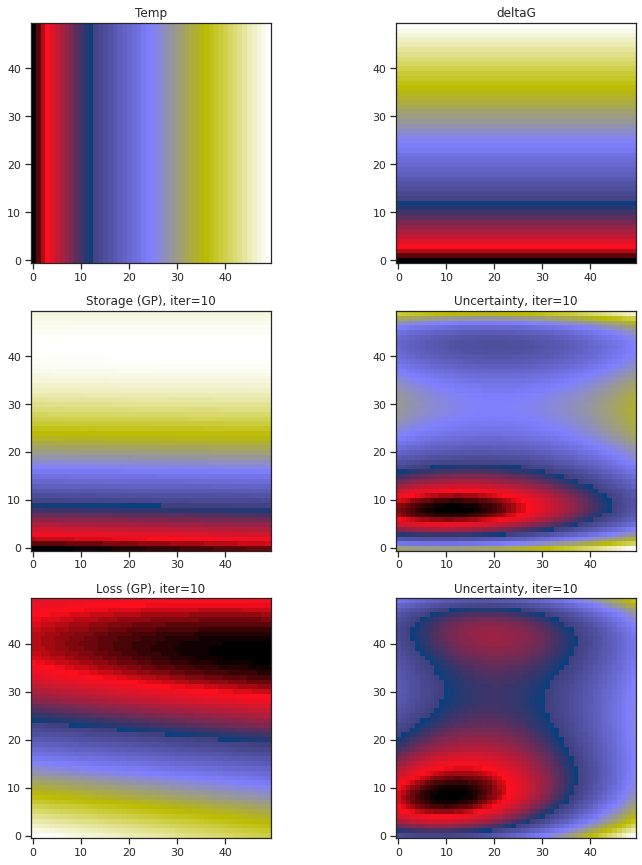

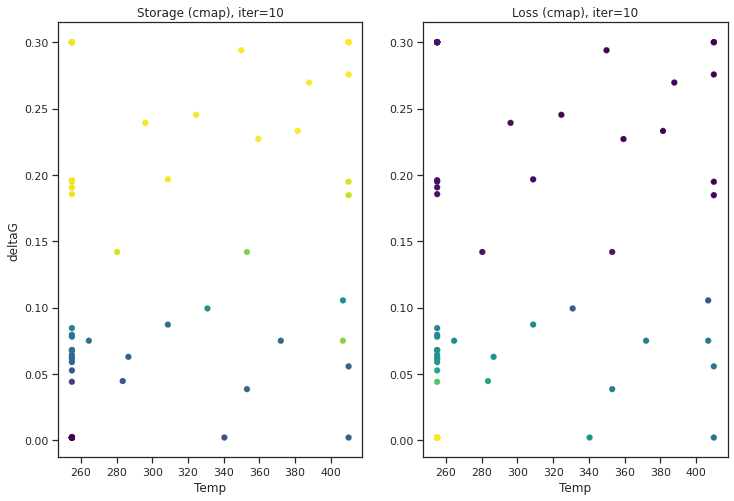

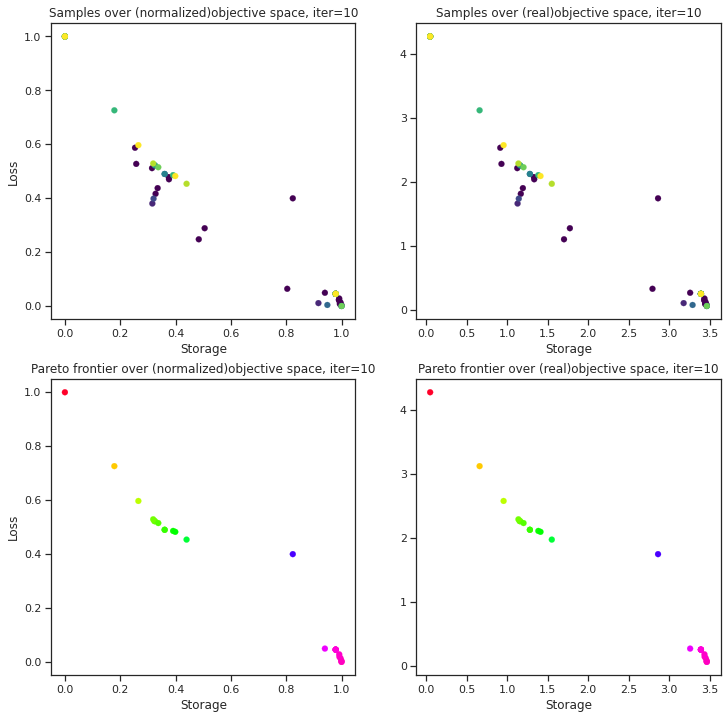

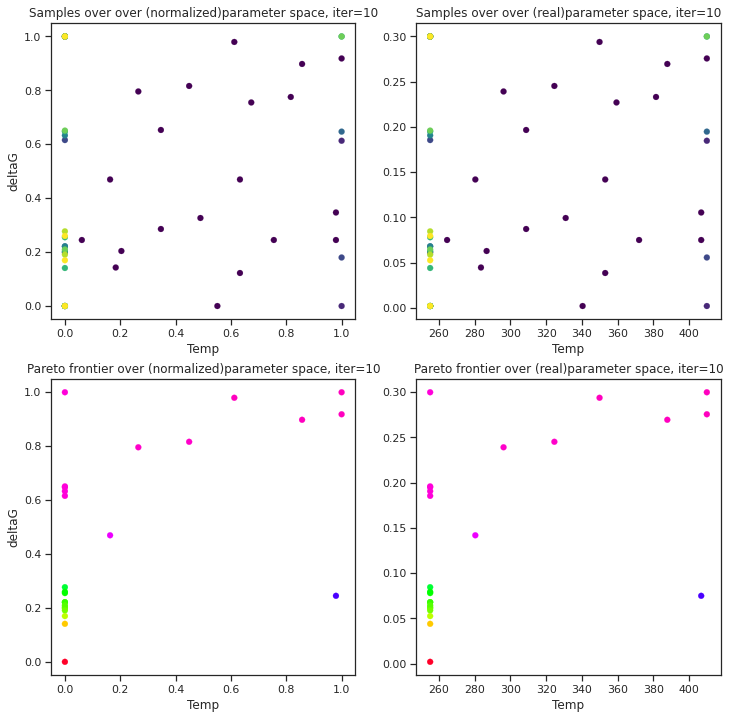

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #30
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #31
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #32
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #33
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #34
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #35
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #36
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval:

/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #37
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)
/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #38
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #39
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


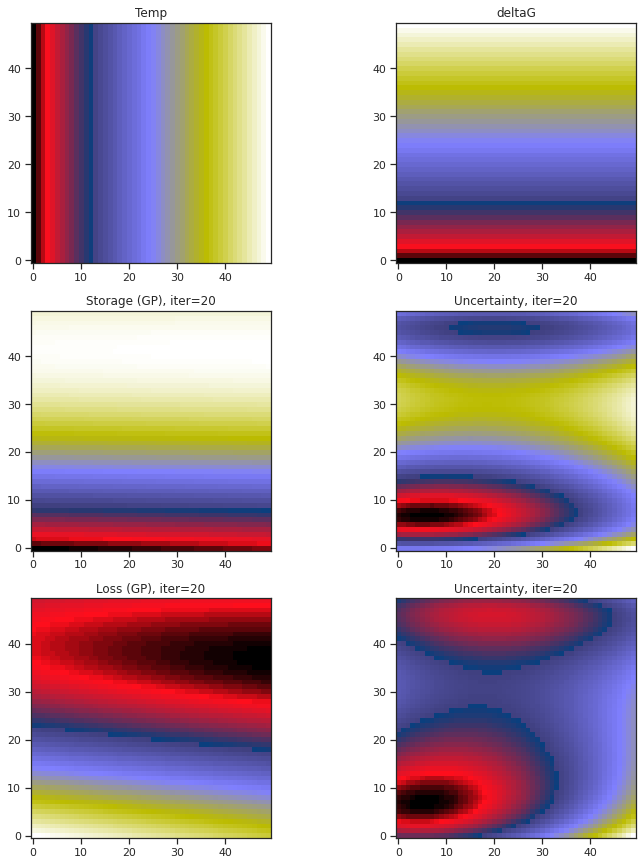

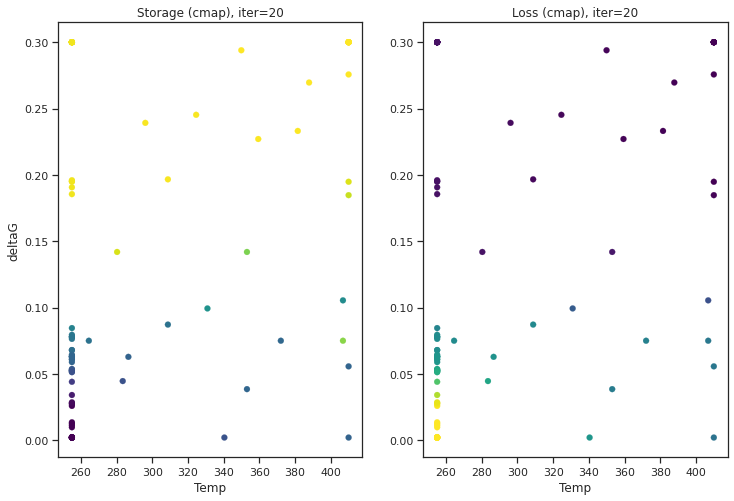

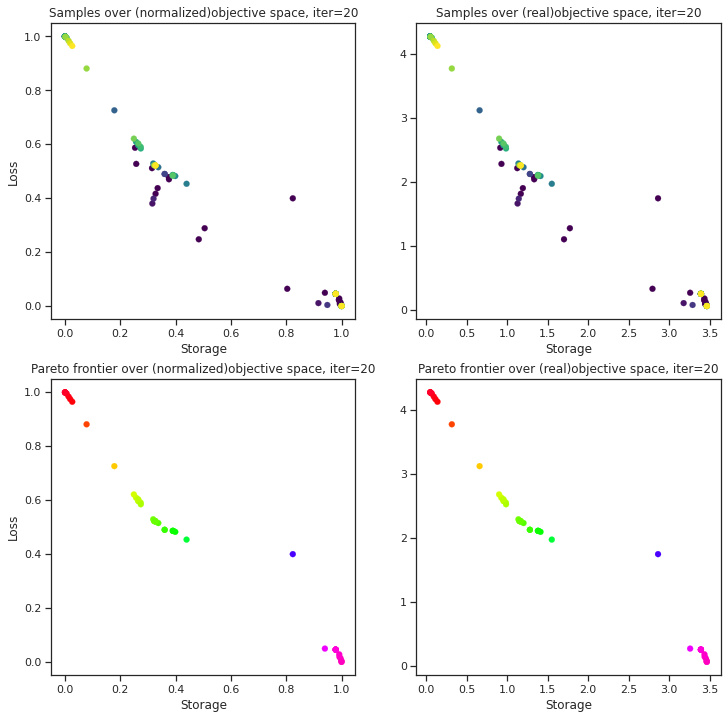

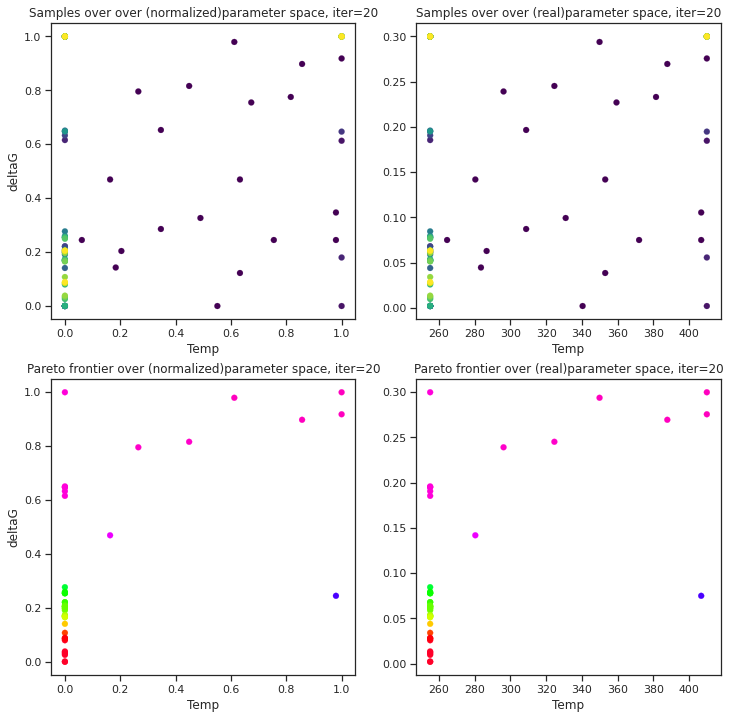

Batch Function eval #40
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #41
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #42
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #43
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #44
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #45
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #46
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #47
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Batch Function eval #48
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


/usr/local/lib/python3.7/dist-packages/gpytorch/utils/cholesky.py:44: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(f"A not p.d., added jitter of {jitter_new:.1e} to the diagonal", NumericalWarning)


Batch Function eval #49
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4


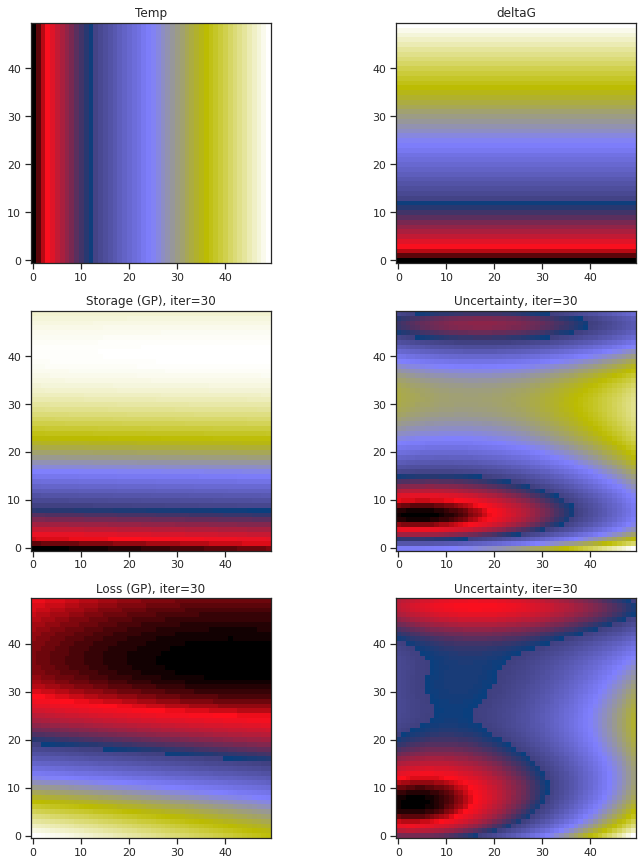

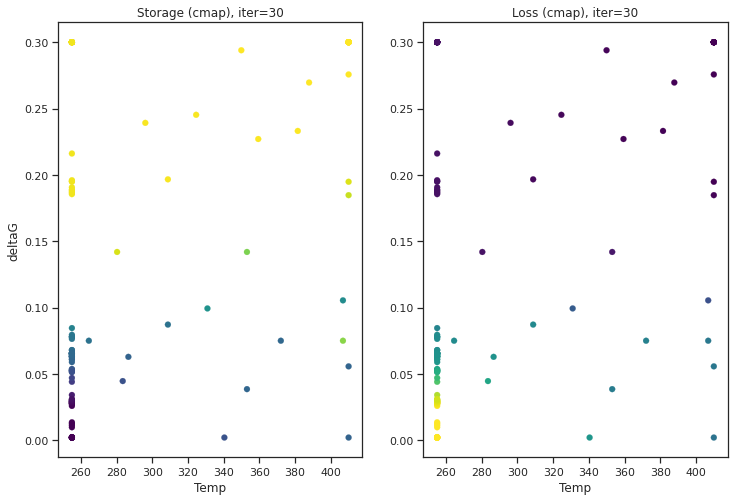

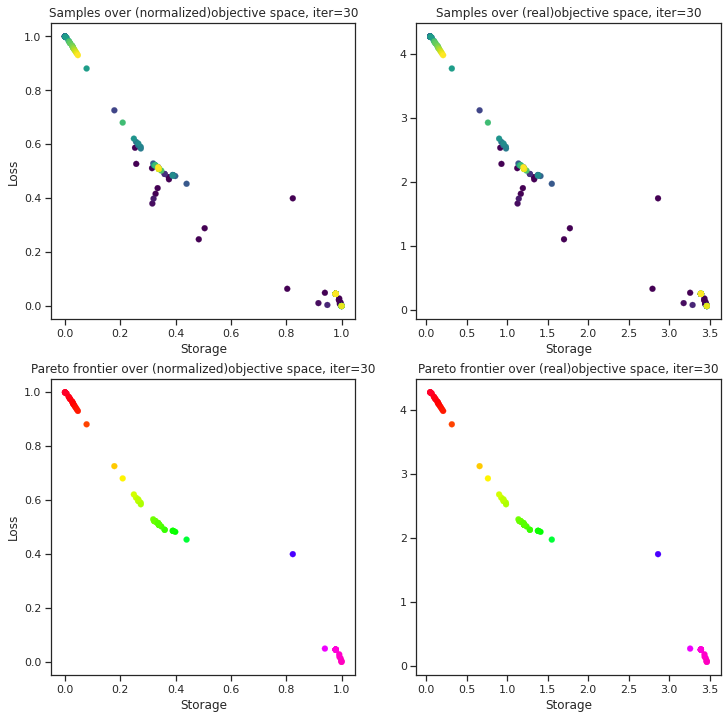

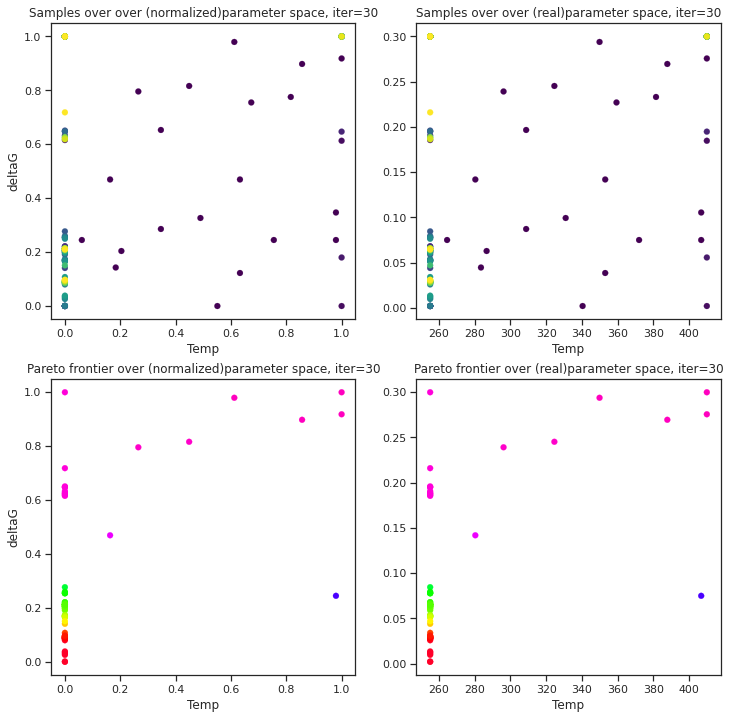

Batch Function eval #50
Within batch: Function eval: 1 of 4
Within batch: Function eval: 2 of 4
Within batch: Function eval: 3 of 4
Within batch: Function eval: 4 of 4
Max. sampling reached, model stopped


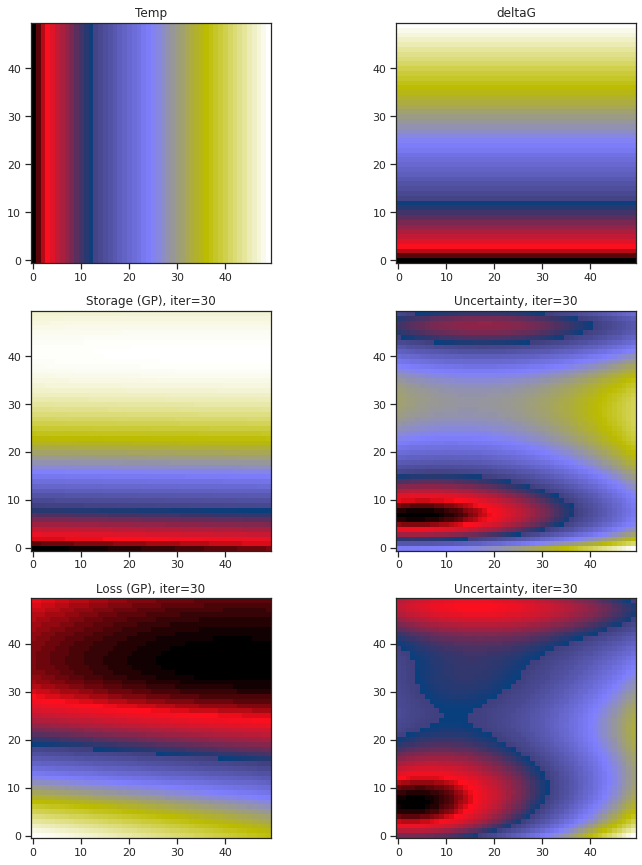

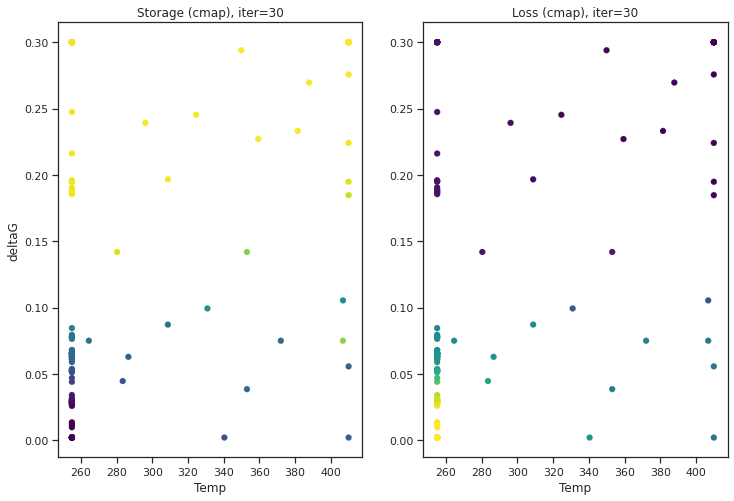

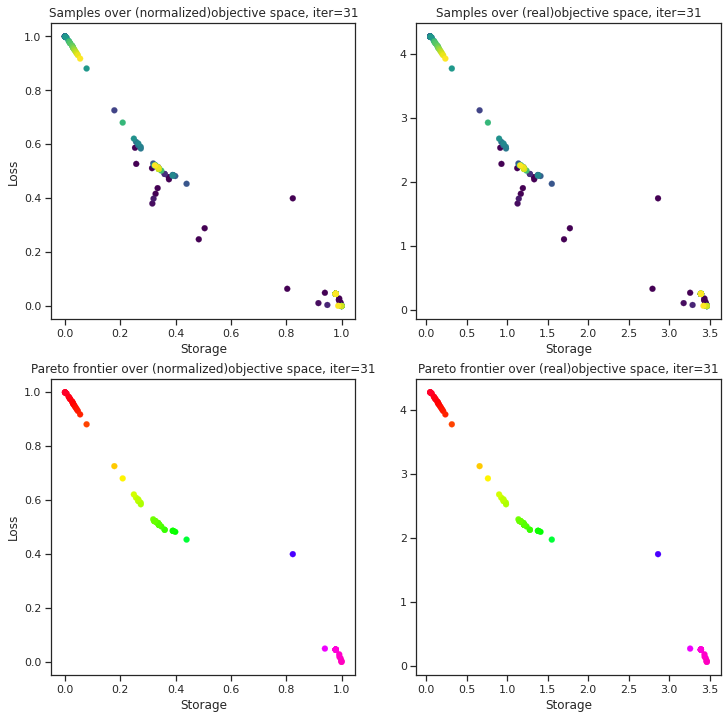

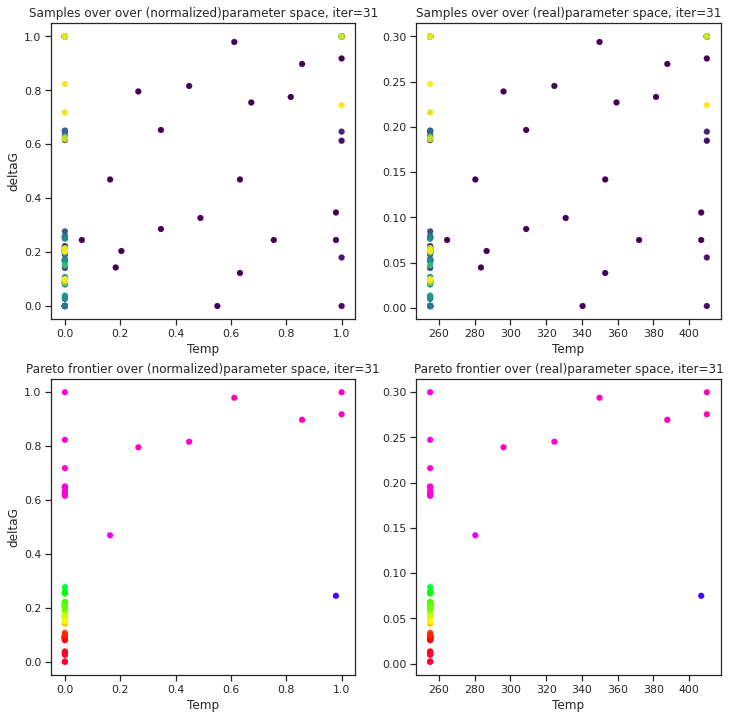

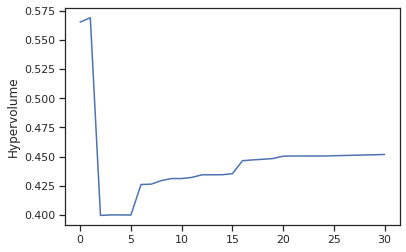

In [ ]:
tkwargs = {
    "dtype": to.double,
    "device": to.device("cuda" if to.cuda.is_available() else "cpu"),
}
BATCH_SIZE = 4 #For each iteration in BO, how many future samples we select in batch


time_vec = np.linspace(0, 2, 500)
A = 3 #Fixed amplitude
E = A * np.sin(2 * np.pi * time_vec)

# List of options
# 'qEHVI'- Expected Hypervolume acquistion function
# 'qParego' -qParEGO
acquisition = 'qEHVI'
# Input choice of problem- where it is minimization or maximization for objective 1 and 2 respectively
# List of options
# 'min'- Minimization
# 'max' -Maximization (default setting)
problem =['max','max']

#List of control params- Temp, rho, h, deltaG
# Choose any two control params to create the parameter space considering above the same order-
param1 = 'Temp'
param2 = 'deltaG'
# Choose any two objectives to do MOO (MOBO)-
obj1 = 'Storage'
obj2 = 'Loss'


#Define parameter space based on above choice of params (2D only)
num_rows =50
max_hysplot_dim =10
toggle_num_dim =10
num = 20  # Starting samples
N= 30
#N = (0.5 * num_rows ** 2) - num  # Maximum evaluations
#N = int(N)
if (param1 == 'Temp') or (param2 == 'Temp'):
    #Creating domain space for T
    T = np.linspace(255, 410, num_rows)
    test_T = np.linspace(255, 410, num_rows) # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'Temp'):
        # Build X dataset
        X1 = T
        test_X1 = test_T
    if (param2 == 'Temp'):
        # Build X dataset
        X2 = T
        test_X2 = test_T

else:
    ##Fixed params
    T=300

if (param1 == 'rho') or (param2 == 'rho'):
    # Creating domain space for rho
    n = np.linspace(0, 4, num_rows)
    rho = np.zeros(len(n))
    test_rho = np.zeros(len(n))
    for i in range(0, len(n)):
        rho[i] = 10 ** (n[i])
        test_rho[i] = 10 ** (n[i])  # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'rho'):
        # Build X dataset
        X1 = rho
        test_X1 = test_rho
    if (param2 == 'rho'):
        # Build X dataset
        X2 = rho
        test_X2 = test_rho

else:
    ##Fixed params
    rho=10**2

if (param1 == 'h') or (param2 == 'h'):
    #Creating domain space for h
    h = np.linspace(3, 60, num_rows)
    test_h = np.linspace(3, 60, num_rows)  # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'h'):
        # Build X dataset
        X1 = h
        test_X1 = test_h
    if (param2 == 'h'):
        # Build X dataset
        X2 = h
        test_X2 = test_h

else:
    ##Fixed params
    h=5

if (param1 == 'deltaG') or (param2 == 'deltaG'):
    #Creating domain space for deltaG
    deltaG = np.linspace(0.002, 0.3, num_rows)
    test_deltaG = np.linspace(0.002, 0.3, num_rows) # We avoid repeating analysis at same location-- we will mask the location which is once sampled suring the iteration phase
    if (param1 == 'deltaG'):
        # Build X dataset
        X1 = deltaG
        test_X1 = test_deltaG
    if (param2 == 'deltaG'):
        # Build X dataset
        X2 = deltaG
        test_X2 = test_deltaG

else:
    deltaG=0.2

#Order of parameters to input after choosing for control and fixed parameters - T, rho, h, delta
# example- If we consider control params as T and h- we provide arguments as 
# MOBO(X1, X2, rho, deltaG, .....)
#Run MOBO -the first two arguments are the control parameters in the recommended order, the next two arguments are the remaining parameters as fixed in the recommended order
MOBO_PZO(X1, X2, rho, h, E, test_X1, test_X2, num_rows, N, BATCH_SIZE, param1, param2, obj1, obj2, acquisition, problem, max_hysplot_dim, toggle_num_dim)

